In [1]:
import numpy as np
import matplotlib.pyplot as pl
import json
from sklearn.utils import class_weight
import tensorflow as tf
from tensorflow.keras import Sequential, activations, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    BatchNormalization, Activation, SpatialDropout2D, GlobalAveragePooling2D,
    Dense, Dropout, Flatten,
    Conv2D, MaxPooling2D, SeparableConv2D
)
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

# Import project utils scripts
import os
import sys

src_path = os.path.abspath(os.path.join('../src/'))

if src_path not in sys.path:
    sys.path.append(src_path)

from statisticsUtils import (
    recall_precision_fscore_from_confusion_matrix
)

from labelsUtils import (
    Label,
)

from regionUtils import (
    vietnam_labels_coordinates,
)

from rasterUtils import (
    make_dataset_from_raster_files,
)

from convNetUtils import (
    cross_validation,
    plot_confusion_matrix,
    separate_data_into_images_and_labels,
    evaluate_model,
    add_ndvi_to_dataset,
    add_mndwi_to_dataset,
    add_evi2_to_dataset,
    add_bu_to_dataset,
)

/home/simon/miniconda3/envs/earthEngine/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
from enum import Enum

class Band(Enum):
    COASTAL_AEROSOL = 0
    BLUE = 1
    GREEN = 2
    RED = 3
    NIR = 4
    SWIR1 = 5
    SWIR2 = 6
    TIRS1 = 7
    TIRS2 = 8
    NDVI = 9
    MNDWI = 10
    EVI2 = 11
    BU = 12

In [3]:
NB_TESTS = 4
EPOCHS = 2000
DATA_ROOT_PATH ='../data/'
LABELS_COORDINATES = vietnam_labels_coordinates()

In [4]:
labels = [
    Label.COFFEE,
    Label.NATIVEVEGE,
    Label.URBAN,
    Label.WATER,
    Label.PEPPER,
    Label.TEA,
]

In [5]:
NB_PIXEL_AROUND=4

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_february/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)
add_ndvi_to_dataset(dataset)
add_mndwi_to_dataset(dataset)
add_evi2_to_dataset(dataset)
add_bu_to_dataset(dataset)

This notebook uses :

```
AUGMENTATIONS = Compose([
    HorizontalFlip(p=0.5),
    VerticalFlip(p=0.5),
    ShiftScaleRotate(
        shift_limit=0.0625,
        scale_limit=0,
        rotate_limit=0,
        p=0.8
    ),
    RandomRotate90(p=0.5),
])
```

# NIR, RED, SWIR1

In [6]:
bands = [
    Band.NIR.value,
    Band.RED.value,
    Band.SWIR1.value
]

model_name = "nir_red_swir1"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 3)           0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 3)           12        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 32)          896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 3, 64)          3

Epoch 41/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6446 - accuracy: 0.6858 - val_loss: 0.9563 - val_accuracy: 0.6393
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6599 - accuracy: 0.6869 - val_loss: 0.8455 - val_accuracy: 0.6703
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6563 - accuracy: 0.7005 - val_loss: 0.8315 - val_accuracy: 0.6768
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6487 - accuracy: 0.6820 - val_loss: 0.9841 - val_accuracy: 0.6223
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6453 - accuracy: 0.6896 - val_loss: 0.8162 - val_accuracy: 0.6887
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6162 - accuracy: 0.7086 - val_loss: 0.9240 - val_accuracy: 0.6365
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6193 - accuracy: 0.6875 - val_loss: 0.8225 - val_accuracy: 0.6832

57/57 [==============================] - 0s 7ms/step - loss: 0.3347 - accuracy: 0.8123 - val_loss: 0.8952 - val_accuracy: 0.7166
Epoch 156/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3496 - accuracy: 0.7998 - val_loss: 0.8688 - val_accuracy: 0.7078
Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3383 - accuracy: 0.8112 - val_loss: 0.8244 - val_accuracy: 0.7372
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3145 - accuracy: 0.8258 - val_loss: 0.8906 - val_accuracy: 0.7112
Epoch 159/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3317 - accuracy: 0.8128 - val_loss: 0.8675 - val_accuracy: 0.7400
Epoch 160/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3421 - accuracy: 0.7998 - val_loss: 0.8831 - val_accuracy: 0.7097
Epoch 161/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2972 - accuracy: 0.8253 - val_loss: 0.8680 - val_accuracy: 0.7310
Epoch 1

Epoch 212/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2891 - accuracy: 0.8367 - val_loss: 0.8424 - val_accuracy: 0.7375
Epoch 213/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2728 - accuracy: 0.8340 - val_loss: 0.9096 - val_accuracy: 0.7203
Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2559 - accuracy: 0.8399 - val_loss: 0.8816 - val_accuracy: 0.7245
Epoch 215/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2729 - accuracy: 0.8481 - val_loss: 0.8999 - val_accuracy: 0.7210
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3186 - accuracy: 0.8291 - val_loss: 0.8347 - val_accuracy: 0.7451
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2885 - accuracy: 0.8323 - val_loss: 0.9013 - val_accuracy: 0.7309
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3588 - accuracy: 0.8123 - val_loss: 0.9779 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2488 - accuracy: 0.8492 - val_loss: 0.9735 - val_accuracy: 0.7462
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3382 - accuracy: 0.8199 - val_loss: 0.9773 - val_accuracy: 0.6900
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2726 - accuracy: 0.8470 - val_loss: 0.9545 - val_accuracy: 0.7390
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2730 - accuracy: 0.8443 - val_loss: 0.9643 - val_accuracy: 0.7226
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2184 - accuracy: 0.8671 - val_loss: 0.9802 - val_accuracy: 0.7258
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2530 - accuracy: 0.8665 - val_loss: 1.0894 - val_accuracy: 0.6922
Epoch 275/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2120 - accuracy: 0.8654 - val_loss: 0.9561 - val_accuracy:

Epoch 326/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2453 - accuracy: 0.8660 - val_loss: 0.9718 - val_accuracy: 0.7235
Epoch 327/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2257 - accuracy: 0.8779 - val_loss: 1.0161 - val_accuracy: 0.7242
Epoch 328/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2103 - accuracy: 0.8801 - val_loss: 0.9510 - val_accuracy: 0.7493
Epoch 329/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1918 - accuracy: 0.8942 - val_loss: 0.9894 - val_accuracy: 0.7345
Epoch 330/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2540 - accuracy: 0.8638 - val_loss: 0.9973 - val_accuracy: 0.7318
Epoch 331/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2191 - accuracy: 0.8687 - val_loss: 0.9582 - val_accuracy: 0.7413
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2179 - accuracy: 0.8850 - val_loss: 1.0429 - val_accuracy:

Epoch 50/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6770 - accuracy: 0.6596 - val_loss: 0.8505 - val_accuracy: 0.6754
Epoch 51/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6821 - accuracy: 0.6667 - val_loss: 0.8491 - val_accuracy: 0.6636
Epoch 52/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6277 - accuracy: 0.6982 - val_loss: 0.8135 - val_accuracy: 0.6945
Epoch 53/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6500 - accuracy: 0.6656 - val_loss: 0.7699 - val_accuracy: 0.7105
Epoch 54/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6507 - accuracy: 0.6846 - val_loss: 0.8534 - val_accuracy: 0.6763
Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6024 - accuracy: 0.6813 - val_loss: 0.8031 - val_accuracy: 0.7005
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6835 - accuracy: 0.6650 - val_loss: 0.8255 - val_accuracy: 0.6860

Epoch 164/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3277 - accuracy: 0.8252 - val_loss: 0.8595 - val_accuracy: 0.7279
Epoch 165/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3242 - accuracy: 0.8236 - val_loss: 0.8470 - val_accuracy: 0.7256
Epoch 166/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3721 - accuracy: 0.8024 - val_loss: 0.8992 - val_accuracy: 0.6974
Epoch 167/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3678 - accuracy: 0.8046 - val_loss: 0.8367 - val_accuracy: 0.7373
Epoch 168/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2984 - accuracy: 0.8274 - val_loss: 0.7970 - val_accuracy: 0.7361
Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3328 - accuracy: 0.8219 - val_loss: 0.7941 - val_accuracy: 0.7435
Epoch 170/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3060 - accuracy: 0.8219 - val_loss: 0.7783 - val_accuracy:

Epoch 221/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2797 - accuracy: 0.8366 - val_loss: 0.8704 - val_accuracy: 0.7403
Epoch 222/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2510 - accuracy: 0.8518 - val_loss: 0.8263 - val_accuracy: 0.7579
Epoch 223/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2761 - accuracy: 0.8431 - val_loss: 0.8478 - val_accuracy: 0.7534
Epoch 224/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3028 - accuracy: 0.8317 - val_loss: 0.8651 - val_accuracy: 0.7386
Epoch 225/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2913 - accuracy: 0.8360 - val_loss: 0.8927 - val_accuracy: 0.7390
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2925 - accuracy: 0.8284 - val_loss: 0.9235 - val_accuracy: 0.7295
Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2772 - accuracy: 0.8453 - val_loss: 0.8338 - val_accuracy:

Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2689 - accuracy: 0.8518 - val_loss: 0.9250 - val_accuracy: 0.7226
Epoch 279/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2934 - accuracy: 0.8426 - val_loss: 0.8511 - val_accuracy: 0.7492
Epoch 280/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2475 - accuracy: 0.8632 - val_loss: 0.9051 - val_accuracy: 0.7466
Epoch 281/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2755 - accuracy: 0.8469 - val_loss: 0.9285 - val_accuracy: 0.7295
Epoch 282/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2116 - accuracy: 0.8719 - val_loss: 0.8906 - val_accuracy: 0.7502
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2214 - accuracy: 0.8594 - val_loss: 0.8684 - val_accuracy: 0.7628
Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2103 - accuracy: 0.8795 - val_loss: 0.9012 - val_accuracy:

Epoch 335/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1678 - accuracy: 0.8844 - val_loss: 0.9196 - val_accuracy: 0.7667
Epoch 336/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2322 - accuracy: 0.8844 - val_loss: 0.9164 - val_accuracy: 0.7411
Epoch 337/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2273 - accuracy: 0.8621 - val_loss: 0.9416 - val_accuracy: 0.7365
Epoch 338/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2196 - accuracy: 0.8800 - val_loss: 0.8853 - val_accuracy: 0.7646
Epoch 339/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1908 - accuracy: 0.8817 - val_loss: 0.9571 - val_accuracy: 0.7456
Epoch 340/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2095 - accuracy: 0.8751 - val_loss: 0.9173 - val_accuracy: 0.7568
Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2693 - accuracy: 0.8599 - val_loss: 0.8906 - val_accuracy

Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7048 - accuracy: 0.6667 - val_loss: 0.8015 - val_accuracy: 0.6949
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7521 - accuracy: 0.6683 - val_loss: 0.9191 - val_accuracy: 0.6601
Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7416 - accuracy: 0.6596 - val_loss: 1.0198 - val_accuracy: 0.5956
Epoch 39/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6537 - accuracy: 0.6759 - val_loss: 0.8690 - val_accuracy: 0.6685
Epoch 40/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6990 - accuracy: 0.6699 - val_loss: 0.8180 - val_accuracy: 0.6937
Epoch 41/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6821 - accuracy: 0.6851 - val_loss: 0.9538 - val_accuracy: 0.6256
Epoch 42/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6953 - accuracy: 0.6699 - val_loss: 0.8787 - val_accuracy: 0.6537

57/57 [==============================] - 0s 7ms/step - loss: 0.3399 - accuracy: 0.8122 - val_loss: 0.8559 - val_accuracy: 0.7164
Epoch 151/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3349 - accuracy: 0.8116 - val_loss: 0.8702 - val_accuracy: 0.7111
Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3694 - accuracy: 0.7883 - val_loss: 0.9164 - val_accuracy: 0.7110
Epoch 153/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3741 - accuracy: 0.7812 - val_loss: 0.9252 - val_accuracy: 0.7000
Epoch 154/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3378 - accuracy: 0.8029 - val_loss: 0.9055 - val_accuracy: 0.7112
Epoch 155/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3785 - accuracy: 0.8008 - val_loss: 0.8746 - val_accuracy: 0.7110
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3827 - accuracy: 0.7948 - val_loss: 0.8646 - val_accuracy: 0.7024
Epoch 1

Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2881 - accuracy: 0.8328 - val_loss: 0.9159 - val_accuracy: 0.7057
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3404 - accuracy: 0.8198 - val_loss: 1.0018 - val_accuracy: 0.6856
Epoch 209/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2809 - accuracy: 0.8350 - val_loss: 0.8550 - val_accuracy: 0.7260
Epoch 210/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3158 - accuracy: 0.8203 - val_loss: 0.9428 - val_accuracy: 0.7032
Epoch 211/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2958 - accuracy: 0.8268 - val_loss: 0.8842 - val_accuracy: 0.7044
Epoch 212/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3019 - accuracy: 0.8225 - val_loss: 0.9252 - val_accuracy: 0.6986
Epoch 213/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2746 - accuracy: 0.8312 - val_loss: 0.8952 - val_accuracy:

Epoch 264/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2419 - accuracy: 0.8512 - val_loss: 0.9359 - val_accuracy: 0.7161
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2541 - accuracy: 0.8474 - val_loss: 0.9515 - val_accuracy: 0.7177
Epoch 266/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2779 - accuracy: 0.8540 - val_loss: 0.8383 - val_accuracy: 0.7431
Epoch 267/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2469 - accuracy: 0.8610 - val_loss: 0.9889 - val_accuracy: 0.7154
Epoch 268/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2393 - accuracy: 0.8507 - val_loss: 0.8913 - val_accuracy: 0.7302
Epoch 269/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2280 - accuracy: 0.8708 - val_loss: 0.9537 - val_accuracy: 0.7388
Epoch 270/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2660 - accuracy: 0.8426 - val_loss: 1.0015 - val_accuracy:

Epoch 321/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2039 - accuracy: 0.8882 - val_loss: 1.0191 - val_accuracy: 0.7129
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2266 - accuracy: 0.8708 - val_loss: 0.9803 - val_accuracy: 0.7206
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2538 - accuracy: 0.8599 - val_loss: 1.2569 - val_accuracy: 0.6755
Epoch 324/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2863 - accuracy: 0.8480 - val_loss: 1.0210 - val_accuracy: 0.7122
Epoch 325/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2506 - accuracy: 0.8561 - val_loss: 0.9857 - val_accuracy: 0.7245
Epoch 326/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2645 - accuracy: 0.8393 - val_loss: 0.9878 - val_accuracy: 0.7067
Epoch 327/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2140 - accuracy: 0.8833 - val_loss: 0.9671 - val_accuracy

Epoch 378/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2255 - accuracy: 0.8751 - val_loss: 0.9695 - val_accuracy: 0.7350
Epoch 379/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2026 - accuracy: 0.8702 - val_loss: 0.9838 - val_accuracy: 0.7308
Epoch 380/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1889 - accuracy: 0.8855 - val_loss: 0.9806 - val_accuracy: 0.7350
Epoch 381/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2374 - accuracy: 0.8621 - val_loss: 0.9571 - val_accuracy: 0.7256
Epoch 382/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2092 - accuracy: 0.8654 - val_loss: 0.9987 - val_accuracy: 0.7116
Epoch 383/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2012 - accuracy: 0.8784 - val_loss: 0.9958 - val_accuracy: 0.7260
Epoch 384/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2384 - accuracy: 0.8768 - val_loss: 0.9153 - val_accuracy:

Epoch 43/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6697 - accuracy: 0.6770 - val_loss: 0.8992 - val_accuracy: 0.6567
Epoch 44/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6905 - accuracy: 0.6846 - val_loss: 0.8709 - val_accuracy: 0.6628
Epoch 45/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6400 - accuracy: 0.6960 - val_loss: 0.9584 - val_accuracy: 0.6405
Epoch 46/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6591 - accuracy: 0.6922 - val_loss: 0.8148 - val_accuracy: 0.6945
Epoch 47/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6387 - accuracy: 0.6911 - val_loss: 0.9616 - val_accuracy: 0.6221
Epoch 48/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6391 - accuracy: 0.6786 - val_loss: 0.9330 - val_accuracy: 0.6305
Epoch 49/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6037 - accuracy: 0.7155 - val_loss: 0.9824 - val_accuracy: 0.6233

Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3410 - accuracy: 0.8122 - val_loss: 0.8733 - val_accuracy: 0.7059
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3391 - accuracy: 0.8046 - val_loss: 1.0073 - val_accuracy: 0.6622
Epoch 159/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3270 - accuracy: 0.8263 - val_loss: 0.9448 - val_accuracy: 0.7050
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3357 - accuracy: 0.8127 - val_loss: 0.8081 - val_accuracy: 0.7411
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3299 - accuracy: 0.8138 - val_loss: 0.9705 - val_accuracy: 0.6785
Epoch 162/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3444 - accuracy: 0.8002 - val_loss: 0.8353 - val_accuracy: 0.7369
Epoch 163/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3333 - accuracy: 0.8073 - val_loss: 0.8494 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2918 - accuracy: 0.8279 - val_loss: 0.8743 - val_accuracy: 0.7399
Epoch 215/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2856 - accuracy: 0.8328 - val_loss: 0.8747 - val_accuracy: 0.7475
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2961 - accuracy: 0.8263 - val_loss: 0.8602 - val_accuracy: 0.7416
Epoch 217/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2406 - accuracy: 0.8632 - val_loss: 0.9195 - val_accuracy: 0.7418
Epoch 218/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2715 - accuracy: 0.8360 - val_loss: 0.9417 - val_accuracy: 0.7171
Epoch 219/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3233 - accuracy: 0.8306 - val_loss: 1.0110 - val_accuracy: 0.7149
Epoch 220/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3237 - accuracy: 0.8100 - val_loss: 0.9588 - val_accurac

57/57 [==============================] - 0s 7ms/step - loss: 0.5501 - accuracy: 0.7220 - val_loss: 0.9164 - val_accuracy: 0.6529
Epoch 82/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5519 - accuracy: 0.7302 - val_loss: 0.8139 - val_accuracy: 0.6886
Epoch 83/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5249 - accuracy: 0.7150 - val_loss: 0.8006 - val_accuracy: 0.7082
Epoch 84/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4703 - accuracy: 0.7514 - val_loss: 0.7940 - val_accuracy: 0.7158
Epoch 85/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5489 - accuracy: 0.7340 - val_loss: 0.9023 - val_accuracy: 0.6595
Epoch 86/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5021 - accuracy: 0.7351 - val_loss: 0.8356 - val_accuracy: 0.6917
Epoch 87/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4889 - accuracy: 0.7416 - val_loss: 0.8374 - val_accuracy: 0.6989
Epoch 88/2000

Epoch 195/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3255 - accuracy: 0.8208 - val_loss: 0.8473 - val_accuracy: 0.7293
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3235 - accuracy: 0.8371 - val_loss: 0.8827 - val_accuracy: 0.7156
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3342 - accuracy: 0.8100 - val_loss: 0.9103 - val_accuracy: 0.7131
Epoch 198/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3024 - accuracy: 0.8333 - val_loss: 0.9099 - val_accuracy: 0.7067
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3036 - accuracy: 0.8393 - val_loss: 0.8576 - val_accuracy: 0.7377
Epoch 200/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3069 - accuracy: 0.8187 - val_loss: 0.9049 - val_accuracy: 0.7210
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3110 - accuracy: 0.8257 - val_loss: 0.8664 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7987 - accuracy: 0.6305 - val_loss: 0.9609 - val_accuracy: 0.6201
Epoch 26/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7746 - accuracy: 0.6435 - val_loss: 0.9155 - val_accuracy: 0.6311
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7783 - accuracy: 0.6327 - val_loss: 0.8873 - val_accuracy: 0.6445
Epoch 28/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7631 - accuracy: 0.6419 - val_loss: 0.8854 - val_accuracy: 0.6524
Epoch 29/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7260 - accuracy: 0.6755 - val_loss: 0.9318 - val_accuracy: 0.6238
Epoch 30/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8012 - accuracy: 0.6245 - val_loss: 0.8800 - val_accuracy: 0.6682
Epoch 31/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7535 - accuracy: 0.6517 - val_loss: 0.9229 - val_accuracy: 0.6462

57/57 [==============================] - 0s 7ms/step - loss: 0.3636 - accuracy: 0.8052 - val_loss: 0.8711 - val_accuracy: 0.7009
Epoch 140/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3736 - accuracy: 0.7916 - val_loss: 0.7765 - val_accuracy: 0.7288
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3801 - accuracy: 0.7976 - val_loss: 0.8099 - val_accuracy: 0.7318
Epoch 142/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3378 - accuracy: 0.8041 - val_loss: 0.9148 - val_accuracy: 0.7093
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3534 - accuracy: 0.8036 - val_loss: 0.7482 - val_accuracy: 0.7419
Epoch 144/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3499 - accuracy: 0.8003 - val_loss: 0.8353 - val_accuracy: 0.7125
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3274 - accuracy: 0.7965 - val_loss: 0.8428 - val_accuracy: 0.7229
Epoch 1

Epoch 196/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2873 - accuracy: 0.8307 - val_loss: 0.8378 - val_accuracy: 0.7268
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2748 - accuracy: 0.8253 - val_loss: 0.8455 - val_accuracy: 0.7296
Epoch 198/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3122 - accuracy: 0.8237 - val_loss: 0.9055 - val_accuracy: 0.7128
Epoch 199/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3043 - accuracy: 0.8177 - val_loss: 0.8360 - val_accuracy: 0.7343
Epoch 200/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2816 - accuracy: 0.8410 - val_loss: 0.8110 - val_accuracy: 0.7394
Epoch 201/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2927 - accuracy: 0.8302 - val_loss: 0.8426 - val_accuracy: 0.7277
Epoch 202/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2735 - accuracy: 0.8264 - val_loss: 0.9081 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2584 - accuracy: 0.8372 - val_loss: 0.8409 - val_accuracy: 0.7447
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2354 - accuracy: 0.8600 - val_loss: 0.8291 - val_accuracy: 0.7522
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2548 - accuracy: 0.8540 - val_loss: 0.8175 - val_accuracy: 0.7591
Epoch 256/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2588 - accuracy: 0.8437 - val_loss: 0.8966 - val_accuracy: 0.7341
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2582 - accuracy: 0.8616 - val_loss: 0.8794 - val_accuracy: 0.7371
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2632 - accuracy: 0.8459 - val_loss: 0.9486 - val_accuracy: 0.7055
Epoch 259/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2509 - accuracy: 0.8443 - val_loss: 0.8371 - val_accuracy:

Epoch 35/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7432 - accuracy: 0.6716 - val_loss: 0.9473 - val_accuracy: 0.6287
Epoch 36/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7258 - accuracy: 0.6716 - val_loss: 0.8599 - val_accuracy: 0.6655
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7405 - accuracy: 0.6694 - val_loss: 0.8787 - val_accuracy: 0.6668
Epoch 38/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7019 - accuracy: 0.6710 - val_loss: 0.8536 - val_accuracy: 0.6561
Epoch 39/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6908 - accuracy: 0.6857 - val_loss: 0.8467 - val_accuracy: 0.6770
Epoch 40/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7070 - accuracy: 0.6732 - val_loss: 0.8539 - val_accuracy: 0.6753
Epoch 41/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7272 - accuracy: 0.6547 - val_loss: 0.8466 - val_accuracy: 0.6668

57/57 [==============================] - 0s 7ms/step - loss: 0.4011 - accuracy: 0.7883 - val_loss: 0.8401 - val_accuracy: 0.7107
Epoch 150/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3347 - accuracy: 0.8143 - val_loss: 0.8606 - val_accuracy: 0.7107
Epoch 151/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3209 - accuracy: 0.8230 - val_loss: 0.8472 - val_accuracy: 0.7229
Epoch 152/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3788 - accuracy: 0.7926 - val_loss: 0.8700 - val_accuracy: 0.7013
Epoch 153/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4148 - accuracy: 0.7850 - val_loss: 0.8557 - val_accuracy: 0.6932
Epoch 154/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3541 - accuracy: 0.8132 - val_loss: 0.7851 - val_accuracy: 0.7255
Epoch 155/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3731 - accuracy: 0.7997 - val_loss: 0.8241 - val_accuracy: 0.7180
Epoch 1

Epoch 206/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3185 - accuracy: 0.8409 - val_loss: 0.9903 - val_accuracy: 0.6968
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3245 - accuracy: 0.8252 - val_loss: 0.8401 - val_accuracy: 0.7454
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2779 - accuracy: 0.8529 - val_loss: 0.7938 - val_accuracy: 0.7595
Epoch 209/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3105 - accuracy: 0.8512 - val_loss: 0.8433 - val_accuracy: 0.7365
Epoch 210/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2997 - accuracy: 0.8420 - val_loss: 0.8444 - val_accuracy: 0.7420
Epoch 211/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3285 - accuracy: 0.8393 - val_loss: 0.9552 - val_accuracy: 0.7073
Epoch 212/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3012 - accuracy: 0.8230 - val_loss: 0.8683 - val_accuracy:

Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2159 - accuracy: 0.8757 - val_loss: 0.9087 - val_accuracy: 0.7294
Epoch 264/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2649 - accuracy: 0.8616 - val_loss: 0.9117 - val_accuracy: 0.7371
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2296 - accuracy: 0.8594 - val_loss: 0.9097 - val_accuracy: 0.7496
Epoch 266/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2935 - accuracy: 0.8485 - val_loss: 0.9697 - val_accuracy: 0.7089
Epoch 267/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2713 - accuracy: 0.8507 - val_loss: 0.8916 - val_accuracy: 0.7446
Epoch 268/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2501 - accuracy: 0.8643 - val_loss: 0.8968 - val_accuracy: 0.7453
Epoch 269/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2172 - accuracy: 0.8702 - val_loss: 0.9216 - val_accuracy:

Epoch 320/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2375 - accuracy: 0.8789 - val_loss: 0.8868 - val_accuracy: 0.7384
Epoch 321/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1899 - accuracy: 0.8855 - val_loss: 0.8300 - val_accuracy: 0.7598
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2313 - accuracy: 0.8844 - val_loss: 0.8901 - val_accuracy: 0.7526
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2229 - accuracy: 0.8648 - val_loss: 0.9100 - val_accuracy: 0.7400
Epoch 324/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2036 - accuracy: 0.8827 - val_loss: 0.8533 - val_accuracy: 0.7576
Epoch 325/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2449 - accuracy: 0.8675 - val_loss: 0.9313 - val_accuracy: 0.7328
Epoch 326/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.1952 - accuracy: 0.8779 - val_loss: 0.8983 - val_accuracy:

Epoch 377/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1829 - accuracy: 0.8958 - val_loss: 0.9474 - val_accuracy: 0.7500
Epoch 378/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1967 - accuracy: 0.8849 - val_loss: 0.9779 - val_accuracy: 0.7491
Epoch 379/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2393 - accuracy: 0.8610 - val_loss: 1.0308 - val_accuracy: 0.7172
Epoch 380/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2165 - accuracy: 0.8811 - val_loss: 0.8917 - val_accuracy: 0.7458
Epoch 381/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2442 - accuracy: 0.8735 - val_loss: 0.8969 - val_accuracy: 0.7529
Epoch 382/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1771 - accuracy: 0.8925 - val_loss: 0.8836 - val_accuracy: 0.7622
Epoch 383/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2103 - accuracy: 0.8931 - val_loss: 0.9627 - val_accuracy:

Epoch 434/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1872 - accuracy: 0.8958 - val_loss: 0.9202 - val_accuracy: 0.7627
Epoch 435/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1579 - accuracy: 0.9153 - val_loss: 0.9705 - val_accuracy: 0.7458
Epoch 436/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2457 - accuracy: 0.8768 - val_loss: 0.9665 - val_accuracy: 0.7439
Epoch 437/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2254 - accuracy: 0.8931 - val_loss: 0.8936 - val_accuracy: 0.7576
Epoch 438/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1891 - accuracy: 0.8936 - val_loss: 0.9301 - val_accuracy: 0.7602
Epoch 439/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2017 - accuracy: 0.8947 - val_loss: 0.9200 - val_accuracy: 0.7503
Epoch 440/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1696 - accuracy: 0.9007 - val_loss: 0.9472 - val_accuracy:

Epoch 491/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1914 - accuracy: 0.9001 - val_loss: 0.9413 - val_accuracy: 0.7466
Epoch 492/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1685 - accuracy: 0.9007 - val_loss: 0.9521 - val_accuracy: 0.7624
Epoch 493/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1954 - accuracy: 0.8860 - val_loss: 0.9405 - val_accuracy: 0.7601
Epoch 494/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1922 - accuracy: 0.8903 - val_loss: 0.9805 - val_accuracy: 0.7557
Epoch 495/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2097 - accuracy: 0.8941 - val_loss: 0.9311 - val_accuracy: 0.7621
Epoch 496/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2595 - accuracy: 0.8605 - val_loss: 0.9153 - val_accuracy: 0.7413
Epoch 497/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1745 - accuracy: 0.8990 - val_loss: 0.8756 - val_accuracy:

Epoch 548/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1795 - accuracy: 0.9142 - val_loss: 1.0646 - val_accuracy: 0.7318
Epoch 549/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1949 - accuracy: 0.8996 - val_loss: 0.9453 - val_accuracy: 0.7521
Epoch 550/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1541 - accuracy: 0.9066 - val_loss: 0.9359 - val_accuracy: 0.7616
Epoch 551/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1514 - accuracy: 0.9126 - val_loss: 0.9546 - val_accuracy: 0.7608
Epoch 552/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1636 - accuracy: 0.9126 - val_loss: 0.9931 - val_accuracy: 0.7538
Epoch 553/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1355 - accuracy: 0.9169 - val_loss: 0.9732 - val_accuracy: 0.7544

Validation 2, fold 3 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5367 - 

Epoch 52/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6803 - accuracy: 0.6862 - val_loss: 0.9142 - val_accuracy: 0.6404
Epoch 53/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6582 - accuracy: 0.6678 - val_loss: 0.9485 - val_accuracy: 0.6491
Epoch 54/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6363 - accuracy: 0.7036 - val_loss: 0.8308 - val_accuracy: 0.6869
Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6790 - accuracy: 0.6884 - val_loss: 0.8255 - val_accuracy: 0.6835
Epoch 56/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6357 - accuracy: 0.7166 - val_loss: 0.8115 - val_accuracy: 0.6915
Epoch 57/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6058 - accuracy: 0.6987 - val_loss: 0.8360 - val_accuracy: 0.7006
Epoch 58/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6005 - accuracy: 0.7058 - val_loss: 0.8192 - val_accuracy: 0.6891

Epoch 166/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2948 - accuracy: 0.8377 - val_loss: 0.8554 - val_accuracy: 0.7260
Epoch 167/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3408 - accuracy: 0.8100 - val_loss: 0.8308 - val_accuracy: 0.7375
Epoch 168/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3350 - accuracy: 0.8100 - val_loss: 0.8865 - val_accuracy: 0.7120
Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3463 - accuracy: 0.8062 - val_loss: 0.8789 - val_accuracy: 0.7085
Epoch 170/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4026 - accuracy: 0.7763 - val_loss: 0.9068 - val_accuracy: 0.6929
Epoch 171/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3660 - accuracy: 0.8024 - val_loss: 0.7852 - val_accuracy: 0.7457
Epoch 172/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3446 - accuracy: 0.8219 - val_loss: 0.8497 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3279 - accuracy: 0.8230 - val_loss: 0.9358 - val_accuracy: 0.6998
Epoch 224/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3068 - accuracy: 0.8301 - val_loss: 0.9221 - val_accuracy: 0.7225
Epoch 225/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3287 - accuracy: 0.8252 - val_loss: 0.9166 - val_accuracy: 0.7118
Epoch 226/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2691 - accuracy: 0.8420 - val_loss: 0.8827 - val_accuracy: 0.7412
Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2622 - accuracy: 0.8317 - val_loss: 0.8255 - val_accuracy: 0.7479
Epoch 228/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2853 - accuracy: 0.8312 - val_loss: 0.8652 - val_accuracy: 0.7329
Epoch 229/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2665 - accuracy: 0.8458 - val_loss: 0.8966 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2827 - accuracy: 0.8464 - val_loss: 0.8768 - val_accuracy: 0.7517
Epoch 281/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2313 - accuracy: 0.8583 - val_loss: 0.9261 - val_accuracy: 0.7400
Epoch 282/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2546 - accuracy: 0.8507 - val_loss: 0.8844 - val_accuracy: 0.7541
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2398 - accuracy: 0.8594 - val_loss: 0.9636 - val_accuracy: 0.7324
Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2257 - accuracy: 0.8599 - val_loss: 0.9121 - val_accuracy: 0.7602
Epoch 285/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2472 - accuracy: 0.8637 - val_loss: 0.9536 - val_accuracy: 0.7350
Epoch 286/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2332 - accuracy: 0.8616 - val_loss: 0.9097 - val_accuracy:

Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1914 - accuracy: 0.8811 - val_loss: 0.9335 - val_accuracy: 0.7606
Epoch 338/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2214 - accuracy: 0.8784 - val_loss: 0.9916 - val_accuracy: 0.7587
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3224 - accuracy: 0.8344 - val_loss: 0.9298 - val_accuracy: 0.7555
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2751 - accuracy: 0.8664 - val_loss: 0.8720 - val_accuracy: 0.7603
Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2602 - accuracy: 0.8637 - val_loss: 0.9777 - val_accuracy: 0.7439
Epoch 342/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2849 - accuracy: 0.8599 - val_loss: 0.8953 - val_accuracy: 0.7472
Epoch 343/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2095 - accuracy: 0.8795 - val_loss: 0.9305 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.1651 - accuracy: 0.8979 - val_loss: 0.9294 - val_accuracy: 0.7608
Epoch 395/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2132 - accuracy: 0.8697 - val_loss: 0.9490 - val_accuracy: 0.7692
Epoch 396/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2205 - accuracy: 0.8838 - val_loss: 0.9437 - val_accuracy: 0.7629
Epoch 397/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2041 - accuracy: 0.8654 - val_loss: 0.9440 - val_accuracy: 0.7612
Epoch 398/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1760 - accuracy: 0.9050 - val_loss: 1.0391 - val_accuracy: 0.7595
Epoch 399/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2055 - accuracy: 0.8882 - val_loss: 0.9825 - val_accuracy: 0.7347
Epoch 400/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2187 - accuracy: 0.8664 - val_loss: 1.0444 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2275 - accuracy: 0.8648 - val_loss: 1.0646 - val_accuracy: 0.7243
Epoch 452/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2097 - accuracy: 0.8817 - val_loss: 1.0658 - val_accuracy: 0.7221
Epoch 453/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2216 - accuracy: 0.8692 - val_loss: 0.9900 - val_accuracy: 0.7424
Epoch 454/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2085 - accuracy: 0.8931 - val_loss: 1.0068 - val_accuracy: 0.7473
Epoch 455/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1896 - accuracy: 0.8887 - val_loss: 0.9834 - val_accuracy: 0.7621
Epoch 456/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1804 - accuracy: 0.8969 - val_loss: 1.0931 - val_accuracy: 0.7339
Epoch 457/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1852 - accuracy: 0.8822 - val_loss: 1.0107 - val_accuracy:

57/57 [==============================] - 0s 6ms/step - loss: 0.5055 - accuracy: 0.7367 - val_loss: 0.7732 - val_accuracy: 0.7104
Epoch 70/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5165 - accuracy: 0.7264 - val_loss: 0.8702 - val_accuracy: 0.6713
Epoch 71/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5566 - accuracy: 0.7128 - val_loss: 0.9281 - val_accuracy: 0.6408
Epoch 72/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5226 - accuracy: 0.7334 - val_loss: 0.7491 - val_accuracy: 0.7096
Epoch 73/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5180 - accuracy: 0.7389 - val_loss: 0.9051 - val_accuracy: 0.6454
Epoch 74/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5114 - accuracy: 0.7345 - val_loss: 0.7959 - val_accuracy: 0.7050
Epoch 75/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5065 - accuracy: 0.7389 - val_loss: 0.7344 - val_accuracy: 0.7244
Epoch 76/2000

Epoch 183/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3271 - accuracy: 0.8312 - val_loss: 0.8826 - val_accuracy: 0.7177
Epoch 184/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3257 - accuracy: 0.8290 - val_loss: 0.8230 - val_accuracy: 0.7461
Epoch 185/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3207 - accuracy: 0.8203 - val_loss: 0.7996 - val_accuracy: 0.7483
Epoch 186/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3252 - accuracy: 0.8154 - val_loss: 0.8517 - val_accuracy: 0.7206
Epoch 187/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3264 - accuracy: 0.8317 - val_loss: 0.7946 - val_accuracy: 0.7411
Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2825 - accuracy: 0.8420 - val_loss: 0.8609 - val_accuracy: 0.7382
Epoch 189/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2896 - accuracy: 0.8339 - val_loss: 0.8488 - val_accuracy:

Epoch 240/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2804 - accuracy: 0.8344 - val_loss: 0.8924 - val_accuracy: 0.7426
Epoch 241/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2700 - accuracy: 0.8550 - val_loss: 0.8934 - val_accuracy: 0.7346
Epoch 242/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2651 - accuracy: 0.8556 - val_loss: 0.9134 - val_accuracy: 0.7358
Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2314 - accuracy: 0.8643 - val_loss: 0.8582 - val_accuracy: 0.7560
Epoch 244/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2647 - accuracy: 0.8578 - val_loss: 0.9844 - val_accuracy: 0.7274
Epoch 245/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2488 - accuracy: 0.8616 - val_loss: 0.9497 - val_accuracy: 0.7423
Epoch 246/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2674 - accuracy: 0.8512 - val_loss: 0.8721 - val_accuracy:

Epoch 297/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2280 - accuracy: 0.8637 - val_loss: 0.9231 - val_accuracy: 0.7502
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2180 - accuracy: 0.8740 - val_loss: 1.0454 - val_accuracy: 0.7086
Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1991 - accuracy: 0.8827 - val_loss: 0.9466 - val_accuracy: 0.7487
Epoch 300/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2001 - accuracy: 0.8958 - val_loss: 0.9825 - val_accuracy: 0.7408
Epoch 301/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2523 - accuracy: 0.8675 - val_loss: 0.9140 - val_accuracy: 0.7476
Epoch 302/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2295 - accuracy: 0.8616 - val_loss: 1.0944 - val_accuracy: 0.7046
Epoch 303/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2040 - accuracy: 0.8806 - val_loss: 1.0259 - val_accuracy:

Epoch 354/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2217 - accuracy: 0.8800 - val_loss: 0.9355 - val_accuracy: 0.7583
Epoch 355/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2043 - accuracy: 0.8849 - val_loss: 1.0218 - val_accuracy: 0.7369
Epoch 356/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2263 - accuracy: 0.8806 - val_loss: 1.0876 - val_accuracy: 0.7152
Epoch 357/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2004 - accuracy: 0.8893 - val_loss: 0.9394 - val_accuracy: 0.7480
Epoch 358/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1992 - accuracy: 0.8947 - val_loss: 0.9365 - val_accuracy: 0.7492
Epoch 359/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1929 - accuracy: 0.9001 - val_loss: 1.0414 - val_accuracy: 0.7422
Epoch 360/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1738 - accuracy: 0.8931 - val_loss: 0.9983 - val_accuracy:

Epoch 411/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1982 - accuracy: 0.8838 - val_loss: 1.0033 - val_accuracy: 0.7498
Epoch 412/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1622 - accuracy: 0.9104 - val_loss: 0.9879 - val_accuracy: 0.7563
Epoch 413/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2071 - accuracy: 0.8827 - val_loss: 1.0345 - val_accuracy: 0.7403
Epoch 414/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.1934 - accuracy: 0.8882 - val_loss: 0.9640 - val_accuracy: 0.7563
Epoch 415/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1518 - accuracy: 0.8990 - val_loss: 1.0116 - val_accuracy: 0.7551
Epoch 416/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1838 - accuracy: 0.9083 - val_loss: 1.2022 - val_accuracy: 0.7251

Validation 2, fold 5 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.4718 - 

Epoch 52/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7272 - accuracy: 0.6629 - val_loss: 0.8443 - val_accuracy: 0.6628
Epoch 53/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6734 - accuracy: 0.6699 - val_loss: 0.8913 - val_accuracy: 0.6561
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6639 - accuracy: 0.6819 - val_loss: 0.9015 - val_accuracy: 0.6580
Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6832 - accuracy: 0.6835 - val_loss: 0.8678 - val_accuracy: 0.6573
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6262 - accuracy: 0.7041 - val_loss: 0.9197 - val_accuracy: 0.6438
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6261 - accuracy: 0.6938 - val_loss: 0.8807 - val_accuracy: 0.6701
Epoch 58/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6090 - accuracy: 0.6922 - val_loss: 0.7863 - val_accuracy: 0.6998

Epoch 166/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3438 - accuracy: 0.8018 - val_loss: 0.8870 - val_accuracy: 0.7027
Epoch 167/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3584 - accuracy: 0.7888 - val_loss: 0.7789 - val_accuracy: 0.7241
Epoch 168/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3536 - accuracy: 0.8051 - val_loss: 0.9294 - val_accuracy: 0.6826
Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3226 - accuracy: 0.8105 - val_loss: 0.8607 - val_accuracy: 0.7240
Epoch 170/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3926 - accuracy: 0.7785 - val_loss: 0.8671 - val_accuracy: 0.7082
Epoch 171/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4436 - accuracy: 0.7676 - val_loss: 0.8410 - val_accuracy: 0.7024
Epoch 172/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4137 - accuracy: 0.7742 - val_loss: 0.8578 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3126 - accuracy: 0.8241 - val_loss: 0.8847 - val_accuracy: 0.7255
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3131 - accuracy: 0.8312 - val_loss: 0.9262 - val_accuracy: 0.7123
Epoch 225/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2715 - accuracy: 0.8431 - val_loss: 0.9502 - val_accuracy: 0.7195
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3079 - accuracy: 0.8274 - val_loss: 0.9326 - val_accuracy: 0.7196
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2797 - accuracy: 0.8355 - val_loss: 0.8610 - val_accuracy: 0.7423
Epoch 228/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2906 - accuracy: 0.8371 - val_loss: 0.9448 - val_accuracy: 0.7073
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3168 - accuracy: 0.8198 - val_loss: 0.9069 - val_accuracy

57/57 [==============================] - 0s 8ms/step - loss: 0.5632 - accuracy: 0.7244 - val_loss: 0.8891 - val_accuracy: 0.6507
Epoch 64/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5702 - accuracy: 0.7032 - val_loss: 0.8909 - val_accuracy: 0.6378
Epoch 65/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5169 - accuracy: 0.7363 - val_loss: 0.7889 - val_accuracy: 0.6967
Epoch 66/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5248 - accuracy: 0.7271 - val_loss: 0.8160 - val_accuracy: 0.6950
Epoch 67/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5107 - accuracy: 0.7298 - val_loss: 0.8450 - val_accuracy: 0.6756
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5191 - accuracy: 0.7363 - val_loss: 0.8799 - val_accuracy: 0.6773
Epoch 69/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5862 - accuracy: 0.7227 - val_loss: 0.7800 - val_accuracy: 0.7161
Epoch 70/200

Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3036 - accuracy: 0.8242 - val_loss: 0.8730 - val_accuracy: 0.7182
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3165 - accuracy: 0.8220 - val_loss: 0.8575 - val_accuracy: 0.7189
Epoch 179/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3061 - accuracy: 0.8275 - val_loss: 0.8675 - val_accuracy: 0.7138
Epoch 180/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2977 - accuracy: 0.8361 - val_loss: 0.7964 - val_accuracy: 0.7375
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3291 - accuracy: 0.8199 - val_loss: 0.8250 - val_accuracy: 0.7276
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8318 - val_loss: 0.8780 - val_accuracy: 0.7101
Epoch 183/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2787 - accuracy: 0.8383 - val_loss: 0.8628 - val_accuracy:

Epoch 234/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2338 - accuracy: 0.8671 - val_loss: 0.9203 - val_accuracy: 0.7142
Epoch 235/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2819 - accuracy: 0.8443 - val_loss: 1.0014 - val_accuracy: 0.7121
Epoch 236/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2830 - accuracy: 0.8296 - val_loss: 0.8900 - val_accuracy: 0.7286
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2487 - accuracy: 0.8622 - val_loss: 0.9594 - val_accuracy: 0.7338
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8481 - val_loss: 0.8516 - val_accuracy: 0.7261
Epoch 239/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2547 - accuracy: 0.8568 - val_loss: 0.9048 - val_accuracy: 0.7203
Epoch 240/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2408 - accuracy: 0.8454 - val_loss: 0.8989 - val_accurac

Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2575 - accuracy: 0.8616 - val_loss: 0.9720 - val_accuracy: 0.7129
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2506 - accuracy: 0.8551 - val_loss: 0.9056 - val_accuracy: 0.7290
Epoch 293/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2141 - accuracy: 0.8687 - val_loss: 0.9135 - val_accuracy: 0.7459
Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2363 - accuracy: 0.8698 - val_loss: 0.9341 - val_accuracy: 0.7340
Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2215 - accuracy: 0.8595 - val_loss: 0.9371 - val_accuracy: 0.7379
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2397 - accuracy: 0.8692 - val_loss: 0.9323 - val_accuracy: 0.7370
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2238 - accuracy: 0.8736 - val_loss: 0.9402 - val_accuracy:

57/57 [==============================] - 0s 9ms/step - loss: 0.5891 - accuracy: 0.6949 - val_loss: 0.8056 - val_accuracy: 0.6894
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5943 - accuracy: 0.7182 - val_loss: 0.8186 - val_accuracy: 0.6793
Epoch 62/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5851 - accuracy: 0.7079 - val_loss: 0.8205 - val_accuracy: 0.6948
Epoch 63/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5725 - accuracy: 0.7269 - val_loss: 0.8021 - val_accuracy: 0.6960
Epoch 64/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5800 - accuracy: 0.7036 - val_loss: 0.9099 - val_accuracy: 0.6713
Epoch 65/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5869 - accuracy: 0.7112 - val_loss: 0.8449 - val_accuracy: 0.6814
Epoch 66/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5636 - accuracy: 0.7063 - val_loss: 0.8088 - val_accuracy: 0.6868
Epoch 67/2000

Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2979 - accuracy: 0.8089 - val_loss: 0.8898 - val_accuracy: 0.7264
Epoch 175/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3790 - accuracy: 0.7953 - val_loss: 0.8607 - val_accuracy: 0.7203
Epoch 176/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3285 - accuracy: 0.8165 - val_loss: 0.9097 - val_accuracy: 0.7095
Epoch 177/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3779 - accuracy: 0.8116 - val_loss: 0.9048 - val_accuracy: 0.7248
Epoch 178/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3716 - accuracy: 0.7980 - val_loss: 0.9584 - val_accuracy: 0.6956
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3172 - accuracy: 0.8149 - val_loss: 0.9039 - val_accuracy: 0.7229
Epoch 180/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3733 - accuracy: 0.7997 - val_loss: 0.8555 - val_accuracy:

Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2960 - accuracy: 0.8328 - val_loss: 0.9819 - val_accuracy: 0.7192
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2842 - accuracy: 0.8344 - val_loss: 0.8743 - val_accuracy: 0.7432
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2550 - accuracy: 0.8529 - val_loss: 0.8763 - val_accuracy: 0.7506
Epoch 234/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2861 - accuracy: 0.8366 - val_loss: 0.8548 - val_accuracy: 0.7629
Epoch 235/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2735 - accuracy: 0.8388 - val_loss: 0.9074 - val_accuracy: 0.7408
Epoch 236/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2540 - accuracy: 0.8518 - val_loss: 0.9402 - val_accuracy: 0.7431
Epoch 237/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3435 - accuracy: 0.8317 - val_loss: 0.9076 - val_accuracy

Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2823 - accuracy: 0.8252 - val_loss: 1.0555 - val_accuracy: 0.6833
Epoch 289/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2708 - accuracy: 0.8480 - val_loss: 0.9394 - val_accuracy: 0.7365
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2835 - accuracy: 0.8388 - val_loss: 0.9792 - val_accuracy: 0.7175
Epoch 291/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2915 - accuracy: 0.8328 - val_loss: 1.0152 - val_accuracy: 0.7209
Epoch 292/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3092 - accuracy: 0.8464 - val_loss: 0.9085 - val_accuracy: 0.7434
Epoch 293/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2372 - accuracy: 0.8702 - val_loss: 0.9153 - val_accuracy: 0.7542
Epoch 294/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2162 - accuracy: 0.8735 - val_loss: 0.9160 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.6059 - accuracy: 0.6878 - val_loss: 0.7582 - val_accuracy: 0.7164
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6060 - accuracy: 0.6998 - val_loss: 0.7714 - val_accuracy: 0.7157
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6219 - accuracy: 0.6797 - val_loss: 0.8104 - val_accuracy: 0.6936
Epoch 70/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5820 - accuracy: 0.6982 - val_loss: 0.8043 - val_accuracy: 0.7063
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5770 - accuracy: 0.7014 - val_loss: 0.8527 - val_accuracy: 0.6806
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5755 - accuracy: 0.7003 - val_loss: 0.7581 - val_accuracy: 0.7175
Epoch 73/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6076 - accuracy: 0.6976 - val_loss: 0.8227 - val_accuracy: 0.6909
Epoch 74/2000

Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3481 - accuracy: 0.7780 - val_loss: 0.8292 - val_accuracy: 0.7354
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3041 - accuracy: 0.8100 - val_loss: 0.9525 - val_accuracy: 0.7225
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3224 - accuracy: 0.7899 - val_loss: 0.9116 - val_accuracy: 0.7108
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3309 - accuracy: 0.7970 - val_loss: 0.9679 - val_accuracy: 0.6841
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3303 - accuracy: 0.7921 - val_loss: 0.9344 - val_accuracy: 0.7126
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3797 - accuracy: 0.7774 - val_loss: 0.8682 - val_accuracy: 0.7203
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3233 - accuracy: 0.8046 - val_loss: 0.8622 - val_accuracy:

Epoch 238/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3642 - accuracy: 0.8067 - val_loss: 1.0048 - val_accuracy: 0.7086
Epoch 239/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2978 - accuracy: 0.8214 - val_loss: 0.8957 - val_accuracy: 0.7386
Epoch 240/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3082 - accuracy: 0.8002 - val_loss: 0.8503 - val_accuracy: 0.7385
Epoch 241/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2684 - accuracy: 0.8317 - val_loss: 0.9293 - val_accuracy: 0.7386
Epoch 242/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2556 - accuracy: 0.8301 - val_loss: 0.9365 - val_accuracy: 0.7409
Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2915 - accuracy: 0.8214 - val_loss: 0.8442 - val_accuracy: 0.7445
Epoch 244/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2879 - accuracy: 0.8214 - val_loss: 0.8598 - val_accuracy:

Epoch 295/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2674 - accuracy: 0.8507 - val_loss: 0.9865 - val_accuracy: 0.7240
Epoch 296/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2930 - accuracy: 0.8404 - val_loss: 0.8947 - val_accuracy: 0.7393
Epoch 297/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2548 - accuracy: 0.8355 - val_loss: 0.9337 - val_accuracy: 0.7384
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2525 - accuracy: 0.8485 - val_loss: 0.9255 - val_accuracy: 0.7561

Validation 3, fold 4 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5610 - accuracy: 0.1938 - val_loss: 1.6856 - val_accuracy: 0.4959
Epoch 2/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.2770 - accuracy: 0.3344 - val_loss: 1.7199 - val_accuracy: 0.0896
Epoch 3/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.1721 - accu

Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6481 - accuracy: 0.6710 - val_loss: 0.9017 - val_accuracy: 0.6503
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6250 - accuracy: 0.6933 - val_loss: 0.8458 - val_accuracy: 0.6690
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6249 - accuracy: 0.6960 - val_loss: 0.8731 - val_accuracy: 0.6617
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6168 - accuracy: 0.6933 - val_loss: 0.8750 - val_accuracy: 0.6818
Epoch 58/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6263 - accuracy: 0.6944 - val_loss: 0.7266 - val_accuracy: 0.7267
Epoch 59/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6348 - accuracy: 0.6944 - val_loss: 0.8241 - val_accuracy: 0.6956
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6420 - accuracy: 0.6792 - val_loss: 0.8590 - val_accuracy: 0.6666

Epoch 168/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3464 - accuracy: 0.8084 - val_loss: 0.8352 - val_accuracy: 0.7225
Epoch 169/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3504 - accuracy: 0.8067 - val_loss: 0.7734 - val_accuracy: 0.7358
Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4021 - accuracy: 0.7850 - val_loss: 0.8214 - val_accuracy: 0.7205
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3553 - accuracy: 0.7997 - val_loss: 0.8502 - val_accuracy: 0.7218
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3439 - accuracy: 0.8122 - val_loss: 0.8547 - val_accuracy: 0.7135
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4076 - accuracy: 0.7861 - val_loss: 0.7858 - val_accuracy: 0.7332
Epoch 174/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.3527 - accuracy: 0.7975 - val_loss: 0.8405 - val_accuracy

Epoch 225/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3133 - accuracy: 0.8279 - val_loss: 0.8701 - val_accuracy: 0.7318
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3138 - accuracy: 0.8143 - val_loss: 0.7955 - val_accuracy: 0.7491
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3033 - accuracy: 0.8306 - val_loss: 0.8209 - val_accuracy: 0.7362
Epoch 228/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3225 - accuracy: 0.8203 - val_loss: 0.8231 - val_accuracy: 0.7441
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3396 - accuracy: 0.8149 - val_loss: 0.8959 - val_accuracy: 0.7152
Epoch 230/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3018 - accuracy: 0.8317 - val_loss: 0.8406 - val_accuracy: 0.7214
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2630 - accuracy: 0.8366 - val_loss: 0.8254 - val_accuracy:

Epoch 282/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2465 - accuracy: 0.8632 - val_loss: 0.9072 - val_accuracy: 0.7522
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2752 - accuracy: 0.8480 - val_loss: 0.8492 - val_accuracy: 0.7608
Epoch 284/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2393 - accuracy: 0.8594 - val_loss: 0.8305 - val_accuracy: 0.7506
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2797 - accuracy: 0.8469 - val_loss: 0.9072 - val_accuracy: 0.7346
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2752 - accuracy: 0.8447 - val_loss: 0.8220 - val_accuracy: 0.7563
Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2991 - accuracy: 0.8290 - val_loss: 0.8383 - val_accuracy: 0.7320
Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2651 - accuracy: 0.8420 - val_loss: 0.8208 - val_accuracy:

Epoch 339/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2506 - accuracy: 0.8561 - val_loss: 0.8927 - val_accuracy: 0.7460
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1803 - accuracy: 0.8909 - val_loss: 0.8650 - val_accuracy: 0.7586
Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2074 - accuracy: 0.8822 - val_loss: 0.9143 - val_accuracy: 0.7460
Epoch 342/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2144 - accuracy: 0.8664 - val_loss: 0.8455 - val_accuracy: 0.7637
Epoch 343/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2504 - accuracy: 0.8681 - val_loss: 0.8819 - val_accuracy: 0.7313
Epoch 344/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3091 - accuracy: 0.8485 - val_loss: 1.0017 - val_accuracy: 0.7145
Epoch 345/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2512 - accuracy: 0.8648 - val_loss: 0.9362 - val_accuracy:

Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8014 - accuracy: 0.6390 - val_loss: 0.8169 - val_accuracy: 0.6899
Epoch 34/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7796 - accuracy: 0.6732 - val_loss: 0.8900 - val_accuracy: 0.6708
Epoch 35/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7948 - accuracy: 0.6482 - val_loss: 0.9704 - val_accuracy: 0.6244
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8079 - accuracy: 0.6395 - val_loss: 0.9328 - val_accuracy: 0.6480
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7715 - accuracy: 0.6542 - val_loss: 0.8656 - val_accuracy: 0.6856
Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7460 - accuracy: 0.6748 - val_loss: 0.8561 - val_accuracy: 0.6818
Epoch 39/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7150 - accuracy: 0.6786 - val_loss: 0.8380 - val_accuracy: 0.6829

57/57 [==============================] - 0s 8ms/step - loss: 0.3977 - accuracy: 0.7915 - val_loss: 0.8374 - val_accuracy: 0.7194
Epoch 148/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3945 - accuracy: 0.7910 - val_loss: 0.8424 - val_accuracy: 0.7141
Epoch 149/2000
57/57 [==============================] - 1s 17ms/step - loss: 0.3703 - accuracy: 0.8149 - val_loss: 0.8527 - val_accuracy: 0.7256
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4396 - accuracy: 0.7861 - val_loss: 0.8112 - val_accuracy: 0.7224
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3961 - accuracy: 0.7883 - val_loss: 0.8009 - val_accuracy: 0.7333
Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4141 - accuracy: 0.7861 - val_loss: 0.9333 - val_accuracy: 0.6662
Epoch 153/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3427 - accuracy: 0.7883 - val_loss: 0.8594 - val_accuracy: 0.7176
Epoch 

Epoch 204/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3312 - accuracy: 0.8219 - val_loss: 0.9550 - val_accuracy: 0.7148
Epoch 205/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2963 - accuracy: 0.8165 - val_loss: 0.8625 - val_accuracy: 0.7224
Epoch 206/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2969 - accuracy: 0.8366 - val_loss: 0.8927 - val_accuracy: 0.7245
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3117 - accuracy: 0.8301 - val_loss: 0.8743 - val_accuracy: 0.7373
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2724 - accuracy: 0.8426 - val_loss: 0.8933 - val_accuracy: 0.7295
Epoch 209/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3286 - accuracy: 0.8225 - val_loss: 0.9223 - val_accuracy: 0.7249
Epoch 210/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3027 - accuracy: 0.8181 - val_loss: 0.9292 - val_accuracy:

Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2516 - accuracy: 0.8485 - val_loss: 1.0026 - val_accuracy: 0.7195
Epoch 262/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2506 - accuracy: 0.8675 - val_loss: 1.1009 - val_accuracy: 0.7013
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3284 - accuracy: 0.8295 - val_loss: 0.9514 - val_accuracy: 0.7217
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2844 - accuracy: 0.8426 - val_loss: 0.9031 - val_accuracy: 0.7310
Epoch 265/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2739 - accuracy: 0.8469 - val_loss: 0.9898 - val_accuracy: 0.7205
Epoch 266/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2825 - accuracy: 0.8328 - val_loss: 0.9146 - val_accuracy: 0.7473
Epoch 267/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2481 - accuracy: 0.8550 - val_loss: 0.9101 - val_accuracy:

Epoch 318/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2265 - accuracy: 0.8708 - val_loss: 0.9741 - val_accuracy: 0.7438
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2403 - accuracy: 0.8534 - val_loss: 1.0170 - val_accuracy: 0.7390
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8415 - val_loss: 1.0418 - val_accuracy: 0.7243
Epoch 321/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2278 - accuracy: 0.8686 - val_loss: 0.9445 - val_accuracy: 0.7480
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2544 - accuracy: 0.8708 - val_loss: 0.9514 - val_accuracy: 0.7396
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2702 - accuracy: 0.8545 - val_loss: 0.9525 - val_accuracy: 0.7352
Epoch 324/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2529 - accuracy: 0.8556 - val_loss: 0.9486 - val_accuracy:

Epoch 375/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2449 - accuracy: 0.8675 - val_loss: 0.9962 - val_accuracy: 0.7363
Epoch 376/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2340 - accuracy: 0.8789 - val_loss: 1.0898 - val_accuracy: 0.7186
Epoch 377/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2110 - accuracy: 0.8708 - val_loss: 1.0597 - val_accuracy: 0.7186
Epoch 378/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2465 - accuracy: 0.8751 - val_loss: 1.0249 - val_accuracy: 0.7244
Epoch 379/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2216 - accuracy: 0.8779 - val_loss: 0.9943 - val_accuracy: 0.7454
Epoch 380/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2422 - accuracy: 0.8632 - val_loss: 1.0913 - val_accuracy: 0.7215
Epoch 381/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2233 - accuracy: 0.8659 - val_loss: 1.0129 - val_accuracy:

Epoch 15/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8835 - accuracy: 0.5757 - val_loss: 1.0598 - val_accuracy: 0.5430
Epoch 16/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8293 - accuracy: 0.5670 - val_loss: 0.9315 - val_accuracy: 0.6467
Epoch 17/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8648 - accuracy: 0.5941 - val_loss: 0.9410 - val_accuracy: 0.6380
Epoch 18/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8092 - accuracy: 0.5947 - val_loss: 1.0288 - val_accuracy: 0.5751
Epoch 19/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8105 - accuracy: 0.6061 - val_loss: 0.9355 - val_accuracy: 0.6414
Epoch 20/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8187 - accuracy: 0.6050 - val_loss: 0.9439 - val_accuracy: 0.6144
Epoch 21/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7963 - accuracy: 0.6126 - val_loss: 0.9713 - val_accuracy: 0.6117

57/57 [==============================] - 0s 7ms/step - loss: 0.4425 - accuracy: 0.7602 - val_loss: 0.8101 - val_accuracy: 0.7085
Epoch 130/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3649 - accuracy: 0.7846 - val_loss: 0.8145 - val_accuracy: 0.7265
Epoch 131/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3929 - accuracy: 0.7895 - val_loss: 0.9342 - val_accuracy: 0.6817
Epoch 132/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3829 - accuracy: 0.7851 - val_loss: 0.9036 - val_accuracy: 0.6842
Epoch 133/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4061 - accuracy: 0.7585 - val_loss: 0.7627 - val_accuracy: 0.7329
Epoch 134/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3694 - accuracy: 0.8030 - val_loss: 0.8814 - val_accuracy: 0.6953
Epoch 135/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3998 - accuracy: 0.7765 - val_loss: 0.8520 - val_accuracy: 0.7002
Epoch 

Epoch 186/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3049 - accuracy: 0.8123 - val_loss: 0.8748 - val_accuracy: 0.7243
Epoch 187/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2978 - accuracy: 0.8074 - val_loss: 0.8708 - val_accuracy: 0.7173
Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2845 - accuracy: 0.8285 - val_loss: 1.0281 - val_accuracy: 0.6739
Epoch 189/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3033 - accuracy: 0.8247 - val_loss: 0.8869 - val_accuracy: 0.7170
Epoch 190/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2702 - accuracy: 0.8302 - val_loss: 0.9205 - val_accuracy: 0.7098
Epoch 191/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3459 - accuracy: 0.8133 - val_loss: 0.8838 - val_accuracy: 0.7089
Epoch 192/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2899 - accuracy: 0.8161 - val_loss: 0.8540 - val_accuracy:

Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2546 - accuracy: 0.8492 - val_loss: 1.0085 - val_accuracy: 0.7082
Epoch 244/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2827 - accuracy: 0.8291 - val_loss: 0.9000 - val_accuracy: 0.7351
Epoch 245/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2784 - accuracy: 0.8470 - val_loss: 1.0075 - val_accuracy: 0.7021
Epoch 246/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2347 - accuracy: 0.8530 - val_loss: 0.9357 - val_accuracy: 0.7229
Epoch 247/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2691 - accuracy: 0.8383 - val_loss: 0.9735 - val_accuracy: 0.7132
Epoch 248/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2269 - accuracy: 0.8459 - val_loss: 0.9415 - val_accuracy: 0.7364
Epoch 249/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2348 - accuracy: 0.8606 - val_loss: 0.9196 - val_accuracy:

Epoch 300/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1911 - accuracy: 0.8833 - val_loss: 0.9892 - val_accuracy: 0.7330
Epoch 301/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2155 - accuracy: 0.8627 - val_loss: 1.0619 - val_accuracy: 0.7051
Epoch 302/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2505 - accuracy: 0.8464 - val_loss: 0.9617 - val_accuracy: 0.7295
Epoch 303/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3033 - accuracy: 0.8209 - val_loss: 0.9756 - val_accuracy: 0.7230
Epoch 304/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2426 - accuracy: 0.8524 - val_loss: 1.0156 - val_accuracy: 0.7207
Epoch 305/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2520 - accuracy: 0.8654 - val_loss: 0.9127 - val_accuracy: 0.7393
Epoch 306/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2649 - accuracy: 0.8410 - val_loss: 1.1149 - val_accuracy:

Epoch 357/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2103 - accuracy: 0.8757 - val_loss: 1.0520 - val_accuracy: 0.7318
Epoch 358/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2092 - accuracy: 0.8812 - val_loss: 0.9846 - val_accuracy: 0.7349
Epoch 359/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1935 - accuracy: 0.8736 - val_loss: 0.9725 - val_accuracy: 0.7435
Epoch 360/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2072 - accuracy: 0.8839 - val_loss: 0.9489 - val_accuracy: 0.7508
Epoch 361/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2070 - accuracy: 0.8763 - val_loss: 0.9864 - val_accuracy: 0.7371
Epoch 362/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2054 - accuracy: 0.8823 - val_loss: 1.0589 - val_accuracy: 0.7294
Epoch 363/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2160 - accuracy: 0.8671 - val_loss: 1.0248 - val_accuracy:

Epoch 39/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7026 - accuracy: 0.6553 - val_loss: 0.8758 - val_accuracy: 0.6605
Epoch 40/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6672 - accuracy: 0.6786 - val_loss: 0.9894 - val_accuracy: 0.6157
Epoch 41/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6724 - accuracy: 0.6640 - val_loss: 0.9642 - val_accuracy: 0.6165
Epoch 42/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6692 - accuracy: 0.6754 - val_loss: 0.8803 - val_accuracy: 0.6644
Epoch 43/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6641 - accuracy: 0.6878 - val_loss: 0.9322 - val_accuracy: 0.6352
Epoch 44/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6928 - accuracy: 0.6650 - val_loss: 0.8643 - val_accuracy: 0.6728
Epoch 45/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6761 - accuracy: 0.6710 - val_loss: 0.9157 - val_accuracy: 0.6470

57/57 [==============================] - 0s 6ms/step - loss: 0.3289 - accuracy: 0.8219 - val_loss: 0.9086 - val_accuracy: 0.7207
Epoch 154/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3369 - accuracy: 0.8035 - val_loss: 0.8852 - val_accuracy: 0.7298
Epoch 155/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2963 - accuracy: 0.8263 - val_loss: 0.8668 - val_accuracy: 0.7430
Epoch 156/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3294 - accuracy: 0.8100 - val_loss: 0.8276 - val_accuracy: 0.7437
Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3151 - accuracy: 0.8366 - val_loss: 0.8822 - val_accuracy: 0.7290
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3627 - accuracy: 0.8073 - val_loss: 0.8554 - val_accuracy: 0.7215
Epoch 159/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3160 - accuracy: 0.8252 - val_loss: 0.8778 - val_accuracy: 0.7287
Epoch 1

Epoch 210/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2769 - accuracy: 0.8415 - val_loss: 0.8281 - val_accuracy: 0.7651
Epoch 211/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2909 - accuracy: 0.8426 - val_loss: 0.8989 - val_accuracy: 0.7407
Epoch 212/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2818 - accuracy: 0.8458 - val_loss: 0.8846 - val_accuracy: 0.7552
Epoch 213/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2853 - accuracy: 0.8469 - val_loss: 0.8696 - val_accuracy: 0.7523
Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2528 - accuracy: 0.8464 - val_loss: 0.8436 - val_accuracy: 0.7518
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2597 - accuracy: 0.8632 - val_loss: 0.8876 - val_accuracy: 0.7655
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2330 - accuracy: 0.8659 - val_loss: 0.8959 - val_accuracy:

Epoch 267/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2889 - accuracy: 0.8382 - val_loss: 0.9103 - val_accuracy: 0.7423
Epoch 268/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2483 - accuracy: 0.8491 - val_loss: 0.9184 - val_accuracy: 0.7530
Epoch 269/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2555 - accuracy: 0.8616 - val_loss: 0.9025 - val_accuracy: 0.7565
Epoch 270/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2615 - accuracy: 0.8442 - val_loss: 0.9627 - val_accuracy: 0.7401
Epoch 271/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2110 - accuracy: 0.8779 - val_loss: 0.9117 - val_accuracy: 0.7643
Epoch 272/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2455 - accuracy: 0.8578 - val_loss: 0.9492 - val_accuracy: 0.7465
Epoch 273/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2248 - accuracy: 0.8670 - val_loss: 1.0161 - val_accuracy:

Epoch 42/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6898 - accuracy: 0.6830 - val_loss: 0.9195 - val_accuracy: 0.6431
Epoch 43/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6807 - accuracy: 0.6775 - val_loss: 0.8813 - val_accuracy: 0.6529
Epoch 44/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6898 - accuracy: 0.6987 - val_loss: 0.7826 - val_accuracy: 0.7073
Epoch 45/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6601 - accuracy: 0.6992 - val_loss: 0.7869 - val_accuracy: 0.6964
Epoch 46/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6572 - accuracy: 0.6992 - val_loss: 0.8725 - val_accuracy: 0.6693
Epoch 47/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6406 - accuracy: 0.6960 - val_loss: 0.8430 - val_accuracy: 0.6762
Epoch 48/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6351 - accuracy: 0.7068 - val_loss: 0.9626 - val_accuracy: 0.6214

Epoch 156/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3629 - accuracy: 0.7970 - val_loss: 0.7971 - val_accuracy: 0.7378
Epoch 157/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3532 - accuracy: 0.8089 - val_loss: 0.8140 - val_accuracy: 0.7308
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3895 - accuracy: 0.7953 - val_loss: 0.8038 - val_accuracy: 0.7283
Epoch 159/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3760 - accuracy: 0.8089 - val_loss: 0.8433 - val_accuracy: 0.7141
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3892 - accuracy: 0.8051 - val_loss: 0.8237 - val_accuracy: 0.7150
Epoch 161/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3829 - accuracy: 0.7986 - val_loss: 0.8782 - val_accuracy: 0.6982
Epoch 162/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3864 - accuracy: 0.7910 - val_loss: 0.7668 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3213 - accuracy: 0.8263 - val_loss: 0.8464 - val_accuracy: 0.7134
Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3046 - accuracy: 0.8377 - val_loss: 0.8952 - val_accuracy: 0.7259
Epoch 215/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2831 - accuracy: 0.8616 - val_loss: 0.8969 - val_accuracy: 0.7282
Epoch 216/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2991 - accuracy: 0.8284 - val_loss: 0.8353 - val_accuracy: 0.7367
Epoch 217/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3323 - accuracy: 0.8138 - val_loss: 0.8469 - val_accuracy: 0.7485
Epoch 218/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2813 - accuracy: 0.8350 - val_loss: 0.9341 - val_accuracy: 0.7093
Epoch 219/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2784 - accuracy: 0.8355 - val_loss: 1.0478 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2645 - accuracy: 0.8458 - val_loss: 0.8843 - val_accuracy: 0.7299
Epoch 271/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2595 - accuracy: 0.8436 - val_loss: 0.9226 - val_accuracy: 0.7340
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3094 - accuracy: 0.8426 - val_loss: 0.8711 - val_accuracy: 0.7388
Epoch 273/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2500 - accuracy: 0.8599 - val_loss: 0.8529 - val_accuracy: 0.7388
Epoch 274/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2154 - accuracy: 0.8768 - val_loss: 0.8689 - val_accuracy: 0.7612
Epoch 275/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2829 - accuracy: 0.8561 - val_loss: 0.9356 - val_accuracy: 0.7076
Epoch 276/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2375 - accuracy: 0.8616 - val_loss: 0.9100 - val_accuracy:

Epoch 327/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2495 - accuracy: 0.8670 - val_loss: 0.9771 - val_accuracy: 0.7298
Epoch 328/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2681 - accuracy: 0.8534 - val_loss: 1.0499 - val_accuracy: 0.7005
Epoch 329/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2240 - accuracy: 0.8735 - val_loss: 0.9500 - val_accuracy: 0.7275
Epoch 330/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2470 - accuracy: 0.8556 - val_loss: 0.8745 - val_accuracy: 0.7495
Epoch 331/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2447 - accuracy: 0.8643 - val_loss: 0.9702 - val_accuracy: 0.7222
Epoch 332/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2283 - accuracy: 0.8659 - val_loss: 0.9169 - val_accuracy: 0.7286
Epoch 333/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2222 - accuracy: 0.8702 - val_loss: 0.8957 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.5974 - accuracy: 0.7030 - val_loss: 0.8689 - val_accuracy: 0.6557
Epoch 67/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6181 - accuracy: 0.7052 - val_loss: 0.7629 - val_accuracy: 0.7004
Epoch 68/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5546 - accuracy: 0.7286 - val_loss: 0.7919 - val_accuracy: 0.6966
Epoch 69/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5430 - accuracy: 0.7421 - val_loss: 0.7871 - val_accuracy: 0.6948
Epoch 70/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5640 - accuracy: 0.7210 - val_loss: 0.8128 - val_accuracy: 0.6922
Epoch 71/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5323 - accuracy: 0.7372 - val_loss: 0.8080 - val_accuracy: 0.6974
Epoch 72/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5493 - accuracy: 0.7318 - val_loss: 0.8300 - val_accuracy: 0.6977
Epoch 73/2000

Epoch 180/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3170 - accuracy: 0.8116 - val_loss: 0.8074 - val_accuracy: 0.7313
Epoch 181/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3307 - accuracy: 0.8062 - val_loss: 0.8761 - val_accuracy: 0.7069
Epoch 182/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3500 - accuracy: 0.8062 - val_loss: 0.8603 - val_accuracy: 0.7153
Epoch 183/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3889 - accuracy: 0.7964 - val_loss: 0.8058 - val_accuracy: 0.7262
Epoch 184/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3537 - accuracy: 0.7980 - val_loss: 0.8569 - val_accuracy: 0.7162
Epoch 185/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3396 - accuracy: 0.8100 - val_loss: 0.7933 - val_accuracy: 0.7280
Epoch 186/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3767 - accuracy: 0.7997 - val_loss: 0.7812 - val_accuracy:

Epoch 237/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2995 - accuracy: 0.8393 - val_loss: 0.9044 - val_accuracy: 0.7253
Epoch 238/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2888 - accuracy: 0.8398 - val_loss: 0.9050 - val_accuracy: 0.7275
Epoch 239/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2862 - accuracy: 0.8393 - val_loss: 0.8272 - val_accuracy: 0.7419
Epoch 240/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3134 - accuracy: 0.8279 - val_loss: 0.8788 - val_accuracy: 0.7309
Epoch 241/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3244 - accuracy: 0.8257 - val_loss: 0.8395 - val_accuracy: 0.7416
Epoch 242/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3169 - accuracy: 0.8263 - val_loss: 0.9045 - val_accuracy: 0.7244
Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2855 - accuracy: 0.8301 - val_loss: 0.8343 - val_accuracy:

Epoch 294/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2952 - accuracy: 0.8512 - val_loss: 1.0164 - val_accuracy: 0.7112
Epoch 295/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2727 - accuracy: 0.8436 - val_loss: 0.8604 - val_accuracy: 0.7496
Epoch 296/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2437 - accuracy: 0.8724 - val_loss: 0.8638 - val_accuracy: 0.7491
Epoch 297/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2401 - accuracy: 0.8648 - val_loss: 0.9486 - val_accuracy: 0.7418
Epoch 298/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2267 - accuracy: 0.8702 - val_loss: 0.9102 - val_accuracy: 0.7424
Epoch 299/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2643 - accuracy: 0.8344 - val_loss: 0.8656 - val_accuracy: 0.7495
Epoch 300/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2901 - accuracy: 0.8453 - val_loss: 0.8452 - val_accuracy:

Epoch 50/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6701 - accuracy: 0.6754 - val_loss: 0.9491 - val_accuracy: 0.6222
Epoch 51/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6574 - accuracy: 0.6927 - val_loss: 0.9361 - val_accuracy: 0.6343
Epoch 52/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6355 - accuracy: 0.6705 - val_loss: 0.8176 - val_accuracy: 0.6864
Epoch 53/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6202 - accuracy: 0.7085 - val_loss: 0.8058 - val_accuracy: 0.6953
Epoch 54/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6551 - accuracy: 0.6650 - val_loss: 0.9083 - val_accuracy: 0.6364
Epoch 55/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6237 - accuracy: 0.6927 - val_loss: 0.9230 - val_accuracy: 0.6275
Epoch 56/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6024 - accuracy: 0.6976 - val_loss: 0.8058 - val_accuracy: 0.6838

Epoch 164/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3345 - accuracy: 0.8084 - val_loss: 0.8854 - val_accuracy: 0.7179
Epoch 165/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3525 - accuracy: 0.8002 - val_loss: 0.8712 - val_accuracy: 0.7153
Epoch 166/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3388 - accuracy: 0.8051 - val_loss: 0.9327 - val_accuracy: 0.7150
Epoch 167/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3419 - accuracy: 0.7953 - val_loss: 0.8705 - val_accuracy: 0.7203
Epoch 168/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3421 - accuracy: 0.8084 - val_loss: 0.8520 - val_accuracy: 0.7180
Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3599 - accuracy: 0.7959 - val_loss: 0.9650 - val_accuracy: 0.6864
Epoch 170/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3548 - accuracy: 0.8073 - val_loss: 0.8642 - val_accuracy:

Epoch 221/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2954 - accuracy: 0.8236 - val_loss: 0.8772 - val_accuracy: 0.7350
Epoch 222/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2775 - accuracy: 0.8333 - val_loss: 0.8952 - val_accuracy: 0.7209
Epoch 223/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3027 - accuracy: 0.8252 - val_loss: 0.9181 - val_accuracy: 0.7167
Epoch 224/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3102 - accuracy: 0.8246 - val_loss: 0.8929 - val_accuracy: 0.7256
Epoch 225/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3049 - accuracy: 0.8301 - val_loss: 0.9388 - val_accuracy: 0.7099
Epoch 226/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3336 - accuracy: 0.8263 - val_loss: 0.9915 - val_accuracy: 0.6909
Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3071 - accuracy: 0.8214 - val_loss: 0.8893 - val_accuracy:

Epoch 278/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2823 - accuracy: 0.8377 - val_loss: 0.9554 - val_accuracy: 0.7259
Epoch 279/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2532 - accuracy: 0.8491 - val_loss: 0.9357 - val_accuracy: 0.7291
Epoch 280/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2479 - accuracy: 0.8605 - val_loss: 0.9302 - val_accuracy: 0.7527
Epoch 281/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2380 - accuracy: 0.8605 - val_loss: 0.9680 - val_accuracy: 0.7418
Epoch 282/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2335 - accuracy: 0.8708 - val_loss: 0.9732 - val_accuracy: 0.7418
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2199 - accuracy: 0.8768 - val_loss: 0.9589 - val_accuracy: 0.7485
Epoch 284/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.2339 - accuracy: 0.8632 - val_loss: 1.0100 - val_accuracy

In [7]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  0.9723995062346151
mean accuracy:  0.7388782651413279


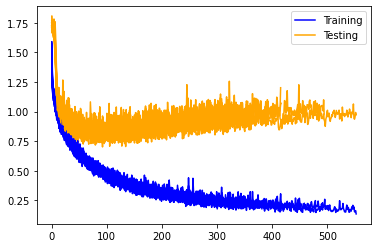

In [8]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

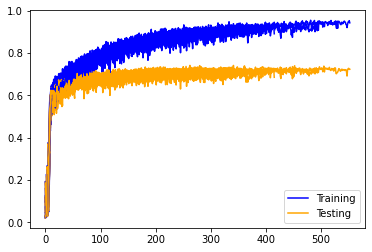

In [9]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

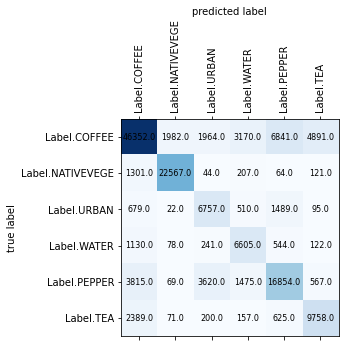

In [10]:
plot_confusion_matrix(conf_matrix, labels)

In [11]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.83268063 0.91036347 0.52682052 0.5447872  0.63799826 0.62736274]
Mean precision:  0.6800021355508136

Recalls:  [0.71092025 0.92853028 0.70739112 0.75745413 0.63840909 0.73924242]
Mean recall:  0.7469912157249476

F-Score:  [0.76699816 0.91935714 0.60389668 0.63375552 0.63820361 0.67872296]
Mean f-score:  0.7068223453560779


# All bands

In [12]:
bands = [
    Band.COASTAL_AEROSOL.value, 
    Band.BLUE.value, 
    Band.GREEN.value, 
    Band.RED.value, 
    Band.NIR.value, 
    Band.SWIR1.value, 
    Band.SWIR2.value, 
    Band.TIRS1.value, 
    Band.TIRS2.value,
]

model_name = "all_bands"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 9, 9, 9)           0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 9, 9)           36        
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 9, 9, 32)          2624      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 3, 3, 64)         

57/57 [==============================] - 0s 8ms/step - loss: 0.2003 - accuracy: 0.8631 - val_loss: 0.6716 - val_accuracy: 0.7834
Epoch 101/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2127 - accuracy: 0.8760 - val_loss: 0.7254 - val_accuracy: 0.7577
Epoch 102/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2355 - accuracy: 0.8628 - val_loss: 0.6692 - val_accuracy: 0.8006
Epoch 103/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2051 - accuracy: 0.8618 - val_loss: 0.7512 - val_accuracy: 0.7708
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2125 - accuracy: 0.8595 - val_loss: 0.7645 - val_accuracy: 0.7591
Epoch 105/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1654 - accuracy: 0.8779 - val_loss: 0.7374 - val_accuracy: 0.7686
Epoch 106/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2180 - accuracy: 0.8530 - val_loss: 0.8006 - val_accuracy: 0.7632
Epoch 1

Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1831 - accuracy: 0.9022 - val_loss: 0.7910 - val_accuracy: 0.7793
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1403 - accuracy: 0.9075 - val_loss: 0.7337 - val_accuracy: 0.8104
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1324 - accuracy: 0.9120 - val_loss: 0.8153 - val_accuracy: 0.7645
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1707 - accuracy: 0.9039 - val_loss: 0.7613 - val_accuracy: 0.8093
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1896 - accuracy: 0.8904 - val_loss: 0.8147 - val_accuracy: 0.7903
Epoch 162/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1523 - accuracy: 0.8934 - val_loss: 0.7080 - val_accuracy: 0.8094
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1216 - accuracy: 0.9198 - val_loss: 0.7967 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1191 - accuracy: 0.9300 - val_loss: 0.8237 - val_accuracy: 0.8103
Epoch 215/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1014 - accuracy: 0.9304 - val_loss: 0.8663 - val_accuracy: 0.7967
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0788 - accuracy: 0.9472 - val_loss: 0.8841 - val_accuracy: 0.8088
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0846 - accuracy: 0.9453 - val_loss: 0.8442 - val_accuracy: 0.8085
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1036 - accuracy: 0.9420 - val_loss: 0.8746 - val_accuracy: 0.8092
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0738 - accuracy: 0.9408 - val_loss: 0.8843 - val_accuracy: 0.7990
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1174 - accuracy: 0.9322 - val_loss: 0.8944 - val_accurac

Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0789 - accuracy: 0.9584 - val_loss: 0.9159 - val_accuracy: 0.8052

Validation  1 , fold  2 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.7122 - accuracy: 0.1804 - val_loss: 1.7595 - val_accuracy: 0.1471
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1197 - accuracy: 0.3630 - val_loss: 1.7410 - val_accuracy: 0.0919
Epoch 3/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1148 - accuracy: 0.3830 - val_loss: 1.7223 - val_accuracy: 0.1320
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0229 - accuracy: 0.4316 - val_loss: 1.7081 - val_accuracy: 0.3975
Epoch 5/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.1057 - accuracy: 0.4065 - val_loss: 1.6652 - val_accuracy: 0.4851
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9871 - accurac

Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4188 - accuracy: 0.7878 - val_loss: 0.6341 - val_accuracy: 0.7502
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4297 - accuracy: 0.7993 - val_loss: 0.6788 - val_accuracy: 0.7521
Epoch 59/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4772 - accuracy: 0.7353 - val_loss: 0.6678 - val_accuracy: 0.7465
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4237 - accuracy: 0.7822 - val_loss: 0.6880 - val_accuracy: 0.7278
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4810 - accuracy: 0.7635 - val_loss: 0.6961 - val_accuracy: 0.7426
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3966 - accuracy: 0.8007 - val_loss: 0.5976 - val_accuracy: 0.7732
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3779 - accuracy: 0.8022 - val_loss: 0.6749 - val_accuracy: 0.7511

57/57 [==============================] - 1s 9ms/step - loss: 0.2940 - accuracy: 0.8471 - val_loss: 0.6584 - val_accuracy: 0.7964
Epoch 115/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2482 - accuracy: 0.8458 - val_loss: 0.6936 - val_accuracy: 0.7705
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2121 - accuracy: 0.8588 - val_loss: 0.6940 - val_accuracy: 0.7967
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1970 - accuracy: 0.8758 - val_loss: 0.6693 - val_accuracy: 0.7902
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2019 - accuracy: 0.8789 - val_loss: 0.7253 - val_accuracy: 0.7842
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2820 - accuracy: 0.8179 - val_loss: 0.6554 - val_accuracy: 0.7844
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2078 - accuracy: 0.8702 - val_loss: 0.7128 - val_accuracy: 0.7770
Epoch 

Epoch 171/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1608 - accuracy: 0.8984 - val_loss: 0.8259 - val_accuracy: 0.7945
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1491 - accuracy: 0.9065 - val_loss: 0.7939 - val_accuracy: 0.7920
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1237 - accuracy: 0.9176 - val_loss: 0.7953 - val_accuracy: 0.8059
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1646 - accuracy: 0.9042 - val_loss: 0.8361 - val_accuracy: 0.7679
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2027 - accuracy: 0.8737 - val_loss: 0.8614 - val_accuracy: 0.7902
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2038 - accuracy: 0.8963 - val_loss: 0.8167 - val_accuracy: 0.7817
Epoch 177/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1565 - accuracy: 0.9126 - val_loss: 0.7979 - val_accuracy

Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1810 - accuracy: 0.9195 - val_loss: 0.9962 - val_accuracy: 0.7741
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9032 - val_loss: 0.8209 - val_accuracy: 0.8069
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0913 - accuracy: 0.9456 - val_loss: 0.8613 - val_accuracy: 0.8222
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1688 - accuracy: 0.9279 - val_loss: 0.8364 - val_accuracy: 0.8127
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1291 - accuracy: 0.9250 - val_loss: 0.8375 - val_accuracy: 0.7997
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1806 - accuracy: 0.9142 - val_loss: 0.9158 - val_accuracy: 0.7792
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1877 - accuracy: 0.8856 - val_loss: 0.7751 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1219 - accuracy: 0.9345 - val_loss: 0.7712 - val_accuracy: 0.8196
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0725 - accuracy: 0.9522 - val_loss: 0.7840 - val_accuracy: 0.8244
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0688 - accuracy: 0.9609 - val_loss: 0.8526 - val_accuracy: 0.8319
Epoch 288/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1028 - accuracy: 0.9558 - val_loss: 0.9167 - val_accuracy: 0.8104
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1007 - accuracy: 0.9442 - val_loss: 0.9337 - val_accuracy: 0.8169
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1066 - accuracy: 0.9398 - val_loss: 1.0656 - val_accuracy: 0.7856
Epoch 291/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2183 - accuracy: 0.9005 - val_loss: 0.8170 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0690 - accuracy: 0.9463 - val_loss: 1.0841 - val_accuracy: 0.8084
Epoch 343/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1013 - accuracy: 0.9378 - val_loss: 0.9681 - val_accuracy: 0.8252
Epoch 344/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0557 - accuracy: 0.9570 - val_loss: 0.9260 - val_accuracy: 0.8240
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0700 - accuracy: 0.9515 - val_loss: 0.9860 - val_accuracy: 0.8106
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0963 - accuracy: 0.9314 - val_loss: 0.9364 - val_accuracy: 0.8263
Epoch 347/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0662 - accuracy: 0.9590 - val_loss: 1.1240 - val_accuracy: 0.7895
Epoch 348/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1152 - accuracy: 0.9399 - val_loss: 1.0099 - val_accuracy

57/57 [==============================] - 0s 8ms/step - loss: 0.2788 - accuracy: 0.8529 - val_loss: 0.7104 - val_accuracy: 0.7689
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3223 - accuracy: 0.8470 - val_loss: 0.7684 - val_accuracy: 0.7298
Epoch 76/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3169 - accuracy: 0.8300 - val_loss: 0.6467 - val_accuracy: 0.7867
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2149 - accuracy: 0.8802 - val_loss: 0.6686 - val_accuracy: 0.7827
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2544 - accuracy: 0.8760 - val_loss: 0.6610 - val_accuracy: 0.7895
Epoch 79/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.6714 - val_accuracy: 0.7917
Epoch 80/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2787 - accuracy: 0.8675 - val_loss: 0.6404 - val_accuracy: 0.7969
Epoch 81/2000

Epoch 188/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1739 - accuracy: 0.9148 - val_loss: 0.8019 - val_accuracy: 0.7990
Epoch 189/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1356 - accuracy: 0.9282 - val_loss: 0.7391 - val_accuracy: 0.8183
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1063 - accuracy: 0.9404 - val_loss: 0.7102 - val_accuracy: 0.8179
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1219 - accuracy: 0.9270 - val_loss: 0.7187 - val_accuracy: 0.8194
Epoch 192/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0949 - accuracy: 0.9460 - val_loss: 0.8033 - val_accuracy: 0.8020
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1083 - accuracy: 0.9341 - val_loss: 0.7180 - val_accuracy: 0.8198
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1149 - accuracy: 0.9355 - val_loss: 0.7890 - val_accurac

Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0866 - accuracy: 0.9398 - val_loss: 0.8982 - val_accuracy: 0.8243
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0982 - accuracy: 0.9419 - val_loss: 0.8854 - val_accuracy: 0.8106
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1130 - accuracy: 0.9301 - val_loss: 0.8787 - val_accuracy: 0.8173
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0786 - accuracy: 0.9541 - val_loss: 0.8354 - val_accuracy: 0.8249
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0970 - accuracy: 0.9484 - val_loss: 0.8605 - val_accuracy: 0.8106
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0999 - accuracy: 0.9459 - val_loss: 0.8549 - val_accuracy: 0.8054
Epoch 251/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0998 - accuracy: 0.9433 - val_loss: 0.8210 - val_accuracy:

Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0839 - accuracy: 0.9578 - val_loss: 0.9941 - val_accuracy: 0.8198
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0864 - accuracy: 0.9584 - val_loss: 0.9138 - val_accuracy: 0.8150
Epoch 304/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0630 - accuracy: 0.9576 - val_loss: 0.8983 - val_accuracy: 0.8221
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0770 - accuracy: 0.9607 - val_loss: 1.0074 - val_accuracy: 0.7993
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0859 - accuracy: 0.9437 - val_loss: 0.8462 - val_accuracy: 0.8279
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0928 - accuracy: 0.9469 - val_loss: 0.9480 - val_accuracy: 0.8149
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0779 - accuracy: 0.9499 - val_loss: 0.8508 - val_accuracy

Epoch 359/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0919 - accuracy: 0.9527 - val_loss: 0.9767 - val_accuracy: 0.8099
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0621 - accuracy: 0.9699 - val_loss: 0.9706 - val_accuracy: 0.8179
Epoch 361/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0447 - accuracy: 0.9711 - val_loss: 1.0792 - val_accuracy: 0.8119
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1505 - accuracy: 0.9409 - val_loss: 1.0154 - val_accuracy: 0.8062
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0751 - accuracy: 0.9511 - val_loss: 0.9384 - val_accuracy: 0.8275
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0478 - accuracy: 0.9678 - val_loss: 1.0012 - val_accuracy: 0.8186
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0562 - accuracy: 0.9594 - val_loss: 1.0043 - val_accurac

57/57 [==============================] - 1s 10ms/step - loss: 0.3640 - accuracy: 0.7899 - val_loss: 0.8408 - val_accuracy: 0.7162
Epoch 63/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3762 - accuracy: 0.7681 - val_loss: 0.7843 - val_accuracy: 0.6877
Epoch 64/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3502 - accuracy: 0.7797 - val_loss: 0.6895 - val_accuracy: 0.7394
Epoch 65/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3719 - accuracy: 0.7750 - val_loss: 0.6722 - val_accuracy: 0.7564
Epoch 66/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.3662 - accuracy: 0.8033 - val_loss: 0.6767 - val_accuracy: 0.7495
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3184 - accuracy: 0.8115 - val_loss: 0.6907 - val_accuracy: 0.7557
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3539 - accuracy: 0.7989 - val_loss: 0.6726 - val_accuracy: 0.7407
Epoch 6

57/57 [==============================] - 1s 12ms/step - loss: 0.3023 - accuracy: 0.8256 - val_loss: 0.6662 - val_accuracy: 0.7717
Epoch 120/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2788 - accuracy: 0.8455 - val_loss: 0.7347 - val_accuracy: 0.7660
Epoch 121/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2066 - accuracy: 0.8625 - val_loss: 0.6473 - val_accuracy: 0.7924
Epoch 122/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1918 - accuracy: 0.8843 - val_loss: 0.7346 - val_accuracy: 0.7798
Epoch 123/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2068 - accuracy: 0.8761 - val_loss: 0.7850 - val_accuracy: 0.7557
Epoch 124/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2791 - accuracy: 0.8526 - val_loss: 0.7570 - val_accuracy: 0.7659
Epoch 125/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2198 - accuracy: 0.8626 - val_loss: 0.6718 - val_accuracy: 0.7826
Epoc

Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1379 - accuracy: 0.9047 - val_loss: 0.7695 - val_accuracy: 0.7807
Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1469 - accuracy: 0.9004 - val_loss: 0.7272 - val_accuracy: 0.8021
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1682 - accuracy: 0.9052 - val_loss: 0.7639 - val_accuracy: 0.7951
Epoch 179/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1497 - accuracy: 0.9194 - val_loss: 0.8445 - val_accuracy: 0.7698
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3039 - accuracy: 0.8753 - val_loss: 0.8619 - val_accuracy: 0.7822
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8482 - val_loss: 0.8208 - val_accuracy: 0.7701
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2082 - accuracy: 0.8708 - val_loss: 0.7497 - val_accuracy:

Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1382 - accuracy: 0.9150 - val_loss: 0.7946 - val_accuracy: 0.8015
Epoch 234/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2106 - accuracy: 0.8867 - val_loss: 0.8238 - val_accuracy: 0.7871
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2102 - accuracy: 0.8921 - val_loss: 0.8130 - val_accuracy: 0.7708
Epoch 236/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2790 - accuracy: 0.8703 - val_loss: 0.6909 - val_accuracy: 0.7997
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1531 - accuracy: 0.9189 - val_loss: 0.7325 - val_accuracy: 0.8035
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1190 - accuracy: 0.9221 - val_loss: 0.7772 - val_accuracy: 0.7996
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1138 - accuracy: 0.9200 - val_loss: 0.7820 - val_accuracy

Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0672 - accuracy: 0.9585 - val_loss: 0.9073 - val_accuracy: 0.8123
Epoch 291/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0625 - accuracy: 0.9622 - val_loss: 0.9405 - val_accuracy: 0.7990
Epoch 292/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1201 - accuracy: 0.9327 - val_loss: 1.0379 - val_accuracy: 0.7641
Epoch 293/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1657 - accuracy: 0.9001 - val_loss: 0.8016 - val_accuracy: 0.8135
Epoch 294/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0899 - accuracy: 0.9484 - val_loss: 0.8544 - val_accuracy: 0.8092
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1180 - accuracy: 0.9383 - val_loss: 0.8821 - val_accuracy: 0.8031
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1017 - accuracy: 0.9412 - val_loss: 0.8458 - val_accuracy

Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0865 - accuracy: 0.9489 - val_loss: 0.9260 - val_accuracy: 0.8134
Epoch 348/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0686 - accuracy: 0.9570 - val_loss: 0.9794 - val_accuracy: 0.8121
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0976 - accuracy: 0.9505 - val_loss: 0.9027 - val_accuracy: 0.8092
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0880 - accuracy: 0.9488 - val_loss: 0.8392 - val_accuracy: 0.8172
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0941 - accuracy: 0.9474 - val_loss: 0.8595 - val_accuracy: 0.8224
Epoch 352/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0620 - accuracy: 0.9600 - val_loss: 0.9840 - val_accuracy: 0.8064
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1100 - accuracy: 0.9393 - val_loss: 0.9392 - val_accuracy:

Epoch 404/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0927 - accuracy: 0.9506 - val_loss: 0.9295 - val_accuracy: 0.8131
Epoch 405/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1233 - accuracy: 0.9566 - val_loss: 0.8934 - val_accuracy: 0.8229
Epoch 406/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0943 - accuracy: 0.9454 - val_loss: 0.9027 - val_accuracy: 0.8213
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0735 - accuracy: 0.9611 - val_loss: 0.9450 - val_accuracy: 0.8240

Validation  1 , fold  5 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.6972 - accuracy: 0.2173 - val_loss: 1.8154 - val_accuracy: 0.1289
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.2121 - accuracy: 0.3614 - val_loss: 1.7189 - val_accuracy: 0.0909
Epoch 3/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.2433 - 

Epoch 54/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4309 - accuracy: 0.7587 - val_loss: 0.7237 - val_accuracy: 0.7015
Epoch 55/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4474 - accuracy: 0.7631 - val_loss: 0.6888 - val_accuracy: 0.7282
Epoch 56/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3754 - accuracy: 0.7949 - val_loss: 0.6808 - val_accuracy: 0.7454
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3833 - accuracy: 0.7845 - val_loss: 0.7463 - val_accuracy: 0.7275
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4518 - accuracy: 0.7741 - val_loss: 0.5841 - val_accuracy: 0.7811
Epoch 59/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4282 - accuracy: 0.7849 - val_loss: 0.7233 - val_accuracy: 0.7331
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4025 - accuracy: 0.7653 - val_loss: 0.6386 - val_accuracy: 0.7

57/57 [==============================] - 1s 10ms/step - loss: 0.2430 - accuracy: 0.8354 - val_loss: 0.6877 - val_accuracy: 0.7774
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2191 - accuracy: 0.8535 - val_loss: 0.9159 - val_accuracy: 0.7077
Epoch 113/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2975 - accuracy: 0.8067 - val_loss: 0.7177 - val_accuracy: 0.7399
Epoch 114/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2357 - accuracy: 0.8646 - val_loss: 0.7150 - val_accuracy: 0.7662
Epoch 115/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3015 - accuracy: 0.8186 - val_loss: 0.7428 - val_accuracy: 0.7544
Epoch 116/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2761 - accuracy: 0.8451 - val_loss: 0.6576 - val_accuracy: 0.7955
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2018 - accuracy: 0.8644 - val_loss: 0.6673 - val_accuracy: 0.7791
E

Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1893 - accuracy: 0.8919 - val_loss: 0.7614 - val_accuracy: 0.7787
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1832 - accuracy: 0.8903 - val_loss: 0.7920 - val_accuracy: 0.7700
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1621 - accuracy: 0.9003 - val_loss: 0.7245 - val_accuracy: 0.7950
Epoch 171/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1453 - accuracy: 0.9141 - val_loss: 0.7974 - val_accuracy: 0.7730
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1996 - accuracy: 0.8907 - val_loss: 0.7909 - val_accuracy: 0.7652
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1591 - accuracy: 0.8911 - val_loss: 0.7214 - val_accuracy: 0.7906
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1462 - accuracy: 0.8920 - val_loss: 0.7474 - val_accuracy

Epoch 225/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1851 - accuracy: 0.8820 - val_loss: 0.7615 - val_accuracy: 0.7921
Epoch 226/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1437 - accuracy: 0.9134 - val_loss: 0.7883 - val_accuracy: 0.7922
Epoch 227/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1579 - accuracy: 0.9045 - val_loss: 0.7561 - val_accuracy: 0.7983
Epoch 228/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1347 - accuracy: 0.9198 - val_loss: 0.7340 - val_accuracy: 0.8157
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1026 - accuracy: 0.9340 - val_loss: 0.7690 - val_accuracy: 0.8073
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1070 - accuracy: 0.9304 - val_loss: 0.8956 - val_accuracy: 0.7787
Epoch 231/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1287 - accuracy: 0.9161 - val_loss: 0.7753 - val_accu

Epoch 282/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2646 - accuracy: 0.8708 - val_loss: 0.7694 - val_accuracy: 0.7966
Epoch 283/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.1072 - accuracy: 0.9270 - val_loss: 0.7846 - val_accuracy: 0.8108
Epoch 284/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.0799 - accuracy: 0.9437 - val_loss: 0.8867 - val_accuracy: 0.8004
Epoch 285/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.0989 - accuracy: 0.9311 - val_loss: 0.9248 - val_accuracy: 0.7940
Epoch 286/2000
57/57 [==============================] - 1s 15ms/step - loss: 0.1437 - accuracy: 0.9169 - val_loss: 0.8953 - val_accuracy: 0.7800
Epoch 287/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1322 - accuracy: 0.9246 - val_loss: 0.7756 - val_accuracy: 0.8065
Epoch 288/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0820 - accuracy: 0.9395 - val_loss: 0.8659 - val_ac

Epoch 339/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0523 - accuracy: 0.9687 - val_loss: 0.9043 - val_accuracy: 0.8175
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0645 - accuracy: 0.9605 - val_loss: 0.9656 - val_accuracy: 0.8233
Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1119 - accuracy: 0.9451 - val_loss: 0.9330 - val_accuracy: 0.8009
Epoch 342/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1091 - accuracy: 0.9366 - val_loss: 0.8776 - val_accuracy: 0.8035
Epoch 343/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1116 - accuracy: 0.9438 - val_loss: 1.0962 - val_accuracy: 0.7637
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1109 - accuracy: 0.9229 - val_loss: 0.8852 - val_accuracy: 0.8173
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0737 - accuracy: 0.9497 - val_loss: 0.9001 - val_accurac

Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0892 - accuracy: 0.9532 - val_loss: 0.8810 - val_accuracy: 0.8195
Epoch 397/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0666 - accuracy: 0.9584 - val_loss: 1.0074 - val_accuracy: 0.8085
Epoch 398/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0868 - accuracy: 0.9511 - val_loss: 1.0498 - val_accuracy: 0.8034
Epoch 399/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0762 - accuracy: 0.9546 - val_loss: 1.0236 - val_accuracy: 0.7997
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0940 - accuracy: 0.9555 - val_loss: 1.0171 - val_accuracy: 0.8002
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1348 - accuracy: 0.9365 - val_loss: 0.9400 - val_accuracy: 0.8032
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1104 - accuracy: 0.9482 - val_loss: 0.9598 - val_accuracy:

Epoch 19/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7585 - accuracy: 0.6655 - val_loss: 0.8626 - val_accuracy: 0.6713
Epoch 20/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7662 - accuracy: 0.6485 - val_loss: 0.7728 - val_accuracy: 0.7267
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7176 - accuracy: 0.6783 - val_loss: 0.8690 - val_accuracy: 0.6830
Epoch 22/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6382 - accuracy: 0.6982 - val_loss: 0.8648 - val_accuracy: 0.6603
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6813 - accuracy: 0.6805 - val_loss: 0.7709 - val_accuracy: 0.7250
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6469 - accuracy: 0.7010 - val_loss: 0.7420 - val_accuracy: 0.7334
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6198 - accuracy: 0.7199 - val_loss: 0.7817 - val_accuracy: 0.7

57/57 [==============================] - 1s 9ms/step - loss: 0.2219 - accuracy: 0.8624 - val_loss: 0.7741 - val_accuracy: 0.7861
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1637 - accuracy: 0.9021 - val_loss: 0.7853 - val_accuracy: 0.7822
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2257 - accuracy: 0.8672 - val_loss: 0.7016 - val_accuracy: 0.7933
Epoch 136/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1822 - accuracy: 0.8891 - val_loss: 0.7025 - val_accuracy: 0.8081
Epoch 137/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1740 - accuracy: 0.9038 - val_loss: 0.6867 - val_accuracy: 0.8107
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1564 - accuracy: 0.9149 - val_loss: 0.6916 - val_accuracy: 0.8126
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1714 - accuracy: 0.8960 - val_loss: 0.6514 - val_accuracy: 0.8078
Epoch 1

Epoch 190/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1346 - accuracy: 0.9260 - val_loss: 0.8956 - val_accuracy: 0.7795
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1407 - accuracy: 0.8969 - val_loss: 0.8385 - val_accuracy: 0.8181
Epoch 192/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1865 - accuracy: 0.9204 - val_loss: 0.8734 - val_accuracy: 0.7790
Epoch 193/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1543 - accuracy: 0.9124 - val_loss: 0.7528 - val_accuracy: 0.8062
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1238 - accuracy: 0.9336 - val_loss: 0.8545 - val_accuracy: 0.7896
Epoch 195/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1686 - accuracy: 0.9124 - val_loss: 0.7160 - val_accuracy: 0.8175
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1152 - accuracy: 0.9387 - val_loss: 0.7850 - val_accuracy:

Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0866 - accuracy: 0.9515 - val_loss: 0.9675 - val_accuracy: 0.8025
Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1690 - accuracy: 0.9143 - val_loss: 0.9491 - val_accuracy: 0.7586
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1491 - accuracy: 0.9202 - val_loss: 0.8468 - val_accuracy: 0.8020
Epoch 250/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1001 - accuracy: 0.9394 - val_loss: 0.8909 - val_accuracy: 0.8085
Epoch 251/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0992 - accuracy: 0.9459 - val_loss: 0.9258 - val_accuracy: 0.7906
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1250 - accuracy: 0.9274 - val_loss: 0.8249 - val_accuracy: 0.8183
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1131 - accuracy: 0.9334 - val_loss: 0.9253 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6192 - accuracy: 0.7214 - val_loss: 0.8912 - val_accuracy: 0.6527
Epoch 26/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5730 - accuracy: 0.7054 - val_loss: 0.7662 - val_accuracy: 0.7063
Epoch 27/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6185 - accuracy: 0.7147 - val_loss: 0.8126 - val_accuracy: 0.6936
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6297 - accuracy: 0.7146 - val_loss: 0.8578 - val_accuracy: 0.6803
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5352 - accuracy: 0.7190 - val_loss: 0.7728 - val_accuracy: 0.7005
Epoch 30/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5603 - accuracy: 0.7385 - val_loss: 0.8064 - val_accuracy: 0.6864
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5364 - accuracy: 0.7387 - val_loss: 0.7463 - val_accuracy: 0.719

57/57 [==============================] - 0s 9ms/step - loss: 0.1439 - accuracy: 0.9084 - val_loss: 0.7281 - val_accuracy: 0.8042
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1624 - accuracy: 0.8930 - val_loss: 0.7838 - val_accuracy: 0.7837
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2177 - accuracy: 0.8687 - val_loss: 0.7350 - val_accuracy: 0.7825
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1715 - accuracy: 0.8806 - val_loss: 0.6486 - val_accuracy: 0.7956
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1985 - accuracy: 0.8969 - val_loss: 0.6980 - val_accuracy: 0.8149
Epoch 144/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1553 - accuracy: 0.8892 - val_loss: 0.7574 - val_accuracy: 0.7943
Epoch 145/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1572 - accuracy: 0.9099 - val_loss: 0.6604 - val_accuracy: 0.8127
Epoch 

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1031 - accuracy: 0.9347 - val_loss: 0.7804 - val_accuracy: 0.8167
Epoch 197/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1304 - accuracy: 0.9224 - val_loss: 0.9044 - val_accuracy: 0.7841
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1781 - accuracy: 0.8997 - val_loss: 0.8050 - val_accuracy: 0.7993
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1741 - accuracy: 0.9098 - val_loss: 0.7225 - val_accuracy: 0.8194
Epoch 200/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1172 - accuracy: 0.9298 - val_loss: 0.8160 - val_accuracy: 0.7983
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0808 - accuracy: 0.9520 - val_loss: 0.8125 - val_accuracy: 0.8157
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1046 - accuracy: 0.9352 - val_loss: 0.8508 - val_accuracy

Epoch 253/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1109 - accuracy: 0.9282 - val_loss: 0.8334 - val_accuracy: 0.7966
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0744 - accuracy: 0.9539 - val_loss: 0.8945 - val_accuracy: 0.8055
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1243 - accuracy: 0.9369 - val_loss: 0.8454 - val_accuracy: 0.7864
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1350 - accuracy: 0.9235 - val_loss: 0.8464 - val_accuracy: 0.7861
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1209 - accuracy: 0.9200 - val_loss: 0.7686 - val_accuracy: 0.8183
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1091 - accuracy: 0.9361 - val_loss: 0.8512 - val_accuracy: 0.7954
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0821 - accuracy: 0.9471 - val_loss: 0.8428 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0667 - accuracy: 0.9589 - val_loss: 0.8729 - val_accuracy: 0.8112
Epoch 311/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0909 - accuracy: 0.9582 - val_loss: 0.8770 - val_accuracy: 0.8107
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0749 - accuracy: 0.9478 - val_loss: 0.9187 - val_accuracy: 0.7913
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0844 - accuracy: 0.9413 - val_loss: 0.9017 - val_accuracy: 0.8106
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0527 - accuracy: 0.9727 - val_loss: 0.8716 - val_accuracy: 0.8240
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0562 - accuracy: 0.9682 - val_loss: 0.9833 - val_accuracy: 0.7983
Epoch 316/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0721 - accuracy: 0.9511 - val_loss: 0.8974 - val_accuracy:

Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0600 - accuracy: 0.9656 - val_loss: 0.9728 - val_accuracy: 0.8152
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0769 - accuracy: 0.9567 - val_loss: 0.9214 - val_accuracy: 0.8217
Epoch 369/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1824 - accuracy: 0.9326 - val_loss: 0.8622 - val_accuracy: 0.8230
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0741 - accuracy: 0.9613 - val_loss: 0.9247 - val_accuracy: 0.8028
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0726 - accuracy: 0.9494 - val_loss: 0.9442 - val_accuracy: 0.8031
Epoch 372/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0954 - accuracy: 0.9601 - val_loss: 0.9359 - val_accuracy: 0.7888
Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0855 - accuracy: 0.9559 - val_loss: 0.9014 - val_accuracy

Epoch 424/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0725 - accuracy: 0.9538 - val_loss: 0.9697 - val_accuracy: 0.8039
Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0771 - accuracy: 0.9492 - val_loss: 0.9988 - val_accuracy: 0.8131
Epoch 426/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0342 - accuracy: 0.9757 - val_loss: 1.0515 - val_accuracy: 0.8068
Epoch 427/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0697 - accuracy: 0.9598 - val_loss: 1.0233 - val_accuracy: 0.8140
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0668 - accuracy: 0.9566 - val_loss: 0.9461 - val_accuracy: 0.8133
Epoch 429/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0504 - accuracy: 0.9673 - val_loss: 0.9775 - val_accuracy: 0.8165
Epoch 430/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0615 - accuracy: 0.9658 - val_loss: 1.2272 - val_accuracy

Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6096 - accuracy: 0.7069 - val_loss: 0.8683 - val_accuracy: 0.6784
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6787 - accuracy: 0.6919 - val_loss: 0.8902 - val_accuracy: 0.6595
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6440 - accuracy: 0.6707 - val_loss: 0.6879 - val_accuracy: 0.7317
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6146 - accuracy: 0.7241 - val_loss: 0.7481 - val_accuracy: 0.6990
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5947 - accuracy: 0.7016 - val_loss: 0.7774 - val_accuracy: 0.6884
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6522 - accuracy: 0.6914 - val_loss: 0.7215 - val_accuracy: 0.7177
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6012 - accuracy: 0.7155 - val_loss: 0.8654 - val_accuracy: 0.6516

57/57 [==============================] - 1s 9ms/step - loss: 0.1915 - accuracy: 0.8805 - val_loss: 0.7335 - val_accuracy: 0.7826
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1714 - accuracy: 0.9004 - val_loss: 0.7256 - val_accuracy: 0.7988
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1718 - accuracy: 0.8996 - val_loss: 0.7626 - val_accuracy: 0.7741
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1552 - accuracy: 0.8956 - val_loss: 0.8299 - val_accuracy: 0.7766
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1981 - accuracy: 0.8804 - val_loss: 0.7251 - val_accuracy: 0.7985
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1478 - accuracy: 0.8950 - val_loss: 0.7372 - val_accuracy: 0.7977
Epoch 146/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1745 - accuracy: 0.8968 - val_loss: 0.7432 - val_accuracy: 0.7939
Epoch 

Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9013 - val_loss: 0.8917 - val_accuracy: 0.7872
Epoch 198/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2223 - accuracy: 0.8848 - val_loss: 0.7909 - val_accuracy: 0.7952
Epoch 199/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1905 - accuracy: 0.8880 - val_loss: 0.8079 - val_accuracy: 0.8013
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1217 - accuracy: 0.9296 - val_loss: 0.7751 - val_accuracy: 0.8088
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0936 - accuracy: 0.9344 - val_loss: 0.8189 - val_accuracy: 0.8164
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0988 - accuracy: 0.9412 - val_loss: 0.8516 - val_accuracy: 0.8088
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1035 - accuracy: 0.9378 - val_loss: 0.8637 - val_accuracy

Epoch 254/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1245 - accuracy: 0.9306 - val_loss: 0.9491 - val_accuracy: 0.7916
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1504 - accuracy: 0.9174 - val_loss: 0.7987 - val_accuracy: 0.8171
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0701 - accuracy: 0.9551 - val_loss: 0.9008 - val_accuracy: 0.8125
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0731 - accuracy: 0.9552 - val_loss: 0.8811 - val_accuracy: 0.8266
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0790 - accuracy: 0.9636 - val_loss: 0.9149 - val_accuracy: 0.8074
Epoch 259/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0997 - accuracy: 0.9429 - val_loss: 0.9307 - val_accuracy: 0.8209
Epoch 260/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0919 - accuracy: 0.9476 - val_loss: 1.0073 - val_accura

Epoch 311/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0907 - accuracy: 0.9555 - val_loss: 0.9466 - val_accuracy: 0.8199
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0665 - accuracy: 0.9575 - val_loss: 1.0511 - val_accuracy: 0.7951
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1360 - accuracy: 0.9353 - val_loss: 0.9812 - val_accuracy: 0.7993
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1899 - accuracy: 0.9078 - val_loss: 0.8935 - val_accuracy: 0.8118
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0858 - accuracy: 0.9504 - val_loss: 0.9232 - val_accuracy: 0.8141
Epoch 316/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0728 - accuracy: 0.9523 - val_loss: 0.9964 - val_accuracy: 0.8085
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0958 - accuracy: 0.9559 - val_loss: 0.9392 - val_accurac

Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0673 - accuracy: 0.9641 - val_loss: 0.9624 - val_accuracy: 0.8256
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0744 - accuracy: 0.9616 - val_loss: 0.9998 - val_accuracy: 0.8233
Epoch 370/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0723 - accuracy: 0.9646 - val_loss: 0.9770 - val_accuracy: 0.8239
Epoch 371/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0555 - accuracy: 0.9717 - val_loss: 1.0990 - val_accuracy: 0.8043
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0712 - accuracy: 0.9545 - val_loss: 1.0510 - val_accuracy: 0.8140
Epoch 373/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0616 - accuracy: 0.9493 - val_loss: 1.0683 - val_accuracy: 0.8205
Epoch 374/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0581 - accuracy: 0.9680 - val_loss: 1.0634 - val_accur

Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0924 - accuracy: 0.9522 - val_loss: 1.3707 - val_accuracy: 0.7469
Epoch 426/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1994 - accuracy: 0.9142 - val_loss: 0.9587 - val_accuracy: 0.8205
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0759 - accuracy: 0.9611 - val_loss: 1.0334 - val_accuracy: 0.8077
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1137 - accuracy: 0.9554 - val_loss: 1.0861 - val_accuracy: 0.8127
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0564 - accuracy: 0.9738 - val_loss: 1.1181 - val_accuracy: 0.8210

Validation  2 , fold  4 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.7129 - accuracy: 0.1874 - val_loss: 1.7385 - val_accuracy: 0.0982
Epoch 2/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.2801 

Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4389 - accuracy: 0.7757 - val_loss: 0.6909 - val_accuracy: 0.7374
Epoch 54/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4168 - accuracy: 0.7778 - val_loss: 0.6556 - val_accuracy: 0.7544
Epoch 55/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4516 - accuracy: 0.7724 - val_loss: 0.6476 - val_accuracy: 0.7583
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3926 - accuracy: 0.7975 - val_loss: 0.7182 - val_accuracy: 0.7339
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4237 - accuracy: 0.7849 - val_loss: 0.6539 - val_accuracy: 0.7468
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7849 - val_loss: 0.6925 - val_accuracy: 0.7381
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3565 - accuracy: 0.8200 - val_loss: 0.6496 - val_accuracy: 0.7590

57/57 [==============================] - 0s 8ms/step - loss: 0.2098 - accuracy: 0.8671 - val_loss: 0.6653 - val_accuracy: 0.7869
Epoch 111/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2343 - accuracy: 0.8512 - val_loss: 0.6425 - val_accuracy: 0.7954
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2472 - accuracy: 0.8528 - val_loss: 0.7110 - val_accuracy: 0.7700
Epoch 113/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2534 - accuracy: 0.8560 - val_loss: 0.6586 - val_accuracy: 0.7882
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1958 - accuracy: 0.8804 - val_loss: 0.7767 - val_accuracy: 0.7568
Epoch 115/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2214 - accuracy: 0.8464 - val_loss: 0.6688 - val_accuracy: 0.7959
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2232 - accuracy: 0.8526 - val_loss: 0.6484 - val_accuracy: 0.7966
Epoch 

Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1957 - accuracy: 0.8703 - val_loss: 0.6912 - val_accuracy: 0.8077
Epoch 168/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1834 - accuracy: 0.8985 - val_loss: 0.7256 - val_accuracy: 0.8069
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1898 - accuracy: 0.8914 - val_loss: 0.6932 - val_accuracy: 0.8201
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1446 - accuracy: 0.9076 - val_loss: 0.7636 - val_accuracy: 0.8008
Epoch 171/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1750 - accuracy: 0.9136 - val_loss: 0.7002 - val_accuracy: 0.8095
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1835 - accuracy: 0.8782 - val_loss: 0.7518 - val_accuracy: 0.7986
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1520 - accuracy: 0.9108 - val_loss: 0.7277 - val_accuracy

Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1206 - accuracy: 0.9340 - val_loss: 0.8599 - val_accuracy: 0.7988
Epoch 225/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1415 - accuracy: 0.9052 - val_loss: 0.8135 - val_accuracy: 0.8072
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1809 - accuracy: 0.8960 - val_loss: 0.7631 - val_accuracy: 0.8049
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1312 - accuracy: 0.9219 - val_loss: 0.7618 - val_accuracy: 0.8085
Epoch 228/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1044 - accuracy: 0.9348 - val_loss: 0.7735 - val_accuracy: 0.8070
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1619 - accuracy: 0.9151 - val_loss: 0.8114 - val_accuracy: 0.8016
Epoch 230/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1145 - accuracy: 0.9276 - val_loss: 0.7672 - val_accura

Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0853 - accuracy: 0.9452 - val_loss: 0.9350 - val_accuracy: 0.8007
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0761 - accuracy: 0.9440 - val_loss: 0.8927 - val_accuracy: 0.8039
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1162 - accuracy: 0.9247 - val_loss: 0.8712 - val_accuracy: 0.8004
Epoch 284/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0911 - accuracy: 0.9464 - val_loss: 0.8859 - val_accuracy: 0.8024
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0878 - accuracy: 0.9493 - val_loss: 0.8095 - val_accuracy: 0.8275
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0750 - accuracy: 0.9467 - val_loss: 0.8861 - val_accuracy: 0.8114
Epoch 287/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0848 - accuracy: 0.9376 - val_loss: 0.8662 - val_accuracy

Epoch 338/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1437 - accuracy: 0.9333 - val_loss: 0.9399 - val_accuracy: 0.7681
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1075 - accuracy: 0.9379 - val_loss: 0.8409 - val_accuracy: 0.8024
Epoch 340/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0961 - accuracy: 0.9402 - val_loss: 0.9115 - val_accuracy: 0.7857
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0971 - accuracy: 0.9281 - val_loss: 0.8259 - val_accuracy: 0.8164
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0757 - accuracy: 0.9478 - val_loss: 0.8798 - val_accuracy: 0.8186
Epoch 343/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0890 - accuracy: 0.9462 - val_loss: 1.0471 - val_accuracy: 0.7872
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1686 - accuracy: 0.9186 - val_loss: 0.7819 - val_accurac

Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0688 - accuracy: 0.9622 - val_loss: 0.8163 - val_accuracy: 0.8271
Epoch 396/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0473 - accuracy: 0.9769 - val_loss: 0.8471 - val_accuracy: 0.8323
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0535 - accuracy: 0.9627 - val_loss: 0.8623 - val_accuracy: 0.8255
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0574 - accuracy: 0.9659 - val_loss: 0.8717 - val_accuracy: 0.8281
Epoch 399/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0594 - accuracy: 0.9673 - val_loss: 0.9484 - val_accuracy: 0.8241
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0680 - accuracy: 0.9545 - val_loss: 1.1251 - val_accuracy: 0.7757
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1043 - accuracy: 0.9304 - val_loss: 0.9673 - val_accuracy:

Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6112 - accuracy: 0.6731 - val_loss: 0.7291 - val_accuracy: 0.7259
Epoch 34/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5375 - accuracy: 0.7422 - val_loss: 0.7543 - val_accuracy: 0.7240
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6020 - accuracy: 0.7186 - val_loss: 0.6816 - val_accuracy: 0.7532
Epoch 36/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5461 - accuracy: 0.7497 - val_loss: 0.6544 - val_accuracy: 0.7431
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5112 - accuracy: 0.7432 - val_loss: 0.7447 - val_accuracy: 0.7225
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5186 - accuracy: 0.7556 - val_loss: 0.6211 - val_accuracy: 0.7650
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5008 - accuracy: 0.7634 - val_loss: 0.8345 - val_accuracy: 0.6677

57/57 [==============================] - 0s 8ms/step - loss: 0.1223 - accuracy: 0.9160 - val_loss: 0.7311 - val_accuracy: 0.8083
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1559 - accuracy: 0.8988 - val_loss: 0.7409 - val_accuracy: 0.7906
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2152 - accuracy: 0.8943 - val_loss: 0.7923 - val_accuracy: 0.7754
Epoch 150/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1978 - accuracy: 0.8938 - val_loss: 0.7937 - val_accuracy: 0.7726
Epoch 151/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1912 - accuracy: 0.8722 - val_loss: 0.7705 - val_accuracy: 0.7709
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1800 - accuracy: 0.8644 - val_loss: 0.7302 - val_accuracy: 0.7800
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1512 - accuracy: 0.8873 - val_loss: 0.7312 - val_accuracy: 0.8116
Epoch 1

Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1296 - accuracy: 0.9108 - val_loss: 0.7219 - val_accuracy: 0.8169
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1159 - accuracy: 0.9362 - val_loss: 0.7918 - val_accuracy: 0.8115
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0825 - accuracy: 0.9418 - val_loss: 0.8879 - val_accuracy: 0.7878
Epoch 207/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1646 - accuracy: 0.8880 - val_loss: 0.7706 - val_accuracy: 0.8211
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1657 - accuracy: 0.9125 - val_loss: 0.7463 - val_accuracy: 0.8182
Epoch 209/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1230 - accuracy: 0.9231 - val_loss: 0.7366 - val_accuracy: 0.8103
Epoch 210/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1299 - accuracy: 0.9279 - val_loss: 0.7584 - val_accuracy

Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1156 - accuracy: 0.9257 - val_loss: 0.8396 - val_accuracy: 0.7937
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1009 - accuracy: 0.9343 - val_loss: 0.8881 - val_accuracy: 0.8064
Epoch 263/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1069 - accuracy: 0.9412 - val_loss: 0.8184 - val_accuracy: 0.8221
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0921 - accuracy: 0.9426 - val_loss: 0.8227 - val_accuracy: 0.8053
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0952 - accuracy: 0.9365 - val_loss: 0.9589 - val_accuracy: 0.7840
Epoch 266/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1029 - accuracy: 0.9350 - val_loss: 0.8569 - val_accuracy: 0.8205
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0758 - accuracy: 0.9472 - val_loss: 0.9708 - val_accuracy

Epoch 318/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9505 - val_loss: 0.9998 - val_accuracy: 0.7969
Epoch 319/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1762 - accuracy: 0.9172 - val_loss: 0.8688 - val_accuracy: 0.8153
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0998 - accuracy: 0.9406 - val_loss: 0.9099 - val_accuracy: 0.8171
Epoch 321/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0703 - accuracy: 0.9514 - val_loss: 0.9722 - val_accuracy: 0.8122
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0597 - accuracy: 0.9569 - val_loss: 0.9492 - val_accuracy: 0.8163
Epoch 323/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0708 - accuracy: 0.9514 - val_loss: 0.9605 - val_accuracy: 0.8241
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0483 - accuracy: 0.9649 - val_loss: 0.9544 - val_accuracy

Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0806 - accuracy: 0.9583 - val_loss: 0.9871 - val_accuracy: 0.8195
Epoch 376/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0713 - accuracy: 0.9502 - val_loss: 0.9198 - val_accuracy: 0.8188
Epoch 377/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0590 - accuracy: 0.9609 - val_loss: 0.9280 - val_accuracy: 0.8191
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0711 - accuracy: 0.9665 - val_loss: 0.9511 - val_accuracy: 0.8164
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0754 - accuracy: 0.9596 - val_loss: 0.9919 - val_accuracy: 0.8130
Epoch 380/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0640 - accuracy: 0.9554 - val_loss: 1.0236 - val_accuracy: 0.8214
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0798 - accuracy: 0.9644 - val_loss: 1.0934 - val_accuracy

Epoch 432/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0615 - accuracy: 0.9645 - val_loss: 1.0561 - val_accuracy: 0.8198
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0766 - accuracy: 0.9649 - val_loss: 1.0219 - val_accuracy: 0.8031
Epoch 434/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0662 - accuracy: 0.9626 - val_loss: 1.0692 - val_accuracy: 0.8035
Epoch 435/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0711 - accuracy: 0.9497 - val_loss: 1.0255 - val_accuracy: 0.8095
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0694 - accuracy: 0.9535 - val_loss: 0.9501 - val_accuracy: 0.8173
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0805 - accuracy: 0.9626 - val_loss: 1.0861 - val_accuracy: 0.8020
Epoch 438/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1426 - accuracy: 0.9192 - val_loss: 0.8204 - val_accura

Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4859 - accuracy: 0.7664 - val_loss: 0.6575 - val_accuracy: 0.7596
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4777 - accuracy: 0.7779 - val_loss: 0.6816 - val_accuracy: 0.7496
Epoch 49/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4678 - accuracy: 0.7689 - val_loss: 0.8436 - val_accuracy: 0.6775
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4993 - accuracy: 0.7486 - val_loss: 0.7283 - val_accuracy: 0.7169
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4899 - accuracy: 0.7692 - val_loss: 0.8350 - val_accuracy: 0.6771
Epoch 52/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5503 - accuracy: 0.6943 - val_loss: 0.7380 - val_accuracy: 0.7272
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4481 - accuracy: 0.7720 - val_loss: 0.7228 - val_accuracy: 0.730

Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1314 - accuracy: 0.9148 - val_loss: 0.8151 - val_accuracy: 0.7845
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2134 - accuracy: 0.9016 - val_loss: 0.7827 - val_accuracy: 0.7953
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8752 - val_loss: 0.7043 - val_accuracy: 0.8039
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1756 - accuracy: 0.9005 - val_loss: 0.7621 - val_accuracy: 0.7963
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1524 - accuracy: 0.9044 - val_loss: 0.7625 - val_accuracy: 0.8158
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1560 - accuracy: 0.9014 - val_loss: 0.8276 - val_accuracy: 0.7971
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1432 - accuracy: 0.9080 - val_loss: 0.7260 - val_accuracy:

Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1593 - accuracy: 0.8933 - val_loss: 0.8000 - val_accuracy: 0.8062
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1042 - accuracy: 0.9289 - val_loss: 0.8671 - val_accuracy: 0.7892
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1167 - accuracy: 0.9267 - val_loss: 0.8457 - val_accuracy: 0.8059
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1306 - accuracy: 0.9314 - val_loss: 0.8556 - val_accuracy: 0.7941
Epoch 222/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1513 - accuracy: 0.9081 - val_loss: 0.8198 - val_accuracy: 0.8088
Epoch 223/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1258 - accuracy: 0.9190 - val_loss: 0.8763 - val_accuracy: 0.7983
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1147 - accuracy: 0.9403 - val_loss: 0.8370 - val_accuracy

Epoch 275/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1382 - accuracy: 0.9214 - val_loss: 0.8488 - val_accuracy: 0.8169
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1516 - accuracy: 0.9258 - val_loss: 0.8328 - val_accuracy: 0.8183
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1048 - accuracy: 0.9445 - val_loss: 0.8363 - val_accuracy: 0.8077
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1024 - accuracy: 0.9353 - val_loss: 0.8906 - val_accuracy: 0.8115
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1046 - accuracy: 0.9339 - val_loss: 0.8736 - val_accuracy: 0.8126
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1242 - accuracy: 0.9214 - val_loss: 0.8395 - val_accuracy: 0.8175
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1010 - accuracy: 0.9460 - val_loss: 0.8247 - val_accuracy

Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1426 - accuracy: 0.9334 - val_loss: 0.9251 - val_accuracy: 0.7815
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1168 - accuracy: 0.9304 - val_loss: 0.8466 - val_accuracy: 0.8116
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9310 - val_loss: 0.8545 - val_accuracy: 0.8077
Epoch 335/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0828 - accuracy: 0.9468 - val_loss: 0.8829 - val_accuracy: 0.8130
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0671 - accuracy: 0.9601 - val_loss: 0.9387 - val_accuracy: 0.8009
Epoch 337/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0997 - accuracy: 0.9436 - val_loss: 0.9733 - val_accuracy: 0.8108
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0730 - accuracy: 0.9557 - val_loss: 0.9442 - val_accuracy

Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0963 - accuracy: 0.9587 - val_loss: 0.8893 - val_accuracy: 0.8244
Epoch 390/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0918 - accuracy: 0.9579 - val_loss: 0.9349 - val_accuracy: 0.8180
Epoch 391/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0740 - accuracy: 0.9547 - val_loss: 0.8861 - val_accuracy: 0.8241
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0620 - accuracy: 0.9609 - val_loss: 0.9006 - val_accuracy: 0.8156
Epoch 393/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0533 - accuracy: 0.9603 - val_loss: 0.9374 - val_accuracy: 0.8181
Epoch 394/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0531 - accuracy: 0.9627 - val_loss: 0.9419 - val_accuracy: 0.8194
Epoch 395/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0681 - accuracy: 0.9655 - val_loss: 1.0007 - val_accu

Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0422 - accuracy: 0.9792 - val_loss: 1.1715 - val_accuracy: 0.7704

Validation  3 , fold  2 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.6568 - accuracy: 0.2342 - val_loss: 1.7488 - val_accuracy: 0.0883
Epoch 2/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.2086 - accuracy: 0.3542 - val_loss: 1.7372 - val_accuracy: 0.0889
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1519 - accuracy: 0.3606 - val_loss: 1.6521 - val_accuracy: 0.3007
Epoch 4/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.0905 - accuracy: 0.3981 - val_loss: 1.6678 - val_accuracy: 0.2519
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9732 - accuracy: 0.4701 - val_loss: 1.5676 - val_accuracy: 0.5082
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9823 - accurac

Epoch 57/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3601 - accuracy: 0.7948 - val_loss: 0.6101 - val_accuracy: 0.7836
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3225 - accuracy: 0.8031 - val_loss: 0.6133 - val_accuracy: 0.7802
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3452 - accuracy: 0.8166 - val_loss: 0.8439 - val_accuracy: 0.7066
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4395 - accuracy: 0.7820 - val_loss: 0.5859 - val_accuracy: 0.7921
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3320 - accuracy: 0.8260 - val_loss: 0.6143 - val_accuracy: 0.7815
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3128 - accuracy: 0.8201 - val_loss: 0.6181 - val_accuracy: 0.7815
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3099 - accuracy: 0.8134 - val_loss: 0.6248 - val_accuracy: 0.785

57/57 [==============================] - 1s 9ms/step - loss: 0.1621 - accuracy: 0.8955 - val_loss: 0.7386 - val_accuracy: 0.7815
Epoch 115/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2146 - accuracy: 0.8714 - val_loss: 0.7668 - val_accuracy: 0.7773
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2139 - accuracy: 0.8665 - val_loss: 0.6778 - val_accuracy: 0.8019
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2230 - accuracy: 0.8813 - val_loss: 0.6427 - val_accuracy: 0.8163
Epoch 118/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1620 - accuracy: 0.9061 - val_loss: 0.6582 - val_accuracy: 0.7947
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1820 - accuracy: 0.8860 - val_loss: 0.6600 - val_accuracy: 0.8062
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1411 - accuracy: 0.9155 - val_loss: 0.6931 - val_accuracy: 0.8032
Epoch 

Epoch 171/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1739 - accuracy: 0.9078 - val_loss: 0.8168 - val_accuracy: 0.7853
Epoch 172/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1120 - accuracy: 0.9336 - val_loss: 0.7184 - val_accuracy: 0.8281
Epoch 173/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1186 - accuracy: 0.9288 - val_loss: 0.8445 - val_accuracy: 0.7784
Epoch 174/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1144 - accuracy: 0.9163 - val_loss: 0.7706 - val_accuracy: 0.8203
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1265 - accuracy: 0.9393 - val_loss: 0.8132 - val_accuracy: 0.7774
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2399 - accuracy: 0.8853 - val_loss: 0.7760 - val_accuracy: 0.7990
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1243 - accuracy: 0.9271 - val_loss: 0.8041 - val_accur

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1009 - accuracy: 0.9333 - val_loss: 0.7891 - val_accuracy: 0.8290
Epoch 229/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0624 - accuracy: 0.9662 - val_loss: 0.8111 - val_accuracy: 0.8262
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0699 - accuracy: 0.9567 - val_loss: 0.7775 - val_accuracy: 0.8343
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1130 - accuracy: 0.9475 - val_loss: 0.8672 - val_accuracy: 0.8264
Epoch 232/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1400 - accuracy: 0.9415 - val_loss: 0.8636 - val_accuracy: 0.7982
Epoch 233/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1390 - accuracy: 0.9178 - val_loss: 0.7939 - val_accuracy: 0.8161
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1104 - accuracy: 0.9390 - val_loss: 0.7658 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0564 - accuracy: 0.9721 - val_loss: 0.8889 - val_accuracy: 0.8270
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0995 - accuracy: 0.9593 - val_loss: 0.9400 - val_accuracy: 0.7989
Epoch 287/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0707 - accuracy: 0.9491 - val_loss: 0.9625 - val_accuracy: 0.8122
Epoch 288/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0843 - accuracy: 0.9455 - val_loss: 0.8841 - val_accuracy: 0.8272
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0717 - accuracy: 0.9547 - val_loss: 0.9077 - val_accuracy: 0.8233
Epoch 290/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0866 - accuracy: 0.9543 - val_loss: 0.9924 - val_accuracy: 0.8092
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2249 - accuracy: 0.9098 - val_loss: 0.8602 - val_accura

Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5349 - accuracy: 0.7486 - val_loss: 0.8471 - val_accuracy: 0.6918
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4516 - accuracy: 0.7665 - val_loss: 0.7334 - val_accuracy: 0.7134
Epoch 42/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4847 - accuracy: 0.7599 - val_loss: 0.7340 - val_accuracy: 0.7377
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4634 - accuracy: 0.7520 - val_loss: 0.7849 - val_accuracy: 0.7199
Epoch 44/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5345 - accuracy: 0.7427 - val_loss: 0.7914 - val_accuracy: 0.6898
Epoch 45/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4910 - accuracy: 0.7435 - val_loss: 0.7242 - val_accuracy: 0.7359
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4243 - accuracy: 0.7672 - val_loss: 0.8745 - val_accuracy: 0.6

Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1703 - accuracy: 0.9083 - val_loss: 0.7965 - val_accuracy: 0.7772
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1720 - accuracy: 0.9197 - val_loss: 0.7601 - val_accuracy: 0.7944
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1615 - accuracy: 0.9071 - val_loss: 0.7651 - val_accuracy: 0.8000
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1656 - accuracy: 0.9049 - val_loss: 0.7689 - val_accuracy: 0.7855
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1604 - accuracy: 0.8999 - val_loss: 0.7838 - val_accuracy: 0.7921
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1673 - accuracy: 0.8918 - val_loss: 0.7274 - val_accuracy: 0.8096
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1577 - accuracy: 0.9014 - val_loss: 0.8111 - val_accuracy:

Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1510 - accuracy: 0.9426 - val_loss: 0.8719 - val_accuracy: 0.7933
Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1229 - accuracy: 0.9286 - val_loss: 0.8760 - val_accuracy: 0.8074
Epoch 213/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1259 - accuracy: 0.9271 - val_loss: 0.8462 - val_accuracy: 0.8138
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1029 - accuracy: 0.9313 - val_loss: 0.9538 - val_accuracy: 0.7834
Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1414 - accuracy: 0.9191 - val_loss: 0.8848 - val_accuracy: 0.7922
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1318 - accuracy: 0.9154 - val_loss: 0.8381 - val_accuracy: 0.8080
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1007 - accuracy: 0.9324 - val_loss: 0.8021 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0999 - accuracy: 0.9381 - val_loss: 0.9426 - val_accuracy: 0.8039
Epoch 269/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1362 - accuracy: 0.9247 - val_loss: 0.9117 - val_accuracy: 0.7924
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1076 - accuracy: 0.9424 - val_loss: 0.9570 - val_accuracy: 0.8031
Epoch 271/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0942 - accuracy: 0.9351 - val_loss: 0.9446 - val_accuracy: 0.8036
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1036 - accuracy: 0.9444 - val_loss: 0.8549 - val_accuracy: 0.8176
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9417 - val_loss: 0.8624 - val_accuracy: 0.8252
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0806 - accuracy: 0.9466 - val_loss: 0.8743 - val_accuracy

Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7150 - accuracy: 0.6780 - val_loss: 0.7978 - val_accuracy: 0.6854
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6379 - accuracy: 0.7283 - val_loss: 0.7770 - val_accuracy: 0.7047
Epoch 29/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6081 - accuracy: 0.7027 - val_loss: 0.8051 - val_accuracy: 0.6939
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5887 - accuracy: 0.7200 - val_loss: 0.8813 - val_accuracy: 0.6645
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6536 - accuracy: 0.6738 - val_loss: 0.8215 - val_accuracy: 0.6948
Epoch 32/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6123 - accuracy: 0.6757 - val_loss: 0.7804 - val_accuracy: 0.7104
Epoch 33/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5480 - accuracy: 0.7194 - val_loss: 0.7652 - val_accuracy: 0.705

57/57 [==============================] - 0s 9ms/step - loss: 0.2218 - accuracy: 0.8947 - val_loss: 0.7480 - val_accuracy: 0.7750
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1784 - accuracy: 0.8873 - val_loss: 0.7082 - val_accuracy: 0.8011
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1699 - accuracy: 0.9021 - val_loss: 0.8120 - val_accuracy: 0.7872
Epoch 144/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1508 - accuracy: 0.9008 - val_loss: 0.7021 - val_accuracy: 0.8064
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1490 - accuracy: 0.8938 - val_loss: 0.8158 - val_accuracy: 0.7776
Epoch 146/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1611 - accuracy: 0.8796 - val_loss: 0.8296 - val_accuracy: 0.7861
Epoch 147/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1659 - accuracy: 0.8844 - val_loss: 0.8020 - val_accuracy: 0.7690
Epoch 1

Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1152 - accuracy: 0.9150 - val_loss: 0.7654 - val_accuracy: 0.8095
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1028 - accuracy: 0.9407 - val_loss: 0.8445 - val_accuracy: 0.7836
Epoch 200/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1147 - accuracy: 0.9192 - val_loss: 0.7840 - val_accuracy: 0.8028
Epoch 201/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2000 - accuracy: 0.8991 - val_loss: 0.7963 - val_accuracy: 0.7982
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1394 - accuracy: 0.9228 - val_loss: 0.7258 - val_accuracy: 0.8221
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1147 - accuracy: 0.9278 - val_loss: 0.7795 - val_accuracy: 0.8050
Epoch 204/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1230 - accuracy: 0.9113 - val_loss: 0.8150 - val_accurac

Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0744 - accuracy: 0.9564 - val_loss: 0.9037 - val_accuracy: 0.8084
Epoch 256/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0874 - accuracy: 0.9537 - val_loss: 0.9851 - val_accuracy: 0.8026
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1635 - accuracy: 0.9347 - val_loss: 0.9972 - val_accuracy: 0.7856
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0952 - accuracy: 0.9322 - val_loss: 0.9293 - val_accuracy: 0.8061
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1197 - accuracy: 0.9460 - val_loss: 1.2436 - val_accuracy: 0.7423
Epoch 260/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3313 - accuracy: 0.8522 - val_loss: 0.7972 - val_accuracy: 0.7833
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1390 - accuracy: 0.9188 - val_loss: 0.8464 - val_accuracy

Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1191 - accuracy: 0.9405 - val_loss: 0.9278 - val_accuracy: 0.8026
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2787 - accuracy: 0.9048 - val_loss: 0.9100 - val_accuracy: 0.7704
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1725 - accuracy: 0.9033 - val_loss: 0.8844 - val_accuracy: 0.7998
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1057 - accuracy: 0.9319 - val_loss: 0.8390 - val_accuracy: 0.8013
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0818 - accuracy: 0.9492 - val_loss: 0.8262 - val_accuracy: 0.8125
Epoch 317/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0821 - accuracy: 0.9456 - val_loss: 0.8509 - val_accuracy: 0.8186
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0666 - accuracy: 0.9581 - val_loss: 0.8699 - val_accuracy:

Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0547 - accuracy: 0.9603 - val_loss: 0.9041 - val_accuracy: 0.8308
Epoch 370/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0403 - accuracy: 0.9783 - val_loss: 0.9716 - val_accuracy: 0.8196
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0501 - accuracy: 0.9672 - val_loss: 0.9833 - val_accuracy: 0.8241
Epoch 372/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0548 - accuracy: 0.9693 - val_loss: 1.2681 - val_accuracy: 0.7925
Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2085 - accuracy: 0.9045 - val_loss: 1.0506 - val_accuracy: 0.7859
Epoch 374/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0615 - accuracy: 0.9617 - val_loss: 0.9488 - val_accuracy: 0.8157
Epoch 375/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0763 - accuracy: 0.9517 - val_loss: 0.9207 - val_accura

57/57 [==============================] - 0s 9ms/step - loss: 0.3247 - accuracy: 0.8056 - val_loss: 0.6799 - val_accuracy: 0.7669
Epoch 83/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2596 - accuracy: 0.8402 - val_loss: 0.6082 - val_accuracy: 0.7977
Epoch 84/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2385 - accuracy: 0.8450 - val_loss: 0.6556 - val_accuracy: 0.7727
Epoch 85/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1992 - accuracy: 0.8618 - val_loss: 0.7961 - val_accuracy: 0.7423
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8222 - val_loss: 0.7078 - val_accuracy: 0.7679
Epoch 87/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2423 - accuracy: 0.8524 - val_loss: 0.7046 - val_accuracy: 0.7842
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8503 - val_loss: 0.6566 - val_accuracy: 0.7959
Epoch 89/20

Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1531 - accuracy: 0.8885 - val_loss: 0.7270 - val_accuracy: 0.8031
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2252 - accuracy: 0.8878 - val_loss: 0.7048 - val_accuracy: 0.7852
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2225 - accuracy: 0.8687 - val_loss: 0.6764 - val_accuracy: 0.7983
Epoch 142/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1645 - accuracy: 0.8901 - val_loss: 0.7113 - val_accuracy: 0.8127
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1582 - accuracy: 0.9042 - val_loss: 0.6788 - val_accuracy: 0.8152
Epoch 144/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1645 - accuracy: 0.9024 - val_loss: 0.6915 - val_accuracy: 0.8034
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1693 - accuracy: 0.8794 - val_loss: 0.8499 - val_accuracy

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1548 - accuracy: 0.9104 - val_loss: 0.8547 - val_accuracy: 0.8020
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1786 - accuracy: 0.8967 - val_loss: 0.8361 - val_accuracy: 0.7963
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1229 - accuracy: 0.9221 - val_loss: 0.7737 - val_accuracy: 0.8141
Epoch 199/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1055 - accuracy: 0.9283 - val_loss: 0.8024 - val_accuracy: 0.8135
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0950 - accuracy: 0.9218 - val_loss: 0.8587 - val_accuracy: 0.8077
Epoch 201/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1244 - accuracy: 0.9262 - val_loss: 0.8110 - val_accuracy: 0.8171
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0923 - accuracy: 0.9339 - val_loss: 0.7975 - val_accurac

Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1137 - accuracy: 0.9445 - val_loss: 0.8560 - val_accuracy: 0.8069
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1011 - accuracy: 0.9391 - val_loss: 0.8268 - val_accuracy: 0.8218
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0648 - accuracy: 0.9505 - val_loss: 0.8704 - val_accuracy: 0.8167
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1062 - accuracy: 0.9349 - val_loss: 0.9504 - val_accuracy: 0.7871
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1819 - accuracy: 0.9092 - val_loss: 0.8544 - val_accuracy: 0.8157
Epoch 258/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1082 - accuracy: 0.9326 - val_loss: 0.8473 - val_accuracy: 0.8220
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0732 - accuracy: 0.9516 - val_loss: 0.8305 - val_accuracy

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0930 - accuracy: 0.9420 - val_loss: 1.0020 - val_accuracy: 0.7696
Epoch 311/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1605 - accuracy: 0.9035 - val_loss: 0.8751 - val_accuracy: 0.8203
Epoch 312/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1213 - accuracy: 0.9484 - val_loss: 0.8484 - val_accuracy: 0.8152
Epoch 313/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1131 - accuracy: 0.9360 - val_loss: 0.9201 - val_accuracy: 0.8012
Epoch 314/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1105 - accuracy: 0.9344 - val_loss: 0.8404 - val_accuracy: 0.8179
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0713 - accuracy: 0.9569 - val_loss: 0.8405 - val_accuracy: 0.8268
Epoch 316/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0708 - accuracy: 0.9514 - val_loss: 0.8533 - val_accu

57/57 [==============================] - 1s 9ms/step - loss: 0.3182 - accuracy: 0.8369 - val_loss: 0.6359 - val_accuracy: 0.7720
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3216 - accuracy: 0.8244 - val_loss: 0.6340 - val_accuracy: 0.7841
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3457 - accuracy: 0.8240 - val_loss: 0.6282 - val_accuracy: 0.7667
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.6309 - val_accuracy: 0.7770
Epoch 68/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2781 - accuracy: 0.8481 - val_loss: 0.5539 - val_accuracy: 0.8025
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2609 - accuracy: 0.8499 - val_loss: 0.5640 - val_accuracy: 0.8037
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2930 - accuracy: 0.8614 - val_loss: 0.6435 - val_accuracy: 0.7777
Epoch 71/20

Epoch 178/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1093 - accuracy: 0.9300 - val_loss: 0.7664 - val_accuracy: 0.8081
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1017 - accuracy: 0.9353 - val_loss: 0.7652 - val_accuracy: 0.8251
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1188 - accuracy: 0.9361 - val_loss: 0.7571 - val_accuracy: 0.8067
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0770 - accuracy: 0.9499 - val_loss: 0.7862 - val_accuracy: 0.8173
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1063 - accuracy: 0.9425 - val_loss: 0.7837 - val_accuracy: 0.8027
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1333 - accuracy: 0.9302 - val_loss: 0.7572 - val_accuracy: 0.8166
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1716 - accuracy: 0.9238 - val_loss: 0.7538 - val_accuracy

Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1273 - accuracy: 0.9143 - val_loss: 0.8271 - val_accuracy: 0.8126
Epoch 236/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0928 - accuracy: 0.9421 - val_loss: 0.7631 - val_accuracy: 0.8203
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1192 - accuracy: 0.9455 - val_loss: 0.8333 - val_accuracy: 0.8175
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0830 - accuracy: 0.9629 - val_loss: 0.8780 - val_accuracy: 0.8154
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1105 - accuracy: 0.9373 - val_loss: 0.8791 - val_accuracy: 0.8031
Epoch 240/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1183 - accuracy: 0.9330 - val_loss: 0.8429 - val_accuracy: 0.8023
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0759 - accuracy: 0.9512 - val_loss: 0.8196 - val_accurac

Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0655 - accuracy: 0.9556 - val_loss: 0.8810 - val_accuracy: 0.8215
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0687 - accuracy: 0.9612 - val_loss: 0.9102 - val_accuracy: 0.8207
Epoch 294/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1269 - accuracy: 0.9500 - val_loss: 0.9137 - val_accuracy: 0.7971
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1086 - accuracy: 0.9371 - val_loss: 0.8667 - val_accuracy: 0.8073
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0795 - accuracy: 0.9479 - val_loss: 0.8324 - val_accuracy: 0.8232
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0768 - accuracy: 0.9589 - val_loss: 0.8390 - val_accuracy: 0.8335
Epoch 298/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0700 - accuracy: 0.9574 - val_loss: 0.8463 - val_accurac

Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0596 - accuracy: 0.9707 - val_loss: 0.9830 - val_accuracy: 0.8161
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0605 - accuracy: 0.9632 - val_loss: 0.9082 - val_accuracy: 0.8286
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0634 - accuracy: 0.9649 - val_loss: 0.9155 - val_accuracy: 0.8230
Epoch 352/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0423 - accuracy: 0.9765 - val_loss: 0.9704 - val_accuracy: 0.8206
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0465 - accuracy: 0.9789 - val_loss: 1.0184 - val_accuracy: 0.8149
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0456 - accuracy: 0.9788 - val_loss: 0.9217 - val_accuracy: 0.8329
Epoch 355/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0476 - accuracy: 0.9748 - val_loss: 1.0560 - val_accurac

Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0588 - accuracy: 0.9727 - val_loss: 1.0279 - val_accuracy: 0.8181
Epoch 407/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1137 - accuracy: 0.9543 - val_loss: 0.9215 - val_accuracy: 0.7963
Epoch 408/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1208 - accuracy: 0.9543 - val_loss: 0.9039 - val_accuracy: 0.8069
Epoch 409/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2460 - accuracy: 0.9129 - val_loss: 0.8436 - val_accuracy: 0.7714
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1006 - accuracy: 0.9310 - val_loss: 0.8119 - val_accuracy: 0.8241
Epoch 411/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0678 - accuracy: 0.9650 - val_loss: 0.8373 - val_accuracy: 0.8192
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0689 - accuracy: 0.9634 - val_loss: 0.9437 - val_accura

Epoch 463/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0890 - accuracy: 0.9550 - val_loss: 0.8495 - val_accuracy: 0.8195
Epoch 464/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0608 - accuracy: 0.9547 - val_loss: 0.8986 - val_accuracy: 0.8189
Epoch 465/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0650 - accuracy: 0.9658 - val_loss: 0.9665 - val_accuracy: 0.8214
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0396 - accuracy: 0.9781 - val_loss: 0.9346 - val_accuracy: 0.8188
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0341 - accuracy: 0.9791 - val_loss: 0.9625 - val_accuracy: 0.8240
Epoch 468/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0333 - accuracy: 0.9808 - val_loss: 1.0204 - val_accuracy: 0.8280
Epoch 469/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0788 - accuracy: 0.9732 - val_loss: 0.9903 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6655 - accuracy: 0.6890 - val_loss: 0.9371 - val_accuracy: 0.6427
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6846 - accuracy: 0.6848 - val_loss: 0.8021 - val_accuracy: 0.6968
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6438 - accuracy: 0.6841 - val_loss: 0.8328 - val_accuracy: 0.6701
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5665 - accuracy: 0.7106 - val_loss: 1.0349 - val_accuracy: 0.5955
Epoch 29/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6373 - accuracy: 0.6653 - val_loss: 0.7478 - val_accuracy: 0.7084
Epoch 30/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6372 - accuracy: 0.6982 - val_loss: 0.8190 - val_accuracy: 0.6941
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5960 - accuracy: 0.7076 - val_loss: 0.8262 - val_accuracy: 0.68

57/57 [==============================] - 1s 9ms/step - loss: 0.2191 - accuracy: 0.8544 - val_loss: 1.0617 - val_accuracy: 0.7042
Epoch 140/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2780 - accuracy: 0.8211 - val_loss: 0.8180 - val_accuracy: 0.7743
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1596 - accuracy: 0.8994 - val_loss: 0.7551 - val_accuracy: 0.7917
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1803 - accuracy: 0.8868 - val_loss: 0.7812 - val_accuracy: 0.7787
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1867 - accuracy: 0.8964 - val_loss: 0.7085 - val_accuracy: 0.7921
Epoch 144/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2083 - accuracy: 0.8826 - val_loss: 0.8110 - val_accuracy: 0.7707
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1820 - accuracy: 0.9010 - val_loss: 0.8081 - val_accuracy: 0.7921
Epoch 

Epoch 196/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1366 - accuracy: 0.9063 - val_loss: 0.8053 - val_accuracy: 0.8129
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1626 - accuracy: 0.9024 - val_loss: 0.8287 - val_accuracy: 0.7886
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1470 - accuracy: 0.9248 - val_loss: 0.8990 - val_accuracy: 0.7826
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1317 - accuracy: 0.9057 - val_loss: 0.8374 - val_accuracy: 0.8026
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2136 - accuracy: 0.8993 - val_loss: 0.7551 - val_accuracy: 0.7975
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1064 - accuracy: 0.9315 - val_loss: 0.8976 - val_accuracy: 0.7871
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1293 - accuracy: 0.9289 - val_loss: 0.8934 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1482 - accuracy: 0.9225 - val_loss: 1.0559 - val_accuracy: 0.7527
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1306 - accuracy: 0.9348 - val_loss: 0.8987 - val_accuracy: 0.8053
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1021 - accuracy: 0.9361 - val_loss: 0.9254 - val_accuracy: 0.8093
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1226 - accuracy: 0.9266 - val_loss: 0.8917 - val_accuracy: 0.8036
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0782 - accuracy: 0.9523 - val_loss: 0.9028 - val_accuracy: 0.8085
Epoch 258/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0571 - accuracy: 0.9621 - val_loss: 0.9125 - val_accuracy: 0.8135
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0711 - accuracy: 0.9544 - val_loss: 0.9009 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0782 - accuracy: 0.9541 - val_loss: 1.0537 - val_accuracy: 0.7845
Epoch 311/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0792 - accuracy: 0.9439 - val_loss: 0.9872 - val_accuracy: 0.8039
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0665 - accuracy: 0.9572 - val_loss: 0.9989 - val_accuracy: 0.8146
Epoch 313/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0780 - accuracy: 0.9523 - val_loss: 1.0120 - val_accuracy: 0.8152
Epoch 314/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0564 - accuracy: 0.9630 - val_loss: 1.1216 - val_accuracy: 0.7921
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0768 - accuracy: 0.9504 - val_loss: 1.0562 - val_accuracy: 0.7922
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1386 - accuracy: 0.9242 - val_loss: 1.0291 - val_accuracy

Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0827 - accuracy: 0.9617 - val_loss: 1.0899 - val_accuracy: 0.7789
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0991 - accuracy: 0.9437 - val_loss: 1.0292 - val_accuracy: 0.8026
Epoch 369/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0806 - accuracy: 0.9470 - val_loss: 1.0571 - val_accuracy: 0.8137
Epoch 370/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0874 - accuracy: 0.9552 - val_loss: 0.9981 - val_accuracy: 0.8184
Epoch 371/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0679 - accuracy: 0.9685 - val_loss: 1.0223 - val_accuracy: 0.8040
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0588 - accuracy: 0.9672 - val_loss: 1.0383 - val_accuracy: 0.8097
Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0600 - accuracy: 0.9674 - val_loss: 1.0706 - val_accuracy

Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5976 - accuracy: 0.7275 - val_loss: 0.8368 - val_accuracy: 0.6906
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6363 - accuracy: 0.7036 - val_loss: 0.8398 - val_accuracy: 0.6996
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6075 - accuracy: 0.7127 - val_loss: 0.8300 - val_accuracy: 0.6768
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5212 - accuracy: 0.7265 - val_loss: 0.7632 - val_accuracy: 0.7165
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5793 - accuracy: 0.7424 - val_loss: 0.7832 - val_accuracy: 0.6989
Epoch 34/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5448 - accuracy: 0.7537 - val_loss: 0.7731 - val_accuracy: 0.7035
Epoch 35/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5343 - accuracy: 0.7294 - val_loss: 0.7519 - val_accuracy: 0.7088

57/57 [==============================] - 1s 9ms/step - loss: 0.1925 - accuracy: 0.8859 - val_loss: 0.8845 - val_accuracy: 0.7492
Epoch 144/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2264 - accuracy: 0.8702 - val_loss: 0.7515 - val_accuracy: 0.7952
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1491 - accuracy: 0.8966 - val_loss: 0.7826 - val_accuracy: 0.8019
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1776 - accuracy: 0.8905 - val_loss: 0.7303 - val_accuracy: 0.8004
Epoch 147/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1454 - accuracy: 0.9096 - val_loss: 0.7810 - val_accuracy: 0.7888
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1301 - accuracy: 0.9236 - val_loss: 0.7496 - val_accuracy: 0.8061
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1688 - accuracy: 0.9035 - val_loss: 0.8445 - val_accuracy: 0.7837
Epoch 

Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1203 - accuracy: 0.9210 - val_loss: 0.7788 - val_accuracy: 0.8146
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1214 - accuracy: 0.9211 - val_loss: 0.7978 - val_accuracy: 0.8256
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0969 - accuracy: 0.9359 - val_loss: 0.8251 - val_accuracy: 0.8176
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1438 - accuracy: 0.9137 - val_loss: 0.9146 - val_accuracy: 0.7678
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1869 - accuracy: 0.8777 - val_loss: 0.7443 - val_accuracy: 0.8028
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1282 - accuracy: 0.9270 - val_loss: 0.7341 - val_accuracy: 0.8108
Epoch 206/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1068 - accuracy: 0.9241 - val_loss: 0.8183 - val_accuracy:

Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1538 - accuracy: 0.9203 - val_loss: 0.8493 - val_accuracy: 0.8148
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0860 - accuracy: 0.9437 - val_loss: 0.9259 - val_accuracy: 0.8112
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0633 - accuracy: 0.9531 - val_loss: 0.9841 - val_accuracy: 0.8222
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0618 - accuracy: 0.9611 - val_loss: 1.0075 - val_accuracy: 0.8135
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9376 - val_loss: 1.0503 - val_accuracy: 0.7770
Epoch 262/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1772 - accuracy: 0.8985 - val_loss: 0.9589 - val_accuracy: 0.7876
Epoch 263/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1809 - accuracy: 0.9029 - val_loss: 0.8780 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.3407 - accuracy: 0.8142 - val_loss: 0.6464 - val_accuracy: 0.7682
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3705 - accuracy: 0.8007 - val_loss: 0.6936 - val_accuracy: 0.7438
Epoch 71/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3821 - accuracy: 0.7883 - val_loss: 0.6070 - val_accuracy: 0.7796
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3445 - accuracy: 0.8001 - val_loss: 0.6410 - val_accuracy: 0.7673
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3356 - accuracy: 0.8185 - val_loss: 0.6975 - val_accuracy: 0.7412
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3204 - accuracy: 0.8117 - val_loss: 0.7718 - val_accuracy: 0.7142
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3376 - accuracy: 0.8161 - val_loss: 0.7438 - val_accuracy: 0.7252
Epoch 76/2000

Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1602 - accuracy: 0.9052 - val_loss: 0.7382 - val_accuracy: 0.7954
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1416 - accuracy: 0.9113 - val_loss: 0.8527 - val_accuracy: 0.7894
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1521 - accuracy: 0.9081 - val_loss: 0.7866 - val_accuracy: 0.8112
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1730 - accuracy: 0.8940 - val_loss: 0.7524 - val_accuracy: 0.8017
Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1542 - accuracy: 0.9200 - val_loss: 0.8032 - val_accuracy: 0.7670
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1684 - accuracy: 0.8963 - val_loss: 0.8261 - val_accuracy: 0.7741
Epoch 189/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1480 - accuracy: 0.9278 - val_loss: 0.7004 - val_accuracy:

Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1131 - accuracy: 0.9406 - val_loss: 0.8576 - val_accuracy: 0.7926
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0988 - accuracy: 0.9309 - val_loss: 0.8221 - val_accuracy: 0.8064
Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1576 - accuracy: 0.9138 - val_loss: 0.8535 - val_accuracy: 0.7893
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1159 - accuracy: 0.9261 - val_loss: 0.8202 - val_accuracy: 0.8084
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1084 - accuracy: 0.9310 - val_loss: 0.7984 - val_accuracy: 0.8122
Epoch 245/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1335 - accuracy: 0.9363 - val_loss: 0.7719 - val_accuracy: 0.8104
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0955 - accuracy: 0.9338 - val_loss: 0.8425 - val_accuracy:

Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0748 - accuracy: 0.9496 - val_loss: 0.9145 - val_accuracy: 0.8211
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0866 - accuracy: 0.9494 - val_loss: 0.9313 - val_accuracy: 0.7982
Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1658 - accuracy: 0.9187 - val_loss: 0.8645 - val_accuracy: 0.7996
Epoch 300/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1060 - accuracy: 0.9424 - val_loss: 0.9214 - val_accuracy: 0.8055
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0911 - accuracy: 0.9457 - val_loss: 0.8281 - val_accuracy: 0.8183
Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0844 - accuracy: 0.9547 - val_loss: 0.9232 - val_accuracy: 0.8059
Epoch 303/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0926 - accuracy: 0.9427 - val_loss: 0.9594 - val_accuracy:

Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0683 - accuracy: 0.9547 - val_loss: 0.9249 - val_accuracy: 0.7967
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0797 - accuracy: 0.9504 - val_loss: 0.9645 - val_accuracy: 0.8083
Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1342 - accuracy: 0.9391 - val_loss: 0.9011 - val_accuracy: 0.7990
Epoch 357/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0846 - accuracy: 0.9457 - val_loss: 0.8663 - val_accuracy: 0.8180
Epoch 358/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0685 - accuracy: 0.9588 - val_loss: 0.9130 - val_accuracy: 0.8057
Epoch 359/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0780 - accuracy: 0.9516 - val_loss: 0.9572 - val_accuracy: 0.8157
Epoch 360/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1262 - accuracy: 0.9539 - val_loss: 1.1055 - val_accuracy:

Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0541 - accuracy: 0.9619 - val_loss: 1.1158 - val_accuracy: 0.8122
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0632 - accuracy: 0.9625 - val_loss: 1.0909 - val_accuracy: 0.8035
Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0669 - accuracy: 0.9619 - val_loss: 1.1337 - val_accuracy: 0.7859
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0769 - accuracy: 0.9527 - val_loss: 1.1581 - val_accuracy: 0.7978
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1167 - accuracy: 0.9537 - val_loss: 1.0400 - val_accuracy: 0.8121
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1050 - accuracy: 0.9453 - val_loss: 1.1226 - val_accuracy: 0.8110
Epoch 417/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3216 - accuracy: 0.8965 - val_loss: 0.8490 - val_accuracy

Epoch 468/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1024 - accuracy: 0.9489 - val_loss: 0.9994 - val_accuracy: 0.8126
Epoch 469/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0785 - accuracy: 0.9446 - val_loss: 0.9648 - val_accuracy: 0.8085
Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0716 - accuracy: 0.9638 - val_loss: 1.0266 - val_accuracy: 0.8084
Epoch 471/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0688 - accuracy: 0.9544 - val_loss: 0.9812 - val_accuracy: 0.8211
Epoch 472/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0742 - accuracy: 0.9594 - val_loss: 1.1030 - val_accuracy: 0.8194
Epoch 473/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0411 - accuracy: 0.9687 - val_loss: 1.0581 - val_accuracy: 0.8152
Epoch 474/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0434 - accuracy: 0.9753 - val_loss: 1.1326 - val_accuracy:

Epoch 525/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1486 - accuracy: 0.9201 - val_loss: 0.9452 - val_accuracy: 0.7971
Epoch 526/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0822 - accuracy: 0.9538 - val_loss: 0.9163 - val_accuracy: 0.8046
Epoch 527/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0603 - accuracy: 0.9584 - val_loss: 0.9991 - val_accuracy: 0.7989
Epoch 528/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0557 - accuracy: 0.9676 - val_loss: 1.0920 - val_accuracy: 0.7916
Epoch 529/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0554 - accuracy: 0.9661 - val_loss: 1.0189 - val_accuracy: 0.8183
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0484 - accuracy: 0.9742 - val_loss: 1.0117 - val_accuracy: 0.8148
Epoch 531/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1295 - accuracy: 0.9487 - val_loss: 1.0212 - val_accuracy:


Validation  4 , fold  5 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.6665 - accuracy: 0.1300 - val_loss: 1.7252 - val_accuracy: 0.0916
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1982 - accuracy: 0.3660 - val_loss: 1.7410 - val_accuracy: 0.0916
Epoch 3/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.1397 - accuracy: 0.3833 - val_loss: 1.7518 - val_accuracy: 0.0927
Epoch 4/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0946 - accuracy: 0.3855 - val_loss: 1.6907 - val_accuracy: 0.3766
Epoch 5/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0181 - accuracy: 0.4201 - val_loss: 1.8359 - val_accuracy: 0.0932
Epoch 6/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9997 - accuracy: 0.4527 - val_loss: 1.6672 - val_accuracy: 0.4207
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0823 - accuracy:

Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5071 - accuracy: 0.7171 - val_loss: 0.7143 - val_accuracy: 0.7115
Epoch 59/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4007 - accuracy: 0.7794 - val_loss: 0.7487 - val_accuracy: 0.7010
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3836 - accuracy: 0.7519 - val_loss: 0.6439 - val_accuracy: 0.7439
Epoch 61/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4005 - accuracy: 0.7739 - val_loss: 0.7129 - val_accuracy: 0.7091
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4332 - accuracy: 0.7604 - val_loss: 0.6206 - val_accuracy: 0.7572
Epoch 63/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4257 - accuracy: 0.7714 - val_loss: 0.6748 - val_accuracy: 0.7314
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4255 - accuracy: 0.7550 - val_loss: 0.6046 - val_accuracy: 0.7795

Epoch 172/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1607 - accuracy: 0.8985 - val_loss: 0.7385 - val_accuracy: 0.7955
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1854 - accuracy: 0.8835 - val_loss: 0.7613 - val_accuracy: 0.7977
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1570 - accuracy: 0.9034 - val_loss: 0.6637 - val_accuracy: 0.8074
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1561 - accuracy: 0.9050 - val_loss: 0.6842 - val_accuracy: 0.8103
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1595 - accuracy: 0.9050 - val_loss: 0.6856 - val_accuracy: 0.8165
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1413 - accuracy: 0.9035 - val_loss: 0.6675 - val_accuracy: 0.8206
Epoch 178/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1260 - accuracy: 0.9214 - val_loss: 0.8001 - val_accuracy

Epoch 229/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1038 - accuracy: 0.9312 - val_loss: 0.7960 - val_accuracy: 0.8148
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1044 - accuracy: 0.9230 - val_loss: 0.8089 - val_accuracy: 0.8195
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1843 - accuracy: 0.9086 - val_loss: 0.9204 - val_accuracy: 0.7650
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1636 - accuracy: 0.8934 - val_loss: 0.8490 - val_accuracy: 0.7905
Epoch 233/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1218 - accuracy: 0.9253 - val_loss: 0.8633 - val_accuracy: 0.7890
Epoch 234/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1506 - accuracy: 0.9054 - val_loss: 0.7855 - val_accuracy: 0.8133
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1524 - accuracy: 0.9156 - val_loss: 0.7626 - val_accuracy

Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1424 - accuracy: 0.9238 - val_loss: 0.7735 - val_accuracy: 0.8186
Epoch 287/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1265 - accuracy: 0.9294 - val_loss: 0.7923 - val_accuracy: 0.8192
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1002 - accuracy: 0.9270 - val_loss: 0.8458 - val_accuracy: 0.8021
Epoch 289/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0858 - accuracy: 0.9285 - val_loss: 0.8186 - val_accuracy: 0.8222
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1595 - accuracy: 0.9183 - val_loss: 0.8283 - val_accuracy: 0.8057
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0892 - accuracy: 0.9410 - val_loss: 0.8587 - val_accuracy: 0.8111
Epoch 292/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0942 - accuracy: 0.9382 - val_loss: 0.8477 - val_accuracy

Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1345 - accuracy: 0.9264 - val_loss: 0.8672 - val_accuracy: 0.8213
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0717 - accuracy: 0.9492 - val_loss: 0.8751 - val_accuracy: 0.8293
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0877 - accuracy: 0.9321 - val_loss: 0.8918 - val_accuracy: 0.8207
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1038 - accuracy: 0.9364 - val_loss: 0.9011 - val_accuracy: 0.8213
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0629 - accuracy: 0.9614 - val_loss: 0.9507 - val_accuracy: 0.8178
Epoch 348/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0544 - accuracy: 0.9661 - val_loss: 0.9525 - val_accuracy: 0.8154
Epoch 349/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1206 - accuracy: 0.9360 - val_loss: 1.0098 - val_accuracy

Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1878 - accuracy: 0.9193 - val_loss: 0.8935 - val_accuracy: 0.8097
Epoch 401/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0959 - accuracy: 0.9436 - val_loss: 0.8958 - val_accuracy: 0.8119
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0653 - accuracy: 0.9586 - val_loss: 0.9365 - val_accuracy: 0.8164
Epoch 403/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0882 - accuracy: 0.9506 - val_loss: 0.8960 - val_accuracy: 0.8213
Epoch 404/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1004 - accuracy: 0.9524 - val_loss: 0.9015 - val_accuracy: 0.8218
Epoch 405/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0756 - accuracy: 0.9531 - val_loss: 0.8704 - val_accuracy: 0.8187
Epoch 406/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0758 - accuracy: 0.9599 - val_loss: 0.9095 - val_accuracy

In [13]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  0.9853792318904611
mean accuracy:  0.8118544263697876


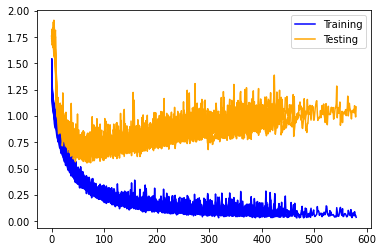

In [14]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

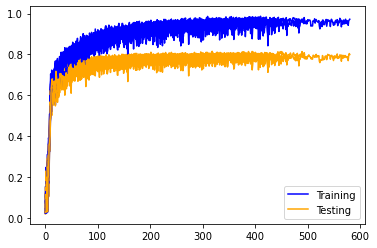

In [15]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

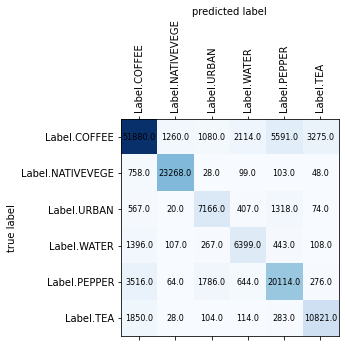

In [16]:
plot_confusion_matrix(conf_matrix, labels)

In [17]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.8651425  0.94023518 0.6869907  0.65449524 0.72217435 0.74106287]
Mean precision:  0.7683501396721698

Recalls:  [0.79570552 0.95737327 0.75020938 0.73383028 0.76189394 0.81977273]
Mean recall:  0.8031308525820539

F-Score:  [0.82897249 0.94872684 0.71720963 0.69189598 0.74150262 0.77843321]
Mean f-score:  0.7844567938433126


# COASTAL_AEROSOL, BLUE, GREEN, RED, NIR, SWIR1, SWIR2

In [18]:
bands = [
    Band.COASTAL_AEROSOL.value, 
    Band.BLUE.value, 
    Band.GREEN.value, 
    Band.RED.value, 
    Band.NIR.value, 
    Band.SWIR1.value, 
    Band.SWIR2.value, 
]

model_name = "coastal_aerosol_blue_green_red_nir_swir1_swir2"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_2 (Rescaling)      (None, 9, 9, 7)           0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 9, 9, 7)           28        
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 9, 9, 32)          2048      
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 3, 3, 64)         

57/57 [==============================] - 0s 8ms/step - loss: 0.2823 - accuracy: 0.8352 - val_loss: 0.6572 - val_accuracy: 0.7747
Epoch 101/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2562 - accuracy: 0.8431 - val_loss: 0.6929 - val_accuracy: 0.7782
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2597 - accuracy: 0.8453 - val_loss: 0.6997 - val_accuracy: 0.7778
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2748 - accuracy: 0.8392 - val_loss: 0.8080 - val_accuracy: 0.7348
Epoch 104/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2780 - accuracy: 0.8280 - val_loss: 0.7611 - val_accuracy: 0.7637
Epoch 105/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2379 - accuracy: 0.8520 - val_loss: 0.6709 - val_accuracy: 0.7714
Epoch 106/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2559 - accuracy: 0.8560 - val_loss: 0.7298 - val_accuracy: 0.7477
Epoch 1

Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1566 - accuracy: 0.8975 - val_loss: 0.8055 - val_accuracy: 0.7835
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1748 - accuracy: 0.9006 - val_loss: 0.8318 - val_accuracy: 0.7670
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2051 - accuracy: 0.8834 - val_loss: 0.7843 - val_accuracy: 0.7769
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2026 - accuracy: 0.8695 - val_loss: 0.7755 - val_accuracy: 0.7865
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2200 - accuracy: 0.8776 - val_loss: 0.7541 - val_accuracy: 0.7592
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2414 - accuracy: 0.8573 - val_loss: 0.6989 - val_accuracy: 0.7804
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1995 - accuracy: 0.8961 - val_loss: 0.7610 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2068 - accuracy: 0.8738 - val_loss: 0.7885 - val_accuracy: 0.7793
Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1339 - accuracy: 0.9008 - val_loss: 0.7756 - val_accuracy: 0.7974
Epoch 216/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1239 - accuracy: 0.9314 - val_loss: 0.7971 - val_accuracy: 0.7974
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1224 - accuracy: 0.9382 - val_loss: 0.8077 - val_accuracy: 0.7913
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1225 - accuracy: 0.9297 - val_loss: 0.7921 - val_accuracy: 0.7922
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1172 - accuracy: 0.9342 - val_loss: 0.8864 - val_accuracy: 0.7789
Epoch 220/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1012 - accuracy: 0.9267 - val_loss: 0.7986 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1066 - accuracy: 0.9408 - val_loss: 0.9629 - val_accuracy: 0.7789
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1181 - accuracy: 0.9267 - val_loss: 0.9272 - val_accuracy: 0.7951
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0939 - accuracy: 0.9432 - val_loss: 0.9002 - val_accuracy: 0.8013
Epoch 274/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1174 - accuracy: 0.9423 - val_loss: 0.8632 - val_accuracy: 0.8123
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1423 - accuracy: 0.9173 - val_loss: 0.9023 - val_accuracy: 0.7963
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1218 - accuracy: 0.9387 - val_loss: 0.9907 - val_accuracy: 0.7879
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1142 - accuracy: 0.9381 - val_loss: 0.9570 - val_accuracy

Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0945 - accuracy: 0.9398 - val_loss: 0.9224 - val_accuracy: 0.7968
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1131 - accuracy: 0.9381 - val_loss: 0.9113 - val_accuracy: 0.7812
Epoch 330/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1395 - accuracy: 0.9293 - val_loss: 1.0022 - val_accuracy: 0.7887
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0952 - accuracy: 0.9398 - val_loss: 0.9528 - val_accuracy: 0.7999
Epoch 332/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1113 - accuracy: 0.9424 - val_loss: 0.9240 - val_accuracy: 0.8021
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0701 - accuracy: 0.9496 - val_loss: 1.0506 - val_accuracy: 0.7913
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0958 - accuracy: 0.9385 - val_loss: 0.9296 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.4102 - accuracy: 0.7825 - val_loss: 0.8345 - val_accuracy: 0.6941
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3686 - accuracy: 0.7786 - val_loss: 0.7399 - val_accuracy: 0.7295
Epoch 69/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3643 - accuracy: 0.7820 - val_loss: 0.7754 - val_accuracy: 0.7293
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3621 - accuracy: 0.8004 - val_loss: 0.6846 - val_accuracy: 0.7565
Epoch 71/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3622 - accuracy: 0.7944 - val_loss: 0.6519 - val_accuracy: 0.7647
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3718 - accuracy: 0.8056 - val_loss: 0.6473 - val_accuracy: 0.7814
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3539 - accuracy: 0.8257 - val_loss: 0.6813 - val_accuracy: 0.7582
Epoch 74/2000

Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1254 - accuracy: 0.9178 - val_loss: 0.7584 - val_accuracy: 0.7988
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1573 - accuracy: 0.9010 - val_loss: 0.7870 - val_accuracy: 0.7943
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1712 - accuracy: 0.9013 - val_loss: 0.7936 - val_accuracy: 0.7932
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1481 - accuracy: 0.9015 - val_loss: 0.8596 - val_accuracy: 0.7861
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1932 - accuracy: 0.8892 - val_loss: 0.8070 - val_accuracy: 0.7887
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1781 - accuracy: 0.8702 - val_loss: 0.7541 - val_accuracy: 0.7971
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1273 - accuracy: 0.9173 - val_loss: 0.8221 - val_accuracy:

Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1144 - accuracy: 0.9291 - val_loss: 0.8940 - val_accuracy: 0.7840
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0974 - accuracy: 0.9414 - val_loss: 0.8571 - val_accuracy: 0.8092
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0874 - accuracy: 0.9423 - val_loss: 0.8823 - val_accuracy: 0.8125
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1040 - accuracy: 0.9411 - val_loss: 0.9137 - val_accuracy: 0.8031
Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1204 - accuracy: 0.9338 - val_loss: 0.8323 - val_accuracy: 0.8133
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1252 - accuracy: 0.9262 - val_loss: 0.8867 - val_accuracy: 0.8068
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1125 - accuracy: 0.9335 - val_loss: 0.8688 - val_accuracy:

Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0889 - accuracy: 0.9420 - val_loss: 0.9856 - val_accuracy: 0.7948
Epoch 296/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1248 - accuracy: 0.9307 - val_loss: 0.8562 - val_accuracy: 0.8146
Epoch 297/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1267 - accuracy: 0.9271 - val_loss: 0.8864 - val_accuracy: 0.8122
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1083 - accuracy: 0.9341 - val_loss: 0.9025 - val_accuracy: 0.8016
Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0927 - accuracy: 0.9361 - val_loss: 0.9140 - val_accuracy: 0.8161
Epoch 300/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0949 - accuracy: 0.9339 - val_loss: 0.9483 - val_accuracy: 0.7996
Epoch 301/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0841 - accuracy: 0.9457 - val_loss: 0.9505 - val_accuracy

Epoch 352/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0757 - accuracy: 0.9565 - val_loss: 0.9625 - val_accuracy: 0.8134
Epoch 353/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1389 - accuracy: 0.9375 - val_loss: 0.8969 - val_accuracy: 0.7836
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1704 - accuracy: 0.9062 - val_loss: 0.9001 - val_accuracy: 0.7985
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1050 - accuracy: 0.9358 - val_loss: 0.9285 - val_accuracy: 0.8066
Epoch 356/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1080 - accuracy: 0.9369 - val_loss: 0.8689 - val_accuracy: 0.8114
Epoch 357/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0860 - accuracy: 0.9504 - val_loss: 0.9059 - val_accuracy: 0.8114
Epoch 358/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0804 - accuracy: 0.9587 - val_loss: 0.9828 - val_accuracy

Epoch 409/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0740 - accuracy: 0.9475 - val_loss: 0.9663 - val_accuracy: 0.8050
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0925 - accuracy: 0.9377 - val_loss: 0.9243 - val_accuracy: 0.8130
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0608 - accuracy: 0.9648 - val_loss: 0.9574 - val_accuracy: 0.8126
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0799 - accuracy: 0.9561 - val_loss: 1.0609 - val_accuracy: 0.7941
Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1472 - accuracy: 0.9291 - val_loss: 0.9874 - val_accuracy: 0.8070
Epoch 414/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0636 - accuracy: 0.9676 - val_loss: 1.0190 - val_accuracy: 0.8083
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0735 - accuracy: 0.9604 - val_loss: 0.9841 - val_accuracy:

Epoch 466/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1019 - accuracy: 0.9463 - val_loss: 1.0490 - val_accuracy: 0.8148
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0487 - accuracy: 0.9697 - val_loss: 1.0710 - val_accuracy: 0.8152
Epoch 468/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0574 - accuracy: 0.9615 - val_loss: 1.0440 - val_accuracy: 0.8183
Epoch 469/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0395 - accuracy: 0.9836 - val_loss: 1.1430 - val_accuracy: 0.7944
Epoch 470/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0973 - accuracy: 0.9550 - val_loss: 1.1869 - val_accuracy: 0.7945
Epoch 471/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0717 - accuracy: 0.9502 - val_loss: 1.0216 - val_accuracy: 0.8081
Epoch 472/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0501 - accuracy: 0.9674 - val_loss: 1.1070 - val_accuracy:

Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4926 - accuracy: 0.7558 - val_loss: 0.7423 - val_accuracy: 0.7175
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4463 - accuracy: 0.7670 - val_loss: 0.7430 - val_accuracy: 0.7145
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4590 - accuracy: 0.7706 - val_loss: 0.7272 - val_accuracy: 0.7244
Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4485 - accuracy: 0.7652 - val_loss: 0.8331 - val_accuracy: 0.6541
Epoch 50/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5662 - accuracy: 0.7134 - val_loss: 0.7982 - val_accuracy: 0.6968
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4728 - accuracy: 0.7373 - val_loss: 0.7351 - val_accuracy: 0.7253
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4739 - accuracy: 0.7449 - val_loss: 0.7648 - val_accuracy: 0.7137

Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2143 - accuracy: 0.8614 - val_loss: 0.6685 - val_accuracy: 0.7956
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1852 - accuracy: 0.8849 - val_loss: 0.6801 - val_accuracy: 0.7982
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1667 - accuracy: 0.8888 - val_loss: 0.7039 - val_accuracy: 0.7840
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1875 - accuracy: 0.8914 - val_loss: 0.7676 - val_accuracy: 0.7890
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1985 - accuracy: 0.8799 - val_loss: 0.6830 - val_accuracy: 0.7850
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2093 - accuracy: 0.8872 - val_loss: 0.7164 - val_accuracy: 0.7912
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2002 - accuracy: 0.8819 - val_loss: 0.6802 - val_accuracy:

Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1707 - accuracy: 0.8969 - val_loss: 0.8118 - val_accuracy: 0.7735
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1764 - accuracy: 0.8991 - val_loss: 0.7852 - val_accuracy: 0.7875
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1299 - accuracy: 0.9031 - val_loss: 0.7206 - val_accuracy: 0.7950
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1580 - accuracy: 0.9057 - val_loss: 0.9833 - val_accuracy: 0.7662
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1797 - accuracy: 0.9040 - val_loss: 0.7930 - val_accuracy: 0.7864
Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1259 - accuracy: 0.9194 - val_loss: 0.7375 - val_accuracy: 0.7941
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1546 - accuracy: 0.9141 - val_loss: 0.8231 - val_accuracy:

Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0914 - accuracy: 0.9341 - val_loss: 0.8988 - val_accuracy: 0.7871
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1470 - accuracy: 0.9105 - val_loss: 0.7823 - val_accuracy: 0.8013
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0901 - accuracy: 0.9333 - val_loss: 0.7508 - val_accuracy: 0.8144
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1203 - accuracy: 0.9324 - val_loss: 0.8418 - val_accuracy: 0.8066
Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1050 - accuracy: 0.9255 - val_loss: 0.8405 - val_accuracy: 0.8042
Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1173 - accuracy: 0.9326 - val_loss: 0.8373 - val_accuracy: 0.8062
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1419 - accuracy: 0.9233 - val_loss: 0.8561 - val_accuracy:

Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0737 - accuracy: 0.9503 - val_loss: 0.8445 - val_accuracy: 0.8059
Epoch 332/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0763 - accuracy: 0.9497 - val_loss: 0.9354 - val_accuracy: 0.7841
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1221 - accuracy: 0.9302 - val_loss: 0.8975 - val_accuracy: 0.8031
Epoch 334/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0734 - accuracy: 0.9555 - val_loss: 0.9482 - val_accuracy: 0.7969
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0986 - accuracy: 0.9412 - val_loss: 0.9490 - val_accuracy: 0.7948
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0892 - accuracy: 0.9472 - val_loss: 0.8626 - val_accuracy: 0.8104
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0973 - accuracy: 0.9448 - val_loss: 0.9057 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.3067 - accuracy: 0.8291 - val_loss: 0.7090 - val_accuracy: 0.7385
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3498 - accuracy: 0.8058 - val_loss: 0.7994 - val_accuracy: 0.7100
Epoch 70/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4256 - accuracy: 0.7861 - val_loss: 0.7018 - val_accuracy: 0.7399
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3341 - accuracy: 0.8013 - val_loss: 0.6853 - val_accuracy: 0.7549
Epoch 72/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3737 - accuracy: 0.7994 - val_loss: 0.7287 - val_accuracy: 0.7276
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3422 - accuracy: 0.8363 - val_loss: 0.7152 - val_accuracy: 0.7427
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3595 - accuracy: 0.7859 - val_loss: 0.7001 - val_accuracy: 0.7468
Epoch 75/2000

Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1914 - accuracy: 0.8922 - val_loss: 0.8199 - val_accuracy: 0.7381
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2181 - accuracy: 0.8487 - val_loss: 0.7505 - val_accuracy: 0.7830
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1457 - accuracy: 0.9107 - val_loss: 0.8677 - val_accuracy: 0.7726
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1759 - accuracy: 0.8907 - val_loss: 0.7474 - val_accuracy: 0.8066
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1417 - accuracy: 0.9152 - val_loss: 0.8032 - val_accuracy: 0.7950
Epoch 187/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1072 - accuracy: 0.9294 - val_loss: 0.8262 - val_accuracy: 0.7916
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1692 - accuracy: 0.9180 - val_loss: 0.8356 - val_accuracy:

Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1057 - accuracy: 0.9365 - val_loss: 0.8147 - val_accuracy: 0.8142
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1116 - accuracy: 0.9407 - val_loss: 0.9127 - val_accuracy: 0.7836
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1299 - accuracy: 0.9338 - val_loss: 0.8748 - val_accuracy: 0.7963
Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1235 - accuracy: 0.9334 - val_loss: 0.8492 - val_accuracy: 0.8097
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1176 - accuracy: 0.9348 - val_loss: 0.8972 - val_accuracy: 0.7827
Epoch 244/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1179 - accuracy: 0.9200 - val_loss: 0.8693 - val_accuracy: 0.8019
Epoch 245/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0957 - accuracy: 0.9393 - val_loss: 0.8755 - val_accuracy:

Epoch 296/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1273 - accuracy: 0.9307 - val_loss: 0.9158 - val_accuracy: 0.7918
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1018 - accuracy: 0.9318 - val_loss: 0.8812 - val_accuracy: 0.7986
Epoch 298/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0778 - accuracy: 0.9532 - val_loss: 0.8892 - val_accuracy: 0.8059
Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0855 - accuracy: 0.9520 - val_loss: 0.9600 - val_accuracy: 0.8046
Epoch 300/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0764 - accuracy: 0.9586 - val_loss: 0.9027 - val_accuracy: 0.7978
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0631 - accuracy: 0.9618 - val_loss: 0.9721 - val_accuracy: 0.8088
Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0883 - accuracy: 0.9522 - val_loss: 1.0123 - val_accuracy:

Epoch 353/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1267 - accuracy: 0.9379 - val_loss: 1.0029 - val_accuracy: 0.7907
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0807 - accuracy: 0.9431 - val_loss: 0.9524 - val_accuracy: 0.8172
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0723 - accuracy: 0.9623 - val_loss: 1.1156 - val_accuracy: 0.7983
Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1068 - accuracy: 0.9372 - val_loss: 1.0225 - val_accuracy: 0.8009
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1284 - accuracy: 0.9402 - val_loss: 0.9452 - val_accuracy: 0.7948
Epoch 358/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1201 - accuracy: 0.9341 - val_loss: 1.0160 - val_accuracy: 0.7955
Epoch 359/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0951 - accuracy: 0.9467 - val_loss: 1.0042 - val_accuracy:

Epoch 410/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0626 - accuracy: 0.9660 - val_loss: 1.0141 - val_accuracy: 0.7985
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0605 - accuracy: 0.9586 - val_loss: 1.0347 - val_accuracy: 0.7864
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1014 - accuracy: 0.9482 - val_loss: 1.0713 - val_accuracy: 0.7969
Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1207 - accuracy: 0.9338 - val_loss: 1.1012 - val_accuracy: 0.7601
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1333 - accuracy: 0.9261 - val_loss: 0.9706 - val_accuracy: 0.7960
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0862 - accuracy: 0.9472 - val_loss: 0.9526 - val_accuracy: 0.8045
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0694 - accuracy: 0.9595 - val_loss: 0.9577 - val_accuracy:

Epoch 467/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0798 - accuracy: 0.9513 - val_loss: 0.9539 - val_accuracy: 0.8169
Epoch 468/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0632 - accuracy: 0.9632 - val_loss: 1.1369 - val_accuracy: 0.7954
Epoch 469/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0931 - accuracy: 0.9440 - val_loss: 1.0205 - val_accuracy: 0.8012
Epoch 470/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0564 - accuracy: 0.9626 - val_loss: 1.0903 - val_accuracy: 0.8104
Epoch 471/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0655 - accuracy: 0.9695 - val_loss: 1.0764 - val_accuracy: 0.8051
Epoch 472/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0589 - accuracy: 0.9603 - val_loss: 1.1309 - val_accuracy: 0.8023
Epoch 473/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0598 - accuracy: 0.9607 - val_loss: 0.9981 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.3447 - accuracy: 0.8065 - val_loss: 0.6508 - val_accuracy: 0.7758
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3691 - accuracy: 0.8148 - val_loss: 0.7086 - val_accuracy: 0.7487
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2986 - accuracy: 0.8206 - val_loss: 0.6517 - val_accuracy: 0.7757
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3765 - accuracy: 0.8183 - val_loss: 0.6873 - val_accuracy: 0.7583
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3383 - accuracy: 0.8410 - val_loss: 0.6274 - val_accuracy: 0.7804
Epoch 76/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3611 - accuracy: 0.8321 - val_loss: 0.7536 - val_accuracy: 0.7362
Epoch 77/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3561 - accuracy: 0.8077 - val_loss: 0.6360 - val_accuracy: 0.7779
Epoch 78/2000

Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1532 - accuracy: 0.9075 - val_loss: 0.7969 - val_accuracy: 0.7963
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1741 - accuracy: 0.9124 - val_loss: 0.7954 - val_accuracy: 0.7827
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1606 - accuracy: 0.8962 - val_loss: 0.8105 - val_accuracy: 0.7755
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2095 - accuracy: 0.8903 - val_loss: 0.7452 - val_accuracy: 0.7943
Epoch 189/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1229 - accuracy: 0.9201 - val_loss: 0.7785 - val_accuracy: 0.7996
Epoch 190/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1071 - accuracy: 0.9299 - val_loss: 0.8114 - val_accuracy: 0.8002
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1236 - accuracy: 0.9245 - val_loss: 0.8262 - val_accuracy:

Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1033 - accuracy: 0.9381 - val_loss: 0.8816 - val_accuracy: 0.7903
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1460 - accuracy: 0.9159 - val_loss: 0.8552 - val_accuracy: 0.8076
Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1090 - accuracy: 0.9350 - val_loss: 0.8736 - val_accuracy: 0.7955
Epoch 245/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1028 - accuracy: 0.9395 - val_loss: 0.9802 - val_accuracy: 0.7848
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1148 - accuracy: 0.9269 - val_loss: 0.9117 - val_accuracy: 0.7947
Epoch 247/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1226 - accuracy: 0.9343 - val_loss: 1.0069 - val_accuracy: 0.7682
Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1637 - accuracy: 0.9003 - val_loss: 0.8643 - val_accuracy:

Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1210 - accuracy: 0.9229 - val_loss: 0.9067 - val_accuracy: 0.7935
Epoch 300/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1150 - accuracy: 0.9294 - val_loss: 0.9150 - val_accuracy: 0.8009
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0789 - accuracy: 0.9426 - val_loss: 0.8776 - val_accuracy: 0.7997
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0851 - accuracy: 0.9578 - val_loss: 0.9427 - val_accuracy: 0.8062
Epoch 303/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0876 - accuracy: 0.9450 - val_loss: 0.9459 - val_accuracy: 0.8149
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0894 - accuracy: 0.9573 - val_loss: 0.9516 - val_accuracy: 0.8026
Epoch 305/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0771 - accuracy: 0.9490 - val_loss: 1.0409 - val_accuracy:

Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1423 - accuracy: 0.9165 - val_loss: 0.9700 - val_accuracy: 0.7931
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0647 - accuracy: 0.9515 - val_loss: 0.9825 - val_accuracy: 0.8030
Epoch 358/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0750 - accuracy: 0.9481 - val_loss: 1.0382 - val_accuracy: 0.7899
Epoch 359/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1075 - accuracy: 0.9566 - val_loss: 1.0854 - val_accuracy: 0.7864
Epoch 360/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0903 - accuracy: 0.9418 - val_loss: 0.9774 - val_accuracy: 0.8036
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0956 - accuracy: 0.9400 - val_loss: 1.2351 - val_accuracy: 0.7743
Epoch 362/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1473 - accuracy: 0.9276 - val_loss: 0.9880 - val_accuracy:

Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0686 - accuracy: 0.9663 - val_loss: 0.9607 - val_accuracy: 0.8134
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0603 - accuracy: 0.9672 - val_loss: 0.9889 - val_accuracy: 0.8089
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0483 - accuracy: 0.9630 - val_loss: 1.0101 - val_accuracy: 0.8099
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0806 - accuracy: 0.9619 - val_loss: 1.0265 - val_accuracy: 0.8038
Epoch 417/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0611 - accuracy: 0.9642 - val_loss: 1.0392 - val_accuracy: 0.8031
Epoch 418/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0652 - accuracy: 0.9653 - val_loss: 1.0259 - val_accuracy: 0.7926
Epoch 419/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1148 - accuracy: 0.9441 - val_loss: 0.9889 - val_accuracy:

Epoch 32/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6266 - accuracy: 0.6836 - val_loss: 0.8138 - val_accuracy: 0.6763
Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5769 - accuracy: 0.6721 - val_loss: 0.8357 - val_accuracy: 0.6621
Epoch 34/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6001 - accuracy: 0.6811 - val_loss: 0.7157 - val_accuracy: 0.7215
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5707 - accuracy: 0.7077 - val_loss: 0.8481 - val_accuracy: 0.6653
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6035 - accuracy: 0.6748 - val_loss: 0.7255 - val_accuracy: 0.7127
Epoch 37/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5455 - accuracy: 0.7125 - val_loss: 0.7791 - val_accuracy: 0.6949
Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5311 - accuracy: 0.7155 - val_loss: 0.7514 - val_accuracy: 0.6992

57/57 [==============================] - 0s 8ms/step - loss: 0.2268 - accuracy: 0.8619 - val_loss: 0.6884 - val_accuracy: 0.7822
Epoch 147/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2396 - accuracy: 0.8667 - val_loss: 0.8882 - val_accuracy: 0.7056
Epoch 148/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2681 - accuracy: 0.8186 - val_loss: 0.7184 - val_accuracy: 0.7663
Epoch 149/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2272 - accuracy: 0.8571 - val_loss: 0.7588 - val_accuracy: 0.7647
Epoch 150/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2121 - accuracy: 0.8506 - val_loss: 0.8080 - val_accuracy: 0.7541
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2158 - accuracy: 0.8550 - val_loss: 0.8169 - val_accuracy: 0.7531
Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2789 - accuracy: 0.8552 - val_loss: 0.6830 - val_accuracy: 0.7725
Epoch 1

Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2037 - accuracy: 0.8619 - val_loss: 0.7976 - val_accuracy: 0.7693
Epoch 204/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2013 - accuracy: 0.8758 - val_loss: 0.7753 - val_accuracy: 0.7606
Epoch 205/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1791 - accuracy: 0.8919 - val_loss: 0.7585 - val_accuracy: 0.7849
Epoch 206/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1451 - accuracy: 0.9010 - val_loss: 0.7335 - val_accuracy: 0.8018
Epoch 207/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1938 - accuracy: 0.9051 - val_loss: 0.7455 - val_accuracy: 0.7999
Epoch 208/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1739 - accuracy: 0.8984 - val_loss: 0.8511 - val_accuracy: 0.7632
Epoch 209/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2143 - accuracy: 0.8748 - val_loss: 0.8038 - val_accuracy:

Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1601 - accuracy: 0.9068 - val_loss: 0.8453 - val_accuracy: 0.7841
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1526 - accuracy: 0.9050 - val_loss: 0.8091 - val_accuracy: 0.7922
Epoch 262/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1360 - accuracy: 0.9150 - val_loss: 0.8447 - val_accuracy: 0.7967
Epoch 263/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2067 - accuracy: 0.8890 - val_loss: 0.8180 - val_accuracy: 0.7865
Epoch 264/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1382 - accuracy: 0.9195 - val_loss: 0.8094 - val_accuracy: 0.7907
Epoch 265/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1248 - accuracy: 0.9173 - val_loss: 0.8195 - val_accuracy: 0.8077
Epoch 266/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1247 - accuracy: 0.9331 - val_loss: 0.8425 - val_accuracy:

Epoch 317/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1519 - accuracy: 0.9274 - val_loss: 0.8465 - val_accuracy: 0.7948
Epoch 318/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1088 - accuracy: 0.9314 - val_loss: 0.8786 - val_accuracy: 0.7875
Epoch 319/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1032 - accuracy: 0.9377 - val_loss: 0.8614 - val_accuracy: 0.7961
Epoch 320/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1275 - accuracy: 0.9305 - val_loss: 0.8437 - val_accuracy: 0.8044
Epoch 321/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0950 - accuracy: 0.9306 - val_loss: 0.8985 - val_accuracy: 0.7961
Epoch 322/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1226 - accuracy: 0.9339 - val_loss: 0.9103 - val_accuracy: 0.7937
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1408 - accuracy: 0.9300 - val_loss: 0.9109 - val_accuracy:

Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0891 - accuracy: 0.9459 - val_loss: 0.9162 - val_accuracy: 0.8029
Epoch 375/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0894 - accuracy: 0.9439 - val_loss: 0.9386 - val_accuracy: 0.8094
Epoch 376/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0954 - accuracy: 0.9534 - val_loss: 0.9535 - val_accuracy: 0.8085
Epoch 377/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0666 - accuracy: 0.9546 - val_loss: 0.9550 - val_accuracy: 0.7989
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0731 - accuracy: 0.9493 - val_loss: 0.9756 - val_accuracy: 0.8130
Epoch 379/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0707 - accuracy: 0.9484 - val_loss: 0.9764 - val_accuracy: 0.7959
Epoch 380/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1014 - accuracy: 0.9405 - val_loss: 1.0269 - val_accuracy:

Epoch 431/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0929 - accuracy: 0.9392 - val_loss: 0.9607 - val_accuracy: 0.7918
Epoch 432/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1278 - accuracy: 0.9353 - val_loss: 0.9014 - val_accuracy: 0.8005
Epoch 433/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0872 - accuracy: 0.9448 - val_loss: 0.9077 - val_accuracy: 0.7949
Epoch 434/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0726 - accuracy: 0.9588 - val_loss: 0.9527 - val_accuracy: 0.8043
Epoch 435/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0762 - accuracy: 0.9574 - val_loss: 0.9941 - val_accuracy: 0.7891
Epoch 436/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1050 - accuracy: 0.9372 - val_loss: 0.8858 - val_accuracy: 0.8024
Epoch 437/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0857 - accuracy: 0.9486 - val_loss: 0.8813 - val_accuracy:

Epoch 488/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1138 - accuracy: 0.9487 - val_loss: 0.9837 - val_accuracy: 0.8032
Epoch 489/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1196 - accuracy: 0.9355 - val_loss: 1.0159 - val_accuracy: 0.7963
Epoch 490/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0905 - accuracy: 0.9383 - val_loss: 0.9518 - val_accuracy: 0.7972
Epoch 491/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1158 - accuracy: 0.9397 - val_loss: 0.9181 - val_accuracy: 0.7842
Epoch 492/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0807 - accuracy: 0.9443 - val_loss: 0.9429 - val_accuracy: 0.7926
Epoch 493/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0684 - accuracy: 0.9530 - val_loss: 0.9628 - val_accuracy: 0.7995
Epoch 494/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1118 - accuracy: 0.9552 - val_loss: 1.0032 - val_accuracy:

Epoch 545/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0872 - accuracy: 0.9483 - val_loss: 1.0830 - val_accuracy: 0.7952
Epoch 546/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0660 - accuracy: 0.9630 - val_loss: 1.0550 - val_accuracy: 0.8096
Epoch 547/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0745 - accuracy: 0.9508 - val_loss: 1.1121 - val_accuracy: 0.7913
Epoch 548/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0718 - accuracy: 0.9482 - val_loss: 1.0318 - val_accuracy: 0.8054
Epoch 549/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0610 - accuracy: 0.9628 - val_loss: 1.0500 - val_accuracy: 0.8127
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0519 - accuracy: 0.9672 - val_loss: 1.0405 - val_accuracy: 0.8151
Epoch 551/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0950 - accuracy: 0.9462 - val_loss: 1.0678 - val_accuracy:

Epoch 602/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1219 - accuracy: 0.9278 - val_loss: 0.9945 - val_accuracy: 0.7972
Epoch 603/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9384 - val_loss: 0.9358 - val_accuracy: 0.8062
Epoch 604/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0608 - accuracy: 0.9622 - val_loss: 1.0124 - val_accuracy: 0.8122
Epoch 605/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0475 - accuracy: 0.9660 - val_loss: 1.0497 - val_accuracy: 0.8025
Epoch 606/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0890 - accuracy: 0.9666 - val_loss: 1.1077 - val_accuracy: 0.7911
Epoch 607/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0723 - accuracy: 0.9632 - val_loss: 1.0227 - val_accuracy: 0.8092
Epoch 608/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0661 - accuracy: 0.9624 - val_loss: 1.0237 - val_accuracy:

Epoch 20/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8078 - accuracy: 0.5889 - val_loss: 0.9033 - val_accuracy: 0.6457
Epoch 21/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7399 - accuracy: 0.6388 - val_loss: 0.8780 - val_accuracy: 0.6664
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7173 - accuracy: 0.6556 - val_loss: 0.8431 - val_accuracy: 0.6751
Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7285 - accuracy: 0.6647 - val_loss: 0.9220 - val_accuracy: 0.6493
Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6902 - accuracy: 0.6758 - val_loss: 0.8111 - val_accuracy: 0.6830
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6505 - accuracy: 0.6784 - val_loss: 0.8634 - val_accuracy: 0.6655
Epoch 26/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6605 - accuracy: 0.6749 - val_loss: 0.8967 - val_accuracy: 0.6431

57/57 [==============================] - 0s 7ms/step - loss: 0.2030 - accuracy: 0.8836 - val_loss: 0.6894 - val_accuracy: 0.7959
Epoch 135/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2462 - accuracy: 0.8556 - val_loss: 0.7415 - val_accuracy: 0.7728
Epoch 136/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2285 - accuracy: 0.8642 - val_loss: 0.6884 - val_accuracy: 0.7963
Epoch 137/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1930 - accuracy: 0.8871 - val_loss: 0.7891 - val_accuracy: 0.7620
Epoch 138/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2916 - accuracy: 0.8098 - val_loss: 0.6873 - val_accuracy: 0.8030
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1759 - accuracy: 0.8942 - val_loss: 0.7225 - val_accuracy: 0.7884
Epoch 140/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2216 - accuracy: 0.8729 - val_loss: 0.8002 - val_accuracy: 0.7787
Epoch 1

Epoch 191/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1144 - accuracy: 0.9239 - val_loss: 0.8637 - val_accuracy: 0.7905
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1377 - accuracy: 0.9176 - val_loss: 0.8451 - val_accuracy: 0.8088
Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1208 - accuracy: 0.9267 - val_loss: 0.8302 - val_accuracy: 0.7884
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1878 - accuracy: 0.8826 - val_loss: 0.8222 - val_accuracy: 0.7990
Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1720 - accuracy: 0.8970 - val_loss: 0.8239 - val_accuracy: 0.8053
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1514 - accuracy: 0.9126 - val_loss: 0.7786 - val_accuracy: 0.8111
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1530 - accuracy: 0.9136 - val_loss: 0.8241 - val_accuracy:

Epoch 248/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1538 - accuracy: 0.9141 - val_loss: 0.8768 - val_accuracy: 0.7922
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1113 - accuracy: 0.9325 - val_loss: 0.8236 - val_accuracy: 0.8153
Epoch 250/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1032 - accuracy: 0.9324 - val_loss: 0.8791 - val_accuracy: 0.8046
Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1199 - accuracy: 0.9127 - val_loss: 0.8485 - val_accuracy: 0.8023
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1362 - accuracy: 0.9166 - val_loss: 0.7727 - val_accuracy: 0.8150
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0974 - accuracy: 0.9352 - val_loss: 0.9576 - val_accuracy: 0.7948
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1689 - accuracy: 0.9064 - val_loss: 0.7872 - val_accuracy:

Epoch 305/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1440 - accuracy: 0.9261 - val_loss: 0.9060 - val_accuracy: 0.7958
Epoch 306/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1360 - accuracy: 0.9265 - val_loss: 0.8076 - val_accuracy: 0.8089
Epoch 307/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0701 - accuracy: 0.9525 - val_loss: 0.8525 - val_accuracy: 0.8230
Epoch 308/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0964 - accuracy: 0.9481 - val_loss: 0.9110 - val_accuracy: 0.8069
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0899 - accuracy: 0.9352 - val_loss: 0.8813 - val_accuracy: 0.8215
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1032 - accuracy: 0.9350 - val_loss: 0.9141 - val_accuracy: 0.7964
Epoch 311/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1143 - accuracy: 0.9282 - val_loss: 0.8114 - val_accuracy:

Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0851 - accuracy: 0.9462 - val_loss: 1.0039 - val_accuracy: 0.7997
Epoch 363/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0792 - accuracy: 0.9485 - val_loss: 0.9035 - val_accuracy: 0.8119
Epoch 364/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1157 - accuracy: 0.9288 - val_loss: 0.9052 - val_accuracy: 0.8182
Epoch 365/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1278 - accuracy: 0.9512 - val_loss: 0.8586 - val_accuracy: 0.8076
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0970 - accuracy: 0.9331 - val_loss: 0.8865 - val_accuracy: 0.8224
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0941 - accuracy: 0.9379 - val_loss: 0.8924 - val_accuracy: 0.8196
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0763 - accuracy: 0.9533 - val_loss: 0.9295 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.3514 - accuracy: 0.8090 - val_loss: 0.7083 - val_accuracy: 0.7518
Epoch 64/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3912 - accuracy: 0.7882 - val_loss: 0.8949 - val_accuracy: 0.6674
Epoch 65/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3872 - accuracy: 0.7673 - val_loss: 0.7851 - val_accuracy: 0.7141
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4108 - accuracy: 0.7951 - val_loss: 0.7099 - val_accuracy: 0.7458
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3211 - accuracy: 0.8187 - val_loss: 0.8582 - val_accuracy: 0.6861
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3859 - accuracy: 0.7715 - val_loss: 0.7559 - val_accuracy: 0.7245
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3453 - accuracy: 0.7993 - val_loss: 0.7186 - val_accuracy: 0.7435
Epoch 70/2000

Epoch 177/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1859 - accuracy: 0.8972 - val_loss: 0.7522 - val_accuracy: 0.7983
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1862 - accuracy: 0.9099 - val_loss: 0.7529 - val_accuracy: 0.7993
Epoch 179/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1399 - accuracy: 0.9112 - val_loss: 0.7595 - val_accuracy: 0.7888
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1423 - accuracy: 0.9149 - val_loss: 0.7906 - val_accuracy: 0.7799
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1527 - accuracy: 0.9040 - val_loss: 0.7701 - val_accuracy: 0.7902
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1539 - accuracy: 0.9061 - val_loss: 0.9075 - val_accuracy: 0.7736
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1893 - accuracy: 0.8898 - val_loss: 0.8281 - val_accuracy:

Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1235 - accuracy: 0.9256 - val_loss: 0.8147 - val_accuracy: 0.8050
Epoch 235/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1683 - accuracy: 0.9104 - val_loss: 0.7792 - val_accuracy: 0.7983
Epoch 236/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1469 - accuracy: 0.9248 - val_loss: 0.8460 - val_accuracy: 0.7831
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1363 - accuracy: 0.9170 - val_loss: 0.7846 - val_accuracy: 0.8074
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1108 - accuracy: 0.9275 - val_loss: 0.8283 - val_accuracy: 0.7956
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1207 - accuracy: 0.9331 - val_loss: 0.9207 - val_accuracy: 0.7670
Epoch 240/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1331 - accuracy: 0.9169 - val_loss: 0.8581 - val_accuracy

Epoch 291/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1362 - accuracy: 0.9229 - val_loss: 0.9370 - val_accuracy: 0.7912
Epoch 292/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1206 - accuracy: 0.9312 - val_loss: 0.8088 - val_accuracy: 0.8028
Epoch 293/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1241 - accuracy: 0.9220 - val_loss: 0.8964 - val_accuracy: 0.7993
Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1628 - accuracy: 0.9138 - val_loss: 0.8045 - val_accuracy: 0.8038
Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0942 - accuracy: 0.9399 - val_loss: 0.8677 - val_accuracy: 0.8011
Epoch 296/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0943 - accuracy: 0.9376 - val_loss: 0.8470 - val_accuracy: 0.8011
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0781 - accuracy: 0.9465 - val_loss: 0.8775 - val_accuracy:

Epoch 348/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1859 - accuracy: 0.9077 - val_loss: 0.8355 - val_accuracy: 0.7945
Epoch 349/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0843 - accuracy: 0.9470 - val_loss: 0.9080 - val_accuracy: 0.8121
Epoch 350/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1054 - accuracy: 0.9457 - val_loss: 0.9201 - val_accuracy: 0.7871
Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0890 - accuracy: 0.9362 - val_loss: 0.8429 - val_accuracy: 0.8129
Epoch 352/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0764 - accuracy: 0.9525 - val_loss: 0.9129 - val_accuracy: 0.8122
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0865 - accuracy: 0.9478 - val_loss: 0.8736 - val_accuracy: 0.8118
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0855 - accuracy: 0.9523 - val_loss: 0.9817 - val_accuracy

57/57 [==============================] - 0s 8ms/step - loss: 0.4065 - accuracy: 0.8138 - val_loss: 0.7459 - val_accuracy: 0.7356
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3805 - accuracy: 0.7921 - val_loss: 0.6842 - val_accuracy: 0.7473
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3840 - accuracy: 0.7945 - val_loss: 0.7713 - val_accuracy: 0.7221
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4142 - accuracy: 0.7769 - val_loss: 0.7195 - val_accuracy: 0.7271
Epoch 63/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4174 - accuracy: 0.7847 - val_loss: 0.6409 - val_accuracy: 0.7703
Epoch 64/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3427 - accuracy: 0.8005 - val_loss: 0.7626 - val_accuracy: 0.7285
Epoch 65/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4153 - accuracy: 0.8171 - val_loss: 0.6834 - val_accuracy: 0.7576
Epoch 66/2000

Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1262 - accuracy: 0.9174 - val_loss: 0.7510 - val_accuracy: 0.8047
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1758 - accuracy: 0.9094 - val_loss: 0.9243 - val_accuracy: 0.7546
Epoch 175/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1660 - accuracy: 0.8955 - val_loss: 0.7432 - val_accuracy: 0.7891
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1359 - accuracy: 0.9188 - val_loss: 0.7939 - val_accuracy: 0.7920
Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1115 - accuracy: 0.9291 - val_loss: 0.8073 - val_accuracy: 0.8038
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1933 - accuracy: 0.8953 - val_loss: 0.7716 - val_accuracy: 0.7848
Epoch 179/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1261 - accuracy: 0.9175 - val_loss: 0.8623 - val_accuracy:

Epoch 230/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1126 - accuracy: 0.9410 - val_loss: 0.8320 - val_accuracy: 0.7936
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0815 - accuracy: 0.9451 - val_loss: 0.8799 - val_accuracy: 0.7962
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0949 - accuracy: 0.9436 - val_loss: 0.9001 - val_accuracy: 0.8007
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1878 - accuracy: 0.9149 - val_loss: 0.7994 - val_accuracy: 0.8031
Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0858 - accuracy: 0.9410 - val_loss: 0.8378 - val_accuracy: 0.7940
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1045 - accuracy: 0.9393 - val_loss: 0.8427 - val_accuracy: 0.8179
Epoch 236/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0797 - accuracy: 0.9560 - val_loss: 0.8830 - val_accuracy:

Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1162 - accuracy: 0.9356 - val_loss: 0.8365 - val_accuracy: 0.8164
Epoch 288/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1004 - accuracy: 0.9464 - val_loss: 0.8526 - val_accuracy: 0.8016
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2141 - accuracy: 0.9153 - val_loss: 0.8912 - val_accuracy: 0.7856
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1394 - accuracy: 0.9250 - val_loss: 0.9036 - val_accuracy: 0.7924
Epoch 291/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1741 - accuracy: 0.9043 - val_loss: 0.7823 - val_accuracy: 0.8111
Epoch 292/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1843 - accuracy: 0.9266 - val_loss: 0.8675 - val_accuracy: 0.7817
Epoch 293/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0886 - accuracy: 0.9516 - val_loss: 0.9114 - val_accuracy:

Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0885 - accuracy: 0.9507 - val_loss: 0.9730 - val_accuracy: 0.8053
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1200 - accuracy: 0.9521 - val_loss: 1.0529 - val_accuracy: 0.7766
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1136 - accuracy: 0.9396 - val_loss: 0.8652 - val_accuracy: 0.8096
Epoch 347/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0639 - accuracy: 0.9585 - val_loss: 0.9406 - val_accuracy: 0.8049
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0924 - accuracy: 0.9447 - val_loss: 1.0252 - val_accuracy: 0.7857
Epoch 349/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0836 - accuracy: 0.9458 - val_loss: 0.9631 - val_accuracy: 0.8047
Epoch 350/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0593 - accuracy: 0.9682 - val_loss: 1.1357 - val_accuracy:

Epoch 401/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0835 - accuracy: 0.9450 - val_loss: 0.9300 - val_accuracy: 0.8142
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0818 - accuracy: 0.9649 - val_loss: 1.1225 - val_accuracy: 0.7929
Epoch 403/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1295 - accuracy: 0.9364 - val_loss: 0.9325 - val_accuracy: 0.8059
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0977 - accuracy: 0.9618 - val_loss: 0.9844 - val_accuracy: 0.8040
Epoch 405/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0567 - accuracy: 0.9667 - val_loss: 0.9756 - val_accuracy: 0.8156
Epoch 406/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1199 - accuracy: 0.9546 - val_loss: 0.9441 - val_accuracy: 0.8112
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1128 - accuracy: 0.9463 - val_loss: 0.9866 - val_accuracy

Epoch 458/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0802 - accuracy: 0.9581 - val_loss: 0.9774 - val_accuracy: 0.8102
Epoch 459/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0591 - accuracy: 0.9665 - val_loss: 1.0109 - val_accuracy: 0.8046
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1177 - accuracy: 0.9507 - val_loss: 1.0674 - val_accuracy: 0.7975
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1223 - accuracy: 0.9470 - val_loss: 0.9603 - val_accuracy: 0.8053
Epoch 462/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0579 - accuracy: 0.9645 - val_loss: 1.0149 - val_accuracy: 0.8160
Epoch 463/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0580 - accuracy: 0.9632 - val_loss: 1.1514 - val_accuracy: 0.7853
Epoch 464/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0640 - accuracy: 0.9633 - val_loss: 1.1171 - val_accuracy:

Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4608 - accuracy: 0.7563 - val_loss: 0.8922 - val_accuracy: 0.6873
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4513 - accuracy: 0.7626 - val_loss: 0.8820 - val_accuracy: 0.6787
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4259 - accuracy: 0.7444 - val_loss: 0.7772 - val_accuracy: 0.7270
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7878 - val_loss: 0.7637 - val_accuracy: 0.7316
Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4237 - accuracy: 0.7858 - val_loss: 0.8630 - val_accuracy: 0.6887
Epoch 50/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4582 - accuracy: 0.7856 - val_loss: 0.7101 - val_accuracy: 0.7631
Epoch 51/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4276 - accuracy: 0.7755 - val_loss: 0.7718 - val_accuracy: 0.742

Epoch 159/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2745 - accuracy: 0.8937 - val_loss: 0.8256 - val_accuracy: 0.7925
Epoch 160/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1572 - accuracy: 0.9045 - val_loss: 0.8505 - val_accuracy: 0.7993
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1263 - accuracy: 0.9221 - val_loss: 0.8346 - val_accuracy: 0.7952
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1287 - accuracy: 0.9103 - val_loss: 0.8457 - val_accuracy: 0.8026
Epoch 163/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1711 - accuracy: 0.9028 - val_loss: 0.8623 - val_accuracy: 0.7867
Epoch 164/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1441 - accuracy: 0.9156 - val_loss: 0.8553 - val_accuracy: 0.7822
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1589 - accuracy: 0.9024 - val_loss: 0.8771 - val_accurac

Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1287 - accuracy: 0.9198 - val_loss: 0.8761 - val_accuracy: 0.8053
Epoch 217/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1120 - accuracy: 0.9341 - val_loss: 0.8755 - val_accuracy: 0.8027
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1004 - accuracy: 0.9273 - val_loss: 0.9283 - val_accuracy: 0.8076
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0938 - accuracy: 0.9350 - val_loss: 0.9381 - val_accuracy: 0.8011
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0907 - accuracy: 0.9324 - val_loss: 0.9219 - val_accuracy: 0.7996
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1101 - accuracy: 0.9384 - val_loss: 0.9361 - val_accuracy: 0.8058
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1018 - accuracy: 0.9293 - val_loss: 0.9944 - val_accuracy:

Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1022 - accuracy: 0.9468 - val_loss: 1.0264 - val_accuracy: 0.8001
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1059 - accuracy: 0.9364 - val_loss: 1.0827 - val_accuracy: 0.7983
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1263 - accuracy: 0.9432 - val_loss: 0.9586 - val_accuracy: 0.8054
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0915 - accuracy: 0.9365 - val_loss: 0.9268 - val_accuracy: 0.8076
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0871 - accuracy: 0.9540 - val_loss: 0.9658 - val_accuracy: 0.7978
Epoch 278/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1797 - accuracy: 0.9306 - val_loss: 0.8692 - val_accuracy: 0.8054
Epoch 279/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0675 - accuracy: 0.9600 - val_loss: 0.9747 - val_accuracy:

Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0791 - accuracy: 0.9548 - val_loss: 1.1432 - val_accuracy: 0.7939
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0997 - accuracy: 0.9496 - val_loss: 1.0328 - val_accuracy: 0.7969
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0812 - accuracy: 0.9452 - val_loss: 1.0907 - val_accuracy: 0.7969
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0689 - accuracy: 0.9545 - val_loss: 1.0413 - val_accuracy: 0.8110
Epoch 334/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0560 - accuracy: 0.9679 - val_loss: 1.1119 - val_accuracy: 0.8039
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0608 - accuracy: 0.9637 - val_loss: 1.2145 - val_accuracy: 0.7837
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0947 - accuracy: 0.9463 - val_loss: 1.1018 - val_accuracy

Epoch 387/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0488 - accuracy: 0.9687 - val_loss: 1.2714 - val_accuracy: 0.7906
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1072 - accuracy: 0.9550 - val_loss: 1.1464 - val_accuracy: 0.8087
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0903 - accuracy: 0.9436 - val_loss: 1.0382 - val_accuracy: 0.8154
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0794 - accuracy: 0.9625 - val_loss: 1.1265 - val_accuracy: 0.8076
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0564 - accuracy: 0.9654 - val_loss: 1.1971 - val_accuracy: 0.7979
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0763 - accuracy: 0.9503 - val_loss: 1.1985 - val_accuracy: 0.8017
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2346 - accuracy: 0.9124 - val_loss: 1.2259 - val_accuracy

Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0613 - accuracy: 0.9689 - val_loss: 1.1798 - val_accuracy: 0.8206
Epoch 445/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0820 - accuracy: 0.9584 - val_loss: 1.2102 - val_accuracy: 0.8089
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0759 - accuracy: 0.9588 - val_loss: 1.2475 - val_accuracy: 0.7739
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1600 - accuracy: 0.9200 - val_loss: 1.0056 - val_accuracy: 0.8062
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0784 - accuracy: 0.9573 - val_loss: 1.0967 - val_accuracy: 0.8142
Epoch 449/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0553 - accuracy: 0.9787 - val_loss: 1.1959 - val_accuracy: 0.8069
Epoch 450/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0612 - accuracy: 0.9663 - val_loss: 1.1161 - val_accuracy:

Epoch 42/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5687 - accuracy: 0.7076 - val_loss: 0.7427 - val_accuracy: 0.7024
Epoch 43/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5285 - accuracy: 0.7296 - val_loss: 0.7681 - val_accuracy: 0.6988
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5319 - accuracy: 0.7264 - val_loss: 0.8174 - val_accuracy: 0.6888
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5594 - accuracy: 0.7159 - val_loss: 0.9102 - val_accuracy: 0.6471
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5445 - accuracy: 0.7132 - val_loss: 0.7705 - val_accuracy: 0.6877
Epoch 47/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4703 - accuracy: 0.7357 - val_loss: 0.8696 - val_accuracy: 0.6631
Epoch 48/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5007 - accuracy: 0.7291 - val_loss: 0.8953 - val_accuracy: 0.

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2123 - accuracy: 0.8858 - val_loss: 0.8137 - val_accuracy: 0.7657
Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1789 - accuracy: 0.8867 - val_loss: 0.8464 - val_accuracy: 0.7666
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1995 - accuracy: 0.8741 - val_loss: 0.7883 - val_accuracy: 0.7773
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1802 - accuracy: 0.8807 - val_loss: 0.7993 - val_accuracy: 0.7671
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1508 - accuracy: 0.9042 - val_loss: 0.7874 - val_accuracy: 0.7850
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1417 - accuracy: 0.9029 - val_loss: 0.9599 - val_accuracy: 0.7195
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2258 - accuracy: 0.8473 - val_loss: 0.7818 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1273 - accuracy: 0.9232 - val_loss: 0.8756 - val_accuracy: 0.7949
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1322 - accuracy: 0.9098 - val_loss: 0.8330 - val_accuracy: 0.7812
Epoch 215/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1368 - accuracy: 0.9112 - val_loss: 0.9931 - val_accuracy: 0.7531
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1401 - accuracy: 0.9030 - val_loss: 0.8757 - val_accuracy: 0.7883
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2452 - accuracy: 0.8760 - val_loss: 0.8090 - val_accuracy: 0.7763
Epoch 218/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1540 - accuracy: 0.9081 - val_loss: 0.8359 - val_accuracy: 0.7719
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1315 - accuracy: 0.9107 - val_loss: 0.8613 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1854 - accuracy: 0.9028 - val_loss: 0.9713 - val_accuracy: 0.7514
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2698 - accuracy: 0.8760 - val_loss: 0.8241 - val_accuracy: 0.7788
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1513 - accuracy: 0.9206 - val_loss: 0.8415 - val_accuracy: 0.7781
Epoch 273/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1271 - accuracy: 0.9214 - val_loss: 0.9420 - val_accuracy: 0.7740
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1499 - accuracy: 0.9154 - val_loss: 0.8266 - val_accuracy: 0.7762
Epoch 275/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1298 - accuracy: 0.9195 - val_loss: 0.8491 - val_accuracy: 0.7991
Epoch 276/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0971 - accuracy: 0.9336 - val_loss: 0.8014 - val_accuracy

Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5751 - accuracy: 0.7275 - val_loss: 0.9340 - val_accuracy: 0.6405
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6474 - accuracy: 0.6781 - val_loss: 0.8131 - val_accuracy: 0.6939
Epoch 28/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6155 - accuracy: 0.7056 - val_loss: 0.8905 - val_accuracy: 0.6730
Epoch 29/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6124 - accuracy: 0.7126 - val_loss: 0.7239 - val_accuracy: 0.7327
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5702 - accuracy: 0.7119 - val_loss: 0.7354 - val_accuracy: 0.7268
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6374 - accuracy: 0.7093 - val_loss: 0.8757 - val_accuracy: 0.6922
Epoch 32/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5621 - accuracy: 0.7433 - val_loss: 0.6792 - val_accuracy: 0.75

57/57 [==============================] - 0s 8ms/step - loss: 0.1695 - accuracy: 0.8906 - val_loss: 0.7549 - val_accuracy: 0.7914
Epoch 141/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1548 - accuracy: 0.9025 - val_loss: 0.8215 - val_accuracy: 0.7826
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1868 - accuracy: 0.8878 - val_loss: 0.7955 - val_accuracy: 0.7705
Epoch 143/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1889 - accuracy: 0.8818 - val_loss: 0.8334 - val_accuracy: 0.7526
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1791 - accuracy: 0.8871 - val_loss: 0.9209 - val_accuracy: 0.7446
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2479 - accuracy: 0.8647 - val_loss: 0.7222 - val_accuracy: 0.7811
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1898 - accuracy: 0.8878 - val_loss: 0.7349 - val_accuracy: 0.7867
Epoch

Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3009 - accuracy: 0.8688 - val_loss: 0.8145 - val_accuracy: 0.7753
Epoch 198/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1612 - accuracy: 0.9111 - val_loss: 0.7937 - val_accuracy: 0.7966
Epoch 199/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1236 - accuracy: 0.9269 - val_loss: 0.8457 - val_accuracy: 0.7774
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1289 - accuracy: 0.9117 - val_loss: 0.8096 - val_accuracy: 0.8043
Epoch 201/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1279 - accuracy: 0.9315 - val_loss: 0.8627 - val_accuracy: 0.7962
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1502 - accuracy: 0.9078 - val_loss: 0.8578 - val_accuracy: 0.7865
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1003 - accuracy: 0.9326 - val_loss: 0.8271 - val_accuracy

Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1258 - accuracy: 0.9260 - val_loss: 0.8682 - val_accuracy: 0.8000
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0929 - accuracy: 0.9401 - val_loss: 0.8827 - val_accuracy: 0.8023
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1284 - accuracy: 0.9304 - val_loss: 0.8930 - val_accuracy: 0.7860
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1300 - accuracy: 0.9355 - val_loss: 0.8991 - val_accuracy: 0.7884
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1078 - accuracy: 0.9346 - val_loss: 0.9831 - val_accuracy: 0.7861
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0973 - accuracy: 0.9307 - val_loss: 0.8995 - val_accuracy: 0.7969
Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9468 - val_loss: 0.9389 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7738 - val_loss: 0.7617 - val_accuracy: 0.7187
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3874 - accuracy: 0.7815 - val_loss: 0.7330 - val_accuracy: 0.7282
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3563 - accuracy: 0.8105 - val_loss: 0.6961 - val_accuracy: 0.7388
Epoch 67/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3453 - accuracy: 0.8074 - val_loss: 0.7985 - val_accuracy: 0.7306
Epoch 68/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3883 - accuracy: 0.7964 - val_loss: 0.7752 - val_accuracy: 0.7233
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3673 - accuracy: 0.7906 - val_loss: 0.7835 - val_accuracy: 0.7316
Epoch 70/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3530 - accuracy: 0.8091 - val_loss: 0.7215 - val_accuracy: 0.7515
Epoch 71/

Epoch 178/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1685 - accuracy: 0.8883 - val_loss: 0.6971 - val_accuracy: 0.8036
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1374 - accuracy: 0.9138 - val_loss: 0.7941 - val_accuracy: 0.7868
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1271 - accuracy: 0.9165 - val_loss: 0.8204 - val_accuracy: 0.7897
Epoch 181/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1631 - accuracy: 0.8964 - val_loss: 0.7844 - val_accuracy: 0.7871
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1588 - accuracy: 0.9030 - val_loss: 0.8006 - val_accuracy: 0.8040
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1529 - accuracy: 0.9225 - val_loss: 0.7750 - val_accuracy: 0.7879
Epoch 184/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1501 - accuracy: 0.9063 - val_loss: 0.8599 - val_accuracy

Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1452 - accuracy: 0.9168 - val_loss: 0.7772 - val_accuracy: 0.8134
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1414 - accuracy: 0.9348 - val_loss: 0.8053 - val_accuracy: 0.8064
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1351 - accuracy: 0.9224 - val_loss: 0.8156 - val_accuracy: 0.8013
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1057 - accuracy: 0.9411 - val_loss: 0.8553 - val_accuracy: 0.7903
Epoch 239/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1536 - accuracy: 0.9184 - val_loss: 0.7899 - val_accuracy: 0.8160
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1399 - accuracy: 0.9277 - val_loss: 0.7522 - val_accuracy: 0.8160
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1567 - accuracy: 0.9187 - val_loss: 0.8476 - val_accuracy:

Epoch 292/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1404 - accuracy: 0.9115 - val_loss: 0.8549 - val_accuracy: 0.8057
Epoch 293/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1462 - accuracy: 0.9207 - val_loss: 0.9106 - val_accuracy: 0.7907
Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1361 - accuracy: 0.9098 - val_loss: 0.8492 - val_accuracy: 0.7935
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0839 - accuracy: 0.9457 - val_loss: 0.8913 - val_accuracy: 0.8050
Epoch 296/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1028 - accuracy: 0.9363 - val_loss: 0.8419 - val_accuracy: 0.8021
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1273 - accuracy: 0.9253 - val_loss: 0.8179 - val_accuracy: 0.8114
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0911 - accuracy: 0.9451 - val_loss: 0.8869 - val_accuracy:

Epoch 349/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0769 - accuracy: 0.9501 - val_loss: 1.0033 - val_accuracy: 0.8027
Epoch 350/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0997 - accuracy: 0.9489 - val_loss: 0.9549 - val_accuracy: 0.7981
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0612 - accuracy: 0.9623 - val_loss: 0.9837 - val_accuracy: 0.7964
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0815 - accuracy: 0.9568 - val_loss: 0.9200 - val_accuracy: 0.8186
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0709 - accuracy: 0.9596 - val_loss: 0.9889 - val_accuracy: 0.8153
Epoch 354/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0907 - accuracy: 0.9502 - val_loss: 0.9773 - val_accuracy: 0.8070
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0889 - accuracy: 0.9554 - val_loss: 0.9182 - val_accuracy:

Epoch 406/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0920 - accuracy: 0.9471 - val_loss: 1.0331 - val_accuracy: 0.8156
Epoch 407/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1204 - accuracy: 0.9396 - val_loss: 1.3390 - val_accuracy: 0.7641
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2037 - accuracy: 0.9128 - val_loss: 0.9575 - val_accuracy: 0.8042
Epoch 409/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0864 - accuracy: 0.9451 - val_loss: 1.0374 - val_accuracy: 0.8049
Epoch 410/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0611 - accuracy: 0.9595 - val_loss: 0.9845 - val_accuracy: 0.8218
Epoch 411/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0568 - accuracy: 0.9602 - val_loss: 1.1104 - val_accuracy: 0.8050
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0596 - accuracy: 0.9587 - val_loss: 1.0290 - val_accuracy:

Epoch 463/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0608 - accuracy: 0.9640 - val_loss: 1.0503 - val_accuracy: 0.8114
Epoch 464/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0757 - accuracy: 0.9519 - val_loss: 1.1803 - val_accuracy: 0.7879
Epoch 465/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0794 - accuracy: 0.9456 - val_loss: 0.9405 - val_accuracy: 0.8142
Epoch 466/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0916 - accuracy: 0.9506 - val_loss: 0.9976 - val_accuracy: 0.8145
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0437 - accuracy: 0.9725 - val_loss: 1.1054 - val_accuracy: 0.8054
Epoch 468/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0684 - accuracy: 0.9578 - val_loss: 1.0161 - val_accuracy: 0.8116
Epoch 469/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0546 - accuracy: 0.9661 - val_loss: 1.0475 - val_accuracy

57/57 [==============================] - 0s 8ms/step - loss: 0.3475 - accuracy: 0.7849 - val_loss: 0.6039 - val_accuracy: 0.7738
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3727 - accuracy: 0.7986 - val_loss: 0.7360 - val_accuracy: 0.7279
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4044 - accuracy: 0.7590 - val_loss: 0.6322 - val_accuracy: 0.7760
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.8138 - val_loss: 0.7059 - val_accuracy: 0.7373
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3395 - accuracy: 0.7943 - val_loss: 0.7385 - val_accuracy: 0.7374
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3654 - accuracy: 0.7856 - val_loss: 0.6856 - val_accuracy: 0.7431
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3555 - accuracy: 0.7887 - val_loss: 0.6295 - val_accuracy: 0.7765
Epoch 73/2000

Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2231 - accuracy: 0.8704 - val_loss: 0.7297 - val_accuracy: 0.7831
Epoch 181/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1663 - accuracy: 0.8931 - val_loss: 0.7164 - val_accuracy: 0.8045
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1426 - accuracy: 0.9032 - val_loss: 0.7912 - val_accuracy: 0.7811
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1869 - accuracy: 0.8821 - val_loss: 0.8287 - val_accuracy: 0.7741
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2409 - accuracy: 0.8502 - val_loss: 0.8137 - val_accuracy: 0.7575
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2213 - accuracy: 0.8621 - val_loss: 0.6897 - val_accuracy: 0.8032
Epoch 186/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1827 - accuracy: 0.8737 - val_loss: 0.6829 - val_accuracy:

Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1166 - accuracy: 0.9236 - val_loss: 0.7384 - val_accuracy: 0.8032
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1065 - accuracy: 0.9245 - val_loss: 0.7647 - val_accuracy: 0.8042
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1117 - accuracy: 0.9330 - val_loss: 0.8562 - val_accuracy: 0.7932
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1467 - accuracy: 0.9184 - val_loss: 0.7606 - val_accuracy: 0.7970
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1030 - accuracy: 0.9318 - val_loss: 0.7394 - val_accuracy: 0.8121
Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0917 - accuracy: 0.9323 - val_loss: 0.8024 - val_accuracy: 0.7978
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2315 - accuracy: 0.8989 - val_loss: 0.7067 - val_accuracy:

Epoch 50/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4716 - accuracy: 0.7696 - val_loss: 0.7601 - val_accuracy: 0.7280
Epoch 51/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4974 - accuracy: 0.7508 - val_loss: 0.7050 - val_accuracy: 0.7519
Epoch 52/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4258 - accuracy: 0.7808 - val_loss: 0.6737 - val_accuracy: 0.7540
Epoch 53/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4631 - accuracy: 0.7583 - val_loss: 0.7161 - val_accuracy: 0.7495
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4585 - accuracy: 0.7747 - val_loss: 0.7402 - val_accuracy: 0.7540
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4795 - accuracy: 0.7666 - val_loss: 0.8024 - val_accuracy: 0.7229
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4852 - accuracy: 0.7631 - val_loss: 0.7043 - val_accuracy: 0.760

Epoch 164/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2300 - accuracy: 0.8706 - val_loss: 0.7727 - val_accuracy: 0.8083
Epoch 165/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1513 - accuracy: 0.9142 - val_loss: 0.8225 - val_accuracy: 0.8051
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1587 - accuracy: 0.9049 - val_loss: 0.8115 - val_accuracy: 0.7975
Epoch 167/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2134 - accuracy: 0.8950 - val_loss: 0.7741 - val_accuracy: 0.7978
Epoch 168/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1461 - accuracy: 0.8952 - val_loss: 0.8203 - val_accuracy: 0.7996
Epoch 169/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1929 - accuracy: 0.8903 - val_loss: 0.7704 - val_accuracy: 0.8050
Epoch 170/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1388 - accuracy: 0.9249 - val_loss: 0.7751 - val_accuracy

Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1138 - accuracy: 0.9328 - val_loss: 0.8912 - val_accuracy: 0.8077
Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1138 - accuracy: 0.9245 - val_loss: 0.8641 - val_accuracy: 0.8183
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1074 - accuracy: 0.9285 - val_loss: 0.8697 - val_accuracy: 0.8061
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1469 - accuracy: 0.9215 - val_loss: 0.9457 - val_accuracy: 0.7865
Epoch 225/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1661 - accuracy: 0.9061 - val_loss: 0.8153 - val_accuracy: 0.8027
Epoch 226/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1736 - accuracy: 0.9004 - val_loss: 0.8403 - val_accuracy: 0.8077
Epoch 227/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1557 - accuracy: 0.9018 - val_loss: 0.7908 - val_accuracy:

Epoch 278/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1491 - accuracy: 0.9275 - val_loss: 0.8837 - val_accuracy: 0.8076
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1278 - accuracy: 0.9221 - val_loss: 0.9248 - val_accuracy: 0.8096
Epoch 280/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1370 - accuracy: 0.9291 - val_loss: 0.8762 - val_accuracy: 0.8126
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0997 - accuracy: 0.9292 - val_loss: 0.9581 - val_accuracy: 0.8091
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1169 - accuracy: 0.9261 - val_loss: 0.9104 - val_accuracy: 0.8032
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1519 - accuracy: 0.9268 - val_loss: 0.9825 - val_accuracy: 0.8021
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1972 - accuracy: 0.9269 - val_loss: 0.9158 - val_accuracy:

Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1012 - accuracy: 0.9397 - val_loss: 0.9055 - val_accuracy: 0.8149
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1146 - accuracy: 0.9455 - val_loss: 1.0108 - val_accuracy: 0.7929
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1123 - accuracy: 0.9271 - val_loss: 0.9901 - val_accuracy: 0.8009
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1159 - accuracy: 0.9221 - val_loss: 0.9441 - val_accuracy: 0.8100
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0867 - accuracy: 0.9446 - val_loss: 0.8938 - val_accuracy: 0.8258
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0820 - accuracy: 0.9553 - val_loss: 0.9127 - val_accuracy: 0.8278
Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0693 - accuracy: 0.9542 - val_loss: 0.9515 - val_accuracy:

Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1607 - accuracy: 0.9453 - val_loss: 0.9450 - val_accuracy: 0.8138
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0955 - accuracy: 0.9416 - val_loss: 0.9518 - val_accuracy: 0.8123
Epoch 394/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1285 - accuracy: 0.9409 - val_loss: 0.9164 - val_accuracy: 0.8099
Epoch 395/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0943 - accuracy: 0.9429 - val_loss: 0.9662 - val_accuracy: 0.8088
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0857 - accuracy: 0.9521 - val_loss: 0.9872 - val_accuracy: 0.8140
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0925 - accuracy: 0.9412 - val_loss: 1.0535 - val_accuracy: 0.7979
Epoch 398/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1094 - accuracy: 0.9336 - val_loss: 0.9581 - val_accuracy:

Epoch 449/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0850 - accuracy: 0.9524 - val_loss: 1.0529 - val_accuracy: 0.8126
Epoch 450/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0654 - accuracy: 0.9637 - val_loss: 1.1037 - val_accuracy: 0.8263
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0840 - accuracy: 0.9581 - val_loss: 1.0508 - val_accuracy: 0.8165
Epoch 452/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0503 - accuracy: 0.9617 - val_loss: 1.0482 - val_accuracy: 0.8217
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0839 - accuracy: 0.9590 - val_loss: 1.0658 - val_accuracy: 0.7954
Epoch 454/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1012 - accuracy: 0.9461 - val_loss: 1.0035 - val_accuracy: 0.8201
Epoch 455/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0628 - accuracy: 0.9644 - val_loss: 1.0637 - val_accuracy

Epoch 506/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0564 - accuracy: 0.9699 - val_loss: 1.0824 - val_accuracy: 0.8270
Epoch 507/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0561 - accuracy: 0.9771 - val_loss: 1.1139 - val_accuracy: 0.8233
Epoch 508/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0674 - accuracy: 0.9644 - val_loss: 1.0561 - val_accuracy: 0.8211
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0591 - accuracy: 0.9646 - val_loss: 1.0858 - val_accuracy: 0.8093
Epoch 510/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0522 - accuracy: 0.9663 - val_loss: 1.0345 - val_accuracy: 0.8180
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0389 - accuracy: 0.9791 - val_loss: 1.0958 - val_accuracy: 0.8309
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0394 - accuracy: 0.9708 - val_loss: 1.1291 - val_accura

Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0904 - accuracy: 0.9472 - val_loss: 1.0270 - val_accuracy: 0.8050
Epoch 564/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0980 - accuracy: 0.9567 - val_loss: 0.9948 - val_accuracy: 0.8217
Epoch 565/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0843 - accuracy: 0.9551 - val_loss: 1.0323 - val_accuracy: 0.8183
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0860 - accuracy: 0.9490 - val_loss: 1.0990 - val_accuracy: 0.8236
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0629 - accuracy: 0.9600 - val_loss: 1.1443 - val_accuracy: 0.8049
Epoch 568/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0726 - accuracy: 0.9533 - val_loss: 1.1031 - val_accuracy: 0.8271
Epoch 569/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0648 - accuracy: 0.9706 - val_loss: 1.0575 - val_accura

Epoch 620/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0255 - accuracy: 0.9886 - val_loss: 1.1420 - val_accuracy: 0.8283
Epoch 621/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0345 - accuracy: 0.9771 - val_loss: 1.2448 - val_accuracy: 0.8217
Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0402 - accuracy: 0.9817 - val_loss: 1.2178 - val_accuracy: 0.8180
Epoch 623/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0844 - accuracy: 0.9609 - val_loss: 1.1327 - val_accuracy: 0.8171
Epoch 624/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1068 - accuracy: 0.9656 - val_loss: 1.2104 - val_accuracy: 0.8180
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0544 - accuracy: 0.9728 - val_loss: 1.1723 - val_accuracy: 0.8134
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0621 - accuracy: 0.9730 - val_loss: 1.1441 - val_accuracy:

Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0334 - accuracy: 0.9820 - val_loss: 1.2169 - val_accuracy: 0.8182
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0450 - accuracy: 0.9726 - val_loss: 1.3461 - val_accuracy: 0.8173
Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0374 - accuracy: 0.9821 - val_loss: 1.2277 - val_accuracy: 0.8149
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1183 - accuracy: 0.9476 - val_loss: 1.1958 - val_accuracy: 0.7975
Epoch 681/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1650 - accuracy: 0.9117 - val_loss: 1.0972 - val_accuracy: 0.7865
Epoch 682/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2219 - accuracy: 0.8965 - val_loss: 0.9107 - val_accuracy: 0.8114
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0825 - accuracy: 0.9511 - val_loss: 0.9332 - val_accuracy

57/57 [==============================] - 0s 8ms/step - loss: 0.3883 - accuracy: 0.7663 - val_loss: 0.6804 - val_accuracy: 0.7569
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3748 - accuracy: 0.7850 - val_loss: 0.7801 - val_accuracy: 0.7264
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3625 - accuracy: 0.7873 - val_loss: 0.6908 - val_accuracy: 0.7484
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3667 - accuracy: 0.7872 - val_loss: 0.7742 - val_accuracy: 0.7229
Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3954 - accuracy: 0.7908 - val_loss: 0.8074 - val_accuracy: 0.7382
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7798 - val_loss: 0.6866 - val_accuracy: 0.7577
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4158 - accuracy: 0.7737 - val_loss: 0.7456 - val_accuracy: 0.7535
Epoch 78/200

Epoch 185/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2039 - accuracy: 0.8787 - val_loss: 0.8383 - val_accuracy: 0.7771
Epoch 186/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2114 - accuracy: 0.8829 - val_loss: 0.7769 - val_accuracy: 0.7940
Epoch 187/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1604 - accuracy: 0.8966 - val_loss: 0.8776 - val_accuracy: 0.7733
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1775 - accuracy: 0.8950 - val_loss: 0.8400 - val_accuracy: 0.7755
Epoch 189/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1596 - accuracy: 0.8987 - val_loss: 0.7865 - val_accuracy: 0.8036
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1472 - accuracy: 0.9178 - val_loss: 0.8376 - val_accuracy: 0.7913
Epoch 191/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1438 - accuracy: 0.9109 - val_loss: 0.7886 - val_accurac

Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1091 - accuracy: 0.9197 - val_loss: 0.9213 - val_accuracy: 0.7929
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0981 - accuracy: 0.9420 - val_loss: 0.9366 - val_accuracy: 0.7899
Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1153 - accuracy: 0.9220 - val_loss: 0.8900 - val_accuracy: 0.7991
Epoch 245/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1456 - accuracy: 0.9126 - val_loss: 0.9387 - val_accuracy: 0.7827
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1547 - accuracy: 0.9289 - val_loss: 0.7855 - val_accuracy: 0.8094
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1307 - accuracy: 0.9213 - val_loss: 0.8478 - val_accuracy: 0.7975
Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0870 - accuracy: 0.9329 - val_loss: 0.9063 - val_accuracy

Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1043 - accuracy: 0.9262 - val_loss: 0.9474 - val_accuracy: 0.7906
Epoch 300/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1276 - accuracy: 0.9322 - val_loss: 0.9410 - val_accuracy: 0.7979
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1004 - accuracy: 0.9365 - val_loss: 0.8931 - val_accuracy: 0.8090
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1110 - accuracy: 0.9434 - val_loss: 0.9577 - val_accuracy: 0.7989
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0808 - accuracy: 0.9473 - val_loss: 0.9572 - val_accuracy: 0.8101
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1295 - accuracy: 0.9305 - val_loss: 1.0642 - val_accuracy: 0.7776
Epoch 305/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0945 - accuracy: 0.9378 - val_loss: 1.1040 - val_accuracy:

Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9405 - val_loss: 1.0117 - val_accuracy: 0.8058
Epoch 357/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0692 - accuracy: 0.9543 - val_loss: 1.0190 - val_accuracy: 0.8116
Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0623 - accuracy: 0.9712 - val_loss: 1.0454 - val_accuracy: 0.8074
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0540 - accuracy: 0.9676 - val_loss: 1.1065 - val_accuracy: 0.7971
Epoch 360/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1139 - accuracy: 0.9447 - val_loss: 1.1779 - val_accuracy: 0.7868
Epoch 361/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1702 - accuracy: 0.9322 - val_loss: 1.0391 - val_accuracy: 0.7871
Epoch 362/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0950 - accuracy: 0.9357 - val_loss: 0.9686 - val_accuracy:

Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0760 - accuracy: 0.9481 - val_loss: 1.0891 - val_accuracy: 0.7947
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1235 - accuracy: 0.9378 - val_loss: 1.0168 - val_accuracy: 0.8075
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0873 - accuracy: 0.9530 - val_loss: 1.0363 - val_accuracy: 0.8047
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0621 - accuracy: 0.9570 - val_loss: 1.0776 - val_accuracy: 0.7944
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0743 - accuracy: 0.9560 - val_loss: 1.0204 - val_accuracy: 0.8194
Epoch 418/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0525 - accuracy: 0.9650 - val_loss: 1.0604 - val_accuracy: 0.8108
Epoch 419/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0450 - accuracy: 0.9679 - val_loss: 1.0805 - val_accuracy:

Epoch 470/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0937 - accuracy: 0.9463 - val_loss: 1.1431 - val_accuracy: 0.7644
Epoch 471/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1038 - accuracy: 0.9382 - val_loss: 0.9073 - val_accuracy: 0.8051

Validation  4 , fold  2 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.6364 - accuracy: 0.1917 - val_loss: 1.7332 - val_accuracy: 0.1076
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1674 - accuracy: 0.3426 - val_loss: 1.7150 - val_accuracy: 0.0920
Epoch 3/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.2266 - accuracy: 0.3735 - val_loss: 1.7108 - val_accuracy: 0.1776
Epoch 4/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0971 - accuracy: 0.3796 - val_loss: 1.7235 - val_accuracy: 0.2392
Epoch 5/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0976 - accur

Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4398 - accuracy: 0.7484 - val_loss: 0.6895 - val_accuracy: 0.7289
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4497 - accuracy: 0.7640 - val_loss: 0.8132 - val_accuracy: 0.6906
Epoch 58/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4246 - accuracy: 0.7520 - val_loss: 0.7702 - val_accuracy: 0.7082
Epoch 59/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4100 - accuracy: 0.7560 - val_loss: 0.8158 - val_accuracy: 0.6939
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4188 - accuracy: 0.7823 - val_loss: 0.6443 - val_accuracy: 0.7599
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4106 - accuracy: 0.7618 - val_loss: 0.6596 - val_accuracy: 0.7499
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4056 - accuracy: 0.7821 - val_loss: 0.7757 - val_accuracy: 0.7135

Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1887 - accuracy: 0.8828 - val_loss: 0.7938 - val_accuracy: 0.7760
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1435 - accuracy: 0.9125 - val_loss: 0.7299 - val_accuracy: 0.8002
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1474 - accuracy: 0.8924 - val_loss: 0.7662 - val_accuracy: 0.7787
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1532 - accuracy: 0.8942 - val_loss: 0.8388 - val_accuracy: 0.7749
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1885 - accuracy: 0.8808 - val_loss: 0.9377 - val_accuracy: 0.7633
Epoch 175/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2970 - accuracy: 0.8380 - val_loss: 0.8949 - val_accuracy: 0.7351
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2552 - accuracy: 0.8524 - val_loss: 0.7284 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1914 - accuracy: 0.8767 - val_loss: 0.8209 - val_accuracy: 0.7931
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1863 - accuracy: 0.9011 - val_loss: 0.8324 - val_accuracy: 0.7926
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1419 - accuracy: 0.9135 - val_loss: 0.8076 - val_accuracy: 0.7827
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1522 - accuracy: 0.9018 - val_loss: 0.9162 - val_accuracy: 0.7874
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1503 - accuracy: 0.9041 - val_loss: 0.8151 - val_accuracy: 0.7950
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1441 - accuracy: 0.9179 - val_loss: 0.8320 - val_accuracy: 0.7867
Epoch 233/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1368 - accuracy: 0.9104 - val_loss: 0.8565 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1123 - accuracy: 0.9274 - val_loss: 0.8949 - val_accuracy: 0.7931
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1406 - accuracy: 0.9294 - val_loss: 0.9552 - val_accuracy: 0.7655
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1658 - accuracy: 0.9043 - val_loss: 0.7908 - val_accuracy: 0.8021
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1125 - accuracy: 0.9375 - val_loss: 0.8887 - val_accuracy: 0.7814
Epoch 288/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1291 - accuracy: 0.9085 - val_loss: 0.8595 - val_accuracy: 0.7967
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2193 - accuracy: 0.9067 - val_loss: 0.7913 - val_accuracy: 0.7990
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1231 - accuracy: 0.9228 - val_loss: 0.8307 - val_accuracy:

Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7521 - accuracy: 0.6314 - val_loss: 0.9901 - val_accuracy: 0.5999
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6754 - accuracy: 0.6600 - val_loss: 0.9389 - val_accuracy: 0.6219
Epoch 26/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6528 - accuracy: 0.6698 - val_loss: 0.9259 - val_accuracy: 0.6473
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6814 - accuracy: 0.6827 - val_loss: 0.8553 - val_accuracy: 0.6762
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7161 - accuracy: 0.6579 - val_loss: 0.8367 - val_accuracy: 0.6833
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6769 - accuracy: 0.6821 - val_loss: 0.9125 - val_accuracy: 0.6439
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6617 - accuracy: 0.6481 - val_loss: 0.8659 - val_accuracy: 0.6582

57/57 [==============================] - 0s 9ms/step - loss: 0.2309 - accuracy: 0.8732 - val_loss: 0.7578 - val_accuracy: 0.7764
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1911 - accuracy: 0.8774 - val_loss: 0.7809 - val_accuracy: 0.7656
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2344 - accuracy: 0.8514 - val_loss: 0.7944 - val_accuracy: 0.7690
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1925 - accuracy: 0.8689 - val_loss: 0.7212 - val_accuracy: 0.7992
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2162 - accuracy: 0.8694 - val_loss: 0.7611 - val_accuracy: 0.7799
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1764 - accuracy: 0.8989 - val_loss: 0.7990 - val_accuracy: 0.7815
Epoch 144/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1920 - accuracy: 0.8787 - val_loss: 0.7301 - val_accuracy: 0.7807
Epoch 1

Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1743 - accuracy: 0.9023 - val_loss: 0.7980 - val_accuracy: 0.7932
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1328 - accuracy: 0.9100 - val_loss: 0.8815 - val_accuracy: 0.7781
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1449 - accuracy: 0.9080 - val_loss: 1.0310 - val_accuracy: 0.7663
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2129 - accuracy: 0.8735 - val_loss: 0.8205 - val_accuracy: 0.7849
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1330 - accuracy: 0.8990 - val_loss: 0.7846 - val_accuracy: 0.8031
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1091 - accuracy: 0.9342 - val_loss: 0.8457 - val_accuracy: 0.8097
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1677 - accuracy: 0.8941 - val_loss: 0.9193 - val_accuracy:

Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1494 - accuracy: 0.9360 - val_loss: 0.8726 - val_accuracy: 0.7777
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1141 - accuracy: 0.9317 - val_loss: 0.8568 - val_accuracy: 0.8005
Epoch 254/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0829 - accuracy: 0.9439 - val_loss: 0.9142 - val_accuracy: 0.7982
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0844 - accuracy: 0.9373 - val_loss: 0.8526 - val_accuracy: 0.8127
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0826 - accuracy: 0.9482 - val_loss: 0.9851 - val_accuracy: 0.7808
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1617 - accuracy: 0.9147 - val_loss: 0.8513 - val_accuracy: 0.7989
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0941 - accuracy: 0.9276 - val_loss: 0.8704 - val_accuracy:

Epoch 309/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1393 - accuracy: 0.9101 - val_loss: 0.9287 - val_accuracy: 0.7776
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1241 - accuracy: 0.9180 - val_loss: 0.9962 - val_accuracy: 0.7755
Epoch 311/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1049 - accuracy: 0.9388 - val_loss: 0.9923 - val_accuracy: 0.7810
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1307 - accuracy: 0.9272 - val_loss: 1.0077 - val_accuracy: 0.7769
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1135 - accuracy: 0.9324 - val_loss: 0.9358 - val_accuracy: 0.8074
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0842 - accuracy: 0.9444 - val_loss: 0.9742 - val_accuracy: 0.7886
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9392 - val_loss: 0.9500 - val_accuracy:

Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1824 - accuracy: 0.8884 - val_loss: 0.9117 - val_accuracy: 0.7903
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1683 - accuracy: 0.9032 - val_loss: 0.8476 - val_accuracy: 0.7958
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1309 - accuracy: 0.9359 - val_loss: 0.8987 - val_accuracy: 0.7838
Epoch 369/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1177 - accuracy: 0.9164 - val_loss: 0.9975 - val_accuracy: 0.7726
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1534 - accuracy: 0.9308 - val_loss: 0.8898 - val_accuracy: 0.8046
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1094 - accuracy: 0.9394 - val_loss: 0.9325 - val_accuracy: 0.8059
Epoch 372/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1291 - accuracy: 0.9460 - val_loss: 0.8453 - val_accuracy:

Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6394 - accuracy: 0.7233 - val_loss: 0.7576 - val_accuracy: 0.7336
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5682 - accuracy: 0.7326 - val_loss: 0.8775 - val_accuracy: 0.6749
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6159 - accuracy: 0.7363 - val_loss: 0.7819 - val_accuracy: 0.7081
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6175 - accuracy: 0.7018 - val_loss: 0.7318 - val_accuracy: 0.7283
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5273 - accuracy: 0.7406 - val_loss: 0.7108 - val_accuracy: 0.7437
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6017 - accuracy: 0.7295 - val_loss: 0.8105 - val_accuracy: 0.6925
Epoch 32/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5583 - accuracy: 0.7359 - val_loss: 0.7758 - val_accuracy: 0.7065

57/57 [==============================] - 0s 8ms/step - loss: 0.1943 - accuracy: 0.8952 - val_loss: 0.7804 - val_accuracy: 0.7769
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1860 - accuracy: 0.9058 - val_loss: 0.9343 - val_accuracy: 0.7606
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2352 - accuracy: 0.8838 - val_loss: 0.7163 - val_accuracy: 0.7952
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2036 - accuracy: 0.8871 - val_loss: 0.8577 - val_accuracy: 0.7375
Epoch 144/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1795 - accuracy: 0.8837 - val_loss: 0.7886 - val_accuracy: 0.7784
Epoch 145/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1807 - accuracy: 0.8995 - val_loss: 0.7854 - val_accuracy: 0.7810
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1759 - accuracy: 0.9014 - val_loss: 0.8821 - val_accuracy: 0.7430
Epoch 1

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1557 - accuracy: 0.9055 - val_loss: 0.8856 - val_accuracy: 0.7861
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1779 - accuracy: 0.9056 - val_loss: 0.8130 - val_accuracy: 0.7888
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1207 - accuracy: 0.9205 - val_loss: 0.8253 - val_accuracy: 0.7894
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1594 - accuracy: 0.9146 - val_loss: 0.8641 - val_accuracy: 0.7741
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1174 - accuracy: 0.9237 - val_loss: 0.8963 - val_accuracy: 0.7651
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1659 - accuracy: 0.9010 - val_loss: 0.8941 - val_accuracy: 0.7765
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1337 - accuracy: 0.9188 - val_loss: 0.8493 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.3288 - accuracy: 0.8023 - val_loss: 0.7732 - val_accuracy: 0.7371
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3413 - accuracy: 0.8062 - val_loss: 0.7440 - val_accuracy: 0.7526
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3819 - accuracy: 0.8085 - val_loss: 0.6552 - val_accuracy: 0.7712
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3393 - accuracy: 0.8248 - val_loss: 0.7789 - val_accuracy: 0.7403
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3413 - accuracy: 0.8052 - val_loss: 0.7535 - val_accuracy: 0.7513
Epoch 76/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3428 - accuracy: 0.8143 - val_loss: 0.7240 - val_accuracy: 0.7576
Epoch 77/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3152 - accuracy: 0.8328 - val_loss: 0.8039 - val_accuracy: 0.7237
Epoch 78/2000

Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1391 - accuracy: 0.9091 - val_loss: 0.8036 - val_accuracy: 0.7950
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1406 - accuracy: 0.9243 - val_loss: 0.8394 - val_accuracy: 0.7834
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1666 - accuracy: 0.8981 - val_loss: 0.7831 - val_accuracy: 0.7932
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1094 - accuracy: 0.9352 - val_loss: 0.9826 - val_accuracy: 0.7526
Epoch 189/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1323 - accuracy: 0.9056 - val_loss: 0.8543 - val_accuracy: 0.7916
Epoch 190/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1819 - accuracy: 0.9123 - val_loss: 0.9015 - val_accuracy: 0.7808
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1458 - accuracy: 0.9071 - val_loss: 0.9995 - val_accuracy:

Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2420 - accuracy: 0.8810 - val_loss: 0.8426 - val_accuracy: 0.7933
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1739 - accuracy: 0.9101 - val_loss: 0.8797 - val_accuracy: 0.7838
Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1444 - accuracy: 0.9103 - val_loss: 0.9219 - val_accuracy: 0.7872
Epoch 245/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0939 - accuracy: 0.9383 - val_loss: 0.9402 - val_accuracy: 0.7928
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1150 - accuracy: 0.9382 - val_loss: 0.9379 - val_accuracy: 0.7971
Epoch 247/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1090 - accuracy: 0.9359 - val_loss: 0.9749 - val_accuracy: 0.7746


In [19]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.003063232915084
mean accuracy:  0.7983323398998952


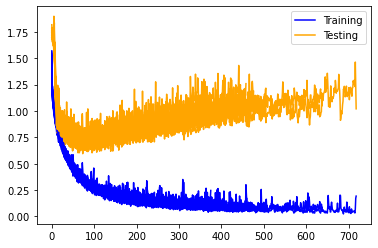

In [20]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

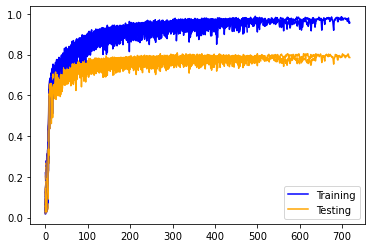

In [21]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

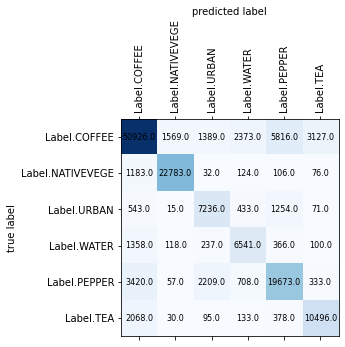

In [22]:
plot_confusion_matrix(conf_matrix, labels)

In [23]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.85592793 0.92719355 0.64618682 0.63430954 0.71297068 0.7389988 ]
Mean precision:  0.752597888230691

Recalls:  [0.78107362 0.93741771 0.75753769 0.75011468 0.74518939 0.79515152]
Mean recall:  0.7944141008471993

F-Score:  [0.81678936 0.9322776  0.69744578 0.68736864 0.72872409 0.76604751]
Mean f-score:  0.7714421659814662


# COASTAL_AEROSOL, BLUE, GREEN, RED, NIR, SWIR1, SWIR2, MNDWI, EVI2, BU

In [11]:
bands = [
    Band.COASTAL_AEROSOL.value, 
    Band.BLUE.value, 
    Band.GREEN.value, 
    Band.RED.value, 
    Band.NIR.value, 
    Band.SWIR1.value, 
    Band.SWIR2.value,
    Band.MNDWI.value,
    Band.EVI2.value,
    Band.BU.value,
]

model_name = "coastal_aerosol_blue_green_red_nir_swir1_swir2_mndwi_evi2, bu"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 10)          0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 10)          40        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 32)          2912      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 3, 64)          3

57/57 [==============================] - 0s 7ms/step - loss: 0.2756 - accuracy: 0.8421 - val_loss: 0.6848 - val_accuracy: 0.7729
Epoch 101/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3104 - accuracy: 0.8300 - val_loss: 0.6995 - val_accuracy: 0.7667
Epoch 102/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2786 - accuracy: 0.8359 - val_loss: 0.7652 - val_accuracy: 0.7535
Epoch 103/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3023 - accuracy: 0.8236 - val_loss: 0.6550 - val_accuracy: 0.7743
Epoch 104/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2808 - accuracy: 0.8615 - val_loss: 0.7259 - val_accuracy: 0.7550
Epoch 105/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2862 - accuracy: 0.8264 - val_loss: 0.7420 - val_accuracy: 0.7576
Epoch 106/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2751 - accuracy: 0.8371 - val_loss: 0.7917 - val_accuracy: 0.7469
Epoch 1

Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1909 - accuracy: 0.8946 - val_loss: 0.8178 - val_accuracy: 0.7883
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1764 - accuracy: 0.8836 - val_loss: 0.8678 - val_accuracy: 0.7576
Epoch 159/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2282 - accuracy: 0.8619 - val_loss: 0.7482 - val_accuracy: 0.7757
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1974 - accuracy: 0.8719 - val_loss: 0.7662 - val_accuracy: 0.7785
Epoch 161/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1634 - accuracy: 0.9076 - val_loss: 0.7672 - val_accuracy: 0.7728
Epoch 162/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1782 - accuracy: 0.8829 - val_loss: 0.8044 - val_accuracy: 0.7801
Epoch 163/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2513 - accuracy: 0.8770 - val_loss: 0.7619 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1573 - accuracy: 0.9052 - val_loss: 0.8490 - val_accuracy: 0.7805
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1274 - accuracy: 0.9228 - val_loss: 0.8677 - val_accuracy: 0.7876
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1507 - accuracy: 0.9138 - val_loss: 0.8535 - val_accuracy: 0.8020
Epoch 217/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1186 - accuracy: 0.9343 - val_loss: 0.8468 - val_accuracy: 0.8005
Epoch 218/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2002 - accuracy: 0.9176 - val_loss: 0.8603 - val_accuracy: 0.7833
Epoch 219/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1140 - accuracy: 0.9192 - val_loss: 0.8765 - val_accuracy: 0.7814
Epoch 220/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1732 - accuracy: 0.9071 - val_loss: 0.9054 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1163 - accuracy: 0.9246 - val_loss: 0.9087 - val_accuracy: 0.7900
Epoch 272/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1102 - accuracy: 0.9314 - val_loss: 0.8830 - val_accuracy: 0.7906
Epoch 273/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1171 - accuracy: 0.9364 - val_loss: 1.0387 - val_accuracy: 0.7409
Epoch 274/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1949 - accuracy: 0.8961 - val_loss: 0.8786 - val_accuracy: 0.7685
Epoch 275/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1240 - accuracy: 0.9179 - val_loss: 0.8911 - val_accuracy: 0.7869
Epoch 276/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1094 - accuracy: 0.9355 - val_loss: 0.8399 - val_accuracy: 0.7945
Epoch 277/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1137 - accuracy: 0.9363 - val_loss: 0.8290 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0915 - accuracy: 0.9516 - val_loss: 0.9763 - val_accuracy: 0.7815
Epoch 329/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1117 - accuracy: 0.9306 - val_loss: 0.8845 - val_accuracy: 0.7945
Epoch 330/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0720 - accuracy: 0.9565 - val_loss: 0.9681 - val_accuracy: 0.7956
Epoch 331/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0993 - accuracy: 0.9465 - val_loss: 0.9141 - val_accuracy: 0.8008
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0767 - accuracy: 0.9579 - val_loss: 0.9488 - val_accuracy: 0.7903
Epoch 333/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0906 - accuracy: 0.9494 - val_loss: 0.9109 - val_accuracy: 0.7999
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0757 - accuracy: 0.9534 - val_loss: 0.9821 - val_accuracy:

Epoch 385/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1211 - accuracy: 0.9411 - val_loss: 0.9236 - val_accuracy: 0.7895
Epoch 386/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0877 - accuracy: 0.9410 - val_loss: 0.9825 - val_accuracy: 0.7881
Epoch 387/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1527 - accuracy: 0.9301 - val_loss: 0.8384 - val_accuracy: 0.7971
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1123 - accuracy: 0.9446 - val_loss: 0.9539 - val_accuracy: 0.7910
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0625 - accuracy: 0.9665 - val_loss: 0.9311 - val_accuracy: 0.7940
Epoch 390/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0790 - accuracy: 0.9567 - val_loss: 0.9332 - val_accuracy: 0.8109
Epoch 391/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0809 - accuracy: 0.9626 - val_loss: 0.9368 - val_accuracy

Epoch 442/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0825 - accuracy: 0.9497 - val_loss: 1.0217 - val_accuracy: 0.8044
Epoch 443/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0511 - accuracy: 0.9659 - val_loss: 1.0342 - val_accuracy: 0.8099
Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0721 - accuracy: 0.9501 - val_loss: 1.0906 - val_accuracy: 0.8042
Epoch 445/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0769 - accuracy: 0.9574 - val_loss: 1.1153 - val_accuracy: 0.7955
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0682 - accuracy: 0.9558 - val_loss: 1.1300 - val_accuracy: 0.8010
Epoch 447/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1014 - accuracy: 0.9461 - val_loss: 1.0750 - val_accuracy: 0.8020
Epoch 448/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0881 - accuracy: 0.9512 - val_loss: 1.0796 - val_accuracy:

Epoch 22/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6580 - accuracy: 0.6484 - val_loss: 0.8377 - val_accuracy: 0.6667
Epoch 23/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6996 - accuracy: 0.6814 - val_loss: 0.8120 - val_accuracy: 0.6915
Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6888 - accuracy: 0.6582 - val_loss: 0.7959 - val_accuracy: 0.7019
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6561 - accuracy: 0.6804 - val_loss: 0.9353 - val_accuracy: 0.6259
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6943 - accuracy: 0.6675 - val_loss: 0.7702 - val_accuracy: 0.6966
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5761 - accuracy: 0.7116 - val_loss: 0.8715 - val_accuracy: 0.6727
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6465 - accuracy: 0.6863 - val_loss: 0.8838 - val_accuracy: 0.6495

57/57 [==============================] - 0s 8ms/step - loss: 0.2471 - accuracy: 0.8326 - val_loss: 0.7488 - val_accuracy: 0.7736
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2080 - accuracy: 0.8840 - val_loss: 0.6737 - val_accuracy: 0.7996
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1849 - accuracy: 0.8785 - val_loss: 0.7855 - val_accuracy: 0.7808
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1868 - accuracy: 0.8728 - val_loss: 0.7980 - val_accuracy: 0.7640
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1655 - accuracy: 0.8811 - val_loss: 0.7365 - val_accuracy: 0.7795
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2169 - accuracy: 0.8675 - val_loss: 0.7469 - val_accuracy: 0.7905
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2007 - accuracy: 0.8758 - val_loss: 0.8396 - val_accuracy: 0.7587
Epoch 1

Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1415 - accuracy: 0.9094 - val_loss: 0.8135 - val_accuracy: 0.7907
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1496 - accuracy: 0.9050 - val_loss: 0.8549 - val_accuracy: 0.7803
Epoch 195/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1609 - accuracy: 0.8942 - val_loss: 0.8030 - val_accuracy: 0.7860
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1336 - accuracy: 0.9010 - val_loss: 0.8208 - val_accuracy: 0.7901
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1171 - accuracy: 0.9252 - val_loss: 0.8426 - val_accuracy: 0.7973
Epoch 198/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1260 - accuracy: 0.9200 - val_loss: 0.9137 - val_accuracy: 0.7671
Epoch 199/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1698 - accuracy: 0.8892 - val_loss: 0.8340 - val_accuracy:

Epoch 250/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1124 - accuracy: 0.9393 - val_loss: 0.8846 - val_accuracy: 0.7966
Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1096 - accuracy: 0.9342 - val_loss: 0.9801 - val_accuracy: 0.7792
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1276 - accuracy: 0.9179 - val_loss: 0.9722 - val_accuracy: 0.7932
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1447 - accuracy: 0.9164 - val_loss: 0.8649 - val_accuracy: 0.8034
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1694 - accuracy: 0.9142 - val_loss: 0.9638 - val_accuracy: 0.7855
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1214 - accuracy: 0.9199 - val_loss: 0.8529 - val_accuracy: 0.8096
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0800 - accuracy: 0.9483 - val_loss: 0.9283 - val_accuracy:

Epoch 307/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0955 - accuracy: 0.9306 - val_loss: 0.9332 - val_accuracy: 0.8040
Epoch 308/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0693 - accuracy: 0.9556 - val_loss: 0.8669 - val_accuracy: 0.8123
Epoch 309/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0587 - accuracy: 0.9653 - val_loss: 0.9515 - val_accuracy: 0.8153
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0647 - accuracy: 0.9537 - val_loss: 0.9915 - val_accuracy: 0.8038
Epoch 311/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0729 - accuracy: 0.9476 - val_loss: 0.9742 - val_accuracy: 0.8019
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1370 - accuracy: 0.9338 - val_loss: 1.0012 - val_accuracy: 0.7878
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1313 - accuracy: 0.9250 - val_loss: 0.9507 - val_accuracy:

Epoch 364/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0742 - accuracy: 0.9497 - val_loss: 1.0732 - val_accuracy: 0.8046
Epoch 365/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0705 - accuracy: 0.9662 - val_loss: 1.0697 - val_accuracy: 0.7971
Epoch 366/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1145 - accuracy: 0.9463 - val_loss: 1.0327 - val_accuracy: 0.8062
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0620 - accuracy: 0.9655 - val_loss: 1.0656 - val_accuracy: 0.8015
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0892 - accuracy: 0.9537 - val_loss: 0.9977 - val_accuracy: 0.8038
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0630 - accuracy: 0.9538 - val_loss: 0.9992 - val_accuracy: 0.8173
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0711 - accuracy: 0.9557 - val_loss: 1.0883 - val_accuracy:

Epoch 421/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1261 - accuracy: 0.9369 - val_loss: 0.9974 - val_accuracy: 0.7997
Epoch 422/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0720 - accuracy: 0.9638 - val_loss: 1.0352 - val_accuracy: 0.7941
Epoch 423/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2425 - accuracy: 0.9167 - val_loss: 0.8741 - val_accuracy: 0.7958
Epoch 424/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1271 - accuracy: 0.9329 - val_loss: 0.9507 - val_accuracy: 0.7913
Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0991 - accuracy: 0.9422 - val_loss: 0.9289 - val_accuracy: 0.8140
Epoch 426/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0711 - accuracy: 0.9661 - val_loss: 0.9498 - val_accuracy: 0.8038
Epoch 427/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0662 - accuracy: 0.9632 - val_loss: 0.9686 - val_accuracy:

Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0856 - accuracy: 0.9451 - val_loss: 1.0883 - val_accuracy: 0.7880
Epoch 479/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0913 - accuracy: 0.9507 - val_loss: 1.0536 - val_accuracy: 0.8057
Epoch 480/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0799 - accuracy: 0.9508 - val_loss: 1.1091 - val_accuracy: 0.8066
Epoch 481/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0660 - accuracy: 0.9583 - val_loss: 1.1517 - val_accuracy: 0.7912
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0751 - accuracy: 0.9579 - val_loss: 1.0734 - val_accuracy: 0.8085
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0585 - accuracy: 0.9649 - val_loss: 1.0930 - val_accuracy: 0.8026
Epoch 484/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0641 - accuracy: 0.9611 - val_loss: 1.1370 - val_accuracy:

Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6300 - accuracy: 0.7061 - val_loss: 0.9601 - val_accuracy: 0.6510
Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6675 - accuracy: 0.6816 - val_loss: 0.8337 - val_accuracy: 0.6991
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6202 - accuracy: 0.7327 - val_loss: 0.8241 - val_accuracy: 0.7032
Epoch 26/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5764 - accuracy: 0.7213 - val_loss: 0.9379 - val_accuracy: 0.6830
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6006 - accuracy: 0.7016 - val_loss: 0.8567 - val_accuracy: 0.6781
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5259 - accuracy: 0.7332 - val_loss: 0.9001 - val_accuracy: 0.6625
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5761 - accuracy: 0.6891 - val_loss: 0.8603 - val_accuracy: 0.688

57/57 [==============================] - 0s 8ms/step - loss: 0.1763 - accuracy: 0.8973 - val_loss: 0.8137 - val_accuracy: 0.7713
Epoch 138/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1637 - accuracy: 0.8945 - val_loss: 0.9098 - val_accuracy: 0.7688
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2761 - accuracy: 0.8438 - val_loss: 0.8197 - val_accuracy: 0.7768
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1787 - accuracy: 0.8945 - val_loss: 0.7712 - val_accuracy: 0.7888
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1777 - accuracy: 0.8921 - val_loss: 0.7277 - val_accuracy: 0.7886
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1442 - accuracy: 0.9133 - val_loss: 0.8711 - val_accuracy: 0.7780
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1466 - accuracy: 0.9022 - val_loss: 0.7682 - val_accuracy: 0.7867
Epoch 1

Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1624 - accuracy: 0.9179 - val_loss: 0.8621 - val_accuracy: 0.7922
Epoch 195/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1177 - accuracy: 0.9189 - val_loss: 0.8062 - val_accuracy: 0.8097
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1434 - accuracy: 0.9244 - val_loss: 0.8752 - val_accuracy: 0.7875
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1199 - accuracy: 0.9306 - val_loss: 0.8833 - val_accuracy: 0.7825
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1163 - accuracy: 0.9261 - val_loss: 0.8727 - val_accuracy: 0.7872
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1565 - accuracy: 0.9084 - val_loss: 0.8407 - val_accuracy: 0.7963
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1271 - accuracy: 0.9298 - val_loss: 0.8802 - val_accuracy:

Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1159 - accuracy: 0.9301 - val_loss: 1.0465 - val_accuracy: 0.7723
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1221 - accuracy: 0.9177 - val_loss: 1.0211 - val_accuracy: 0.7825
Epoch 253/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1181 - accuracy: 0.9187 - val_loss: 0.9805 - val_accuracy: 0.7850
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1643 - accuracy: 0.9124 - val_loss: 0.8905 - val_accuracy: 0.7738
Epoch 255/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1345 - accuracy: 0.9223 - val_loss: 0.8763 - val_accuracy: 0.8092
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0776 - accuracy: 0.9563 - val_loss: 0.9212 - val_accuracy: 0.8081
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0748 - accuracy: 0.9520 - val_loss: 0.9734 - val_accuracy:

Epoch 308/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0754 - accuracy: 0.9511 - val_loss: 0.9893 - val_accuracy: 0.8115
Epoch 309/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0656 - accuracy: 0.9584 - val_loss: 1.0021 - val_accuracy: 0.7959
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0929 - accuracy: 0.9398 - val_loss: 1.0055 - val_accuracy: 0.7985
Epoch 311/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1557 - accuracy: 0.9517 - val_loss: 1.0068 - val_accuracy: 0.8009
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0994 - accuracy: 0.9337 - val_loss: 1.0298 - val_accuracy: 0.7875
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1447 - accuracy: 0.9244 - val_loss: 0.9939 - val_accuracy: 0.7701
Epoch 314/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1346 - accuracy: 0.9270 - val_loss: 0.8942 - val_accuracy

Epoch 365/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0613 - accuracy: 0.9672 - val_loss: 0.9642 - val_accuracy: 0.8126
Epoch 366/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0405 - accuracy: 0.9750 - val_loss: 1.0320 - val_accuracy: 0.8180
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0689 - accuracy: 0.9639 - val_loss: 1.0998 - val_accuracy: 0.8126
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0616 - accuracy: 0.9694 - val_loss: 1.0343 - val_accuracy: 0.8135
Epoch 369/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0630 - accuracy: 0.9742 - val_loss: 1.0265 - val_accuracy: 0.8065
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1127 - accuracy: 0.9442 - val_loss: 1.0678 - val_accuracy: 0.7830
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1632 - accuracy: 0.9310 - val_loss: 1.0189 - val_accuracy:

Epoch 422/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0550 - accuracy: 0.9648 - val_loss: 1.1455 - val_accuracy: 0.8121
Epoch 423/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0916 - accuracy: 0.9624 - val_loss: 1.1853 - val_accuracy: 0.8103
Epoch 424/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0552 - accuracy: 0.9666 - val_loss: 1.1956 - val_accuracy: 0.8080
Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0718 - accuracy: 0.9635 - val_loss: 1.2296 - val_accuracy: 0.8084
Epoch 426/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0981 - accuracy: 0.9516 - val_loss: 1.0026 - val_accuracy: 0.8081
Epoch 427/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.9757 - val_loss: 1.1307 - val_accuracy: 0.8035
Epoch 428/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0627 - accuracy: 0.9660 - val_loss: 1.1877 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3638 - accuracy: 0.7685 - val_loss: 0.7335 - val_accuracy: 0.7344
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3982 - accuracy: 0.7745 - val_loss: 0.6716 - val_accuracy: 0.7504
Epoch 71/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3440 - accuracy: 0.7882 - val_loss: 0.6882 - val_accuracy: 0.7409
Epoch 72/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3488 - accuracy: 0.7976 - val_loss: 0.7179 - val_accuracy: 0.7423
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3688 - accuracy: 0.7995 - val_loss: 0.6697 - val_accuracy: 0.7567
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3142 - accuracy: 0.8324 - val_loss: 0.7290 - val_accuracy: 0.7343
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4109 - accuracy: 0.7775 - val_loss: 0.6777 - val_accuracy: 0.7525
Epoch 76/2000

Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2097 - accuracy: 0.8770 - val_loss: 0.8226 - val_accuracy: 0.7741
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1659 - accuracy: 0.8935 - val_loss: 0.9202 - val_accuracy: 0.7697
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1679 - accuracy: 0.8921 - val_loss: 0.9177 - val_accuracy: 0.7442
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2145 - accuracy: 0.8736 - val_loss: 0.8351 - val_accuracy: 0.7806
Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2153 - accuracy: 0.8947 - val_loss: 0.7505 - val_accuracy: 0.7966
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1298 - accuracy: 0.9154 - val_loss: 0.7453 - val_accuracy: 0.8201
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1172 - accuracy: 0.9291 - val_loss: 0.7584 - val_accuracy:

Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1126 - accuracy: 0.9238 - val_loss: 0.8431 - val_accuracy: 0.8102
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1249 - accuracy: 0.9223 - val_loss: 0.8876 - val_accuracy: 0.8013
Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1011 - accuracy: 0.9327 - val_loss: 0.9233 - val_accuracy: 0.8007
Epoch 243/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0956 - accuracy: 0.9326 - val_loss: 0.8855 - val_accuracy: 0.8093
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1059 - accuracy: 0.9412 - val_loss: 0.8716 - val_accuracy: 0.8028
Epoch 245/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1044 - accuracy: 0.9264 - val_loss: 0.8601 - val_accuracy: 0.7931
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1141 - accuracy: 0.9313 - val_loss: 0.9243 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.3497 - accuracy: 0.8154 - val_loss: 0.6239 - val_accuracy: 0.7798
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.8151 - val_loss: 0.6947 - val_accuracy: 0.7416
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3946 - accuracy: 0.8021 - val_loss: 0.7658 - val_accuracy: 0.7118
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3598 - accuracy: 0.7984 - val_loss: 0.7054 - val_accuracy: 0.7404
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3961 - accuracy: 0.8034 - val_loss: 0.7456 - val_accuracy: 0.7255
Epoch 70/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3406 - accuracy: 0.8001 - val_loss: 0.6814 - val_accuracy: 0.7394
Epoch 71/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3871 - accuracy: 0.8053 - val_loss: 0.8507 - val_accuracy: 0.6963
Epoch 72/2000

Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1396 - accuracy: 0.9124 - val_loss: 0.7921 - val_accuracy: 0.7925
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1587 - accuracy: 0.8988 - val_loss: 0.8170 - val_accuracy: 0.7764
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1506 - accuracy: 0.9114 - val_loss: 0.7771 - val_accuracy: 0.7988
Epoch 182/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1394 - accuracy: 0.9230 - val_loss: 0.8400 - val_accuracy: 0.7792
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2034 - accuracy: 0.9002 - val_loss: 0.8565 - val_accuracy: 0.7926
Epoch 184/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1670 - accuracy: 0.8998 - val_loss: 0.7473 - val_accuracy: 0.8009
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1130 - accuracy: 0.9304 - val_loss: 0.8268 - val_accuracy

Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1360 - accuracy: 0.9278 - val_loss: 0.8452 - val_accuracy: 0.7951
Epoch 237/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1057 - accuracy: 0.9272 - val_loss: 0.8683 - val_accuracy: 0.7878
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1578 - accuracy: 0.9228 - val_loss: 0.8138 - val_accuracy: 0.8103
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1233 - accuracy: 0.9291 - val_loss: 0.8691 - val_accuracy: 0.7860
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1305 - accuracy: 0.9220 - val_loss: 0.8179 - val_accuracy: 0.7977
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1226 - accuracy: 0.9252 - val_loss: 0.8652 - val_accuracy: 0.7768
Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2396 - accuracy: 0.8820 - val_loss: 0.7885 - val_accuracy:

Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1168 - accuracy: 0.9203 - val_loss: 0.9280 - val_accuracy: 0.7950
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1165 - accuracy: 0.9300 - val_loss: 0.9381 - val_accuracy: 0.8004
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1197 - accuracy: 0.9266 - val_loss: 0.8866 - val_accuracy: 0.8084
Epoch 296/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1371 - accuracy: 0.9219 - val_loss: 0.8812 - val_accuracy: 0.7940
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1391 - accuracy: 0.9250 - val_loss: 0.8797 - val_accuracy: 0.7945
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1289 - accuracy: 0.9222 - val_loss: 0.8651 - val_accuracy: 0.7951
Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1148 - accuracy: 0.9312 - val_loss: 0.8974 - val_accuracy:

Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1180 - accuracy: 0.9328 - val_loss: 0.8981 - val_accuracy: 0.8057
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0656 - accuracy: 0.9568 - val_loss: 1.0123 - val_accuracy: 0.7829
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1064 - accuracy: 0.9248 - val_loss: 0.9451 - val_accuracy: 0.8073
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0630 - accuracy: 0.9599 - val_loss: 0.9859 - val_accuracy: 0.8011
Epoch 354/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0910 - accuracy: 0.9472 - val_loss: 0.9650 - val_accuracy: 0.7989
Epoch 355/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1105 - accuracy: 0.9515 - val_loss: 0.9253 - val_accuracy: 0.8106
Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0752 - accuracy: 0.9551 - val_loss: 0.9499 - val_accuracy

Epoch 28/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6836 - accuracy: 0.6346 - val_loss: 0.8695 - val_accuracy: 0.6357
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6346 - accuracy: 0.6615 - val_loss: 0.8918 - val_accuracy: 0.6435
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6355 - accuracy: 0.6755 - val_loss: 0.8361 - val_accuracy: 0.6739
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6403 - accuracy: 0.6584 - val_loss: 0.8425 - val_accuracy: 0.6512
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6191 - accuracy: 0.6770 - val_loss: 0.7240 - val_accuracy: 0.7124
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6323 - accuracy: 0.6843 - val_loss: 0.7754 - val_accuracy: 0.6907
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6028 - accuracy: 0.6880 - val_loss: 0.7694 - val_accuracy: 0.6957

57/57 [==============================] - 1s 9ms/step - loss: 0.2138 - accuracy: 0.8708 - val_loss: 0.7353 - val_accuracy: 0.7777
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8698 - val_loss: 0.7300 - val_accuracy: 0.7746
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1859 - accuracy: 0.8671 - val_loss: 0.7072 - val_accuracy: 0.7839
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1860 - accuracy: 0.8861 - val_loss: 0.7445 - val_accuracy: 0.7781
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1799 - accuracy: 0.8720 - val_loss: 0.7297 - val_accuracy: 0.7929
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2207 - accuracy: 0.8572 - val_loss: 0.7412 - val_accuracy: 0.7746
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2486 - accuracy: 0.8419 - val_loss: 0.7954 - val_accuracy: 0.7663
Epoch 1

Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1970 - accuracy: 0.8855 - val_loss: 0.7777 - val_accuracy: 0.7747
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1987 - accuracy: 0.8908 - val_loss: 0.7205 - val_accuracy: 0.7879
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3111 - accuracy: 0.8607 - val_loss: 0.7457 - val_accuracy: 0.7873
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1789 - accuracy: 0.8897 - val_loss: 0.7930 - val_accuracy: 0.7861
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1749 - accuracy: 0.8895 - val_loss: 0.7420 - val_accuracy: 0.7942
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1804 - accuracy: 0.8910 - val_loss: 0.7760 - val_accuracy: 0.7888
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1452 - accuracy: 0.9127 - val_loss: 0.7396 - val_accuracy:

Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1516 - accuracy: 0.9146 - val_loss: 0.7469 - val_accuracy: 0.8014
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1217 - accuracy: 0.9229 - val_loss: 0.7908 - val_accuracy: 0.7926
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1237 - accuracy: 0.9092 - val_loss: 0.7839 - val_accuracy: 0.7983
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1290 - accuracy: 0.9134 - val_loss: 0.7980 - val_accuracy: 0.8023
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1422 - accuracy: 0.9257 - val_loss: 0.9450 - val_accuracy: 0.7801
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2044 - accuracy: 0.8833 - val_loss: 0.7696 - val_accuracy: 0.7952
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1878 - accuracy: 0.9124 - val_loss: 0.8432 - val_accuracy:

Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1374 - accuracy: 0.9212 - val_loss: 0.8576 - val_accuracy: 0.8032
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1049 - accuracy: 0.9380 - val_loss: 0.9006 - val_accuracy: 0.7861
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1340 - accuracy: 0.9133 - val_loss: 0.8424 - val_accuracy: 0.8042
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1216 - accuracy: 0.9285 - val_loss: 0.9339 - val_accuracy: 0.7854
Epoch 317/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1302 - accuracy: 0.9117 - val_loss: 0.8206 - val_accuracy: 0.8123
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0923 - accuracy: 0.9467 - val_loss: 0.8348 - val_accuracy: 0.8135
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1093 - accuracy: 0.9314 - val_loss: 0.8526 - val_accuracy:

Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6668 - accuracy: 0.6676 - val_loss: 0.9394 - val_accuracy: 0.6283
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7137 - accuracy: 0.6541 - val_loss: 0.7636 - val_accuracy: 0.7346
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6944 - accuracy: 0.6735 - val_loss: 0.8176 - val_accuracy: 0.6914
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6840 - accuracy: 0.6807 - val_loss: 0.7376 - val_accuracy: 0.7409
Epoch 28/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6606 - accuracy: 0.7038 - val_loss: 0.8021 - val_accuracy: 0.7176
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7013 - accuracy: 0.6964 - val_loss: 0.7731 - val_accuracy: 0.7080
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6370 - accuracy: 0.7019 - val_loss: 0.6720 - val_accuracy: 0.7591

57/57 [==============================] - 1s 9ms/step - loss: 0.2654 - accuracy: 0.8523 - val_loss: 0.7559 - val_accuracy: 0.7857
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2214 - accuracy: 0.9011 - val_loss: 0.7609 - val_accuracy: 0.7845
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2014 - accuracy: 0.8889 - val_loss: 0.9492 - val_accuracy: 0.7472
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2609 - accuracy: 0.8651 - val_loss: 0.8133 - val_accuracy: 0.7735
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2189 - accuracy: 0.8708 - val_loss: 0.8681 - val_accuracy: 0.7537
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2129 - accuracy: 0.8678 - val_loss: 0.7805 - val_accuracy: 0.7679
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1763 - accuracy: 0.8847 - val_loss: 0.7456 - val_accuracy: 0.7867
Epoch 1

Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1463 - accuracy: 0.9027 - val_loss: 0.8580 - val_accuracy: 0.7800
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2354 - accuracy: 0.8950 - val_loss: 0.8834 - val_accuracy: 0.7761
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1489 - accuracy: 0.9036 - val_loss: 0.8916 - val_accuracy: 0.7776
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1454 - accuracy: 0.9110 - val_loss: 0.9686 - val_accuracy: 0.7479
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1551 - accuracy: 0.9010 - val_loss: 0.9251 - val_accuracy: 0.7736
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1485 - accuracy: 0.9035 - val_loss: 0.9199 - val_accuracy: 0.7773
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1418 - accuracy: 0.9109 - val_loss: 0.8875 - val_accuracy:

Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1378 - accuracy: 0.9298 - val_loss: 1.0154 - val_accuracy: 0.7910
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1287 - accuracy: 0.9221 - val_loss: 1.0437 - val_accuracy: 0.8009
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1522 - accuracy: 0.9190 - val_loss: 1.0240 - val_accuracy: 0.7557
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1225 - accuracy: 0.9295 - val_loss: 1.0200 - val_accuracy: 0.7728
Epoch 256/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1277 - accuracy: 0.9228 - val_loss: 0.9669 - val_accuracy: 0.7935
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1149 - accuracy: 0.9333 - val_loss: 0.9552 - val_accuracy: 0.7844
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1390 - accuracy: 0.9262 - val_loss: 0.9697 - val_accuracy

Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0915 - accuracy: 0.9472 - val_loss: 0.9966 - val_accuracy: 0.7917
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1215 - accuracy: 0.9303 - val_loss: 1.0000 - val_accuracy: 0.7829
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1421 - accuracy: 0.9104 - val_loss: 0.9536 - val_accuracy: 0.7936
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0971 - accuracy: 0.9444 - val_loss: 1.1190 - val_accuracy: 0.7684
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1312 - accuracy: 0.9283 - val_loss: 1.0293 - val_accuracy: 0.7841
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1122 - accuracy: 0.9425 - val_loss: 0.9708 - val_accuracy: 0.7994
Epoch 315/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0978 - accuracy: 0.9442 - val_loss: 0.9432 - val_accuracy

Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1711 - accuracy: 0.9053 - val_loss: 1.0311 - val_accuracy: 0.8024
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9451 - val_loss: 1.0577 - val_accuracy: 0.8002
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0873 - accuracy: 0.9552 - val_loss: 1.0551 - val_accuracy: 0.7932
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1087 - accuracy: 0.9421 - val_loss: 0.9966 - val_accuracy: 0.7944
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0970 - accuracy: 0.9458 - val_loss: 1.0655 - val_accuracy: 0.7956
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0877 - accuracy: 0.9427 - val_loss: 1.0574 - val_accuracy: 0.8020
Epoch 372/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0947 - accuracy: 0.9436 - val_loss: 1.0101 - val_accuracy:

Epoch 423/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0690 - accuracy: 0.9538 - val_loss: 1.1545 - val_accuracy: 0.8068
Epoch 424/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0848 - accuracy: 0.9527 - val_loss: 1.1986 - val_accuracy: 0.7924
Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0753 - accuracy: 0.9553 - val_loss: 1.2198 - val_accuracy: 0.7981
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0749 - accuracy: 0.9541 - val_loss: 1.1802 - val_accuracy: 0.8069
Epoch 427/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0674 - accuracy: 0.9579 - val_loss: 1.4012 - val_accuracy: 0.7780
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1255 - accuracy: 0.9416 - val_loss: 1.0776 - val_accuracy: 0.8043
Epoch 429/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0740 - accuracy: 0.9585 - val_loss: 1.1506 - val_accuracy:

Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5300 - accuracy: 0.7203 - val_loss: 0.7765 - val_accuracy: 0.7123
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4948 - accuracy: 0.7477 - val_loss: 0.7660 - val_accuracy: 0.7101
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5111 - accuracy: 0.7686 - val_loss: 0.7035 - val_accuracy: 0.7339
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5038 - accuracy: 0.7385 - val_loss: 0.6541 - val_accuracy: 0.7584
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4811 - accuracy: 0.7720 - val_loss: 0.8700 - val_accuracy: 0.6898
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4556 - accuracy: 0.7625 - val_loss: 0.7347 - val_accuracy: 0.7337
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4377 - accuracy: 0.7830 - val_loss: 0.7312 - val_accuracy: 0.7285

Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1810 - accuracy: 0.8914 - val_loss: 0.7408 - val_accuracy: 0.7868
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2276 - accuracy: 0.8824 - val_loss: 0.7642 - val_accuracy: 0.7869
Epoch 160/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1764 - accuracy: 0.8883 - val_loss: 0.6971 - val_accuracy: 0.8035
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1397 - accuracy: 0.9209 - val_loss: 0.7069 - val_accuracy: 0.8015
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1446 - accuracy: 0.9154 - val_loss: 0.7620 - val_accuracy: 0.7822
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1746 - accuracy: 0.9086 - val_loss: 0.7929 - val_accuracy: 0.7758
Epoch 164/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1764 - accuracy: 0.8985 - val_loss: 0.7364 - val_accuracy:

Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1545 - accuracy: 0.9262 - val_loss: 0.7793 - val_accuracy: 0.8126
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1491 - accuracy: 0.9194 - val_loss: 0.7918 - val_accuracy: 0.8001
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1165 - accuracy: 0.9363 - val_loss: 0.8303 - val_accuracy: 0.8038
Epoch 218/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0992 - accuracy: 0.9312 - val_loss: 0.8010 - val_accuracy: 0.8114
Epoch 219/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1079 - accuracy: 0.9421 - val_loss: 0.9412 - val_accuracy: 0.7967
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1307 - accuracy: 0.9243 - val_loss: 0.8143 - val_accuracy: 0.7998
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1345 - accuracy: 0.9168 - val_loss: 0.9076 - val_accuracy:

Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0793 - accuracy: 0.9438 - val_loss: 0.8951 - val_accuracy: 0.8050
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1015 - accuracy: 0.9285 - val_loss: 0.8512 - val_accuracy: 0.8076
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1053 - accuracy: 0.9361 - val_loss: 0.9086 - val_accuracy: 0.8073
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1075 - accuracy: 0.9365 - val_loss: 0.8827 - val_accuracy: 0.8040
Epoch 276/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1151 - accuracy: 0.9391 - val_loss: 0.9799 - val_accuracy: 0.7926
Epoch 277/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1416 - accuracy: 0.9322 - val_loss: 0.8981 - val_accuracy: 0.7720
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1236 - accuracy: 0.9246 - val_loss: 0.7868 - val_accuracy:

Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1662 - accuracy: 0.9384 - val_loss: 0.8791 - val_accuracy: 0.8111
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0686 - accuracy: 0.9607 - val_loss: 1.0961 - val_accuracy: 0.7807
Epoch 331/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0827 - accuracy: 0.9544 - val_loss: 0.9739 - val_accuracy: 0.8055
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1370 - accuracy: 0.9354 - val_loss: 0.9946 - val_accuracy: 0.7884
Epoch 333/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1065 - accuracy: 0.9540 - val_loss: 0.8691 - val_accuracy: 0.7988
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0713 - accuracy: 0.9568 - val_loss: 1.0042 - val_accuracy: 0.7992
Epoch 335/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9424 - val_loss: 0.8806 - val_accuracy:

Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.6502 - val_loss: 0.8351 - val_accuracy: 0.6579
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7386 - accuracy: 0.6535 - val_loss: 0.8399 - val_accuracy: 0.6641
Epoch 25/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6808 - accuracy: 0.6664 - val_loss: 0.8769 - val_accuracy: 0.6329
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6745 - accuracy: 0.6708 - val_loss: 1.0174 - val_accuracy: 0.5742
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6642 - accuracy: 0.6356 - val_loss: 0.8841 - val_accuracy: 0.6491
Epoch 28/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6322 - accuracy: 0.6884 - val_loss: 0.8256 - val_accuracy: 0.6682
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.6712 - val_loss: 0.8048 - val_accuracy: 0.675

57/57 [==============================] - 1s 9ms/step - loss: 0.2196 - accuracy: 0.8539 - val_loss: 0.7347 - val_accuracy: 0.7548
Epoch 138/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2215 - accuracy: 0.8548 - val_loss: 0.6691 - val_accuracy: 0.7970
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1958 - accuracy: 0.8820 - val_loss: 0.7090 - val_accuracy: 0.7963
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2087 - accuracy: 0.8739 - val_loss: 0.7598 - val_accuracy: 0.7637
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2160 - accuracy: 0.8780 - val_loss: 0.7054 - val_accuracy: 0.7855
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2081 - accuracy: 0.8676 - val_loss: 0.8438 - val_accuracy: 0.7282
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2134 - accuracy: 0.8407 - val_loss: 0.7658 - val_accuracy: 0.7739
Epoch 1

Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1573 - accuracy: 0.8991 - val_loss: 0.8752 - val_accuracy: 0.7597
Epoch 195/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1883 - accuracy: 0.8937 - val_loss: 0.7623 - val_accuracy: 0.8039
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1399 - accuracy: 0.9177 - val_loss: 0.8459 - val_accuracy: 0.7806
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2041 - accuracy: 0.8849 - val_loss: 0.8228 - val_accuracy: 0.7895
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1506 - accuracy: 0.9162 - val_loss: 0.8127 - val_accuracy: 0.7929
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1501 - accuracy: 0.9114 - val_loss: 0.9528 - val_accuracy: 0.7641
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1702 - accuracy: 0.8930 - val_loss: 0.7344 - val_accuracy:

Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0964 - accuracy: 0.9308 - val_loss: 0.7946 - val_accuracy: 0.8068
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1188 - accuracy: 0.9266 - val_loss: 0.8379 - val_accuracy: 0.8084
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1407 - accuracy: 0.9234 - val_loss: 0.8016 - val_accuracy: 0.7996
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1248 - accuracy: 0.9299 - val_loss: 0.8716 - val_accuracy: 0.7806
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0941 - accuracy: 0.9374 - val_loss: 0.8808 - val_accuracy: 0.8065
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1464 - accuracy: 0.9251 - val_loss: 0.8758 - val_accuracy: 0.7932
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1206 - accuracy: 0.9365 - val_loss: 0.9840 - val_accuracy:

Epoch 308/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0921 - accuracy: 0.9423 - val_loss: 0.8155 - val_accuracy: 0.8104
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0968 - accuracy: 0.9443 - val_loss: 0.8229 - val_accuracy: 0.8133
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1448 - accuracy: 0.9354 - val_loss: 0.8436 - val_accuracy: 0.7993
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1795 - accuracy: 0.9115 - val_loss: 0.8058 - val_accuracy: 0.8087
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0832 - accuracy: 0.9466 - val_loss: 0.8557 - val_accuracy: 0.8100
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0776 - accuracy: 0.9491 - val_loss: 0.8994 - val_accuracy: 0.8156
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0985 - accuracy: 0.9362 - val_loss: 0.8503 - val_accuracy:

Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0941 - accuracy: 0.9391 - val_loss: 0.9763 - val_accuracy: 0.8015
Epoch 366/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1424 - accuracy: 0.9316 - val_loss: 0.8909 - val_accuracy: 0.8058
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0953 - accuracy: 0.9456 - val_loss: 0.9901 - val_accuracy: 0.7910
Epoch 368/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1181 - accuracy: 0.9198 - val_loss: 0.9306 - val_accuracy: 0.7975
Epoch 369/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0706 - accuracy: 0.9572 - val_loss: 0.9738 - val_accuracy: 0.8083
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0954 - accuracy: 0.9530 - val_loss: 0.9769 - val_accuracy: 0.8024
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1253 - accuracy: 0.9382 - val_loss: 0.8686 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.4805 - accuracy: 0.7498 - val_loss: 0.7774 - val_accuracy: 0.7312
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.8007 - val_loss: 0.7655 - val_accuracy: 0.7328
Epoch 63/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3524 - accuracy: 0.8003 - val_loss: 0.7243 - val_accuracy: 0.7384
Epoch 64/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4247 - accuracy: 0.7850 - val_loss: 0.7780 - val_accuracy: 0.7157
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4680 - accuracy: 0.7656 - val_loss: 0.7393 - val_accuracy: 0.7367
Epoch 66/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4307 - accuracy: 0.7681 - val_loss: 0.7054 - val_accuracy: 0.7514
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3612 - accuracy: 0.7845 - val_loss: 0.6894 - val_accuracy: 0.7570
Epoch 68/2000

Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1659 - accuracy: 0.9082 - val_loss: 0.8669 - val_accuracy: 0.7800
Epoch 176/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1863 - accuracy: 0.8839 - val_loss: 0.8902 - val_accuracy: 0.7518
Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2633 - accuracy: 0.8674 - val_loss: 0.7696 - val_accuracy: 0.7975
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1444 - accuracy: 0.9182 - val_loss: 0.8139 - val_accuracy: 0.7922
Epoch 179/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1263 - accuracy: 0.9240 - val_loss: 0.8503 - val_accuracy: 0.7969
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1742 - accuracy: 0.8935 - val_loss: 0.8305 - val_accuracy: 0.7983
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1932 - accuracy: 0.8949 - val_loss: 0.8238 - val_accuracy:

Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9020 - val_loss: 0.8884 - val_accuracy: 0.7781
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1238 - accuracy: 0.9159 - val_loss: 0.8216 - val_accuracy: 0.7990
Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1324 - accuracy: 0.9267 - val_loss: 0.8737 - val_accuracy: 0.8034
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1014 - accuracy: 0.9355 - val_loss: 0.9161 - val_accuracy: 0.8023
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1109 - accuracy: 0.9343 - val_loss: 0.9242 - val_accuracy: 0.7905
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1080 - accuracy: 0.9413 - val_loss: 0.9550 - val_accuracy: 0.7992
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1516 - accuracy: 0.9252 - val_loss: 0.8882 - val_accuracy:

Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0747 - accuracy: 0.9531 - val_loss: 1.0025 - val_accuracy: 0.8046
Epoch 290/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1252 - accuracy: 0.9382 - val_loss: 0.9544 - val_accuracy: 0.8027
Epoch 291/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1303 - accuracy: 0.9338 - val_loss: 0.9022 - val_accuracy: 0.8097
Epoch 292/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1165 - accuracy: 0.9311 - val_loss: 0.9137 - val_accuracy: 0.8106
Epoch 293/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1049 - accuracy: 0.9510 - val_loss: 0.8915 - val_accuracy: 0.7986
Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0942 - accuracy: 0.9306 - val_loss: 0.9502 - val_accuracy: 0.8111
Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0856 - accuracy: 0.9549 - val_loss: 0.9437 - val_accuracy:

Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5075 - accuracy: 0.7270 - val_loss: 0.7161 - val_accuracy: 0.7317
Epoch 39/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4585 - accuracy: 0.7568 - val_loss: 0.8581 - val_accuracy: 0.6739
Epoch 40/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5004 - accuracy: 0.7489 - val_loss: 0.8424 - val_accuracy: 0.6956
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4935 - accuracy: 0.7436 - val_loss: 0.7204 - val_accuracy: 0.7246
Epoch 42/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4888 - accuracy: 0.7462 - val_loss: 0.7300 - val_accuracy: 0.7290
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4513 - accuracy: 0.7282 - val_loss: 0.8926 - val_accuracy: 0.6610
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4385 - accuracy: 0.7590 - val_loss: 0.7269 - val_accuracy: 0.7233

57/57 [==============================] - 0s 8ms/step - loss: 0.2359 - accuracy: 0.8791 - val_loss: 0.7942 - val_accuracy: 0.7628
Epoch 153/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2237 - accuracy: 0.8784 - val_loss: 0.7211 - val_accuracy: 0.7953
Epoch 154/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1511 - accuracy: 0.9062 - val_loss: 0.7443 - val_accuracy: 0.7940
Epoch 155/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1805 - accuracy: 0.9023 - val_loss: 0.7606 - val_accuracy: 0.7894
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1523 - accuracy: 0.9137 - val_loss: 0.7506 - val_accuracy: 0.7972
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1251 - accuracy: 0.9235 - val_loss: 0.8323 - val_accuracy: 0.7850
Epoch 158/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1333 - accuracy: 0.9167 - val_loss: 1.0430 - val_accuracy: 0.7603
Epoch 1

Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0991 - accuracy: 0.9328 - val_loss: 0.8509 - val_accuracy: 0.7957

Validation  3 , fold  2 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.6133 - accuracy: 0.1710 - val_loss: 1.7198 - val_accuracy: 0.0897
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1942 - accuracy: 0.3825 - val_loss: 1.6996 - val_accuracy: 0.1008
Epoch 3/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1144 - accuracy: 0.3815 - val_loss: 1.6967 - val_accuracy: 0.0961
Epoch 4/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.1019 - accuracy: 0.4128 - val_loss: 1.6685 - val_accuracy: 0.4729
Epoch 5/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0161 - accuracy: 0.4746 - val_loss: 1.7127 - val_accuracy: 0.1354
Epoch 6/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.9299 - accurac

Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.7611 - val_loss: 0.7904 - val_accuracy: 0.7237
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4690 - accuracy: 0.7538 - val_loss: 0.7302 - val_accuracy: 0.7342
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4133 - accuracy: 0.7732 - val_loss: 0.9705 - val_accuracy: 0.6867
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3793 - accuracy: 0.7834 - val_loss: 0.7797 - val_accuracy: 0.7359
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4299 - accuracy: 0.7612 - val_loss: 0.8831 - val_accuracy: 0.6956
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4165 - accuracy: 0.7563 - val_loss: 0.7019 - val_accuracy: 0.7549
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3715 - accuracy: 0.7913 - val_loss: 0.7793 - val_accuracy: 0.7346

Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1967 - accuracy: 0.8864 - val_loss: 0.8555 - val_accuracy: 0.7679
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2036 - accuracy: 0.8787 - val_loss: 0.7596 - val_accuracy: 0.7788
Epoch 173/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1556 - accuracy: 0.9027 - val_loss: 0.8713 - val_accuracy: 0.7684
Epoch 174/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1366 - accuracy: 0.9031 - val_loss: 0.9232 - val_accuracy: 0.7694
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1660 - accuracy: 0.9009 - val_loss: 0.7244 - val_accuracy: 0.7907
Epoch 176/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1666 - accuracy: 0.9079 - val_loss: 0.8307 - val_accuracy: 0.7812
Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1676 - accuracy: 0.9016 - val_loss: 0.8664 - val_accuracy

Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1014 - accuracy: 0.9294 - val_loss: 0.9801 - val_accuracy: 0.7722
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0991 - accuracy: 0.9355 - val_loss: 0.9129 - val_accuracy: 0.7958
Epoch 230/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1400 - accuracy: 0.9151 - val_loss: 0.9889 - val_accuracy: 0.7886
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1427 - accuracy: 0.9200 - val_loss: 0.8787 - val_accuracy: 0.7808
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0967 - accuracy: 0.9194 - val_loss: 0.9027 - val_accuracy: 0.7829
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1278 - accuracy: 0.9116 - val_loss: 0.9597 - val_accuracy: 0.7814
Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1104 - accuracy: 0.9265 - val_loss: 1.0039 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1366 - accuracy: 0.9226 - val_loss: 0.8646 - val_accuracy: 0.8049
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0968 - accuracy: 0.9421 - val_loss: 0.9899 - val_accuracy: 0.7895
Epoch 287/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0863 - accuracy: 0.9431 - val_loss: 1.0251 - val_accuracy: 0.7774
Epoch 288/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1503 - accuracy: 0.9191 - val_loss: 0.9676 - val_accuracy: 0.7798
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0798 - accuracy: 0.9455 - val_loss: 0.9449 - val_accuracy: 0.7966
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0868 - accuracy: 0.9392 - val_loss: 0.9223 - val_accuracy: 0.8058
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0808 - accuracy: 0.9469 - val_loss: 0.9657 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0855 - accuracy: 0.9381 - val_loss: 1.0809 - val_accuracy: 0.7958
Epoch 343/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0783 - accuracy: 0.9482 - val_loss: 1.0284 - val_accuracy: 0.8015
Epoch 344/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0600 - accuracy: 0.9611 - val_loss: 1.1223 - val_accuracy: 0.7959
Epoch 345/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0815 - accuracy: 0.9552 - val_loss: 1.0576 - val_accuracy: 0.7997
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0865 - accuracy: 0.9391 - val_loss: 1.0172 - val_accuracy: 0.8001
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0830 - accuracy: 0.9484 - val_loss: 1.0255 - val_accuracy: 0.8009
Epoch 348/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0747 - accuracy: 0.9559 - val_loss: 1.1047 - val_accuracy:

Epoch 399/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0650 - accuracy: 0.9574 - val_loss: 1.1768 - val_accuracy: 0.7761
Epoch 400/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0791 - accuracy: 0.9469 - val_loss: 1.1410 - val_accuracy: 0.7951
Epoch 401/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0868 - accuracy: 0.9562 - val_loss: 1.0901 - val_accuracy: 0.7971
Epoch 402/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0652 - accuracy: 0.9536 - val_loss: 1.0482 - val_accuracy: 0.7962
Epoch 403/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0719 - accuracy: 0.9595 - val_loss: 1.0896 - val_accuracy: 0.7894
Epoch 404/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1147 - accuracy: 0.9487 - val_loss: 1.0496 - val_accuracy: 0.7878
Epoch 405/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0982 - accuracy: 0.9482 - val_loss: 1.0852 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0790 - accuracy: 0.9636 - val_loss: 1.0786 - val_accuracy: 0.8023
Epoch 457/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0974 - accuracy: 0.9514 - val_loss: 1.1232 - val_accuracy: 0.7931
Epoch 458/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0514 - accuracy: 0.9698 - val_loss: 1.0790 - val_accuracy: 0.8122
Epoch 459/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0905 - accuracy: 0.9448 - val_loss: 1.3617 - val_accuracy: 0.7806
Epoch 460/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2130 - accuracy: 0.9256 - val_loss: 0.9561 - val_accuracy: 0.7981
Epoch 461/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0811 - accuracy: 0.9435 - val_loss: 0.9561 - val_accuracy: 0.8035
Epoch 462/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0594 - accuracy: 0.9642 - val_loss: 1.0549 - val_accuracy:

Epoch 513/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0637 - accuracy: 0.9610 - val_loss: 1.1884 - val_accuracy: 0.8016
Epoch 514/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0530 - accuracy: 0.9665 - val_loss: 1.1381 - val_accuracy: 0.8066
Epoch 515/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0545 - accuracy: 0.9695 - val_loss: 1.2474 - val_accuracy: 0.8065
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0594 - accuracy: 0.9630 - val_loss: 1.2976 - val_accuracy: 0.7894
Epoch 517/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1043 - accuracy: 0.9463 - val_loss: 1.1545 - val_accuracy: 0.7989
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0741 - accuracy: 0.9628 - val_loss: 1.1397 - val_accuracy: 0.7988
Epoch 519/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0714 - accuracy: 0.9499 - val_loss: 1.2716 - val_accurac

Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4650 - accuracy: 0.7383 - val_loss: 0.7011 - val_accuracy: 0.7305
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5102 - accuracy: 0.7185 - val_loss: 0.8414 - val_accuracy: 0.6845
Epoch 48/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5326 - accuracy: 0.7345 - val_loss: 0.6321 - val_accuracy: 0.7605
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5054 - accuracy: 0.7354 - val_loss: 0.7455 - val_accuracy: 0.7016
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4714 - accuracy: 0.7436 - val_loss: 0.6862 - val_accuracy: 0.7419
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4656 - accuracy: 0.7399 - val_loss: 0.6358 - val_accuracy: 0.7673
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5151 - accuracy: 0.7256 - val_loss: 0.6595 - val_accuracy: 0.7504

Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2024 - accuracy: 0.8749 - val_loss: 0.7027 - val_accuracy: 0.8074
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2371 - accuracy: 0.8776 - val_loss: 0.7997 - val_accuracy: 0.7526
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2200 - accuracy: 0.8777 - val_loss: 0.7967 - val_accuracy: 0.7709
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1584 - accuracy: 0.8987 - val_loss: 0.8647 - val_accuracy: 0.7430
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2098 - accuracy: 0.8696 - val_loss: 0.8359 - val_accuracy: 0.7812
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1626 - accuracy: 0.8968 - val_loss: 0.8779 - val_accuracy: 0.7884
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1943 - accuracy: 0.8894 - val_loss: 0.7230 - val_accuracy:

Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1260 - accuracy: 0.9086 - val_loss: 0.8709 - val_accuracy: 0.7951
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1593 - accuracy: 0.9183 - val_loss: 0.8449 - val_accuracy: 0.8009
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1221 - accuracy: 0.9368 - val_loss: 0.9144 - val_accuracy: 0.7784
Epoch 220/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1177 - accuracy: 0.9258 - val_loss: 0.8675 - val_accuracy: 0.8107
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1184 - accuracy: 0.9210 - val_loss: 0.9005 - val_accuracy: 0.7765
Epoch 222/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1471 - accuracy: 0.9046 - val_loss: 0.8001 - val_accuracy: 0.7989
Epoch 223/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1297 - accuracy: 0.9343 - val_loss: 0.8346 - val_accurac

Epoch 274/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0937 - accuracy: 0.9429 - val_loss: 0.9220 - val_accuracy: 0.8108
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1127 - accuracy: 0.9386 - val_loss: 0.8940 - val_accuracy: 0.8012
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1387 - accuracy: 0.9156 - val_loss: 0.8785 - val_accuracy: 0.8184
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1259 - accuracy: 0.9274 - val_loss: 0.9591 - val_accuracy: 0.8055
Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1423 - accuracy: 0.9255 - val_loss: 0.9940 - val_accuracy: 0.7757
Epoch 279/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1567 - accuracy: 0.9093 - val_loss: 0.9542 - val_accuracy: 0.7772
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1196 - accuracy: 0.9266 - val_loss: 0.8907 - val_accuracy:

Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0860 - accuracy: 0.9519 - val_loss: 0.9661 - val_accuracy: 0.8035
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1090 - accuracy: 0.9364 - val_loss: 1.0955 - val_accuracy: 0.7527
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2125 - accuracy: 0.8994 - val_loss: 0.8814 - val_accuracy: 0.7935
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1286 - accuracy: 0.9217 - val_loss: 0.8990 - val_accuracy: 0.8031
Epoch 335/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0850 - accuracy: 0.9514 - val_loss: 0.9057 - val_accuracy: 0.8040
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0960 - accuracy: 0.9381 - val_loss: 0.9325 - val_accuracy: 0.8164
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0980 - accuracy: 0.9440 - val_loss: 0.9570 - val_accuracy:

Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1098 - accuracy: 0.9534 - val_loss: 1.0228 - val_accuracy: 0.7975
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1253 - accuracy: 0.9287 - val_loss: 1.0443 - val_accuracy: 0.8019
Epoch 390/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0601 - accuracy: 0.9675 - val_loss: 1.0747 - val_accuracy: 0.8173
Epoch 391/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0557 - accuracy: 0.9628 - val_loss: 1.1363 - val_accuracy: 0.8214
Epoch 392/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1150 - accuracy: 0.9514 - val_loss: 1.0977 - val_accuracy: 0.8100
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0713 - accuracy: 0.9646 - val_loss: 1.0902 - val_accuracy: 0.7970
Epoch 394/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0743 - accuracy: 0.9591 - val_loss: 1.1511 - val_accuracy:

Epoch 445/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0871 - accuracy: 0.9506 - val_loss: 1.0313 - val_accuracy: 0.8156
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0618 - accuracy: 0.9643 - val_loss: 1.0395 - val_accuracy: 0.8133
Epoch 447/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0566 - accuracy: 0.9655 - val_loss: 1.1723 - val_accuracy: 0.8112
Epoch 448/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0782 - accuracy: 0.9525 - val_loss: 1.0905 - val_accuracy: 0.8144
Epoch 449/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0674 - accuracy: 0.9579 - val_loss: 1.1838 - val_accuracy: 0.8088
Epoch 450/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1326 - accuracy: 0.9583 - val_loss: 0.9963 - val_accuracy: 0.8024
Epoch 451/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0861 - accuracy: 0.9575 - val_loss: 1.0478 - val_accuracy:

Epoch 51/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4954 - accuracy: 0.7657 - val_loss: 0.6553 - val_accuracy: 0.7472
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5186 - accuracy: 0.7307 - val_loss: 0.6390 - val_accuracy: 0.7621
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4799 - accuracy: 0.7380 - val_loss: 0.7139 - val_accuracy: 0.7386
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5051 - accuracy: 0.7516 - val_loss: 0.7703 - val_accuracy: 0.7085
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5244 - accuracy: 0.7470 - val_loss: 0.7381 - val_accuracy: 0.7293
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5130 - accuracy: 0.7249 - val_loss: 0.7059 - val_accuracy: 0.7375
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4597 - accuracy: 0.7261 - val_loss: 0.6914 - val_accuracy: 0.7405

Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1614 - accuracy: 0.8931 - val_loss: 0.7280 - val_accuracy: 0.7975
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1716 - accuracy: 0.8825 - val_loss: 0.7332 - val_accuracy: 0.7899
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1802 - accuracy: 0.8933 - val_loss: 0.7661 - val_accuracy: 0.7730
Epoch 168/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1540 - accuracy: 0.9082 - val_loss: 0.7922 - val_accuracy: 0.7704
Epoch 169/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1644 - accuracy: 0.8914 - val_loss: 0.8315 - val_accuracy: 0.7715
Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2007 - accuracy: 0.8826 - val_loss: 0.8290 - val_accuracy: 0.7679
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2262 - accuracy: 0.8718 - val_loss: 0.8103 - val_accuracy:

Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1249 - accuracy: 0.9195 - val_loss: 0.8561 - val_accuracy: 0.7939
Epoch 223/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1540 - accuracy: 0.9096 - val_loss: 0.8354 - val_accuracy: 0.7954
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1142 - accuracy: 0.9381 - val_loss: 0.8405 - val_accuracy: 0.7916
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1819 - accuracy: 0.9068 - val_loss: 0.8545 - val_accuracy: 0.7897
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1149 - accuracy: 0.9387 - val_loss: 0.7966 - val_accuracy: 0.8047
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9178 - val_loss: 0.9599 - val_accuracy: 0.7504
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2083 - accuracy: 0.8867 - val_loss: 0.8377 - val_accuracy:

Epoch 279/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0950 - accuracy: 0.9443 - val_loss: 0.8400 - val_accuracy: 0.8015
Epoch 280/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0863 - accuracy: 0.9475 - val_loss: 0.9344 - val_accuracy: 0.7907
Epoch 281/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1595 - accuracy: 0.9185 - val_loss: 0.8947 - val_accuracy: 0.8057
Epoch 282/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1196 - accuracy: 0.9313 - val_loss: 0.9065 - val_accuracy: 0.7993
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0939 - accuracy: 0.9423 - val_loss: 0.9536 - val_accuracy: 0.7880
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1413 - accuracy: 0.9278 - val_loss: 0.9237 - val_accuracy: 0.7979
Epoch 285/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1515 - accuracy: 0.9229 - val_loss: 0.9254 - val_accuracy:

Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1580 - accuracy: 0.9334 - val_loss: 0.9258 - val_accuracy: 0.7811
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1107 - accuracy: 0.9252 - val_loss: 0.8750 - val_accuracy: 0.8019
Epoch 338/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0880 - accuracy: 0.9386 - val_loss: 0.9332 - val_accuracy: 0.7990
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0981 - accuracy: 0.9463 - val_loss: 1.0226 - val_accuracy: 0.7792
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1167 - accuracy: 0.9233 - val_loss: 0.9604 - val_accuracy: 0.8057
Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0773 - accuracy: 0.9627 - val_loss: 1.0279 - val_accuracy: 0.7762
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2057 - accuracy: 0.8952 - val_loss: 0.9190 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6592 - accuracy: 0.6816 - val_loss: 0.9577 - val_accuracy: 0.6147
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6191 - accuracy: 0.6726 - val_loss: 0.8402 - val_accuracy: 0.6583
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6015 - accuracy: 0.6830 - val_loss: 0.8562 - val_accuracy: 0.6635
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6528 - accuracy: 0.6821 - val_loss: 0.8381 - val_accuracy: 0.6620
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6336 - accuracy: 0.6715 - val_loss: 1.0523 - val_accuracy: 0.5831
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6840 - accuracy: 0.6375 - val_loss: 0.8309 - val_accuracy: 0.6712
Epoch 31/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5947 - accuracy: 0.7046 - val_loss: 0.8562 - val_accuracy: 0.6621

57/57 [==============================] - 0s 8ms/step - loss: 0.1798 - accuracy: 0.8887 - val_loss: 0.6995 - val_accuracy: 0.7887
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2091 - accuracy: 0.8715 - val_loss: 0.7067 - val_accuracy: 0.7941
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1696 - accuracy: 0.8968 - val_loss: 0.7652 - val_accuracy: 0.7677
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2060 - accuracy: 0.8776 - val_loss: 0.7228 - val_accuracy: 0.7838
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1860 - accuracy: 0.8759 - val_loss: 0.7202 - val_accuracy: 0.7857
Epoch 144/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1885 - accuracy: 0.8844 - val_loss: 0.7580 - val_accuracy: 0.7890
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1982 - accuracy: 0.8823 - val_loss: 0.8085 - val_accuracy: 0.7749
Epoch 1

Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1729 - accuracy: 0.8943 - val_loss: 0.8233 - val_accuracy: 0.8017
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1673 - accuracy: 0.9084 - val_loss: 0.8332 - val_accuracy: 0.7823
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1299 - accuracy: 0.9134 - val_loss: 0.7680 - val_accuracy: 0.8078
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1173 - accuracy: 0.9274 - val_loss: 0.7741 - val_accuracy: 0.7939
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1489 - accuracy: 0.9067 - val_loss: 0.8317 - val_accuracy: 0.7882
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1569 - accuracy: 0.9014 - val_loss: 0.8839 - val_accuracy: 0.7666
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1830 - accuracy: 0.8889 - val_loss: 0.8199 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1777 - accuracy: 0.9229 - val_loss: 0.8701 - val_accuracy: 0.7967
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2066 - accuracy: 0.9034 - val_loss: 0.9717 - val_accuracy: 0.7679
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1830 - accuracy: 0.9078 - val_loss: 0.7907 - val_accuracy: 0.8016
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1127 - accuracy: 0.9311 - val_loss: 0.8360 - val_accuracy: 0.8034
Epoch 257/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0797 - accuracy: 0.9531 - val_loss: 0.9031 - val_accuracy: 0.7952
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1376 - accuracy: 0.9194 - val_loss: 0.8488 - val_accuracy: 0.7943
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1604 - accuracy: 0.9138 - val_loss: 0.9191 - val_accuracy:

57/57 [==============================] - 0s 9ms/step - loss: 0.3300 - accuracy: 0.8228 - val_loss: 0.6515 - val_accuracy: 0.7678
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3607 - accuracy: 0.8200 - val_loss: 0.7456 - val_accuracy: 0.7286
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3511 - accuracy: 0.8228 - val_loss: 0.8235 - val_accuracy: 0.7205
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3677 - accuracy: 0.8082 - val_loss: 0.6889 - val_accuracy: 0.7546
Epoch 77/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3674 - accuracy: 0.8016 - val_loss: 0.7298 - val_accuracy: 0.7410
Epoch 78/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3753 - accuracy: 0.8158 - val_loss: 0.7237 - val_accuracy: 0.7368
Epoch 79/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3782 - accuracy: 0.7976 - val_loss: 0.7897 - val_accuracy: 0.7117
Epoch 80/2000

Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2156 - accuracy: 0.8960 - val_loss: 0.7692 - val_accuracy: 0.7862
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1297 - accuracy: 0.9170 - val_loss: 0.8460 - val_accuracy: 0.7914
Epoch 189/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1506 - accuracy: 0.9153 - val_loss: 0.7928 - val_accuracy: 0.7815
Epoch 190/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1400 - accuracy: 0.9189 - val_loss: 0.8092 - val_accuracy: 0.8086
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1678 - accuracy: 0.9152 - val_loss: 0.8525 - val_accuracy: 0.7746
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1597 - accuracy: 0.9023 - val_loss: 0.8409 - val_accuracy: 0.7807
Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1358 - accuracy: 0.9112 - val_loss: 0.8172 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1077 - accuracy: 0.9451 - val_loss: 0.8723 - val_accuracy: 0.7898
Epoch 245/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1611 - accuracy: 0.9144 - val_loss: 0.8002 - val_accuracy: 0.8061
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1846 - accuracy: 0.9220 - val_loss: 1.0259 - val_accuracy: 0.7562
Epoch 247/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1562 - accuracy: 0.9064 - val_loss: 0.9422 - val_accuracy: 0.7656
Epoch 248/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1869 - accuracy: 0.9244 - val_loss: 0.8620 - val_accuracy: 0.7911
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1090 - accuracy: 0.9461 - val_loss: 0.9541 - val_accuracy: 0.7561
Epoch 250/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1514 - accuracy: 0.9058 - val_loss: 0.8735 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1169 - accuracy: 0.9395 - val_loss: 0.9730 - val_accuracy: 0.7839
Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1092 - accuracy: 0.9317 - val_loss: 0.8549 - val_accuracy: 0.8001
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0949 - accuracy: 0.9339 - val_loss: 0.8767 - val_accuracy: 0.7940
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1125 - accuracy: 0.9455 - val_loss: 0.8752 - val_accuracy: 0.7968
Epoch 305/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1200 - accuracy: 0.9223 - val_loss: 0.9031 - val_accuracy: 0.8119
Epoch 306/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0926 - accuracy: 0.9477 - val_loss: 0.8748 - val_accuracy: 0.7974
Epoch 307/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1686 - accuracy: 0.9190 - val_loss: 0.9135 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1133 - accuracy: 0.9424 - val_loss: 0.9547 - val_accuracy: 0.7940
Epoch 359/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0925 - accuracy: 0.9473 - val_loss: 0.9828 - val_accuracy: 0.7998
Epoch 360/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0999 - accuracy: 0.9431 - val_loss: 1.0389 - val_accuracy: 0.7759
Epoch 361/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0942 - accuracy: 0.9427 - val_loss: 0.9422 - val_accuracy: 0.8039
Epoch 362/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0563 - accuracy: 0.9691 - val_loss: 1.0109 - val_accuracy: 0.7890
Epoch 363/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1318 - accuracy: 0.9367 - val_loss: 0.9657 - val_accuracy: 0.7968
Epoch 364/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0877 - accuracy: 0.9559 - val_loss: 0.9618 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3413 - accuracy: 0.7968 - val_loss: 0.7560 - val_accuracy: 0.7549
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3116 - accuracy: 0.8257 - val_loss: 0.8240 - val_accuracy: 0.7148
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3647 - accuracy: 0.7844 - val_loss: 0.9230 - val_accuracy: 0.7009
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3217 - accuracy: 0.7815 - val_loss: 0.8943 - val_accuracy: 0.7135
Epoch 70/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3729 - accuracy: 0.7811 - val_loss: 0.8889 - val_accuracy: 0.7142
Epoch 71/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4012 - accuracy: 0.7660 - val_loss: 0.7327 - val_accuracy: 0.7503
Epoch 72/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3321 - accuracy: 0.8131 - val_loss: 0.7175 - val_accuracy: 0.7660
Epoch 73/200

Epoch 180/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1751 - accuracy: 0.8838 - val_loss: 1.1095 - val_accuracy: 0.7582
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1389 - accuracy: 0.8996 - val_loss: 0.9515 - val_accuracy: 0.7799
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1379 - accuracy: 0.9162 - val_loss: 1.0020 - val_accuracy: 0.7761
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1530 - accuracy: 0.9067 - val_loss: 1.0196 - val_accuracy: 0.7650
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2095 - accuracy: 0.8786 - val_loss: 0.8948 - val_accuracy: 0.7755
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1614 - accuracy: 0.9081 - val_loss: 0.8855 - val_accuracy: 0.7977
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1235 - accuracy: 0.9320 - val_loss: 0.9978 - val_accuracy

Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0836 - accuracy: 0.9414 - val_loss: 1.0329 - val_accuracy: 0.7937
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0848 - accuracy: 0.9428 - val_loss: 1.0539 - val_accuracy: 0.7894
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0921 - accuracy: 0.9397 - val_loss: 1.0059 - val_accuracy: 0.7929
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0922 - accuracy: 0.9449 - val_loss: 1.0058 - val_accuracy: 0.8045
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0640 - accuracy: 0.9647 - val_loss: 1.0582 - val_accuracy: 0.7958
Epoch 242/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1003 - accuracy: 0.9454 - val_loss: 1.0362 - val_accuracy: 0.7922
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1481 - accuracy: 0.9092 - val_loss: 1.1119 - val_accuracy:

57/57 [==============================] - 1s 10ms/step - loss: 0.3437 - accuracy: 0.7907 - val_loss: 0.8109 - val_accuracy: 0.7232
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3722 - accuracy: 0.7803 - val_loss: 0.6736 - val_accuracy: 0.7578
Epoch 76/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3458 - accuracy: 0.7909 - val_loss: 0.7127 - val_accuracy: 0.7525
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8151 - val_loss: 0.6858 - val_accuracy: 0.7663
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3343 - accuracy: 0.8117 - val_loss: 0.7432 - val_accuracy: 0.7461
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.8047 - val_loss: 0.8207 - val_accuracy: 0.7131
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2978 - accuracy: 0.8011 - val_loss: 0.7286 - val_accuracy: 0.7457
Epoch 81/200

Epoch 188/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1626 - accuracy: 0.8983 - val_loss: 0.8328 - val_accuracy: 0.7883
Epoch 189/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1565 - accuracy: 0.9099 - val_loss: 0.8282 - val_accuracy: 0.7846
Epoch 190/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1416 - accuracy: 0.9084 - val_loss: 0.8064 - val_accuracy: 0.8009
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1283 - accuracy: 0.9315 - val_loss: 0.8983 - val_accuracy: 0.7849
Epoch 192/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1271 - accuracy: 0.9213 - val_loss: 0.8030 - val_accuracy: 0.7974
Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1518 - accuracy: 0.9037 - val_loss: 0.8205 - val_accuracy: 0.7753
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1463 - accuracy: 0.8901 - val_loss: 0.7678 - val_accuracy:

Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1258 - accuracy: 0.9239 - val_loss: 0.8748 - val_accuracy: 0.7958
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0911 - accuracy: 0.9467 - val_loss: 0.8893 - val_accuracy: 0.8005
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1054 - accuracy: 0.9341 - val_loss: 0.8861 - val_accuracy: 0.7973
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1572 - accuracy: 0.9225 - val_loss: 0.8448 - val_accuracy: 0.8004
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1016 - accuracy: 0.9389 - val_loss: 0.8928 - val_accuracy: 0.7981
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1004 - accuracy: 0.9372 - val_loss: 0.8525 - val_accuracy: 0.8027
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0991 - accuracy: 0.9381 - val_loss: 0.8335 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3972 - accuracy: 0.7735 - val_loss: 0.6810 - val_accuracy: 0.7466
Epoch 65/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4220 - accuracy: 0.7600 - val_loss: 0.7287 - val_accuracy: 0.7318
Epoch 66/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3905 - accuracy: 0.7726 - val_loss: 0.7202 - val_accuracy: 0.7301
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3802 - accuracy: 0.7757 - val_loss: 0.7920 - val_accuracy: 0.6964
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4278 - accuracy: 0.7555 - val_loss: 0.6618 - val_accuracy: 0.7534
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3469 - accuracy: 0.7992 - val_loss: 0.7038 - val_accuracy: 0.7317
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4132 - accuracy: 0.7771 - val_loss: 0.6725 - val_accuracy: 0.7480
Epoch 71/200

Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1665 - accuracy: 0.9013 - val_loss: 0.6919 - val_accuracy: 0.8116
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1632 - accuracy: 0.8998 - val_loss: 0.7872 - val_accuracy: 0.7764
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1750 - accuracy: 0.8702 - val_loss: 0.7426 - val_accuracy: 0.7910
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1360 - accuracy: 0.8965 - val_loss: 0.8226 - val_accuracy: 0.7914
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1929 - accuracy: 0.8734 - val_loss: 0.7384 - val_accuracy: 0.8114
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1295 - accuracy: 0.9128 - val_loss: 0.8225 - val_accuracy: 0.7986
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1669 - accuracy: 0.8923 - val_loss: 0.8138 - val_accuracy:

Epoch 235/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2151 - accuracy: 0.9034 - val_loss: 0.8039 - val_accuracy: 0.7905
Epoch 236/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1981 - accuracy: 0.9052 - val_loss: 0.7782 - val_accuracy: 0.8130
Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9455 - val_loss: 0.7690 - val_accuracy: 0.8160
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1193 - accuracy: 0.9235 - val_loss: 0.8034 - val_accuracy: 0.7981
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1165 - accuracy: 0.9162 - val_loss: 0.8445 - val_accuracy: 0.8028
Epoch 240/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1129 - accuracy: 0.9257 - val_loss: 0.8376 - val_accuracy: 0.7878
Epoch 241/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1193 - accuracy: 0.9254 - val_loss: 0.8349 - val_accuracy:

Epoch 292/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1025 - accuracy: 0.9322 - val_loss: 0.8911 - val_accuracy: 0.8103
Epoch 293/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1244 - accuracy: 0.9257 - val_loss: 0.9535 - val_accuracy: 0.7810
Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1565 - accuracy: 0.9165 - val_loss: 0.8218 - val_accuracy: 0.8100
Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0864 - accuracy: 0.9455 - val_loss: 0.8921 - val_accuracy: 0.8196
Epoch 296/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0785 - accuracy: 0.9550 - val_loss: 0.8723 - val_accuracy: 0.8084
Epoch 297/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0901 - accuracy: 0.9414 - val_loss: 0.8869 - val_accuracy: 0.8096
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0724 - accuracy: 0.9428 - val_loss: 0.9080 - val_accuracy:

Epoch 349/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0671 - accuracy: 0.9576 - val_loss: 0.8871 - val_accuracy: 0.7994
Epoch 350/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1131 - accuracy: 0.9485 - val_loss: 0.9747 - val_accuracy: 0.8027
Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0851 - accuracy: 0.9523 - val_loss: 0.9516 - val_accuracy: 0.8106
Epoch 352/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1052 - accuracy: 0.9424 - val_loss: 0.8553 - val_accuracy: 0.8091
Epoch 353/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0651 - accuracy: 0.9627 - val_loss: 0.9565 - val_accuracy: 0.8149
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9537 - val_loss: 0.9453 - val_accuracy: 0.8030
Epoch 355/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0999 - accuracy: 0.9308 - val_loss: 0.9274 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6892 - accuracy: 0.6598 - val_loss: 0.9552 - val_accuracy: 0.6221
Epoch 26/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7808 - accuracy: 0.6474 - val_loss: 0.8994 - val_accuracy: 0.6548
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6303 - accuracy: 0.6973 - val_loss: 0.9274 - val_accuracy: 0.6483
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6772 - accuracy: 0.6795 - val_loss: 0.8206 - val_accuracy: 0.6896
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7027 - accuracy: 0.6735 - val_loss: 0.8255 - val_accuracy: 0.6849
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6156 - accuracy: 0.6878 - val_loss: 0.9254 - val_accuracy: 0.6394
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6238 - accuracy: 0.7049 - val_loss: 0.7979 - val_accuracy: 0.69

57/57 [==============================] - 0s 8ms/step - loss: 0.2388 - accuracy: 0.8674 - val_loss: 0.7993 - val_accuracy: 0.7669
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1716 - accuracy: 0.8882 - val_loss: 0.7688 - val_accuracy: 0.7887
Epoch 141/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1471 - accuracy: 0.8998 - val_loss: 0.7811 - val_accuracy: 0.7940
Epoch 142/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1730 - accuracy: 0.8945 - val_loss: 0.8806 - val_accuracy: 0.7674
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2124 - accuracy: 0.8771 - val_loss: 0.7944 - val_accuracy: 0.7940
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8882 - val_loss: 0.8167 - val_accuracy: 0.7673
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2076 - accuracy: 0.8783 - val_loss: 0.7296 - val_accuracy: 0.7943
Epoch

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1288 - accuracy: 0.9335 - val_loss: 0.8686 - val_accuracy: 0.7865
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2072 - accuracy: 0.9058 - val_loss: 0.8998 - val_accuracy: 0.7666
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1497 - accuracy: 0.9164 - val_loss: 0.8642 - val_accuracy: 0.7795
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1295 - accuracy: 0.9141 - val_loss: 0.8859 - val_accuracy: 0.7895
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1086 - accuracy: 0.9290 - val_loss: 0.9020 - val_accuracy: 0.7895
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1170 - accuracy: 0.9311 - val_loss: 0.9521 - val_accuracy: 0.7674
Epoch 202/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1421 - accuracy: 0.9045 - val_loss: 0.8441 - val_accuracy

Epoch 253/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1235 - accuracy: 0.9226 - val_loss: 0.9252 - val_accuracy: 0.7979
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1077 - accuracy: 0.9422 - val_loss: 0.8714 - val_accuracy: 0.7977
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0898 - accuracy: 0.9527 - val_loss: 0.8632 - val_accuracy: 0.8031
Epoch 256/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1031 - accuracy: 0.9399 - val_loss: 0.8743 - val_accuracy: 0.7974
Epoch 257/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0919 - accuracy: 0.9529 - val_loss: 0.9186 - val_accuracy: 0.7985
Epoch 258/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0774 - accuracy: 0.9545 - val_loss: 1.0011 - val_accuracy: 0.8008
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0854 - accuracy: 0.9506 - val_loss: 0.9543 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1452 - accuracy: 0.9144 - val_loss: 0.9572 - val_accuracy: 0.7998
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0803 - accuracy: 0.9569 - val_loss: 0.9435 - val_accuracy: 0.7979
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0645 - accuracy: 0.9569 - val_loss: 0.9606 - val_accuracy: 0.8059
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1201 - accuracy: 0.9425 - val_loss: 0.9559 - val_accuracy: 0.7943
Epoch 314/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0660 - accuracy: 0.9584 - val_loss: 0.9728 - val_accuracy: 0.8017
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0758 - accuracy: 0.9587 - val_loss: 0.9710 - val_accuracy: 0.8087
Epoch 316/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0742 - accuracy: 0.9685 - val_loss: 1.0188 - val_accura

In [12]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  0.9982119328378273
mean accuracy:  0.7992949586435659


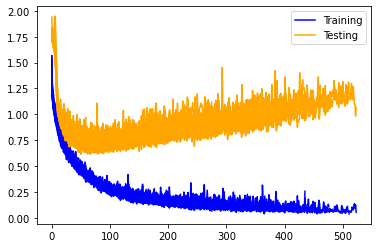

In [13]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

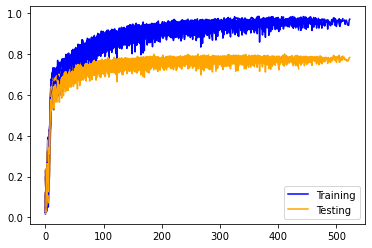

In [14]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

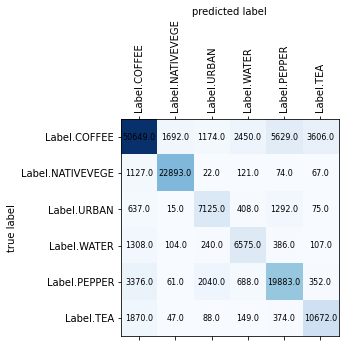

In [15]:
plot_confusion_matrix(conf_matrix, labels)

In [16]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.85893805 0.92265839 0.66657311 0.63275912 0.71940806 0.7172525 ]
Mean precision:  0.7529315395172765

Recalls:  [0.77682515 0.94194371 0.74591709 0.75401376 0.75314394 0.80848485]
Mean recall:  0.7967214168528508

F-Score:  [0.81582063 0.93220132 0.7040166  0.6880854  0.73588956 0.76014103]
Mean f-score:  0.7726924222788968


# BLUE, GREEN, RED, NIR, SWIR1, SWIR2

In [17]:
bands = [
    Band.BLUE.value, 
    Band.GREEN.value, 
    Band.RED.value, 
    Band.NIR.value, 
    Band.SWIR1.value, 
    Band.SWIR2.value,
]

model_name = "blue_green_red_nir_swir1_swir2_panchromatic"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 9, 9, 6)           0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 9, 6)           24        
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 9, 9, 32)          1760      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 3, 3, 64)         

57/57 [==============================] - 1s 9ms/step - loss: 0.2489 - accuracy: 0.8403 - val_loss: 0.7736 - val_accuracy: 0.7431
Epoch 101/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3033 - accuracy: 0.8086 - val_loss: 0.7454 - val_accuracy: 0.7425
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2354 - accuracy: 0.8411 - val_loss: 0.7467 - val_accuracy: 0.7667
Epoch 103/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2541 - accuracy: 0.8559 - val_loss: 0.7596 - val_accuracy: 0.7619
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2756 - accuracy: 0.8562 - val_loss: 0.7371 - val_accuracy: 0.7742
Epoch 105/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2337 - accuracy: 0.8608 - val_loss: 0.8006 - val_accuracy: 0.7429
Epoch 106/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2667 - accuracy: 0.8463 - val_loss: 0.7729 - val_accuracy: 0.7629
Epoch 1

Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1425 - accuracy: 0.9106 - val_loss: 0.7903 - val_accuracy: 0.7888
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1688 - accuracy: 0.9145 - val_loss: 0.7727 - val_accuracy: 0.7782
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1650 - accuracy: 0.8899 - val_loss: 0.9218 - val_accuracy: 0.7427
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2237 - accuracy: 0.8725 - val_loss: 0.8181 - val_accuracy: 0.7754
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1754 - accuracy: 0.8995 - val_loss: 0.7877 - val_accuracy: 0.7651
Epoch 162/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1793 - accuracy: 0.8926 - val_loss: 0.8430 - val_accuracy: 0.7609
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1870 - accuracy: 0.8778 - val_loss: 0.8152 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1368 - accuracy: 0.9138 - val_loss: 0.8594 - val_accuracy: 0.7809
Epoch 215/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1448 - accuracy: 0.9111 - val_loss: 0.9400 - val_accuracy: 0.7713
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1727 - accuracy: 0.9079 - val_loss: 0.8542 - val_accuracy: 0.7903
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1121 - accuracy: 0.9236 - val_loss: 0.9606 - val_accuracy: 0.7660
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1774 - accuracy: 0.8886 - val_loss: 0.8246 - val_accuracy: 0.7860
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1138 - accuracy: 0.9309 - val_loss: 0.8937 - val_accuracy: 0.7820
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1338 - accuracy: 0.9103 - val_loss: 0.8763 - val_accuracy

Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1346 - accuracy: 0.9135 - val_loss: 0.9065 - val_accuracy: 0.7928
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1137 - accuracy: 0.9332 - val_loss: 0.9072 - val_accuracy: 0.7804
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1728 - accuracy: 0.9158 - val_loss: 0.8666 - val_accuracy: 0.7809
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1424 - accuracy: 0.9227 - val_loss: 0.8531 - val_accuracy: 0.7899
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1245 - accuracy: 0.9292 - val_loss: 0.9054 - val_accuracy: 0.7967
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1643 - accuracy: 0.9196 - val_loss: 0.8913 - val_accuracy: 0.7629
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1360 - accuracy: 0.9240 - val_loss: 0.8684 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1213 - accuracy: 0.9321 - val_loss: 0.8765 - val_accuracy: 0.8002
Epoch 329/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0821 - accuracy: 0.9516 - val_loss: 0.8940 - val_accuracy: 0.8065
Epoch 330/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0875 - accuracy: 0.9497 - val_loss: 0.9852 - val_accuracy: 0.8048
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1052 - accuracy: 0.9374 - val_loss: 0.9011 - val_accuracy: 0.8063
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0785 - accuracy: 0.9509 - val_loss: 0.9525 - val_accuracy: 0.8014
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0970 - accuracy: 0.9320 - val_loss: 1.1383 - val_accuracy: 0.7918
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1410 - accuracy: 0.9183 - val_loss: 0.9241 - val_accuracy:

Epoch 385/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2742 - accuracy: 0.8902 - val_loss: 0.9026 - val_accuracy: 0.7510
Epoch 386/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1287 - accuracy: 0.9063 - val_loss: 0.9257 - val_accuracy: 0.7814
Epoch 387/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1196 - accuracy: 0.9240 - val_loss: 0.9330 - val_accuracy: 0.7862
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1110 - accuracy: 0.9305 - val_loss: 0.9241 - val_accuracy: 0.8040
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0577 - accuracy: 0.9572 - val_loss: 0.9958 - val_accuracy: 0.8071
Epoch 390/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1028 - accuracy: 0.9458 - val_loss: 0.9008 - val_accuracy: 0.7978
Epoch 391/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0848 - accuracy: 0.9523 - val_loss: 0.9537 - val_accuracy:

Epoch 442/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0702 - accuracy: 0.9631 - val_loss: 0.9534 - val_accuracy: 0.7966
Epoch 443/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0619 - accuracy: 0.9642 - val_loss: 0.9790 - val_accuracy: 0.8009
Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0470 - accuracy: 0.9730 - val_loss: 1.0688 - val_accuracy: 0.8051
Epoch 445/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0465 - accuracy: 0.9640 - val_loss: 1.0930 - val_accuracy: 0.7846
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1144 - accuracy: 0.9387 - val_loss: 1.0572 - val_accuracy: 0.8067
Epoch 447/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0835 - accuracy: 0.9548 - val_loss: 1.0402 - val_accuracy: 0.7960
Epoch 448/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0719 - accuracy: 0.9527 - val_loss: 1.0559 - val_accuracy:

Epoch 499/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0495 - accuracy: 0.9674 - val_loss: 1.0545 - val_accuracy: 0.7970
Epoch 500/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0724 - accuracy: 0.9495 - val_loss: 1.0439 - val_accuracy: 0.8032
Epoch 501/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0344 - accuracy: 0.9797 - val_loss: 1.1954 - val_accuracy: 0.7951
Epoch 502/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0752 - accuracy: 0.9623 - val_loss: 1.1260 - val_accuracy: 0.8006
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1121 - accuracy: 0.9332 - val_loss: 1.0209 - val_accuracy: 0.8037
Epoch 504/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0492 - accuracy: 0.9730 - val_loss: 1.1260 - val_accuracy: 0.8006
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0497 - accuracy: 0.9781 - val_loss: 1.1969 - val_accuracy:

Epoch 556/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0427 - accuracy: 0.9691 - val_loss: 1.1175 - val_accuracy: 0.8009
Epoch 557/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0509 - accuracy: 0.9696 - val_loss: 1.0932 - val_accuracy: 0.8016
Epoch 558/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0637 - accuracy: 0.9631 - val_loss: 1.1452 - val_accuracy: 0.8078
Epoch 559/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0547 - accuracy: 0.9730 - val_loss: 1.1505 - val_accuracy: 0.7964
Epoch 560/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0564 - accuracy: 0.9619 - val_loss: 1.1533 - val_accuracy: 0.7936
Epoch 561/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0540 - accuracy: 0.9668 - val_loss: 1.1589 - val_accuracy: 0.8032
Epoch 562/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0495 - accuracy: 0.9718 - val_loss: 1.1920 - val_accuracy

Epoch 613/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0811 - accuracy: 0.9637 - val_loss: 1.1482 - val_accuracy: 0.8089
Epoch 614/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0436 - accuracy: 0.9710 - val_loss: 1.1523 - val_accuracy: 0.8067
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0784 - accuracy: 0.9618 - val_loss: 1.1643 - val_accuracy: 0.8101
Epoch 616/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0689 - accuracy: 0.9716 - val_loss: 1.1594 - val_accuracy: 0.7986
Epoch 617/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0846 - accuracy: 0.9584 - val_loss: 1.1054 - val_accuracy: 0.8077
Epoch 618/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0470 - accuracy: 0.9737 - val_loss: 1.1564 - val_accuracy: 0.8023
Epoch 619/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0651 - accuracy: 0.9605 - val_loss: 1.1498 - val_accur

Epoch 670/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0791 - accuracy: 0.9605 - val_loss: 1.1404 - val_accuracy: 0.7994
Epoch 671/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0515 - accuracy: 0.9654 - val_loss: 1.1955 - val_accuracy: 0.8069
Epoch 672/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0412 - accuracy: 0.9809 - val_loss: 1.1666 - val_accuracy: 0.8086
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0457 - accuracy: 0.9743 - val_loss: 1.2187 - val_accuracy: 0.8033
Epoch 674/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0581 - accuracy: 0.9701 - val_loss: 1.2458 - val_accuracy: 0.7928
Epoch 675/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0881 - accuracy: 0.9593 - val_loss: 1.2090 - val_accuracy: 0.7964
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0874 - accuracy: 0.9620 - val_loss: 1.1443 - val_accuracy:

Epoch 50/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4686 - accuracy: 0.7548 - val_loss: 0.6921 - val_accuracy: 0.7485
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4882 - accuracy: 0.7685 - val_loss: 0.7740 - val_accuracy: 0.7203
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5180 - accuracy: 0.7366 - val_loss: 0.8308 - val_accuracy: 0.6882
Epoch 53/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5211 - accuracy: 0.7307 - val_loss: 0.7784 - val_accuracy: 0.7255
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4752 - accuracy: 0.7659 - val_loss: 0.7124 - val_accuracy: 0.7451
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4427 - accuracy: 0.7973 - val_loss: 0.7938 - val_accuracy: 0.7093
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4394 - accuracy: 0.7470 - val_loss: 0.8431 - val_accuracy: 0.6924

Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2194 - accuracy: 0.8576 - val_loss: 0.7525 - val_accuracy: 0.7715
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1815 - accuracy: 0.8784 - val_loss: 0.8554 - val_accuracy: 0.7753
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1758 - accuracy: 0.8870 - val_loss: 0.7665 - val_accuracy: 0.7985
Epoch 167/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1701 - accuracy: 0.9105 - val_loss: 0.8028 - val_accuracy: 0.7868
Epoch 168/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1808 - accuracy: 0.8998 - val_loss: 0.8942 - val_accuracy: 0.7476
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2064 - accuracy: 0.8657 - val_loss: 0.8574 - val_accuracy: 0.7571
Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2554 - accuracy: 0.8484 - val_loss: 0.8172 - val_accuracy:

Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1329 - accuracy: 0.9237 - val_loss: 0.9101 - val_accuracy: 0.7928
Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1656 - accuracy: 0.9101 - val_loss: 0.8221 - val_accuracy: 0.7836
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1614 - accuracy: 0.9133 - val_loss: 0.8138 - val_accuracy: 0.7977
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1193 - accuracy: 0.9233 - val_loss: 0.8787 - val_accuracy: 0.7926
Epoch 225/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1445 - accuracy: 0.9123 - val_loss: 0.8346 - val_accuracy: 0.7920
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1207 - accuracy: 0.9223 - val_loss: 0.8659 - val_accuracy: 0.7891
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2405 - accuracy: 0.8883 - val_loss: 0.8081 - val_accuracy:

Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2244 - accuracy: 0.9017 - val_loss: 1.0319 - val_accuracy: 0.7689
Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2112 - accuracy: 0.8992 - val_loss: 0.8808 - val_accuracy: 0.7707
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1767 - accuracy: 0.8990 - val_loss: 0.8707 - val_accuracy: 0.8016
Epoch 281/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0928 - accuracy: 0.9534 - val_loss: 0.9731 - val_accuracy: 0.7806
Epoch 282/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1029 - accuracy: 0.9245 - val_loss: 0.8995 - val_accuracy: 0.8024
Epoch 283/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1081 - accuracy: 0.9414 - val_loss: 0.9442 - val_accuracy: 0.7977
Epoch 284/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1137 - accuracy: 0.9239 - val_loss: 0.9983 - val_accuracy:

Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0854 - accuracy: 0.9524 - val_loss: 0.9198 - val_accuracy: 0.8055
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0877 - accuracy: 0.9452 - val_loss: 1.0010 - val_accuracy: 0.8002
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9517 - val_loss: 0.9383 - val_accuracy: 0.8023
Epoch 338/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0784 - accuracy: 0.9594 - val_loss: 0.9347 - val_accuracy: 0.8045
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1253 - accuracy: 0.9392 - val_loss: 1.0292 - val_accuracy: 0.7852
Epoch 340/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0902 - accuracy: 0.9389 - val_loss: 0.9948 - val_accuracy: 0.7985
Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9515 - val_loss: 0.9547 - val_accuracy

Epoch 392/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1097 - accuracy: 0.9386 - val_loss: 1.0705 - val_accuracy: 0.8039
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0550 - accuracy: 0.9633 - val_loss: 1.1693 - val_accuracy: 0.7958
Epoch 394/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0876 - accuracy: 0.9478 - val_loss: 1.0612 - val_accuracy: 0.8034
Epoch 395/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0667 - accuracy: 0.9629 - val_loss: 1.0765 - val_accuracy: 0.8023
Epoch 396/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0637 - accuracy: 0.9580 - val_loss: 1.1343 - val_accuracy: 0.8040
Epoch 397/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0761 - accuracy: 0.9518 - val_loss: 1.0941 - val_accuracy: 0.7982
Epoch 398/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0592 - accuracy: 0.9595 - val_loss: 1.0990 - val_accurac

Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0994 - accuracy: 0.9456 - val_loss: 1.0615 - val_accuracy: 0.8103
Epoch 450/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0590 - accuracy: 0.9631 - val_loss: 1.0774 - val_accuracy: 0.8073
Epoch 451/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1104 - accuracy: 0.9589 - val_loss: 1.1974 - val_accuracy: 0.8000
Epoch 452/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0671 - accuracy: 0.9628 - val_loss: 1.0395 - val_accuracy: 0.8126
Epoch 453/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0837 - accuracy: 0.9612 - val_loss: 1.1657 - val_accuracy: 0.7936
Epoch 454/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0674 - accuracy: 0.9657 - val_loss: 1.1041 - val_accuracy: 0.8077
Epoch 455/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0617 - accuracy: 0.9506 - val_loss: 1.1316 - val_accuracy

Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5935 - accuracy: 0.7194 - val_loss: 0.8179 - val_accuracy: 0.6891
Epoch 43/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5197 - accuracy: 0.7222 - val_loss: 0.9329 - val_accuracy: 0.6407
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5431 - accuracy: 0.7371 - val_loss: 0.7707 - val_accuracy: 0.7126
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5427 - accuracy: 0.7267 - val_loss: 0.7752 - val_accuracy: 0.7034
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5479 - accuracy: 0.7338 - val_loss: 0.7709 - val_accuracy: 0.7042
Epoch 47/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4720 - accuracy: 0.7681 - val_loss: 0.8458 - val_accuracy: 0.6712
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5823 - accuracy: 0.7191 - val_loss: 0.7743 - val_accuracy: 0.720

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1933 - accuracy: 0.8911 - val_loss: 0.8051 - val_accuracy: 0.7658
Epoch 157/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1980 - accuracy: 0.8889 - val_loss: 0.8797 - val_accuracy: 0.7540
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2753 - accuracy: 0.8643 - val_loss: 0.7899 - val_accuracy: 0.7882
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1745 - accuracy: 0.9050 - val_loss: 0.8448 - val_accuracy: 0.7732
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2382 - accuracy: 0.8878 - val_loss: 0.9051 - val_accuracy: 0.7441
Epoch 161/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1790 - accuracy: 0.8916 - val_loss: 0.8665 - val_accuracy: 0.7848
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2024 - accuracy: 0.8843 - val_loss: 0.8302 - val_accuracy

Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1683 - accuracy: 0.8949 - val_loss: 0.8721 - val_accuracy: 0.7765
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1518 - accuracy: 0.9103 - val_loss: 0.8421 - val_accuracy: 0.7818
Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1399 - accuracy: 0.9159 - val_loss: 0.8782 - val_accuracy: 0.7807
Epoch 216/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1481 - accuracy: 0.9069 - val_loss: 0.8787 - val_accuracy: 0.7844
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1477 - accuracy: 0.9135 - val_loss: 0.8612 - val_accuracy: 0.7886
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2120 - accuracy: 0.8795 - val_loss: 0.9252 - val_accuracy: 0.7659
Epoch 219/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1473 - accuracy: 0.9087 - val_loss: 1.0421 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1731 - accuracy: 0.9048 - val_loss: 0.9570 - val_accuracy: 0.7894
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1183 - accuracy: 0.9383 - val_loss: 0.9868 - val_accuracy: 0.7969
Epoch 272/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.1149 - accuracy: 0.9332 - val_loss: 1.0268 - val_accuracy: 0.7669
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1518 - accuracy: 0.9071 - val_loss: 1.0381 - val_accuracy: 0.7823
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1493 - accuracy: 0.9242 - val_loss: 1.0030 - val_accuracy: 0.7746
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1492 - accuracy: 0.9204 - val_loss: 1.1193 - val_accuracy: 0.7479
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1578 - accuracy: 0.9015 - val_loss: 0.9987 - val_accuracy

Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1096 - accuracy: 0.9214 - val_loss: 1.0616 - val_accuracy: 0.7874
Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1289 - accuracy: 0.9339 - val_loss: 1.0012 - val_accuracy: 0.7747
Epoch 329/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1118 - accuracy: 0.9240 - val_loss: 0.9811 - val_accuracy: 0.7941
Epoch 330/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1041 - accuracy: 0.9443 - val_loss: 1.0246 - val_accuracy: 0.7922
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0858 - accuracy: 0.9431 - val_loss: 1.0240 - val_accuracy: 0.7973
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0994 - accuracy: 0.9385 - val_loss: 0.9798 - val_accuracy: 0.8002
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0668 - accuracy: 0.9612 - val_loss: 0.9604 - val_accuracy:

Epoch 384/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0969 - accuracy: 0.9556 - val_loss: 1.0549 - val_accuracy: 0.7875
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0817 - accuracy: 0.9504 - val_loss: 1.0001 - val_accuracy: 0.7966
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0650 - accuracy: 0.9591 - val_loss: 1.0428 - val_accuracy: 0.8046
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0735 - accuracy: 0.9622 - val_loss: 1.0219 - val_accuracy: 0.8089
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0895 - accuracy: 0.9452 - val_loss: 1.0823 - val_accuracy: 0.7856
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1252 - accuracy: 0.9188 - val_loss: 1.2595 - val_accuracy: 0.7403
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2045 - accuracy: 0.8994 - val_loss: 0.9729 - val_accuracy:

Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1300 - accuracy: 0.9343 - val_loss: 1.1001 - val_accuracy: 0.7648
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1027 - accuracy: 0.9348 - val_loss: 1.0815 - val_accuracy: 0.7819
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0773 - accuracy: 0.9495 - val_loss: 1.1388 - val_accuracy: 0.7922
Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0800 - accuracy: 0.9489 - val_loss: 1.2661 - val_accuracy: 0.7533
Epoch 445/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1307 - accuracy: 0.9314 - val_loss: 1.0201 - val_accuracy: 0.7868
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0856 - accuracy: 0.9589 - val_loss: 1.0390 - val_accuracy: 0.7982
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0887 - accuracy: 0.9551 - val_loss: 1.1149 - val_accuracy:

Epoch 498/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0880 - accuracy: 0.9489 - val_loss: 1.0742 - val_accuracy: 0.7977
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0579 - accuracy: 0.9630 - val_loss: 1.0571 - val_accuracy: 0.8034
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0597 - accuracy: 0.9619 - val_loss: 1.1340 - val_accuracy: 0.7932
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0806 - accuracy: 0.9578 - val_loss: 1.1740 - val_accuracy: 0.7869
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0608 - accuracy: 0.9603 - val_loss: 1.1532 - val_accuracy: 0.8008
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0689 - accuracy: 0.9575 - val_loss: 1.1826 - val_accuracy: 0.7886
Epoch 504/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0489 - accuracy: 0.9640 - val_loss: 1.2161 - val_accuracy:

Epoch 555/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0871 - accuracy: 0.9606 - val_loss: 1.0975 - val_accuracy: 0.7825
Epoch 556/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0877 - accuracy: 0.9468 - val_loss: 1.0919 - val_accuracy: 0.7936
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0679 - accuracy: 0.9612 - val_loss: 1.1050 - val_accuracy: 0.7932
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0573 - accuracy: 0.9680 - val_loss: 1.0723 - val_accuracy: 0.7926
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0504 - accuracy: 0.9641 - val_loss: 1.0938 - val_accuracy: 0.8019
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0377 - accuracy: 0.9700 - val_loss: 1.1333 - val_accuracy: 0.7893
Epoch 561/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0502 - accuracy: 0.9715 - val_loss: 1.1369 - val_accuracy

Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5560 - accuracy: 0.7216 - val_loss: 0.8017 - val_accuracy: 0.6853
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5546 - accuracy: 0.7091 - val_loss: 0.7321 - val_accuracy: 0.7152
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4838 - accuracy: 0.7371 - val_loss: 0.8010 - val_accuracy: 0.7168
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5041 - accuracy: 0.7308 - val_loss: 0.6895 - val_accuracy: 0.7409
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5093 - accuracy: 0.7486 - val_loss: 0.6908 - val_accuracy: 0.7431
Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4896 - accuracy: 0.7525 - val_loss: 0.8321 - val_accuracy: 0.7034
Epoch 50/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4854 - accuracy: 0.7440 - val_loss: 0.8452 - val_accuracy: 0.6820

Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2008 - accuracy: 0.8800 - val_loss: 0.8075 - val_accuracy: 0.7753
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2251 - accuracy: 0.8714 - val_loss: 0.8143 - val_accuracy: 0.7723
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1852 - accuracy: 0.8957 - val_loss: 0.8177 - val_accuracy: 0.7802
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1475 - accuracy: 0.9145 - val_loss: 0.8443 - val_accuracy: 0.7846
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1837 - accuracy: 0.8861 - val_loss: 0.9503 - val_accuracy: 0.7423
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2042 - accuracy: 0.8751 - val_loss: 0.7657 - val_accuracy: 0.7863
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1794 - accuracy: 0.8929 - val_loss: 0.8938 - val_accuracy:

Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1568 - accuracy: 0.8986 - val_loss: 0.8120 - val_accuracy: 0.7981
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1078 - accuracy: 0.9221 - val_loss: 0.9546 - val_accuracy: 0.7815
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1525 - accuracy: 0.9048 - val_loss: 0.9057 - val_accuracy: 0.7616
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2337 - accuracy: 0.8706 - val_loss: 1.0052 - val_accuracy: 0.7381
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1928 - accuracy: 0.8974 - val_loss: 0.8403 - val_accuracy: 0.7774
Epoch 220/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1659 - accuracy: 0.9016 - val_loss: 0.7926 - val_accuracy: 0.7857
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1622 - accuracy: 0.9037 - val_loss: 0.8087 - val_accuracy:

Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1098 - accuracy: 0.9256 - val_loss: 0.9757 - val_accuracy: 0.7906
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1012 - accuracy: 0.9422 - val_loss: 1.0677 - val_accuracy: 0.7852
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1113 - accuracy: 0.9259 - val_loss: 0.9913 - val_accuracy: 0.7882
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1275 - accuracy: 0.9148 - val_loss: 0.9780 - val_accuracy: 0.7955
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1015 - accuracy: 0.9405 - val_loss: 0.9436 - val_accuracy: 0.7905
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1137 - accuracy: 0.9358 - val_loss: 0.9611 - val_accuracy: 0.7918
Epoch 278/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1383 - accuracy: 0.9138 - val_loss: 0.9662 - val_accuracy:

Epoch 329/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0793 - accuracy: 0.9525 - val_loss: 0.9408 - val_accuracy: 0.8084
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1757 - accuracy: 0.9243 - val_loss: 0.8506 - val_accuracy: 0.8024
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1378 - accuracy: 0.9290 - val_loss: 0.9551 - val_accuracy: 0.7941
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1754 - accuracy: 0.9086 - val_loss: 0.9258 - val_accuracy: 0.8038
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0901 - accuracy: 0.9435 - val_loss: 0.9342 - val_accuracy: 0.7898
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1584 - accuracy: 0.9255 - val_loss: 0.8844 - val_accuracy: 0.8051
Epoch 335/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1317 - accuracy: 0.9369 - val_loss: 1.0033 - val_accuracy

Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5221 - accuracy: 0.7662 - val_loss: 0.7355 - val_accuracy: 0.7251
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5085 - accuracy: 0.7773 - val_loss: 0.7458 - val_accuracy: 0.7164
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4997 - accuracy: 0.7665 - val_loss: 0.8139 - val_accuracy: 0.6896
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5149 - accuracy: 0.7754 - val_loss: 0.7095 - val_accuracy: 0.7409
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5408 - accuracy: 0.7705 - val_loss: 0.7837 - val_accuracy: 0.7127
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4937 - accuracy: 0.7600 - val_loss: 0.7221 - val_accuracy: 0.7276
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4272 - accuracy: 0.7899 - val_loss: 0.7760 - val_accuracy: 0.7171

Epoch 160/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1847 - accuracy: 0.8974 - val_loss: 0.8123 - val_accuracy: 0.7781
Epoch 161/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2046 - accuracy: 0.8837 - val_loss: 0.8105 - val_accuracy: 0.7736
Epoch 162/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1883 - accuracy: 0.8915 - val_loss: 0.8382 - val_accuracy: 0.7852
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2179 - accuracy: 0.8922 - val_loss: 0.8712 - val_accuracy: 0.7593
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1926 - accuracy: 0.9027 - val_loss: 0.9140 - val_accuracy: 0.7340
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2185 - accuracy: 0.8812 - val_loss: 0.9749 - val_accuracy: 0.7411
Epoch 166/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2382 - accuracy: 0.8711 - val_loss: 0.8606 - val_accuracy:

Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1634 - accuracy: 0.9119 - val_loss: 0.8581 - val_accuracy: 0.7750
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1492 - accuracy: 0.9188 - val_loss: 0.8669 - val_accuracy: 0.7888
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1035 - accuracy: 0.9414 - val_loss: 0.9301 - val_accuracy: 0.7966
Epoch 220/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1327 - accuracy: 0.9376 - val_loss: 0.9665 - val_accuracy: 0.7827
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1850 - accuracy: 0.8923 - val_loss: 1.0227 - val_accuracy: 0.7589
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1939 - accuracy: 0.9019 - val_loss: 0.8777 - val_accuracy: 0.7633
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1546 - accuracy: 0.9098 - val_loss: 0.8597 - val_accuracy:

Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1138 - accuracy: 0.9382 - val_loss: 0.9763 - val_accuracy: 0.7878
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1236 - accuracy: 0.9382 - val_loss: 0.9912 - val_accuracy: 0.7931
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1171 - accuracy: 0.9275 - val_loss: 0.9715 - val_accuracy: 0.7977
Epoch 277/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1156 - accuracy: 0.9330 - val_loss: 1.0764 - val_accuracy: 0.7743
Epoch 278/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1347 - accuracy: 0.9275 - val_loss: 1.1165 - val_accuracy: 0.7591
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2294 - accuracy: 0.8912 - val_loss: 0.8539 - val_accuracy: 0.7861
Epoch 280/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1488 - accuracy: 0.9072 - val_loss: 0.8892 - val_accuracy

Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1224 - accuracy: 0.9347 - val_loss: 1.0372 - val_accuracy: 0.7825
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1089 - accuracy: 0.9319 - val_loss: 1.0123 - val_accuracy: 0.7932
Epoch 333/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0906 - accuracy: 0.9463 - val_loss: 1.0759 - val_accuracy: 0.7792
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1228 - accuracy: 0.9343 - val_loss: 1.0950 - val_accuracy: 0.7723
Epoch 335/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1336 - accuracy: 0.9362 - val_loss: 1.0251 - val_accuracy: 0.7622
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1299 - accuracy: 0.9259 - val_loss: 1.0403 - val_accuracy: 0.7784
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1098 - accuracy: 0.9283 - val_loss: 0.9735 - val_accuracy:

Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0918 - accuracy: 0.9395 - val_loss: 1.0511 - val_accuracy: 0.7936
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0755 - accuracy: 0.9541 - val_loss: 1.1732 - val_accuracy: 0.7720
Epoch 390/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0999 - accuracy: 0.9478 - val_loss: 1.1153 - val_accuracy: 0.7802
Epoch 391/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0761 - accuracy: 0.9604 - val_loss: 1.0869 - val_accuracy: 0.7878
Epoch 392/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0914 - accuracy: 0.9528 - val_loss: 1.0866 - val_accuracy: 0.7893
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0919 - accuracy: 0.9462 - val_loss: 1.2475 - val_accuracy: 0.7521
Epoch 394/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1694 - accuracy: 0.9300 - val_loss: 1.0711 - val_accuracy:

Epoch 37/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6310 - accuracy: 0.6726 - val_loss: 0.7753 - val_accuracy: 0.7060
Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5949 - accuracy: 0.7323 - val_loss: 0.7076 - val_accuracy: 0.7439
Epoch 39/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5271 - accuracy: 0.7215 - val_loss: 0.8404 - val_accuracy: 0.6737
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5358 - accuracy: 0.7066 - val_loss: 0.8603 - val_accuracy: 0.6743
Epoch 41/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5211 - accuracy: 0.7065 - val_loss: 0.7902 - val_accuracy: 0.6983
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4904 - accuracy: 0.7273 - val_loss: 0.7668 - val_accuracy: 0.7245
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4938 - accuracy: 0.7389 - val_loss: 0.8417 - val_accuracy: 0.6854

57/57 [==============================] - 0s 8ms/step - loss: 0.2320 - accuracy: 0.8591 - val_loss: 0.9349 - val_accuracy: 0.7394
Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1992 - accuracy: 0.8593 - val_loss: 0.8286 - val_accuracy: 0.7812
Epoch 153/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1585 - accuracy: 0.8993 - val_loss: 0.8880 - val_accuracy: 0.7816
Epoch 154/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1983 - accuracy: 0.8868 - val_loss: 0.9203 - val_accuracy: 0.7553
Epoch 155/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1820 - accuracy: 0.8873 - val_loss: 0.9246 - val_accuracy: 0.7543
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2258 - accuracy: 0.8726 - val_loss: 0.8812 - val_accuracy: 0.7675
Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2101 - accuracy: 0.8589 - val_loss: 0.8764 - val_accuracy: 0.7558
Epoch 1

Epoch 208/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1503 - accuracy: 0.9084 - val_loss: 0.9042 - val_accuracy: 0.7720
Epoch 209/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1648 - accuracy: 0.9003 - val_loss: 0.8860 - val_accuracy: 0.7841
Epoch 210/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1419 - accuracy: 0.9115 - val_loss: 0.8646 - val_accuracy: 0.7884
Epoch 211/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1425 - accuracy: 0.9034 - val_loss: 0.9198 - val_accuracy: 0.7892
Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1597 - accuracy: 0.9040 - val_loss: 0.8964 - val_accuracy: 0.7839
Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1792 - accuracy: 0.8828 - val_loss: 0.9495 - val_accuracy: 0.7729
Epoch 214/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1715 - accuracy: 0.8908 - val_loss: 0.9129 - val_accuracy:

Epoch 265/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1288 - accuracy: 0.9351 - val_loss: 0.9433 - val_accuracy: 0.7932
Epoch 266/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1248 - accuracy: 0.9347 - val_loss: 1.0035 - val_accuracy: 0.7846
Epoch 267/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1097 - accuracy: 0.9229 - val_loss: 0.9971 - val_accuracy: 0.7854
Epoch 268/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1657 - accuracy: 0.9115 - val_loss: 0.9122 - val_accuracy: 0.7865
Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1181 - accuracy: 0.9365 - val_loss: 0.9089 - val_accuracy: 0.7934
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1175 - accuracy: 0.9319 - val_loss: 1.0057 - val_accuracy: 0.7778
Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1754 - accuracy: 0.9116 - val_loss: 0.9351 - val_accuracy:

Epoch 322/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1118 - accuracy: 0.9242 - val_loss: 1.1155 - val_accuracy: 0.7941
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0884 - accuracy: 0.9586 - val_loss: 1.1840 - val_accuracy: 0.7880
Epoch 324/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1208 - accuracy: 0.9269 - val_loss: 1.0378 - val_accuracy: 0.7861
Epoch 325/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1223 - accuracy: 0.9338 - val_loss: 1.0190 - val_accuracy: 0.7917
Epoch 326/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1023 - accuracy: 0.9403 - val_loss: 1.0604 - val_accuracy: 0.7975
Epoch 327/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1168 - accuracy: 0.9363 - val_loss: 1.0722 - val_accuracy: 0.7771
Epoch 328/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2067 - accuracy: 0.9026 - val_loss: 0.9744 - val_accura

Epoch 379/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0757 - accuracy: 0.9544 - val_loss: 1.0852 - val_accuracy: 0.8005
Epoch 380/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0719 - accuracy: 0.9598 - val_loss: 1.1785 - val_accuracy: 0.7866
Epoch 381/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0791 - accuracy: 0.9535 - val_loss: 1.1632 - val_accuracy: 0.8086
Epoch 382/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0721 - accuracy: 0.9658 - val_loss: 1.1204 - val_accuracy: 0.7816
Epoch 383/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0966 - accuracy: 0.9348 - val_loss: 1.1785 - val_accuracy: 0.7748
Epoch 384/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1230 - accuracy: 0.9288 - val_loss: 1.0869 - val_accuracy: 0.7849
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0894 - accuracy: 0.9426 - val_loss: 1.1045 - val_accuracy:

Epoch 436/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0862 - accuracy: 0.9473 - val_loss: 1.0975 - val_accuracy: 0.7978
Epoch 437/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0843 - accuracy: 0.9600 - val_loss: 1.1430 - val_accuracy: 0.7926
Epoch 438/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0778 - accuracy: 0.9496 - val_loss: 1.1642 - val_accuracy: 0.8028
Epoch 439/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0937 - accuracy: 0.9465 - val_loss: 1.2341 - val_accuracy: 0.7876
Epoch 440/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0670 - accuracy: 0.9606 - val_loss: 1.2392 - val_accuracy: 0.7937
Epoch 441/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1010 - accuracy: 0.9438 - val_loss: 1.1349 - val_accuracy: 0.7933
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0787 - accuracy: 0.9541 - val_loss: 1.1521 - val_accuracy:

Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6491 - accuracy: 0.7056 - val_loss: 0.9646 - val_accuracy: 0.6318
Epoch 32/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6589 - accuracy: 0.6961 - val_loss: 0.7529 - val_accuracy: 0.7225
Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5609 - accuracy: 0.7447 - val_loss: 0.8359 - val_accuracy: 0.6812
Epoch 34/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5622 - accuracy: 0.7309 - val_loss: 0.8295 - val_accuracy: 0.6951
Epoch 35/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6193 - accuracy: 0.6956 - val_loss: 0.7330 - val_accuracy: 0.7183
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5648 - accuracy: 0.7168 - val_loss: 0.8093 - val_accuracy: 0.6872
Epoch 37/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5615 - accuracy: 0.7279 - val_loss: 0.7879 - val_accuracy: 0.706

57/57 [==============================] - 0s 8ms/step - loss: 0.2212 - accuracy: 0.8867 - val_loss: 0.8327 - val_accuracy: 0.7648
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2339 - accuracy: 0.8732 - val_loss: 0.8707 - val_accuracy: 0.7526
Epoch 147/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1848 - accuracy: 0.8780 - val_loss: 0.8426 - val_accuracy: 0.7685
Epoch 148/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1728 - accuracy: 0.8891 - val_loss: 0.8132 - val_accuracy: 0.7757
Epoch 149/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2221 - accuracy: 0.8834 - val_loss: 0.8272 - val_accuracy: 0.7726
Epoch 150/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2143 - accuracy: 0.8956 - val_loss: 0.9101 - val_accuracy: 0.7454
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2112 - accuracy: 0.8875 - val_loss: 0.8304 - val_accuracy: 0.7538
Epoch 1

Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1478 - accuracy: 0.9103 - val_loss: 0.8951 - val_accuracy: 0.7818
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1218 - accuracy: 0.9265 - val_loss: 0.9295 - val_accuracy: 0.7846
Epoch 204/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1476 - accuracy: 0.9098 - val_loss: 0.8714 - val_accuracy: 0.7958
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1227 - accuracy: 0.9275 - val_loss: 0.9759 - val_accuracy: 0.7769
Epoch 206/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1769 - accuracy: 0.8930 - val_loss: 1.0106 - val_accuracy: 0.7586
Epoch 207/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1873 - accuracy: 0.8765 - val_loss: 0.8723 - val_accuracy: 0.7855
Epoch 208/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1452 - accuracy: 0.8921 - val_loss: 0.9136 - val_accuracy

Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1111 - accuracy: 0.9390 - val_loss: 0.9637 - val_accuracy: 0.7992
Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1035 - accuracy: 0.9437 - val_loss: 0.9566 - val_accuracy: 0.7992
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1333 - accuracy: 0.9258 - val_loss: 0.9117 - val_accuracy: 0.7983
Epoch 262/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0989 - accuracy: 0.9412 - val_loss: 0.9437 - val_accuracy: 0.7895
Epoch 263/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1308 - accuracy: 0.9332 - val_loss: 0.9936 - val_accuracy: 0.7793
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1493 - accuracy: 0.9210 - val_loss: 1.0050 - val_accuracy: 0.7954
Epoch 265/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1004 - accuracy: 0.9413 - val_loss: 0.9403 - val_accuracy:

Epoch 316/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1659 - accuracy: 0.9096 - val_loss: 0.9748 - val_accuracy: 0.7925
Epoch 317/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1225 - accuracy: 0.9355 - val_loss: 0.9681 - val_accuracy: 0.7871
Epoch 318/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0807 - accuracy: 0.9514 - val_loss: 0.9411 - val_accuracy: 0.7903
Epoch 319/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0968 - accuracy: 0.9419 - val_loss: 0.9375 - val_accuracy: 0.8047
Epoch 320/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0842 - accuracy: 0.9545 - val_loss: 1.0528 - val_accuracy: 0.8027
Epoch 321/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0781 - accuracy: 0.9545 - val_loss: 1.0473 - val_accuracy: 0.7909
Epoch 322/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0772 - accuracy: 0.9489 - val_loss: 1.1455 - val_accuracy

Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0882 - accuracy: 0.9389 - val_loss: 1.0872 - val_accuracy: 0.7937
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0700 - accuracy: 0.9635 - val_loss: 1.0603 - val_accuracy: 0.8008
Epoch 375/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0787 - accuracy: 0.9405 - val_loss: 1.0385 - val_accuracy: 0.8043
Epoch 376/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0664 - accuracy: 0.9698 - val_loss: 1.0776 - val_accuracy: 0.7948
Epoch 377/2000
57/57 [==============================] - 1s 16ms/step - loss: 0.0576 - accuracy: 0.9680 - val_loss: 1.1017 - val_accuracy: 0.8042
Epoch 378/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0902 - accuracy: 0.9541 - val_loss: 1.0769 - val_accuracy: 0.7912
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1022 - accuracy: 0.9561 - val_loss: 1.1823 - val_accuracy

57/57 [==============================] - 1s 13ms/step - loss: 0.4445 - accuracy: 0.7297 - val_loss: 0.8710 - val_accuracy: 0.6993
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4256 - accuracy: 0.7508 - val_loss: 0.7794 - val_accuracy: 0.7293
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4579 - accuracy: 0.7792 - val_loss: 0.7836 - val_accuracy: 0.7118
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4296 - accuracy: 0.7584 - val_loss: 0.8076 - val_accuracy: 0.6990
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4172 - accuracy: 0.7837 - val_loss: 0.7021 - val_accuracy: 0.7484
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4366 - accuracy: 0.7862 - val_loss: 0.8852 - val_accuracy: 0.6803
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4177 - accuracy: 0.7738 - val_loss: 0.7227 - val_accuracy: 0.7340
Epoch 74/200

Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1733 - accuracy: 0.8950 - val_loss: 0.9058 - val_accuracy: 0.7726
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1954 - accuracy: 0.9002 - val_loss: 0.8054 - val_accuracy: 0.7978
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1569 - accuracy: 0.9077 - val_loss: 0.8916 - val_accuracy: 0.7806
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2328 - accuracy: 0.8690 - val_loss: 0.8045 - val_accuracy: 0.7888
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1682 - accuracy: 0.9054 - val_loss: 0.8291 - val_accuracy: 0.7950
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1315 - accuracy: 0.9122 - val_loss: 0.8770 - val_accuracy: 0.7894
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1767 - accuracy: 0.9008 - val_loss: 0.9664 - val_accuracy:

Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1598 - accuracy: 0.9149 - val_loss: 0.8592 - val_accuracy: 0.7860
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1548 - accuracy: 0.9188 - val_loss: 0.8610 - val_accuracy: 0.7910
Epoch 240/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1089 - accuracy: 0.9293 - val_loss: 0.9282 - val_accuracy: 0.7769
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1672 - accuracy: 0.9077 - val_loss: 0.9374 - val_accuracy: 0.7826
Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1459 - accuracy: 0.9093 - val_loss: 1.0017 - val_accuracy: 0.7981
Epoch 243/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1637 - accuracy: 0.9026 - val_loss: 1.0747 - val_accuracy: 0.7567
Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2158 - accuracy: 0.8887 - val_loss: 0.9099 - val_accuracy:

Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1457 - accuracy: 0.9128 - val_loss: 0.9817 - val_accuracy: 0.7848
Epoch 296/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1668 - accuracy: 0.9043 - val_loss: 0.9623 - val_accuracy: 0.7872
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1641 - accuracy: 0.9222 - val_loss: 0.9316 - val_accuracy: 0.7871
Epoch 298/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0990 - accuracy: 0.9272 - val_loss: 0.9822 - val_accuracy: 0.7897
Epoch 299/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1131 - accuracy: 0.9242 - val_loss: 1.0404 - val_accuracy: 0.7943
Epoch 300/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1487 - accuracy: 0.9260 - val_loss: 1.0192 - val_accuracy: 0.7837
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1265 - accuracy: 0.9215 - val_loss: 0.9631 - val_accurac

Epoch 352/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0998 - accuracy: 0.9461 - val_loss: 1.0558 - val_accuracy: 0.7878
Epoch 353/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0888 - accuracy: 0.9377 - val_loss: 1.0316 - val_accuracy: 0.7876
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1176 - accuracy: 0.9431 - val_loss: 1.0416 - val_accuracy: 0.7918
Epoch 355/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1109 - accuracy: 0.9339 - val_loss: 1.1210 - val_accuracy: 0.7842
Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0948 - accuracy: 0.9358 - val_loss: 1.0309 - val_accuracy: 0.7901
Epoch 357/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1022 - accuracy: 0.9344 - val_loss: 1.0748 - val_accuracy: 0.8005
Epoch 358/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1018 - accuracy: 0.9346 - val_loss: 1.0469 - val_accuracy:

Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5400 - accuracy: 0.7266 - val_loss: 0.7030 - val_accuracy: 0.7289
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4826 - accuracy: 0.7386 - val_loss: 0.9154 - val_accuracy: 0.6678
Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5437 - accuracy: 0.7415 - val_loss: 0.8345 - val_accuracy: 0.6825
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5087 - accuracy: 0.7505 - val_loss: 0.7688 - val_accuracy: 0.7124
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4907 - accuracy: 0.7571 - val_loss: 0.7872 - val_accuracy: 0.6979
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5621 - accuracy: 0.7398 - val_loss: 0.7259 - val_accuracy: 0.7278
Epoch 53/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5155 - accuracy: 0.7542 - val_loss: 0.7860 - val_accuracy: 0.7025

Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2171 - accuracy: 0.8805 - val_loss: 0.8951 - val_accuracy: 0.7688
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2570 - accuracy: 0.8696 - val_loss: 0.8174 - val_accuracy: 0.7608
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8462 - val_loss: 0.8056 - val_accuracy: 0.7461
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2440 - accuracy: 0.8575 - val_loss: 0.8271 - val_accuracy: 0.7560
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1828 - accuracy: 0.8777 - val_loss: 0.8055 - val_accuracy: 0.7996
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2434 - accuracy: 0.8795 - val_loss: 0.8530 - val_accuracy: 0.7677
Epoch 167/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1657 - accuracy: 0.8853 - val_loss: 0.8752 - val_accuracy:

Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1636 - accuracy: 0.9035 - val_loss: 0.9028 - val_accuracy: 0.7739
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1046 - accuracy: 0.9298 - val_loss: 0.8894 - val_accuracy: 0.7912
Epoch 220/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1616 - accuracy: 0.9147 - val_loss: 0.8944 - val_accuracy: 0.7841
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1725 - accuracy: 0.8984 - val_loss: 0.8659 - val_accuracy: 0.7818
Epoch 222/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2343 - accuracy: 0.8859 - val_loss: 1.2141 - val_accuracy: 0.6967
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2415 - accuracy: 0.8339 - val_loss: 0.8116 - val_accuracy: 0.7715
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1328 - accuracy: 0.9183 - val_loss: 0.9038 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.4047 - accuracy: 0.7757 - val_loss: 0.7549 - val_accuracy: 0.7226
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4787 - accuracy: 0.7842 - val_loss: 0.7547 - val_accuracy: 0.7255
Epoch 68/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3868 - accuracy: 0.7877 - val_loss: 0.7802 - val_accuracy: 0.7314
Epoch 69/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4227 - accuracy: 0.7744 - val_loss: 0.7415 - val_accuracy: 0.7214
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4037 - accuracy: 0.7725 - val_loss: 0.8115 - val_accuracy: 0.7119
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4099 - accuracy: 0.7879 - val_loss: 0.7390 - val_accuracy: 0.7180
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3766 - accuracy: 0.8084 - val_loss: 0.7939 - val_accuracy: 0.7065
Epoch 73/2000

Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1807 - accuracy: 0.8914 - val_loss: 0.8782 - val_accuracy: 0.7715
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1542 - accuracy: 0.9158 - val_loss: 0.8536 - val_accuracy: 0.7760
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1887 - accuracy: 0.9096 - val_loss: 0.8247 - val_accuracy: 0.7739
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2484 - accuracy: 0.8574 - val_loss: 0.8560 - val_accuracy: 0.7572
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1762 - accuracy: 0.9013 - val_loss: 0.7715 - val_accuracy: 0.7780
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2083 - accuracy: 0.8918 - val_loss: 0.8227 - val_accuracy: 0.7751
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1920 - accuracy: 0.8946 - val_loss: 0.7857 - val_accuracy:

Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1540 - accuracy: 0.9088 - val_loss: 0.8669 - val_accuracy: 0.7693
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1364 - accuracy: 0.9217 - val_loss: 0.9022 - val_accuracy: 0.7637
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1433 - accuracy: 0.9155 - val_loss: 0.8938 - val_accuracy: 0.7914
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1410 - accuracy: 0.9142 - val_loss: 0.8829 - val_accuracy: 0.7749
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1493 - accuracy: 0.9074 - val_loss: 0.8762 - val_accuracy: 0.7831
Epoch 242/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1499 - accuracy: 0.9159 - val_loss: 0.8516 - val_accuracy: 0.7916
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1370 - accuracy: 0.9320 - val_loss: 0.8517 - val_accuracy:

Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1010 - accuracy: 0.9419 - val_loss: 0.9197 - val_accuracy: 0.7966
Epoch 295/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1307 - accuracy: 0.9383 - val_loss: 0.9719 - val_accuracy: 0.7975
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1469 - accuracy: 0.9114 - val_loss: 0.9562 - val_accuracy: 0.7802
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1391 - accuracy: 0.9263 - val_loss: 0.9491 - val_accuracy: 0.7869
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1065 - accuracy: 0.9382 - val_loss: 0.9250 - val_accuracy: 0.7864
Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1210 - accuracy: 0.9346 - val_loss: 0.8675 - val_accuracy: 0.7880
Epoch 300/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0942 - accuracy: 0.9381 - val_loss: 0.9434 - val_accuracy:

Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0818 - accuracy: 0.9567 - val_loss: 1.0513 - val_accuracy: 0.7935
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0939 - accuracy: 0.9406 - val_loss: 1.0191 - val_accuracy: 0.7959
Epoch 353/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1168 - accuracy: 0.9437 - val_loss: 1.0469 - val_accuracy: 0.7784
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1192 - accuracy: 0.9258 - val_loss: 0.9785 - val_accuracy: 0.7879
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0929 - accuracy: 0.9505 - val_loss: 0.9879 - val_accuracy: 0.7912
Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0807 - accuracy: 0.9520 - val_loss: 1.0339 - val_accuracy: 0.7808
Epoch 357/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0967 - accuracy: 0.9427 - val_loss: 1.0611 - val_accuracy:

Epoch 408/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0960 - accuracy: 0.9540 - val_loss: 1.0263 - val_accuracy: 0.7986
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0709 - accuracy: 0.9618 - val_loss: 0.9801 - val_accuracy: 0.8049
Epoch 410/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0843 - accuracy: 0.9576 - val_loss: 0.9893 - val_accuracy: 0.7819
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1595 - accuracy: 0.9288 - val_loss: 0.9818 - val_accuracy: 0.7950
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1332 - accuracy: 0.9371 - val_loss: 0.9946 - val_accuracy: 0.7815
Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0902 - accuracy: 0.9523 - val_loss: 1.0505 - val_accuracy: 0.7697
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1079 - accuracy: 0.9399 - val_loss: 1.0115 - val_accuracy

Epoch 465/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0769 - accuracy: 0.9602 - val_loss: 1.1697 - val_accuracy: 0.7709
Epoch 466/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0838 - accuracy: 0.9462 - val_loss: 1.0586 - val_accuracy: 0.7977
Epoch 467/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0714 - accuracy: 0.9563 - val_loss: 1.0322 - val_accuracy: 0.8039
Epoch 468/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1036 - accuracy: 0.9539 - val_loss: 1.0204 - val_accuracy: 0.8069
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0694 - accuracy: 0.9705 - val_loss: 1.0816 - val_accuracy: 0.8110
Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0732 - accuracy: 0.9663 - val_loss: 1.2010 - val_accuracy: 0.7970
Epoch 471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0978 - accuracy: 0.9406 - val_loss: 1.0678 - val_accuracy:

Epoch 522/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0727 - accuracy: 0.9594 - val_loss: 1.2223 - val_accuracy: 0.7867
Epoch 523/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9600 - val_loss: 1.1953 - val_accuracy: 0.7707
Epoch 524/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0987 - accuracy: 0.9522 - val_loss: 1.1817 - val_accuracy: 0.7696
Epoch 525/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1036 - accuracy: 0.9374 - val_loss: 1.0541 - val_accuracy: 0.7906
Epoch 526/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0988 - accuracy: 0.9523 - val_loss: 1.2589 - val_accuracy: 0.7495
Epoch 527/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1533 - accuracy: 0.9416 - val_loss: 1.0232 - val_accuracy: 0.7983
Epoch 528/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0623 - accuracy: 0.9619 - val_loss: 1.1450 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.4152 - accuracy: 0.7499 - val_loss: 0.7559 - val_accuracy: 0.7281
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3852 - accuracy: 0.7591 - val_loss: 0.7622 - val_accuracy: 0.7173
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3825 - accuracy: 0.7600 - val_loss: 0.7853 - val_accuracy: 0.7161
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4005 - accuracy: 0.7468 - val_loss: 0.7568 - val_accuracy: 0.7218
Epoch 70/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4901 - accuracy: 0.7440 - val_loss: 0.7523 - val_accuracy: 0.7189
Epoch 71/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4309 - accuracy: 0.7588 - val_loss: 0.7183 - val_accuracy: 0.7466
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4265 - accuracy: 0.7646 - val_loss: 0.6825 - val_accuracy: 0.7489
Epoch 73/2000

Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2394 - accuracy: 0.8613 - val_loss: 0.7645 - val_accuracy: 0.7822
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1882 - accuracy: 0.8647 - val_loss: 0.8260 - val_accuracy: 0.7691
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2015 - accuracy: 0.8874 - val_loss: 0.7868 - val_accuracy: 0.7891
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1808 - accuracy: 0.8916 - val_loss: 0.9079 - val_accuracy: 0.7776
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2197 - accuracy: 0.8822 - val_loss: 0.8648 - val_accuracy: 0.7728
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1745 - accuracy: 0.8748 - val_loss: 0.8394 - val_accuracy: 0.7751
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1761 - accuracy: 0.8917 - val_loss: 0.8006 - val_accuracy:

Epoch 237/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1747 - accuracy: 0.8916 - val_loss: 0.8622 - val_accuracy: 0.7971
Epoch 238/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1433 - accuracy: 0.9101 - val_loss: 0.9397 - val_accuracy: 0.7584
Epoch 239/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1445 - accuracy: 0.9118 - val_loss: 0.8811 - val_accuracy: 0.7991
Epoch 240/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1500 - accuracy: 0.9146 - val_loss: 0.8995 - val_accuracy: 0.7892
Epoch 241/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1371 - accuracy: 0.9154 - val_loss: 0.9669 - val_accuracy: 0.7381
Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2418 - accuracy: 0.8734 - val_loss: 0.8432 - val_accuracy: 0.7797
Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2094 - accuracy: 0.8930 - val_loss: 0.8709 - val_accuracy:

Epoch 294/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1481 - accuracy: 0.9253 - val_loss: 0.9516 - val_accuracy: 0.7788
Epoch 295/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1314 - accuracy: 0.8989 - val_loss: 0.9049 - val_accuracy: 0.8027
Epoch 296/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1304 - accuracy: 0.9238 - val_loss: 0.9413 - val_accuracy: 0.8009
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1776 - accuracy: 0.9121 - val_loss: 0.9293 - val_accuracy: 0.7811
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1284 - accuracy: 0.9188 - val_loss: 0.9183 - val_accuracy: 0.8081
Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1473 - accuracy: 0.9247 - val_loss: 0.9414 - val_accuracy: 0.7957
Epoch 300/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1249 - accuracy: 0.9214 - val_loss: 0.9425 - val_accuracy:

Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0766 - accuracy: 0.9551 - val_loss: 1.0576 - val_accuracy: 0.8018
Epoch 352/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1068 - accuracy: 0.9485 - val_loss: 0.9572 - val_accuracy: 0.7997
Epoch 353/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1039 - accuracy: 0.9358 - val_loss: 0.9782 - val_accuracy: 0.8062
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1110 - accuracy: 0.9214 - val_loss: 0.9826 - val_accuracy: 0.7987
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1311 - accuracy: 0.9322 - val_loss: 0.8955 - val_accuracy: 0.8051
Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0892 - accuracy: 0.9487 - val_loss: 0.9068 - val_accuracy: 0.8092
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1216 - accuracy: 0.9286 - val_loss: 0.8806 - val_accuracy:

Epoch 408/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1118 - accuracy: 0.9363 - val_loss: 1.0047 - val_accuracy: 0.8126
Epoch 409/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0703 - accuracy: 0.9590 - val_loss: 1.0572 - val_accuracy: 0.8052
Epoch 410/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0987 - accuracy: 0.9372 - val_loss: 1.0447 - val_accuracy: 0.8067
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1634 - accuracy: 0.9336 - val_loss: 1.2359 - val_accuracy: 0.7644
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2985 - accuracy: 0.8951 - val_loss: 0.9264 - val_accuracy: 0.7820
Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1364 - accuracy: 0.9153 - val_loss: 0.9092 - val_accuracy: 0.8044
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0790 - accuracy: 0.9512 - val_loss: 0.9388 - val_accuracy:

Epoch 40/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5170 - accuracy: 0.7581 - val_loss: 0.8368 - val_accuracy: 0.6863
Epoch 41/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5381 - accuracy: 0.7263 - val_loss: 0.6823 - val_accuracy: 0.7564
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5536 - accuracy: 0.7310 - val_loss: 0.8192 - val_accuracy: 0.7023
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5411 - accuracy: 0.7484 - val_loss: 0.7098 - val_accuracy: 0.7397
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5089 - accuracy: 0.7434 - val_loss: 0.7315 - val_accuracy: 0.7243
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4945 - accuracy: 0.7398 - val_loss: 0.7911 - val_accuracy: 0.7019
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4858 - accuracy: 0.7609 - val_loss: 0.8160 - val_accuracy: 0.7118

Epoch 154/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1821 - accuracy: 0.8831 - val_loss: 0.7927 - val_accuracy: 0.7842
Epoch 155/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2139 - accuracy: 0.8792 - val_loss: 0.8494 - val_accuracy: 0.7453
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2179 - accuracy: 0.8700 - val_loss: 0.8090 - val_accuracy: 0.7842
Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1693 - accuracy: 0.8936 - val_loss: 0.8549 - val_accuracy: 0.7594
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2180 - accuracy: 0.8525 - val_loss: 0.8283 - val_accuracy: 0.7576
Epoch 159/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1836 - accuracy: 0.8814 - val_loss: 0.8019 - val_accuracy: 0.7724
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1781 - accuracy: 0.8860 - val_loss: 0.9545 - val_accuracy:

Epoch 211/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1617 - accuracy: 0.9080 - val_loss: 0.9355 - val_accuracy: 0.7823
Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1640 - accuracy: 0.8931 - val_loss: 0.8845 - val_accuracy: 0.7841
Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2129 - accuracy: 0.9111 - val_loss: 0.8839 - val_accuracy: 0.7842
Epoch 214/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2068 - accuracy: 0.8954 - val_loss: 0.8709 - val_accuracy: 0.7675
Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1579 - accuracy: 0.9047 - val_loss: 0.9217 - val_accuracy: 0.7901
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1481 - accuracy: 0.9025 - val_loss: 0.9379 - val_accuracy: 0.7894
Epoch 217/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1664 - accuracy: 0.8909 - val_loss: 0.9261 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1049 - accuracy: 0.9281 - val_loss: 0.8438 - val_accuracy: 0.8021
Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0970 - accuracy: 0.9319 - val_loss: 0.9305 - val_accuracy: 0.7969
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1251 - accuracy: 0.9388 - val_loss: 0.9476 - val_accuracy: 0.7954
Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0881 - accuracy: 0.9403 - val_loss: 0.9859 - val_accuracy: 0.7973
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1151 - accuracy: 0.9404 - val_loss: 0.9312 - val_accuracy: 0.7977
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1609 - accuracy: 0.9051 - val_loss: 0.9001 - val_accuracy: 0.7944
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1104 - accuracy: 0.9312 - val_loss: 0.9671 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1048 - accuracy: 0.9480 - val_loss: 1.0486 - val_accuracy: 0.7996
Epoch 326/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1101 - accuracy: 0.9420 - val_loss: 1.0717 - val_accuracy: 0.7890
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1234 - accuracy: 0.9277 - val_loss: 1.1181 - val_accuracy: 0.7612
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1099 - accuracy: 0.9301 - val_loss: 1.0609 - val_accuracy: 0.7937
Epoch 329/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1574 - accuracy: 0.9086 - val_loss: 1.0231 - val_accuracy: 0.7783
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1582 - accuracy: 0.9135 - val_loss: 1.0712 - val_accuracy: 0.7819
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0919 - accuracy: 0.9455 - val_loss: 1.0169 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0700 - accuracy: 0.9475 - val_loss: 1.1083 - val_accuracy: 0.7921
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0835 - accuracy: 0.9529 - val_loss: 1.1454 - val_accuracy: 0.7932
Epoch 384/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0901 - accuracy: 0.9461 - val_loss: 1.0548 - val_accuracy: 0.7926
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0613 - accuracy: 0.9588 - val_loss: 1.1550 - val_accuracy: 0.7898
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0862 - accuracy: 0.9532 - val_loss: 1.1932 - val_accuracy: 0.7917
Epoch 387/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0888 - accuracy: 0.9474 - val_loss: 1.1530 - val_accuracy: 0.7917
Epoch 388/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1281 - accuracy: 0.9376 - val_loss: 1.1157 - val_accuracy:

Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4817 - accuracy: 0.7569 - val_loss: 0.8449 - val_accuracy: 0.7225
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4983 - accuracy: 0.7566 - val_loss: 0.7087 - val_accuracy: 0.7371
Epoch 53/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4565 - accuracy: 0.7874 - val_loss: 0.6988 - val_accuracy: 0.7475
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4641 - accuracy: 0.7694 - val_loss: 0.7855 - val_accuracy: 0.7027
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4512 - accuracy: 0.7616 - val_loss: 0.7207 - val_accuracy: 0.7286
Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4395 - accuracy: 0.7772 - val_loss: 0.7460 - val_accuracy: 0.7118
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4721 - accuracy: 0.7543 - val_loss: 0.6888 - val_accuracy: 0.7503

Epoch 165/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1819 - accuracy: 0.8923 - val_loss: 0.7340 - val_accuracy: 0.7962
Epoch 166/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1636 - accuracy: 0.8872 - val_loss: 0.7602 - val_accuracy: 0.7768
Epoch 167/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1498 - accuracy: 0.8982 - val_loss: 0.7937 - val_accuracy: 0.7969
Epoch 168/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1621 - accuracy: 0.9222 - val_loss: 0.8668 - val_accuracy: 0.7814
Epoch 169/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1851 - accuracy: 0.8957 - val_loss: 0.8382 - val_accuracy: 0.7549
Epoch 170/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2075 - accuracy: 0.8931 - val_loss: 0.8202 - val_accuracy: 0.7541
Epoch 171/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1805 - accuracy: 0.8824 - val_loss: 0.7445 - val_ac

Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1545 - accuracy: 0.9202 - val_loss: 0.8330 - val_accuracy: 0.7926
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1573 - accuracy: 0.9134 - val_loss: 0.8470 - val_accuracy: 0.7883
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1457 - accuracy: 0.9163 - val_loss: 0.7746 - val_accuracy: 0.8000
Epoch 225/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1128 - accuracy: 0.9313 - val_loss: 0.8261 - val_accuracy: 0.8000
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0980 - accuracy: 0.9439 - val_loss: 0.8941 - val_accuracy: 0.7842
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1415 - accuracy: 0.9140 - val_loss: 0.9794 - val_accuracy: 0.7606
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1471 - accuracy: 0.9136 - val_loss: 0.8766 - val_accuracy:

Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1073 - accuracy: 0.9338 - val_loss: 1.0445 - val_accuracy: 0.7673
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1322 - accuracy: 0.9167 - val_loss: 0.8905 - val_accuracy: 0.7935
Epoch 281/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1384 - accuracy: 0.9307 - val_loss: 0.8752 - val_accuracy: 0.8027
Epoch 282/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0816 - accuracy: 0.9453 - val_loss: 0.9622 - val_accuracy: 0.7941
Epoch 283/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1065 - accuracy: 0.9300 - val_loss: 0.9036 - val_accuracy: 0.7997
Epoch 284/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1064 - accuracy: 0.9353 - val_loss: 0.8973 - val_accuracy: 0.8009
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1328 - accuracy: 0.9294 - val_loss: 0.8593 - val_accuracy:

Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1071 - accuracy: 0.9377 - val_loss: 0.9509 - val_accuracy: 0.8040
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0869 - accuracy: 0.9594 - val_loss: 0.9334 - val_accuracy: 0.7936
Epoch 338/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0802 - accuracy: 0.9455 - val_loss: 1.1157 - val_accuracy: 0.7852
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2002 - accuracy: 0.9210 - val_loss: 0.8997 - val_accuracy: 0.7951
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0852 - accuracy: 0.9512 - val_loss: 0.8969 - val_accuracy: 0.8000
Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1243 - accuracy: 0.9411 - val_loss: 0.9143 - val_accuracy: 0.8059
Epoch 342/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0806 - accuracy: 0.9545 - val_loss: 0.9191 - val_accuracy:

Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5537 - accuracy: 0.7081 - val_loss: 0.6748 - val_accuracy: 0.7457
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5065 - accuracy: 0.7356 - val_loss: 0.8514 - val_accuracy: 0.6692
Epoch 48/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4682 - accuracy: 0.7449 - val_loss: 0.7179 - val_accuracy: 0.7213
Epoch 49/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4886 - accuracy: 0.7531 - val_loss: 0.6814 - val_accuracy: 0.7401
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4723 - accuracy: 0.7612 - val_loss: 0.8114 - val_accuracy: 0.6882
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4593 - accuracy: 0.7455 - val_loss: 0.7568 - val_accuracy: 0.7105
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4732 - accuracy: 0.7487 - val_loss: 0.7882 - val_accuracy: 0.7070

Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1769 - accuracy: 0.8915 - val_loss: 0.8091 - val_accuracy: 0.7831
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2223 - accuracy: 0.8796 - val_loss: 0.8016 - val_accuracy: 0.7659
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2033 - accuracy: 0.8984 - val_loss: 0.8307 - val_accuracy: 0.7726
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2054 - accuracy: 0.8851 - val_loss: 0.7609 - val_accuracy: 0.7871
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2007 - accuracy: 0.8850 - val_loss: 0.7512 - val_accuracy: 0.7751
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1740 - accuracy: 0.8930 - val_loss: 0.7712 - val_accuracy: 0.7837
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1435 - accuracy: 0.9108 - val_loss: 0.8598 - val_accuracy:

Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1454 - accuracy: 0.9182 - val_loss: 0.8596 - val_accuracy: 0.7743
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1401 - accuracy: 0.9019 - val_loss: 0.8771 - val_accuracy: 0.7762
Epoch 219/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1667 - accuracy: 0.9103 - val_loss: 0.8469 - val_accuracy: 0.7806
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1575 - accuracy: 0.9009 - val_loss: 0.8373 - val_accuracy: 0.7837
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1995 - accuracy: 0.8927 - val_loss: 0.8438 - val_accuracy: 0.7837
Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1984 - accuracy: 0.8934 - val_loss: 0.7835 - val_accuracy: 0.7888
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1227 - accuracy: 0.9243 - val_loss: 0.7861 - val_accuracy:

Epoch 274/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1176 - accuracy: 0.9325 - val_loss: 0.8840 - val_accuracy: 0.7815
Epoch 275/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1411 - accuracy: 0.9299 - val_loss: 0.8256 - val_accuracy: 0.7940
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1396 - accuracy: 0.9183 - val_loss: 0.9303 - val_accuracy: 0.7757
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1184 - accuracy: 0.9341 - val_loss: 0.9380 - val_accuracy: 0.7842
Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1579 - accuracy: 0.9262 - val_loss: 1.0135 - val_accuracy: 0.7783
Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1621 - accuracy: 0.9196 - val_loss: 0.8349 - val_accuracy: 0.8019
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0916 - accuracy: 0.9361 - val_loss: 1.0387 - val_accurac

Epoch 41/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5827 - accuracy: 0.7269 - val_loss: 0.8036 - val_accuracy: 0.6922
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5312 - accuracy: 0.7345 - val_loss: 0.7646 - val_accuracy: 0.7112
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5192 - accuracy: 0.7261 - val_loss: 0.7648 - val_accuracy: 0.7046
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5397 - accuracy: 0.7327 - val_loss: 0.8129 - val_accuracy: 0.6800
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5363 - accuracy: 0.7274 - val_loss: 0.8422 - val_accuracy: 0.6799
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5721 - accuracy: 0.7249 - val_loss: 0.7605 - val_accuracy: 0.7145
Epoch 47/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5903 - accuracy: 0.7160 - val_loss: 0.7593 - val_accuracy: 0.7116

Epoch 155/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1910 - accuracy: 0.8855 - val_loss: 0.8047 - val_accuracy: 0.7671
Epoch 156/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1840 - accuracy: 0.8901 - val_loss: 0.8241 - val_accuracy: 0.7599
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2067 - accuracy: 0.8820 - val_loss: 0.7550 - val_accuracy: 0.7863
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1973 - accuracy: 0.9067 - val_loss: 0.7806 - val_accuracy: 0.8023
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1898 - accuracy: 0.8939 - val_loss: 0.8530 - val_accuracy: 0.7594
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2096 - accuracy: 0.8816 - val_loss: 0.7896 - val_accuracy: 0.7777
Epoch 161/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1489 - accuracy: 0.9151 - val_loss: 0.8125 - val_accuracy

Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1793 - accuracy: 0.8993 - val_loss: 0.9730 - val_accuracy: 0.7354
Epoch 213/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1941 - accuracy: 0.8804 - val_loss: 0.7894 - val_accuracy: 0.7865
Epoch 214/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1538 - accuracy: 0.9074 - val_loss: 0.8285 - val_accuracy: 0.7799
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1399 - accuracy: 0.9051 - val_loss: 0.8779 - val_accuracy: 0.7700
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2034 - accuracy: 0.8913 - val_loss: 0.7729 - val_accuracy: 0.7998
Epoch 217/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1479 - accuracy: 0.9201 - val_loss: 0.8171 - val_accuracy: 0.7920
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1370 - accuracy: 0.9215 - val_loss: 0.8417 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1627 - accuracy: 0.9143 - val_loss: 0.9978 - val_accuracy: 0.7707
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1936 - accuracy: 0.8970 - val_loss: 0.8345 - val_accuracy: 0.7955
Epoch 271/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2505 - accuracy: 0.9075 - val_loss: 0.7688 - val_accuracy: 0.7912
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1187 - accuracy: 0.9233 - val_loss: 0.8701 - val_accuracy: 0.7920
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1509 - accuracy: 0.9099 - val_loss: 0.8644 - val_accuracy: 0.7964
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1475 - accuracy: 0.9230 - val_loss: 0.8701 - val_accuracy: 0.7966
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1454 - accuracy: 0.9161 - val_loss: 0.7948 - val_accuracy:

Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0881 - accuracy: 0.9392 - val_loss: 0.9175 - val_accuracy: 0.8026
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1079 - accuracy: 0.9416 - val_loss: 0.9829 - val_accuracy: 0.7945
Epoch 328/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1279 - accuracy: 0.9274 - val_loss: 0.9232 - val_accuracy: 0.7792
Epoch 329/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1690 - accuracy: 0.9200 - val_loss: 0.9174 - val_accuracy: 0.7939
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1101 - accuracy: 0.9404 - val_loss: 0.9081 - val_accuracy: 0.8004
Epoch 331/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1701 - accuracy: 0.9221 - val_loss: 0.9536 - val_accuracy: 0.7857
Epoch 332/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1126 - accuracy: 0.9341 - val_loss: 0.8995 - val_accuracy

Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0932 - accuracy: 0.9466 - val_loss: 1.0802 - val_accuracy: 0.7793
Epoch 384/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1219 - accuracy: 0.9329 - val_loss: 0.9236 - val_accuracy: 0.7979
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0807 - accuracy: 0.9440 - val_loss: 0.8982 - val_accuracy: 0.8154
Epoch 386/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1135 - accuracy: 0.9338 - val_loss: 0.9093 - val_accuracy: 0.7974
Epoch 387/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0966 - accuracy: 0.9462 - val_loss: 0.9849 - val_accuracy: 0.8007
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1155 - accuracy: 0.9364 - val_loss: 0.9692 - val_accuracy: 0.7914
Epoch 389/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0942 - accuracy: 0.9484 - val_loss: 0.9455 - val_accuracy:

Epoch 440/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0741 - accuracy: 0.9559 - val_loss: 0.9918 - val_accuracy: 0.8030
Epoch 441/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0581 - accuracy: 0.9713 - val_loss: 1.0745 - val_accuracy: 0.7988
Epoch 442/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0701 - accuracy: 0.9580 - val_loss: 1.1412 - val_accuracy: 0.7855
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1247 - accuracy: 0.9339 - val_loss: 1.0600 - val_accuracy: 0.7808
Epoch 444/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1227 - accuracy: 0.9295 - val_loss: 0.9900 - val_accuracy: 0.7731
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0837 - accuracy: 0.9475 - val_loss: 1.0701 - val_accuracy: 0.7799
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1085 - accuracy: 0.9504 - val_loss: 1.2844 - val_accurac

Epoch 497/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1100 - accuracy: 0.9283 - val_loss: 1.0181 - val_accuracy: 0.8058
Epoch 498/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1023 - accuracy: 0.9599 - val_loss: 1.0870 - val_accuracy: 0.8020
Epoch 499/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0936 - accuracy: 0.9537 - val_loss: 1.2032 - val_accuracy: 0.7902
Epoch 500/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1313 - accuracy: 0.9497 - val_loss: 1.0280 - val_accuracy: 0.7971
Epoch 501/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0952 - accuracy: 0.9564 - val_loss: 1.0598 - val_accuracy: 0.8054
Epoch 502/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1192 - accuracy: 0.9281 - val_loss: 0.9621 - val_accuracy: 0.7894
Epoch 503/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1016 - accuracy: 0.9461 - val_loss: 0.9889 - val_accuracy:

Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0586 - accuracy: 0.9623 - val_loss: 1.0489 - val_accuracy: 0.8081
Epoch 555/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0740 - accuracy: 0.9639 - val_loss: 1.1098 - val_accuracy: 0.8089
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1004 - accuracy: 0.9524 - val_loss: 1.0687 - val_accuracy: 0.8107
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0446 - accuracy: 0.9704 - val_loss: 1.1165 - val_accuracy: 0.8038
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1016 - accuracy: 0.9489 - val_loss: 1.0375 - val_accuracy: 0.8057
Epoch 559/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0620 - accuracy: 0.9637 - val_loss: 1.0699 - val_accuracy: 0.8047
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0896 - accuracy: 0.9518 - val_loss: 1.0963 - val_accuracy:

Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4924 - accuracy: 0.7389 - val_loss: 0.7360 - val_accuracy: 0.7167
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4967 - accuracy: 0.7556 - val_loss: 0.7364 - val_accuracy: 0.7253
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5122 - accuracy: 0.7426 - val_loss: 0.8169 - val_accuracy: 0.6996
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5068 - accuracy: 0.7571 - val_loss: 0.7309 - val_accuracy: 0.7220
Epoch 53/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4693 - accuracy: 0.7811 - val_loss: 0.6912 - val_accuracy: 0.7356
Epoch 54/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4745 - accuracy: 0.7671 - val_loss: 0.8926 - val_accuracy: 0.6777
Epoch 55/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4704 - accuracy: 0.7503 - val_loss: 0.8251 - val_accuracy: 0.6893

Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2750 - accuracy: 0.8618 - val_loss: 0.7584 - val_accuracy: 0.7656
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2241 - accuracy: 0.8640 - val_loss: 0.7623 - val_accuracy: 0.7952
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2231 - accuracy: 0.8768 - val_loss: 0.7712 - val_accuracy: 0.7724
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1672 - accuracy: 0.8971 - val_loss: 0.7463 - val_accuracy: 0.7957
Epoch 167/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1589 - accuracy: 0.9095 - val_loss: 0.8177 - val_accuracy: 0.7830
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1688 - accuracy: 0.9065 - val_loss: 0.7614 - val_accuracy: 0.7778
Epoch 169/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1426 - accuracy: 0.9147 - val_loss: 0.7866 - val_accuracy:

Epoch 220/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1259 - accuracy: 0.9052 - val_loss: 0.8457 - val_accuracy: 0.7923
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1435 - accuracy: 0.9246 - val_loss: 0.8518 - val_accuracy: 0.7841
Epoch 222/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1355 - accuracy: 0.9252 - val_loss: 0.8687 - val_accuracy: 0.7659
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1370 - accuracy: 0.9041 - val_loss: 0.8761 - val_accuracy: 0.7785
Epoch 224/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1355 - accuracy: 0.9050 - val_loss: 0.8604 - val_accuracy: 0.7941
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1493 - accuracy: 0.9192 - val_loss: 0.8868 - val_accuracy: 0.7754
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1151 - accuracy: 0.9218 - val_loss: 0.8468 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1568 - accuracy: 0.9080 - val_loss: 0.8976 - val_accuracy: 0.7835
Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1304 - accuracy: 0.9215 - val_loss: 0.8439 - val_accuracy: 0.8016
Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1197 - accuracy: 0.9262 - val_loss: 0.8315 - val_accuracy: 0.7974
Epoch 280/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1021 - accuracy: 0.9343 - val_loss: 0.8823 - val_accuracy: 0.8052
Epoch 281/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0988 - accuracy: 0.9329 - val_loss: 0.8975 - val_accuracy: 0.8032
Epoch 282/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0932 - accuracy: 0.9487 - val_loss: 0.9358 - val_accuracy: 0.7949
Epoch 283/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1299 - accuracy: 0.9166 - val_loss: 0.9689 - val_accuracy:

Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1102 - accuracy: 0.9247 - val_loss: 0.9745 - val_accuracy: 0.7799
Epoch 335/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1238 - accuracy: 0.9326 - val_loss: 1.0854 - val_accuracy: 0.7757
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0914 - accuracy: 0.9404 - val_loss: 1.0122 - val_accuracy: 0.7926
Epoch 337/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0624 - accuracy: 0.9523 - val_loss: 1.1153 - val_accuracy: 0.7776
Epoch 338/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1396 - accuracy: 0.9151 - val_loss: 1.2122 - val_accuracy: 0.7767
Epoch 339/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1536 - accuracy: 0.9168 - val_loss: 0.8934 - val_accuracy: 0.7934
Epoch 340/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0859 - accuracy: 0.9428 - val_loss: 0.9452 - val_accuracy

Epoch 391/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0770 - accuracy: 0.9485 - val_loss: 0.9717 - val_accuracy: 0.8051
Epoch 392/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0735 - accuracy: 0.9487 - val_loss: 1.0236 - val_accuracy: 0.8040
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0975 - accuracy: 0.9441 - val_loss: 0.9691 - val_accuracy: 0.8018
Epoch 394/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0655 - accuracy: 0.9614 - val_loss: 1.0122 - val_accuracy: 0.7995
Epoch 395/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0912 - accuracy: 0.9446 - val_loss: 1.0411 - val_accuracy: 0.7970
Epoch 396/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1138 - accuracy: 0.9318 - val_loss: 0.9925 - val_accuracy: 0.7974
Epoch 397/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1096 - accuracy: 0.9442 - val_loss: 0.9768 - val_accuracy:

Epoch 20/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8121 - accuracy: 0.6207 - val_loss: 0.9435 - val_accuracy: 0.6241
Epoch 21/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7479 - accuracy: 0.6180 - val_loss: 0.8645 - val_accuracy: 0.6810
Epoch 22/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7303 - accuracy: 0.6607 - val_loss: 0.9130 - val_accuracy: 0.6397
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6989 - accuracy: 0.6369 - val_loss: 0.8290 - val_accuracy: 0.6890
Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6754 - accuracy: 0.6502 - val_loss: 0.8305 - val_accuracy: 0.6867
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7182 - accuracy: 0.6877 - val_loss: 0.8821 - val_accuracy: 0.6559
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6646 - accuracy: 0.6346 - val_loss: 0.8612 - val_accuracy: 0.6629

57/57 [==============================] - 1s 10ms/step - loss: 0.2286 - accuracy: 0.8557 - val_loss: 0.7407 - val_accuracy: 0.7743
Epoch 135/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2282 - accuracy: 0.8573 - val_loss: 0.7871 - val_accuracy: 0.7609
Epoch 136/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3170 - accuracy: 0.8189 - val_loss: 0.7526 - val_accuracy: 0.7631
Epoch 137/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2935 - accuracy: 0.8025 - val_loss: 0.7296 - val_accuracy: 0.7798
Epoch 138/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2213 - accuracy: 0.8537 - val_loss: 0.7692 - val_accuracy: 0.7730
Epoch 139/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2401 - accuracy: 0.8553 - val_loss: 0.8263 - val_accuracy: 0.7545
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2582 - accuracy: 0.8311 - val_loss: 0.7804 - val_accuracy: 0.7591
Epoch

Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2117 - accuracy: 0.8638 - val_loss: 0.8824 - val_accuracy: 0.7698
Epoch 192/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1522 - accuracy: 0.8844 - val_loss: 0.7913 - val_accuracy: 0.7831
Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1595 - accuracy: 0.9011 - val_loss: 0.9611 - val_accuracy: 0.7491
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2448 - accuracy: 0.8664 - val_loss: 0.8236 - val_accuracy: 0.7703
Epoch 195/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1717 - accuracy: 0.8873 - val_loss: 0.7785 - val_accuracy: 0.7989
Epoch 196/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2003 - accuracy: 0.8867 - val_loss: 0.8428 - val_accuracy: 0.7732
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1905 - accuracy: 0.8865 - val_loss: 0.7899 - val_accuracy:

Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1393 - accuracy: 0.9185 - val_loss: 0.9056 - val_accuracy: 0.7925
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1430 - accuracy: 0.9005 - val_loss: 0.8529 - val_accuracy: 0.8068
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1342 - accuracy: 0.9302 - val_loss: 0.8618 - val_accuracy: 0.8002
Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1411 - accuracy: 0.9225 - val_loss: 1.0684 - val_accuracy: 0.7669
Epoch 252/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1962 - accuracy: 0.8984 - val_loss: 0.8214 - val_accuracy: 0.8024
Epoch 253/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1379 - accuracy: 0.9088 - val_loss: 0.8705 - val_accuracy: 0.7829
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1433 - accuracy: 0.9072 - val_loss: 0.8990 - val_accuracy

Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1308 - accuracy: 0.9104 - val_loss: 0.8495 - val_accuracy: 0.8102
Epoch 306/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0923 - accuracy: 0.9440 - val_loss: 0.9186 - val_accuracy: 0.8038
Epoch 307/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1036 - accuracy: 0.9400 - val_loss: 0.9756 - val_accuracy: 0.7990
Epoch 308/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1711 - accuracy: 0.9090 - val_loss: 1.0010 - val_accuracy: 0.7557
Epoch 309/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1752 - accuracy: 0.8843 - val_loss: 0.8847 - val_accuracy: 0.7960
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0966 - accuracy: 0.9371 - val_loss: 0.9230 - val_accuracy: 0.8062
Epoch 311/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1150 - accuracy: 0.9285 - val_loss: 1.0186 - val_accuracy:

Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0928 - accuracy: 0.9386 - val_loss: 1.0187 - val_accuracy: 0.7988
Epoch 363/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0818 - accuracy: 0.9564 - val_loss: 1.1970 - val_accuracy: 0.7578
Epoch 364/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2270 - accuracy: 0.8973 - val_loss: 1.0403 - val_accuracy: 0.7583
Epoch 365/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1446 - accuracy: 0.9064 - val_loss: 0.8910 - val_accuracy: 0.7893
Epoch 366/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1191 - accuracy: 0.9340 - val_loss: 0.8968 - val_accuracy: 0.8023
Epoch 367/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1155 - accuracy: 0.9561 - val_loss: 0.9919 - val_accuracy: 0.8004
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0945 - accuracy: 0.9399 - val_loss: 0.9254 - val_accuracy:

Epoch 419/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1093 - accuracy: 0.9402 - val_loss: 0.9754 - val_accuracy: 0.7939
Epoch 420/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0962 - accuracy: 0.9367 - val_loss: 0.9423 - val_accuracy: 0.8046
Epoch 421/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0952 - accuracy: 0.9495 - val_loss: 0.9907 - val_accuracy: 0.8074
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0657 - accuracy: 0.9548 - val_loss: 1.0412 - val_accuracy: 0.8028
Epoch 423/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0674 - accuracy: 0.9561 - val_loss: 1.0154 - val_accuracy: 0.8004
Epoch 424/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0743 - accuracy: 0.9488 - val_loss: 1.0662 - val_accuracy: 0.8066
Epoch 425/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0752 - accuracy: 0.9549 - val_loss: 1.0967 - val_accur

Epoch 476/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0860 - accuracy: 0.9569 - val_loss: 1.1417 - val_accuracy: 0.8070
Epoch 477/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0612 - accuracy: 0.9620 - val_loss: 1.0929 - val_accuracy: 0.7986
Epoch 478/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1046 - accuracy: 0.9348 - val_loss: 1.1005 - val_accuracy: 0.7914
Epoch 479/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0938 - accuracy: 0.9521 - val_loss: 1.0871 - val_accuracy: 0.8055
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0817 - accuracy: 0.9514 - val_loss: 1.0638 - val_accuracy: 0.8102
Epoch 481/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0648 - accuracy: 0.9658 - val_loss: 1.0768 - val_accuracy: 0.8083
Epoch 482/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0816 - accuracy: 0.9504 - val_loss: 1.1442 - val_accuracy:

Epoch 20/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6970 - accuracy: 0.6808 - val_loss: 0.9960 - val_accuracy: 0.6100
Epoch 21/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.7181 - accuracy: 0.6822 - val_loss: 0.8826 - val_accuracy: 0.6640
Epoch 22/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6746 - accuracy: 0.6855 - val_loss: 0.8467 - val_accuracy: 0.6770
Epoch 23/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.7137 - accuracy: 0.6721 - val_loss: 0.8482 - val_accuracy: 0.6746
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6117 - accuracy: 0.6885 - val_loss: 0.8750 - val_accuracy: 0.6633
Epoch 25/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6148 - accuracy: 0.6840 - val_loss: 0.7829 - val_accuracy: 0.7055
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6290 - accuracy: 0.6984 - val_loss: 0.8579 - val_accuracy: 0.6730

57/57 [==============================] - 1s 13ms/step - loss: 0.1892 - accuracy: 0.8928 - val_loss: 0.7930 - val_accuracy: 0.7887
Epoch 135/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2551 - accuracy: 0.8463 - val_loss: 0.7015 - val_accuracy: 0.7655
Epoch 136/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2693 - accuracy: 0.8224 - val_loss: 0.8675 - val_accuracy: 0.7442
Epoch 137/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2592 - accuracy: 0.8596 - val_loss: 0.8635 - val_accuracy: 0.7367
Epoch 138/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3858 - accuracy: 0.7986 - val_loss: 0.7308 - val_accuracy: 0.7632
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1942 - accuracy: 0.8857 - val_loss: 0.7442 - val_accuracy: 0.7807
Epoch 140/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1643 - accuracy: 0.8900 - val_loss: 0.7669 - val_accuracy: 0.7757
Epoch

Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1578 - accuracy: 0.8918 - val_loss: 0.7800 - val_accuracy: 0.7983
Epoch 192/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1405 - accuracy: 0.9133 - val_loss: 0.8070 - val_accuracy: 0.7750
Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2272 - accuracy: 0.8755 - val_loss: 0.8431 - val_accuracy: 0.7677
Epoch 194/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1558 - accuracy: 0.8912 - val_loss: 0.8287 - val_accuracy: 0.7831
Epoch 195/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1513 - accuracy: 0.8942 - val_loss: 0.9493 - val_accuracy: 0.7753
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1518 - accuracy: 0.8987 - val_loss: 0.8091 - val_accuracy: 0.7907
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1523 - accuracy: 0.9010 - val_loss: 0.8901 - val_accuracy:

Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1565 - accuracy: 0.8926 - val_loss: 0.8506 - val_accuracy: 0.7936
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1102 - accuracy: 0.9361 - val_loss: 0.8976 - val_accuracy: 0.7947
Epoch 250/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1312 - accuracy: 0.9235 - val_loss: 0.9164 - val_accuracy: 0.7959
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1490 - accuracy: 0.9094 - val_loss: 0.9084 - val_accuracy: 0.7895
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1362 - accuracy: 0.9258 - val_loss: 0.9257 - val_accuracy: 0.7941
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1412 - accuracy: 0.9253 - val_loss: 0.9191 - val_accuracy: 0.7920
Epoch 254/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1173 - accuracy: 0.9169 - val_loss: 0.9484 - val_accuracy:

Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1389 - accuracy: 0.9355 - val_loss: 0.8751 - val_accuracy: 0.7861
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1290 - accuracy: 0.9358 - val_loss: 0.8549 - val_accuracy: 0.8045
Epoch 307/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1471 - accuracy: 0.9234 - val_loss: 0.9067 - val_accuracy: 0.7888
Epoch 308/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0899 - accuracy: 0.9427 - val_loss: 0.9226 - val_accuracy: 0.8034
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0852 - accuracy: 0.9379 - val_loss: 0.9321 - val_accuracy: 0.7963
Epoch 310/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0991 - accuracy: 0.9477 - val_loss: 0.9922 - val_accuracy: 0.7845
Epoch 311/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1014 - accuracy: 0.9414 - val_loss: 1.0496 - val_accura

Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1041 - accuracy: 0.9419 - val_loss: 1.0164 - val_accuracy: 0.8045
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0904 - accuracy: 0.9437 - val_loss: 0.9580 - val_accuracy: 0.7902
Epoch 364/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1286 - accuracy: 0.9223 - val_loss: 1.0303 - val_accuracy: 0.7781
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0964 - accuracy: 0.9383 - val_loss: 0.9519 - val_accuracy: 0.7947
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1170 - accuracy: 0.9322 - val_loss: 0.8995 - val_accuracy: 0.7954
Epoch 367/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0849 - accuracy: 0.9586 - val_loss: 0.9355 - val_accuracy: 0.7977
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0877 - accuracy: 0.9518 - val_loss: 1.0546 - val_accuracy:

Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6694 - accuracy: 0.6577 - val_loss: 0.8327 - val_accuracy: 0.6863
Epoch 31/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5857 - accuracy: 0.7155 - val_loss: 0.8778 - val_accuracy: 0.6559
Epoch 32/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6108 - accuracy: 0.6942 - val_loss: 0.8129 - val_accuracy: 0.6777
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5707 - accuracy: 0.7092 - val_loss: 0.8676 - val_accuracy: 0.6620
Epoch 34/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6090 - accuracy: 0.6874 - val_loss: 0.8031 - val_accuracy: 0.6846
Epoch 35/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6038 - accuracy: 0.7124 - val_loss: 0.7955 - val_accuracy: 0.7004
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5608 - accuracy: 0.7246 - val_loss: 0.7747 - val_accuracy: 0.7004

57/57 [==============================] - 1s 9ms/step - loss: 0.2074 - accuracy: 0.8790 - val_loss: 0.8625 - val_accuracy: 0.7584
Epoch 145/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2321 - accuracy: 0.8602 - val_loss: 0.8163 - val_accuracy: 0.7739
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2393 - accuracy: 0.8625 - val_loss: 0.8560 - val_accuracy: 0.7532
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8652 - val_loss: 0.8887 - val_accuracy: 0.7434
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1837 - accuracy: 0.8872 - val_loss: 0.8902 - val_accuracy: 0.7514
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2180 - accuracy: 0.8558 - val_loss: 0.8304 - val_accuracy: 0.7762
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2212 - accuracy: 0.8558 - val_loss: 0.7577 - val_accuracy: 0.7876
Epoch 

Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1431 - accuracy: 0.9006 - val_loss: 0.9243 - val_accuracy: 0.7749
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1644 - accuracy: 0.8940 - val_loss: 0.7679 - val_accuracy: 0.7943
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1737 - accuracy: 0.9089 - val_loss: 1.0204 - val_accuracy: 0.7568
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1968 - accuracy: 0.8880 - val_loss: 0.8517 - val_accuracy: 0.7936
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1455 - accuracy: 0.9150 - val_loss: 0.8549 - val_accuracy: 0.7887
Epoch 206/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1120 - accuracy: 0.9307 - val_loss: 1.1251 - val_accuracy: 0.7294
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2290 - accuracy: 0.8605 - val_loss: 0.8561 - val_accuracy:

Epoch 258/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1447 - accuracy: 0.9029 - val_loss: 0.9696 - val_accuracy: 0.7880
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1677 - accuracy: 0.9240 - val_loss: 0.9062 - val_accuracy: 0.7780
Epoch 260/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1478 - accuracy: 0.9166 - val_loss: 0.9938 - val_accuracy: 0.7722
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1483 - accuracy: 0.9132 - val_loss: 0.9158 - val_accuracy: 0.7913
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1517 - accuracy: 0.9309 - val_loss: 0.9575 - val_accuracy: 0.7704
Epoch 263/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1408 - accuracy: 0.9172 - val_loss: 0.8932 - val_accuracy: 0.8009
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1187 - accuracy: 0.9405 - val_loss: 1.0230 - val_accuracy:

Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0934 - accuracy: 0.9431 - val_loss: 1.0218 - val_accuracy: 0.7929
Epoch 316/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0747 - accuracy: 0.9518 - val_loss: 1.0644 - val_accuracy: 0.7869
Epoch 317/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1061 - accuracy: 0.9403 - val_loss: 1.1265 - val_accuracy: 0.7799
Epoch 318/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1362 - accuracy: 0.9163 - val_loss: 0.9837 - val_accuracy: 0.7869
Epoch 319/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1012 - accuracy: 0.9381 - val_loss: 1.0609 - val_accuracy: 0.7810
Epoch 320/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1109 - accuracy: 0.9422 - val_loss: 1.0675 - val_accuracy: 0.7910
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1818 - accuracy: 0.9180 - val_loss: 1.0089 - val_accuracy:

Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0872 - accuracy: 0.9445 - val_loss: 1.1266 - val_accuracy: 0.8061
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0913 - accuracy: 0.9494 - val_loss: 1.1763 - val_accuracy: 0.7883
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0817 - accuracy: 0.9509 - val_loss: 1.2637 - val_accuracy: 0.7757
Epoch 375/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0926 - accuracy: 0.9393 - val_loss: 1.1843 - val_accuracy: 0.7814
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1562 - accuracy: 0.9230 - val_loss: 1.0724 - val_accuracy: 0.8019
Epoch 377/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0871 - accuracy: 0.9565 - val_loss: 1.0830 - val_accuracy: 0.7986
Epoch 378/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0964 - accuracy: 0.9507 - val_loss: 1.0265 - val_accuracy:

Epoch 429/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0672 - accuracy: 0.9639 - val_loss: 1.1378 - val_accuracy: 0.8002
Epoch 430/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0673 - accuracy: 0.9616 - val_loss: 1.2523 - val_accuracy: 0.7788
Epoch 431/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0755 - accuracy: 0.9635 - val_loss: 1.1901 - val_accuracy: 0.7986
Epoch 432/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0793 - accuracy: 0.9493 - val_loss: 1.1627 - val_accuracy: 0.7925
Epoch 433/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0962 - accuracy: 0.9490 - val_loss: 1.0332 - val_accuracy: 0.8050
Epoch 434/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1581 - accuracy: 0.9340 - val_loss: 1.0995 - val_accuracy: 0.7846
Epoch 435/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1164 - accuracy: 0.9412 - val_loss: 1.0628 - val_accuracy:

Epoch 486/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0509 - accuracy: 0.9721 - val_loss: 1.3814 - val_accuracy: 0.7627
Epoch 487/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2761 - accuracy: 0.9173 - val_loss: 1.0598 - val_accuracy: 0.7876
Epoch 488/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1165 - accuracy: 0.9291 - val_loss: 1.2664 - val_accuracy: 0.7605
Epoch 489/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1049 - accuracy: 0.9358 - val_loss: 1.1249 - val_accuracy: 0.7887
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0570 - accuracy: 0.9600 - val_loss: 1.0989 - val_accuracy: 0.8028
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0634 - accuracy: 0.9580 - val_loss: 1.1467 - val_accuracy: 0.7954
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0761 - accuracy: 0.9627 - val_loss: 1.1652 - val_accuracy:

Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7331 - accuracy: 0.6977 - val_loss: 0.8821 - val_accuracy: 0.6928
Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7607 - accuracy: 0.7001 - val_loss: 0.8727 - val_accuracy: 0.6857
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6774 - accuracy: 0.7133 - val_loss: 0.8062 - val_accuracy: 0.7195
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7132 - accuracy: 0.7176 - val_loss: 0.9244 - val_accuracy: 0.6664
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6525 - accuracy: 0.7143 - val_loss: 0.8503 - val_accuracy: 0.6849
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7952 - accuracy: 0.6555 - val_loss: 0.8064 - val_accuracy: 0.7130
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6611 - accuracy: 0.7228 - val_loss: 0.8305 - val_accuracy: 0.6937

57/57 [==============================] - 0s 8ms/step - loss: 0.2474 - accuracy: 0.8824 - val_loss: 0.8898 - val_accuracy: 0.7495
Epoch 138/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2238 - accuracy: 0.8729 - val_loss: 0.8238 - val_accuracy: 0.7443
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2953 - accuracy: 0.8270 - val_loss: 0.7361 - val_accuracy: 0.7603
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2138 - accuracy: 0.8694 - val_loss: 0.7713 - val_accuracy: 0.7656
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2089 - accuracy: 0.8601 - val_loss: 0.7583 - val_accuracy: 0.7631
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1824 - accuracy: 0.8875 - val_loss: 0.7727 - val_accuracy: 0.7749
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2930 - accuracy: 0.8657 - val_loss: 0.7839 - val_accuracy: 0.7549
Epoch 1

Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3317 - accuracy: 0.8718 - val_loss: 0.8077 - val_accuracy: 0.7696
Epoch 195/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1733 - accuracy: 0.8833 - val_loss: 0.8431 - val_accuracy: 0.7560
Epoch 196/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2583 - accuracy: 0.8668 - val_loss: 0.8034 - val_accuracy: 0.7758
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1225 - accuracy: 0.9331 - val_loss: 0.8705 - val_accuracy: 0.7727
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1564 - accuracy: 0.9203 - val_loss: 0.9070 - val_accuracy: 0.7559
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2161 - accuracy: 0.8932 - val_loss: 0.8344 - val_accuracy: 0.7656
Epoch 200/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1815 - accuracy: 0.8998 - val_loss: 0.7920 - val_accuracy

Epoch 251/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1138 - accuracy: 0.9369 - val_loss: 1.0238 - val_accuracy: 0.7655
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1257 - accuracy: 0.9201 - val_loss: 0.9049 - val_accuracy: 0.7834
Epoch 253/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1624 - accuracy: 0.9226 - val_loss: 0.8753 - val_accuracy: 0.7853
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1022 - accuracy: 0.9329 - val_loss: 0.8491 - val_accuracy: 0.7912
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1289 - accuracy: 0.9316 - val_loss: 0.9000 - val_accuracy: 0.7772
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1169 - accuracy: 0.9322 - val_loss: 0.9010 - val_accuracy: 0.7723
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1315 - accuracy: 0.9233 - val_loss: 0.8191 - val_accuracy:

In [18]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.0703782192685682
mean accuracy:  0.7920891814473372


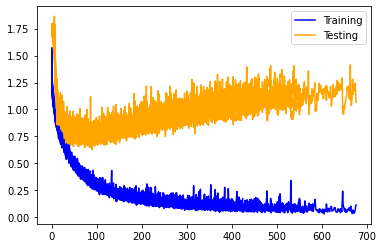

In [19]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

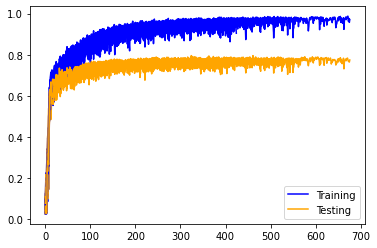

In [20]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

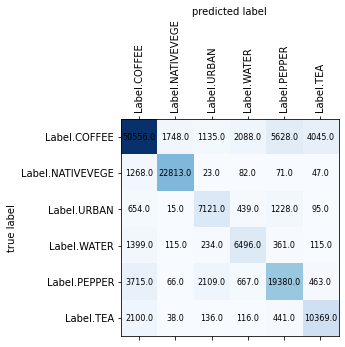

In [21]:
plot_confusion_matrix(conf_matrix, labels)

In [22]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.84694766 0.92006453 0.66192601 0.65695793 0.71489173 0.68514603]
Mean precision:  0.7476556488923286

Recalls:  [0.77539877 0.93865207 0.74549832 0.74495413 0.73409091 0.7855303 ]
Mean recall:  0.7873540853764261

F-Score:  [0.80959549 0.92926536 0.70123092 0.69819433 0.72436413 0.73191219]
Mean f-score:  0.765760402339417


# BLUE, SWIR2, NDVI, MNDWI

In [23]:
bands = [
    Band.BLUE.value,
    Band.SWIR2.value,
    Band.NDVI.value,
    Band.MNDWI.value,
]

model_name = "blue_swir2_ndvi_mndwi"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    # Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)), # no need for rescaling
    Input(shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_2 (Batch (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 9, 9, 32)          1184      
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 3, 3, 64)          36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 1, 1, 64)         

57/57 [==============================] - 0s 8ms/step - loss: 0.3105 - accuracy: 0.8033 - val_loss: 0.8239 - val_accuracy: 0.7393
Epoch 102/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2778 - accuracy: 0.8209 - val_loss: 0.8601 - val_accuracy: 0.7303
Epoch 103/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2484 - accuracy: 0.8098 - val_loss: 0.8531 - val_accuracy: 0.7465
Epoch 104/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3021 - accuracy: 0.8160 - val_loss: 0.8269 - val_accuracy: 0.7484
Epoch 105/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3032 - accuracy: 0.8259 - val_loss: 0.9035 - val_accuracy: 0.7300
Epoch 106/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2596 - accuracy: 0.8371 - val_loss: 0.8504 - val_accuracy: 0.7305
Epoch 107/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2479 - accuracy: 0.8365 - val_loss: 0.8598 - val_accuracy: 0.7492
Epoch 1

Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2431 - accuracy: 0.8557 - val_loss: 0.8711 - val_accuracy: 0.7611
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1622 - accuracy: 0.9041 - val_loss: 0.9887 - val_accuracy: 0.7352
Epoch 160/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2234 - accuracy: 0.8493 - val_loss: 0.9609 - val_accuracy: 0.7419
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2308 - accuracy: 0.8496 - val_loss: 1.0457 - val_accuracy: 0.6878
Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2568 - accuracy: 0.8472 - val_loss: 0.8463 - val_accuracy: 0.7687
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1710 - accuracy: 0.8985 - val_loss: 0.8889 - val_accuracy: 0.7647
Epoch 164/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2524 - accuracy: 0.8696 - val_loss: 0.9130 - val_accuracy:

Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1811 - accuracy: 0.9005 - val_loss: 1.0845 - val_accuracy: 0.7518
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2545 - accuracy: 0.8576 - val_loss: 0.9571 - val_accuracy: 0.7674
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1509 - accuracy: 0.9069 - val_loss: 0.9959 - val_accuracy: 0.7533
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2134 - accuracy: 0.8828 - val_loss: 0.9937 - val_accuracy: 0.7538
Epoch 219/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1959 - accuracy: 0.8828 - val_loss: 0.9789 - val_accuracy: 0.7708
Epoch 220/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1677 - accuracy: 0.9029 - val_loss: 0.9565 - val_accuracy: 0.7845
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1782 - accuracy: 0.9015 - val_loss: 1.0043 - val_accuracy:

Epoch 272/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1300 - accuracy: 0.9178 - val_loss: 1.0173 - val_accuracy: 0.7793
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1506 - accuracy: 0.9238 - val_loss: 0.9784 - val_accuracy: 0.7804
Epoch 274/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1336 - accuracy: 0.9026 - val_loss: 1.0321 - val_accuracy: 0.7788
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1283 - accuracy: 0.9144 - val_loss: 1.0753 - val_accuracy: 0.7709
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1370 - accuracy: 0.9163 - val_loss: 1.1273 - val_accuracy: 0.7740
Epoch 277/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1297 - accuracy: 0.9183 - val_loss: 1.1250 - val_accuracy: 0.7769
Epoch 278/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1280 - accuracy: 0.9243 - val_loss: 1.1639 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6607 - accuracy: 0.6646 - val_loss: 0.8563 - val_accuracy: 0.6554
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6694 - accuracy: 0.6630 - val_loss: 0.9342 - val_accuracy: 0.6157
Epoch 27/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6685 - accuracy: 0.6700 - val_loss: 0.9291 - val_accuracy: 0.6291
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5964 - accuracy: 0.6753 - val_loss: 0.9284 - val_accuracy: 0.6386
Epoch 29/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6845 - accuracy: 0.6422 - val_loss: 0.7909 - val_accuracy: 0.6901
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6505 - accuracy: 0.6689 - val_loss: 0.9143 - val_accuracy: 0.6325
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6150 - accuracy: 0.6844 - val_loss: 0.7834 - val_accuracy: 0.7002

57/57 [==============================] - 0s 9ms/step - loss: 0.2636 - accuracy: 0.8489 - val_loss: 0.9052 - val_accuracy: 0.7354
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2316 - accuracy: 0.8733 - val_loss: 1.0035 - val_accuracy: 0.7066
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2325 - accuracy: 0.8379 - val_loss: 0.8656 - val_accuracy: 0.7532
Epoch 142/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2357 - accuracy: 0.8618 - val_loss: 0.8550 - val_accuracy: 0.7542
Epoch 143/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2472 - accuracy: 0.8742 - val_loss: 0.8465 - val_accuracy: 0.7456
Epoch 144/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2460 - accuracy: 0.8558 - val_loss: 0.9210 - val_accuracy: 0.7196
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2614 - accuracy: 0.8428 - val_loss: 0.8559 - val_accuracy: 0.7461
Epoch 1

Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2221 - accuracy: 0.8833 - val_loss: 0.9958 - val_accuracy: 0.7384
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1914 - accuracy: 0.8939 - val_loss: 1.0044 - val_accuracy: 0.7328
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1779 - accuracy: 0.9029 - val_loss: 1.0208 - val_accuracy: 0.7397
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2009 - accuracy: 0.8818 - val_loss: 1.0242 - val_accuracy: 0.7290
Epoch 200/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2533 - accuracy: 0.8611 - val_loss: 0.9494 - val_accuracy: 0.7392
Epoch 201/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1964 - accuracy: 0.8764 - val_loss: 1.0384 - val_accuracy: 0.7362
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2082 - accuracy: 0.8805 - val_loss: 0.9513 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1322 - accuracy: 0.9259 - val_loss: 1.0551 - val_accuracy: 0.7465
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1872 - accuracy: 0.8843 - val_loss: 1.0502 - val_accuracy: 0.7523
Epoch 255/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2212 - accuracy: 0.8918 - val_loss: 0.9984 - val_accuracy: 0.7572
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1527 - accuracy: 0.9024 - val_loss: 1.0854 - val_accuracy: 0.7453
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1590 - accuracy: 0.8967 - val_loss: 1.0136 - val_accuracy: 0.7654
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1510 - accuracy: 0.9088 - val_loss: 1.0681 - val_accuracy: 0.7434
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1644 - accuracy: 0.9091 - val_loss: 1.0529 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0994 - accuracy: 0.9359 - val_loss: 1.2095 - val_accuracy: 0.7418
Epoch 311/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1412 - accuracy: 0.9204 - val_loss: 1.2512 - val_accuracy: 0.7339
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1949 - accuracy: 0.8863 - val_loss: 1.0559 - val_accuracy: 0.7513
Epoch 313/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1618 - accuracy: 0.9013 - val_loss: 1.0713 - val_accuracy: 0.7407
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1648 - accuracy: 0.9075 - val_loss: 1.0136 - val_accuracy: 0.7620
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1248 - accuracy: 0.9276 - val_loss: 1.1222 - val_accuracy: 0.7475
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1396 - accuracy: 0.9247 - val_loss: 1.0106 - val_accuracy:

Epoch 48/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5438 - accuracy: 0.7064 - val_loss: 0.7633 - val_accuracy: 0.7029
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4840 - accuracy: 0.7252 - val_loss: 0.7436 - val_accuracy: 0.7285
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5053 - accuracy: 0.7121 - val_loss: 0.7735 - val_accuracy: 0.6915
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4682 - accuracy: 0.7292 - val_loss: 0.8610 - val_accuracy: 0.6637
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4614 - accuracy: 0.7223 - val_loss: 0.8550 - val_accuracy: 0.6770
Epoch 53/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4290 - accuracy: 0.7369 - val_loss: 0.8089 - val_accuracy: 0.7005
Epoch 54/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5153 - accuracy: 0.7201 - val_loss: 0.9472 - val_accuracy: 0.6383

Epoch 162/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2750 - accuracy: 0.8017 - val_loss: 0.9490 - val_accuracy: 0.7143
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2050 - accuracy: 0.8412 - val_loss: 0.9533 - val_accuracy: 0.7225
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2664 - accuracy: 0.8214 - val_loss: 0.8847 - val_accuracy: 0.7304
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2075 - accuracy: 0.8535 - val_loss: 0.9637 - val_accuracy: 0.7082
Epoch 166/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2544 - accuracy: 0.8394 - val_loss: 0.8737 - val_accuracy: 0.7557
Epoch 167/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2093 - accuracy: 0.8692 - val_loss: 0.9265 - val_accuracy: 0.7384
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2147 - accuracy: 0.8638 - val_loss: 0.9286 - val_accuracy:

Epoch 219/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1840 - accuracy: 0.8769 - val_loss: 0.9366 - val_accuracy: 0.7559
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2127 - accuracy: 0.8764 - val_loss: 0.9028 - val_accuracy: 0.7469
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1685 - accuracy: 0.8844 - val_loss: 0.9615 - val_accuracy: 0.7503
Epoch 222/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1653 - accuracy: 0.8867 - val_loss: 0.9828 - val_accuracy: 0.7522
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2019 - accuracy: 0.8805 - val_loss: 0.9416 - val_accuracy: 0.7537
Epoch 224/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2011 - accuracy: 0.8765 - val_loss: 0.9078 - val_accuracy: 0.7578
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1739 - accuracy: 0.8809 - val_loss: 0.9074 - val_accuracy:

Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1752 - accuracy: 0.9078 - val_loss: 1.1830 - val_accuracy: 0.7196
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2653 - accuracy: 0.8582 - val_loss: 0.9994 - val_accuracy: 0.7685
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1313 - accuracy: 0.9201 - val_loss: 1.0259 - val_accuracy: 0.7652
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1356 - accuracy: 0.9105 - val_loss: 1.0910 - val_accuracy: 0.7659
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1153 - accuracy: 0.9245 - val_loss: 1.1909 - val_accuracy: 0.7407
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1768 - accuracy: 0.8924 - val_loss: 1.1172 - val_accuracy: 0.7321
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1495 - accuracy: 0.9050 - val_loss: 1.0830 - val_accuracy:

Epoch 333/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1374 - accuracy: 0.9212 - val_loss: 1.0147 - val_accuracy: 0.7766
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1335 - accuracy: 0.9193 - val_loss: 1.0535 - val_accuracy: 0.7698
Epoch 335/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1179 - accuracy: 0.9102 - val_loss: 1.0358 - val_accuracy: 0.7591
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1117 - accuracy: 0.9318 - val_loss: 1.0391 - val_accuracy: 0.7628
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1451 - accuracy: 0.9115 - val_loss: 1.0948 - val_accuracy: 0.7559
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1250 - accuracy: 0.9151 - val_loss: 1.0537 - val_accuracy: 0.7565
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1771 - accuracy: 0.8910 - val_loss: 1.0225 - val_accuracy:

Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1472 - accuracy: 0.9214 - val_loss: 1.0681 - val_accuracy: 0.7594
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1134 - accuracy: 0.9298 - val_loss: 1.0790 - val_accuracy: 0.7654
Epoch 392/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1838 - accuracy: 0.9017 - val_loss: 1.0882 - val_accuracy: 0.7640
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2300 - accuracy: 0.8985 - val_loss: 1.0232 - val_accuracy: 0.7506
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1519 - accuracy: 0.9125 - val_loss: 1.0421 - val_accuracy: 0.7499
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1215 - accuracy: 0.9149 - val_loss: 1.0453 - val_accuracy: 0.7716
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1078 - accuracy: 0.9395 - val_loss: 1.1267 - val_accuracy:

Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0802 - accuracy: 0.9487 - val_loss: 1.1635 - val_accuracy: 0.7701
Epoch 448/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1152 - accuracy: 0.9353 - val_loss: 1.2091 - val_accuracy: 0.7594
Epoch 449/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1401 - accuracy: 0.9268 - val_loss: 1.1127 - val_accuracy: 0.7689
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1312 - accuracy: 0.9068 - val_loss: 1.1454 - val_accuracy: 0.7750
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1354 - accuracy: 0.9320 - val_loss: 1.1396 - val_accuracy: 0.7650
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1514 - accuracy: 0.9137 - val_loss: 1.1037 - val_accuracy: 0.7690
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0933 - accuracy: 0.9377 - val_loss: 1.2047 - val_accuracy:

Epoch 504/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1543 - accuracy: 0.9207 - val_loss: 1.1240 - val_accuracy: 0.7632
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1400 - accuracy: 0.9299 - val_loss: 1.1918 - val_accuracy: 0.7751
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0766 - accuracy: 0.9579 - val_loss: 1.1992 - val_accuracy: 0.7648
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1014 - accuracy: 0.9386 - val_loss: 1.2611 - val_accuracy: 0.7627
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1737 - accuracy: 0.9018 - val_loss: 1.1582 - val_accuracy: 0.7608
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1369 - accuracy: 0.9256 - val_loss: 1.1658 - val_accuracy: 0.7603
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1008 - accuracy: 0.9396 - val_loss: 1.1653 - val_accuracy:

Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5109 - accuracy: 0.7265 - val_loss: 0.9283 - val_accuracy: 0.6397
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5374 - accuracy: 0.7075 - val_loss: 0.9462 - val_accuracy: 0.6458
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5124 - accuracy: 0.6964 - val_loss: 0.8410 - val_accuracy: 0.6629
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5280 - accuracy: 0.7072 - val_loss: 0.8518 - val_accuracy: 0.6743
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5364 - accuracy: 0.6930 - val_loss: 0.7580 - val_accuracy: 0.7138
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5771 - accuracy: 0.6789 - val_loss: 0.9388 - val_accuracy: 0.6435
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5509 - accuracy: 0.6784 - val_loss: 0.8363 - val_accuracy: 0.6917

Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2640 - accuracy: 0.8346 - val_loss: 1.0033 - val_accuracy: 0.6986
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2522 - accuracy: 0.8518 - val_loss: 0.9108 - val_accuracy: 0.7390
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1878 - accuracy: 0.8833 - val_loss: 0.9277 - val_accuracy: 0.7362
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2171 - accuracy: 0.8716 - val_loss: 0.9295 - val_accuracy: 0.7286
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2288 - accuracy: 0.8649 - val_loss: 0.9464 - val_accuracy: 0.7143
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2157 - accuracy: 0.8689 - val_loss: 1.0264 - val_accuracy: 0.7058
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2091 - accuracy: 0.8686 - val_loss: 0.9638 - val_accuracy:

Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1753 - accuracy: 0.8861 - val_loss: 1.0587 - val_accuracy: 0.7325
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1499 - accuracy: 0.9041 - val_loss: 1.1626 - val_accuracy: 0.7405
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2021 - accuracy: 0.8944 - val_loss: 1.0093 - val_accuracy: 0.7437
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1895 - accuracy: 0.8814 - val_loss: 1.0186 - val_accuracy: 0.7635
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2101 - accuracy: 0.8826 - val_loss: 1.0806 - val_accuracy: 0.7446
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2089 - accuracy: 0.8814 - val_loss: 1.0608 - val_accuracy: 0.7320
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1885 - accuracy: 0.8839 - val_loss: 1.0162 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1647 - accuracy: 0.9218 - val_loss: 1.0813 - val_accuracy: 0.7428
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1416 - accuracy: 0.9219 - val_loss: 1.2176 - val_accuracy: 0.7257
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1644 - accuracy: 0.8902 - val_loss: 1.1096 - val_accuracy: 0.7324
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1580 - accuracy: 0.9065 - val_loss: 1.0671 - val_accuracy: 0.7560
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1567 - accuracy: 0.9111 - val_loss: 1.1071 - val_accuracy: 0.7394
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2584 - accuracy: 0.8999 - val_loss: 1.1454 - val_accuracy: 0.7203
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1753 - accuracy: 0.8948 - val_loss: 1.0947 - val_accuracy:

Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1368 - accuracy: 0.9266 - val_loss: 1.1726 - val_accuracy: 0.7488
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1540 - accuracy: 0.9129 - val_loss: 1.2375 - val_accuracy: 0.7354
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1428 - accuracy: 0.9133 - val_loss: 1.1516 - val_accuracy: 0.7480
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1632 - accuracy: 0.9040 - val_loss: 1.1762 - val_accuracy: 0.7328
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1587 - accuracy: 0.8986 - val_loss: 1.1785 - val_accuracy: 0.7443
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1461 - accuracy: 0.9233 - val_loss: 1.2387 - val_accuracy: 0.7382
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1287 - accuracy: 0.9276 - val_loss: 1.1573 - val_accuracy:

Epoch 383/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1152 - accuracy: 0.9254 - val_loss: 1.1744 - val_accuracy: 0.7553
Epoch 384/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1006 - accuracy: 0.9365 - val_loss: 1.1915 - val_accuracy: 0.7582
Epoch 385/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1181 - accuracy: 0.9312 - val_loss: 1.2325 - val_accuracy: 0.7541
Epoch 386/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1351 - accuracy: 0.9379 - val_loss: 1.2238 - val_accuracy: 0.7489
Epoch 387/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1762 - accuracy: 0.9198 - val_loss: 1.2187 - val_accuracy: 0.7415
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1023 - accuracy: 0.9432 - val_loss: 1.2424 - val_accuracy: 0.7419
Epoch 389/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1318 - accuracy: 0.9337 - val_loss: 1.2196 - val_accuracy

Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0877 - accuracy: 0.9324 - val_loss: 1.3021 - val_accuracy: 0.7545
Epoch 441/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0870 - accuracy: 0.9431 - val_loss: 1.3951 - val_accuracy: 0.7432
Epoch 442/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1348 - accuracy: 0.9372 - val_loss: 1.2856 - val_accuracy: 0.7612
Epoch 443/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1143 - accuracy: 0.9273 - val_loss: 1.2911 - val_accuracy: 0.7610
Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9375 - val_loss: 1.3152 - val_accuracy: 0.7510
Epoch 445/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1576 - accuracy: 0.9225 - val_loss: 1.2909 - val_accuracy: 0.7369
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1526 - accuracy: 0.9211 - val_loss: 1.1521 - val_accuracy:

Epoch 497/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0815 - accuracy: 0.9497 - val_loss: 1.2578 - val_accuracy: 0.7750
Epoch 498/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1264 - accuracy: 0.9500 - val_loss: 1.3058 - val_accuracy: 0.7574
Epoch 499/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1019 - accuracy: 0.9401 - val_loss: 1.3136 - val_accuracy: 0.7738
Epoch 500/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1095 - accuracy: 0.9488 - val_loss: 1.3725 - val_accuracy: 0.7610
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1686 - accuracy: 0.9288 - val_loss: 1.3118 - val_accuracy: 0.7473
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0885 - accuracy: 0.9456 - val_loss: 1.2900 - val_accuracy: 0.7526
Epoch 503/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0937 - accuracy: 0.9433 - val_loss: 1.2800 - val_accuracy:

Epoch 554/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0809 - accuracy: 0.9643 - val_loss: 1.3092 - val_accuracy: 0.7795
Epoch 555/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1181 - accuracy: 0.9453 - val_loss: 1.3307 - val_accuracy: 0.7586
Epoch 556/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1192 - accuracy: 0.9427 - val_loss: 1.2715 - val_accuracy: 0.7514
Epoch 557/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1328 - accuracy: 0.9398 - val_loss: 1.3183 - val_accuracy: 0.7568
Epoch 558/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9478 - val_loss: 1.3023 - val_accuracy: 0.7639
Epoch 559/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1325 - accuracy: 0.9389 - val_loss: 1.2599 - val_accuracy: 0.7617
Epoch 560/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0712 - accuracy: 0.9659 - val_loss: 1.3005 - val_accuracy:

Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1737 - accuracy: 0.9306 - val_loss: 1.3377 - val_accuracy: 0.7498
Epoch 612/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1619 - accuracy: 0.9352 - val_loss: 1.3436 - val_accuracy: 0.7514
Epoch 613/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1141 - accuracy: 0.9235 - val_loss: 1.2535 - val_accuracy: 0.7557
Epoch 614/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1359 - accuracy: 0.9370 - val_loss: 1.3018 - val_accuracy: 0.7347
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1122 - accuracy: 0.9263 - val_loss: 1.2090 - val_accuracy: 0.7622
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0962 - accuracy: 0.9478 - val_loss: 1.2739 - val_accuracy: 0.7552
Epoch 617/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0947 - accuracy: 0.9486 - val_loss: 1.2704 - val_accura

Epoch 668/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1060 - accuracy: 0.9431 - val_loss: 1.3516 - val_accuracy: 0.7540
Epoch 669/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1000 - accuracy: 0.9508 - val_loss: 1.3633 - val_accuracy: 0.7665
Epoch 670/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9538 - val_loss: 1.4406 - val_accuracy: 0.7541
Epoch 671/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0937 - accuracy: 0.9487 - val_loss: 1.4331 - val_accuracy: 0.7523
Epoch 672/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0985 - accuracy: 0.9475 - val_loss: 1.3950 - val_accuracy: 0.7625
Epoch 673/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0939 - accuracy: 0.9495 - val_loss: 1.3324 - val_accuracy: 0.7692
Epoch 674/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0984 - accuracy: 0.9492 - val_loss: 1.3875 - val_accuracy:

Epoch 725/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1185 - accuracy: 0.9493 - val_loss: 1.3393 - val_accuracy: 0.7606
Epoch 726/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1156 - accuracy: 0.9518 - val_loss: 1.3027 - val_accuracy: 0.7665
Epoch 727/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0757 - accuracy: 0.9585 - val_loss: 1.3772 - val_accuracy: 0.7650
Epoch 728/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0914 - accuracy: 0.9503 - val_loss: 1.3777 - val_accuracy: 0.7724
Epoch 729/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0563 - accuracy: 0.9704 - val_loss: 1.3758 - val_accuracy: 0.7734
Epoch 730/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0899 - accuracy: 0.9649 - val_loss: 1.3796 - val_accuracy: 0.7694
Epoch 731/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9546 - val_loss: 1.4006 - val_accuracy

Epoch 782/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1005 - accuracy: 0.9630 - val_loss: 1.3066 - val_accuracy: 0.7629
Epoch 783/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0910 - accuracy: 0.9619 - val_loss: 1.3941 - val_accuracy: 0.7526
Epoch 784/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0833 - accuracy: 0.9567 - val_loss: 1.3961 - val_accuracy: 0.7669
Epoch 785/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0479 - accuracy: 0.9675 - val_loss: 1.5578 - val_accuracy: 0.7552
Epoch 786/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0616 - accuracy: 0.9694 - val_loss: 1.4663 - val_accuracy: 0.7667
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1061 - accuracy: 0.9577 - val_loss: 1.4798 - val_accuracy: 0.7772
Epoch 788/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1140 - accuracy: 0.9365 - val_loss: 1.3974 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.4743 - accuracy: 0.7439 - val_loss: 0.8129 - val_accuracy: 0.7110
Epoch 64/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4315 - accuracy: 0.7617 - val_loss: 0.8223 - val_accuracy: 0.7135
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4569 - accuracy: 0.7525 - val_loss: 0.8286 - val_accuracy: 0.6789
Epoch 66/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4005 - accuracy: 0.7674 - val_loss: 0.8676 - val_accuracy: 0.6742
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3719 - accuracy: 0.7617 - val_loss: 0.8686 - val_accuracy: 0.6985
Epoch 68/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3973 - accuracy: 0.7646 - val_loss: 0.7146 - val_accuracy: 0.7302
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4288 - accuracy: 0.7748 - val_loss: 0.8247 - val_accuracy: 0.7095
Epoch 70/

Epoch 177/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1972 - accuracy: 0.8877 - val_loss: 0.8895 - val_accuracy: 0.7546
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1968 - accuracy: 0.8912 - val_loss: 0.9771 - val_accuracy: 0.7317
Epoch 179/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2666 - accuracy: 0.8700 - val_loss: 0.9652 - val_accuracy: 0.7602
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2202 - accuracy: 0.8888 - val_loss: 0.9109 - val_accuracy: 0.7552
Epoch 181/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1920 - accuracy: 0.8868 - val_loss: 0.8874 - val_accuracy: 0.7590
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1929 - accuracy: 0.8926 - val_loss: 0.8908 - val_accuracy: 0.7568
Epoch 183/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2262 - accuracy: 0.8640 - val_loss: 0.9146 - val_accuracy:

Epoch 234/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1577 - accuracy: 0.8975 - val_loss: 0.9725 - val_accuracy: 0.7606
Epoch 235/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1675 - accuracy: 0.9128 - val_loss: 0.9655 - val_accuracy: 0.7594

Validation  2 , fold  1 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.6022 - accuracy: 0.2341 - val_loss: 2.1519 - val_accuracy: 0.0768
Epoch 2/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.2645 - accuracy: 0.3546 - val_loss: 2.0558 - val_accuracy: 0.1553
Epoch 3/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.1137 - accuracy: 0.3676 - val_loss: 1.6800 - val_accuracy: 0.2511
Epoch 4/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.1600 - accuracy: 0.4100 - val_loss: 1.2533 - val_accuracy: 0.3749
Epoch 5/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0659 - accur

Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4609 - accuracy: 0.7461 - val_loss: 0.8455 - val_accuracy: 0.6725
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4075 - accuracy: 0.7373 - val_loss: 0.8603 - val_accuracy: 0.6961
Epoch 58/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4446 - accuracy: 0.7502 - val_loss: 0.8758 - val_accuracy: 0.6659
Epoch 59/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4159 - accuracy: 0.7540 - val_loss: 0.7544 - val_accuracy: 0.7105
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4343 - accuracy: 0.7485 - val_loss: 0.7767 - val_accuracy: 0.7086
Epoch 61/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4565 - accuracy: 0.7427 - val_loss: 0.7891 - val_accuracy: 0.7186
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4081 - accuracy: 0.7846 - val_loss: 0.7909 - val_accuracy: 0.7136

Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2028 - accuracy: 0.8899 - val_loss: 0.9355 - val_accuracy: 0.7461
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2105 - accuracy: 0.8688 - val_loss: 0.9517 - val_accuracy: 0.7482
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1958 - accuracy: 0.8638 - val_loss: 0.9316 - val_accuracy: 0.7376
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2018 - accuracy: 0.8681 - val_loss: 0.8993 - val_accuracy: 0.7505
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2051 - accuracy: 0.8659 - val_loss: 0.9509 - val_accuracy: 0.7588
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1972 - accuracy: 0.8779 - val_loss: 0.9270 - val_accuracy: 0.7408
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2095 - accuracy: 0.8817 - val_loss: 0.9254 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1367 - accuracy: 0.9092 - val_loss: 1.0168 - val_accuracy: 0.7757
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1506 - accuracy: 0.9107 - val_loss: 0.9880 - val_accuracy: 0.7538
Epoch 229/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1730 - accuracy: 0.9027 - val_loss: 1.0458 - val_accuracy: 0.7497
Epoch 230/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1810 - accuracy: 0.8831 - val_loss: 1.0387 - val_accuracy: 0.7481
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1734 - accuracy: 0.8844 - val_loss: 0.9473 - val_accuracy: 0.7607
Epoch 232/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1262 - accuracy: 0.9102 - val_loss: 0.9992 - val_accuracy: 0.7717
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1587 - accuracy: 0.9124 - val_loss: 0.9737 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1865 - accuracy: 0.8890 - val_loss: 1.0642 - val_accuracy: 0.7549
Epoch 285/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.1692 - accuracy: 0.8959 - val_loss: 1.0368 - val_accuracy: 0.7649
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1442 - accuracy: 0.9179 - val_loss: 1.1142 - val_accuracy: 0.7462
Epoch 287/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1737 - accuracy: 0.9020 - val_loss: 0.9791 - val_accuracy: 0.7752
Epoch 288/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1803 - accuracy: 0.9047 - val_loss: 1.0812 - val_accuracy: 0.7466
Epoch 289/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1504 - accuracy: 0.9063 - val_loss: 1.0550 - val_accuracy: 0.7655
Epoch 290/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1569 - accuracy: 0.9067 - val_loss: 1.0630 - val_accura

57/57 [==============================] - 0s 9ms/step - loss: 0.4098 - accuracy: 0.7596 - val_loss: 0.8415 - val_accuracy: 0.7097
Epoch 72/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4003 - accuracy: 0.7694 - val_loss: 0.8064 - val_accuracy: 0.7190
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3423 - accuracy: 0.7958 - val_loss: 0.8010 - val_accuracy: 0.7233
Epoch 74/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4178 - accuracy: 0.7501 - val_loss: 0.8353 - val_accuracy: 0.7135
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3745 - accuracy: 0.7808 - val_loss: 0.8213 - val_accuracy: 0.7171
Epoch 76/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3655 - accuracy: 0.7785 - val_loss: 0.8950 - val_accuracy: 0.6746
Epoch 77/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4193 - accuracy: 0.7515 - val_loss: 0.9567 - val_accuracy: 0.6647
Epoch 78/200

Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2161 - accuracy: 0.8608 - val_loss: 0.8925 - val_accuracy: 0.7534
Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2267 - accuracy: 0.8621 - val_loss: 0.9184 - val_accuracy: 0.7449
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2206 - accuracy: 0.8689 - val_loss: 0.9870 - val_accuracy: 0.7423
Epoch 188/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1950 - accuracy: 0.8959 - val_loss: 0.9631 - val_accuracy: 0.7593
Epoch 189/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1952 - accuracy: 0.8765 - val_loss: 0.9825 - val_accuracy: 0.7627
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1842 - accuracy: 0.8928 - val_loss: 0.9889 - val_accuracy: 0.7470
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2057 - accuracy: 0.8809 - val_loss: 0.9757 - val_accuracy:

Epoch 242/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1341 - accuracy: 0.9259 - val_loss: 1.0744 - val_accuracy: 0.7431
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1841 - accuracy: 0.8987 - val_loss: 1.0506 - val_accuracy: 0.7529
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1726 - accuracy: 0.8946 - val_loss: 1.2084 - val_accuracy: 0.7115
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1875 - accuracy: 0.8867 - val_loss: 1.0491 - val_accuracy: 0.7561
Epoch 246/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1930 - accuracy: 0.8810 - val_loss: 1.1032 - val_accuracy: 0.7378
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1516 - accuracy: 0.8943 - val_loss: 1.1779 - val_accuracy: 0.7370
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2112 - accuracy: 0.8681 - val_loss: 1.1154 - val_accuracy

Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1151 - accuracy: 0.9371 - val_loss: 1.1405 - val_accuracy: 0.7475
Epoch 300/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1220 - accuracy: 0.9259 - val_loss: 1.1766 - val_accuracy: 0.7675
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1631 - accuracy: 0.9221 - val_loss: 1.1131 - val_accuracy: 0.7544
Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1464 - accuracy: 0.9233 - val_loss: 1.1331 - val_accuracy: 0.7504
Epoch 303/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1265 - accuracy: 0.9260 - val_loss: 1.1713 - val_accuracy: 0.7306
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2436 - accuracy: 0.9012 - val_loss: 1.1148 - val_accuracy: 0.7491
Epoch 305/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1425 - accuracy: 0.9160 - val_loss: 1.2185 - val_accuracy

Epoch 356/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1227 - accuracy: 0.9331 - val_loss: 1.2541 - val_accuracy: 0.7416
Epoch 357/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1438 - accuracy: 0.9159 - val_loss: 1.1433 - val_accuracy: 0.7659
Epoch 358/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1188 - accuracy: 0.9407 - val_loss: 1.1757 - val_accuracy: 0.7574
Epoch 359/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1221 - accuracy: 0.9133 - val_loss: 1.2178 - val_accuracy: 0.7515
Epoch 360/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1353 - accuracy: 0.9250 - val_loss: 1.2132 - val_accuracy: 0.7567
Epoch 361/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1310 - accuracy: 0.9116 - val_loss: 1.1764 - val_accuracy: 0.7637
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1213 - accuracy: 0.9244 - val_loss: 1.1908 - val_accuracy:

Epoch 413/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1008 - accuracy: 0.9377 - val_loss: 1.1482 - val_accuracy: 0.7518
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1151 - accuracy: 0.9359 - val_loss: 1.2710 - val_accuracy: 0.7434
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1207 - accuracy: 0.9399 - val_loss: 1.2446 - val_accuracy: 0.7378
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1368 - accuracy: 0.9438 - val_loss: 1.1749 - val_accuracy: 0.7663
Epoch 417/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1403 - accuracy: 0.9405 - val_loss: 1.2431 - val_accuracy: 0.7380
Epoch 418/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1448 - accuracy: 0.9276 - val_loss: 1.3064 - val_accuracy: 0.7283
Epoch 419/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1501 - accuracy: 0.9153 - val_loss: 1.3182 - val_accuracy:

Epoch 470/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1493 - accuracy: 0.9276 - val_loss: 1.2498 - val_accuracy: 0.7590
Epoch 471/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0863 - accuracy: 0.9487 - val_loss: 1.3076 - val_accuracy: 0.7613
Epoch 472/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1051 - accuracy: 0.9435 - val_loss: 1.2862 - val_accuracy: 0.7637
Epoch 473/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0913 - accuracy: 0.9417 - val_loss: 1.3424 - val_accuracy: 0.7682
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2632 - accuracy: 0.9240 - val_loss: 1.3880 - val_accuracy: 0.7416
Epoch 475/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1749 - accuracy: 0.9085 - val_loss: 1.2892 - val_accuracy: 0.7335
Epoch 476/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1115 - accuracy: 0.9464 - val_loss: 1.1817 - val_accuracy:

Epoch 24/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6709 - accuracy: 0.6655 - val_loss: 0.7658 - val_accuracy: 0.6943
Epoch 25/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6518 - accuracy: 0.6699 - val_loss: 0.9537 - val_accuracy: 0.5786
Epoch 26/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7033 - accuracy: 0.6060 - val_loss: 0.8020 - val_accuracy: 0.6667
Epoch 27/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6825 - accuracy: 0.6349 - val_loss: 0.8433 - val_accuracy: 0.6401
Epoch 28/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6707 - accuracy: 0.6452 - val_loss: 0.8993 - val_accuracy: 0.6154
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6585 - accuracy: 0.6250 - val_loss: 0.8860 - val_accuracy: 0.6217
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6614 - accuracy: 0.6544 - val_loss: 0.7865 - val_accuracy: 0.667

57/57 [==============================] - 0s 8ms/step - loss: 0.2604 - accuracy: 0.8569 - val_loss: 0.8455 - val_accuracy: 0.7489
Epoch 139/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2615 - accuracy: 0.8678 - val_loss: 0.7840 - val_accuracy: 0.7472
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2592 - accuracy: 0.8415 - val_loss: 0.8253 - val_accuracy: 0.7446
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2636 - accuracy: 0.8561 - val_loss: 0.8529 - val_accuracy: 0.7332
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2608 - accuracy: 0.8422 - val_loss: 0.9205 - val_accuracy: 0.7059
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2356 - accuracy: 0.8346 - val_loss: 0.8094 - val_accuracy: 0.7647
Epoch 144/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2248 - accuracy: 0.8783 - val_loss: 0.8707 - val_accuracy: 0.7450
Epoch 1

Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2092 - accuracy: 0.8803 - val_loss: 0.8800 - val_accuracy: 0.7494
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1722 - accuracy: 0.8876 - val_loss: 0.9063 - val_accuracy: 0.7589
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1851 - accuracy: 0.8980 - val_loss: 0.8829 - val_accuracy: 0.7526
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1693 - accuracy: 0.8810 - val_loss: 0.9354 - val_accuracy: 0.7447
Epoch 199/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1773 - accuracy: 0.8812 - val_loss: 0.9404 - val_accuracy: 0.7646
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1557 - accuracy: 0.8961 - val_loss: 1.0866 - val_accuracy: 0.7249
Epoch 201/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2356 - accuracy: 0.8764 - val_loss: 0.9032 - val_accuracy:

Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1519 - accuracy: 0.9239 - val_loss: 1.0278 - val_accuracy: 0.7320
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1804 - accuracy: 0.9074 - val_loss: 0.9214 - val_accuracy: 0.7635
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1572 - accuracy: 0.9104 - val_loss: 0.9511 - val_accuracy: 0.7598
Epoch 255/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1403 - accuracy: 0.9191 - val_loss: 1.0147 - val_accuracy: 0.7460
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1663 - accuracy: 0.8894 - val_loss: 0.9385 - val_accuracy: 0.7481
Epoch 257/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1557 - accuracy: 0.8908 - val_loss: 0.9704 - val_accuracy: 0.7513
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1378 - accuracy: 0.9164 - val_loss: 0.9974 - val_accuracy:

Epoch 309/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1261 - accuracy: 0.9179 - val_loss: 0.9031 - val_accuracy: 0.7757
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1108 - accuracy: 0.9293 - val_loss: 0.9662 - val_accuracy: 0.7747
Epoch 311/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1197 - accuracy: 0.9285 - val_loss: 1.0141 - val_accuracy: 0.7476
Epoch 312/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1442 - accuracy: 0.9200 - val_loss: 0.9381 - val_accuracy: 0.7614
Epoch 313/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1316 - accuracy: 0.9166 - val_loss: 0.9599 - val_accuracy: 0.7704
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1218 - accuracy: 0.9313 - val_loss: 0.9635 - val_accuracy: 0.7720
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1072 - accuracy: 0.9445 - val_loss: 1.0127 - val_accuracy:

Epoch 366/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1493 - accuracy: 0.9152 - val_loss: 1.1076 - val_accuracy: 0.7385
Epoch 367/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1586 - accuracy: 0.9184 - val_loss: 0.9915 - val_accuracy: 0.7560
Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1068 - accuracy: 0.9351 - val_loss: 1.0777 - val_accuracy: 0.7533
Epoch 369/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1466 - accuracy: 0.9110 - val_loss: 1.1079 - val_accuracy: 0.7507
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1020 - accuracy: 0.9413 - val_loss: 1.0414 - val_accuracy: 0.7679
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1064 - accuracy: 0.9374 - val_loss: 1.1262 - val_accuracy: 0.7521
Epoch 372/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1486 - accuracy: 0.9190 - val_loss: 1.0469 - val_accuracy:

Epoch 423/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1252 - accuracy: 0.9245 - val_loss: 1.0400 - val_accuracy: 0.7598
Epoch 424/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1344 - accuracy: 0.9208 - val_loss: 1.0717 - val_accuracy: 0.7556
Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1403 - accuracy: 0.9184 - val_loss: 1.0275 - val_accuracy: 0.7504
Epoch 426/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1173 - accuracy: 0.9225 - val_loss: 1.1121 - val_accuracy: 0.7541
Epoch 427/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1124 - accuracy: 0.9312 - val_loss: 1.1013 - val_accuracy: 0.7413
Epoch 428/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1088 - accuracy: 0.9390 - val_loss: 1.0815 - val_accuracy: 0.7726
Epoch 429/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0816 - accuracy: 0.9514 - val_loss: 1.1439 - val_accuracy:

Epoch 480/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0987 - accuracy: 0.9548 - val_loss: 1.1493 - val_accuracy: 0.7652
Epoch 481/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0851 - accuracy: 0.9429 - val_loss: 1.1659 - val_accuracy: 0.7770
Epoch 482/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0691 - accuracy: 0.9603 - val_loss: 1.1697 - val_accuracy: 0.7705
Epoch 483/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1238 - accuracy: 0.9369 - val_loss: 1.0699 - val_accuracy: 0.7720
Epoch 484/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0965 - accuracy: 0.9429 - val_loss: 1.1043 - val_accuracy: 0.7713
Epoch 485/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0967 - accuracy: 0.9473 - val_loss: 1.1398 - val_accuracy: 0.7731
Epoch 486/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0972 - accuracy: 0.9410 - val_loss: 1.1580 - val_accuracy:

Epoch 537/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0881 - accuracy: 0.9575 - val_loss: 1.2128 - val_accuracy: 0.7780
Epoch 538/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1578 - accuracy: 0.9513 - val_loss: 1.1613 - val_accuracy: 0.7518
Epoch 539/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1419 - accuracy: 0.9346 - val_loss: 1.1073 - val_accuracy: 0.7556
Epoch 540/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0879 - accuracy: 0.9504 - val_loss: 1.1842 - val_accuracy: 0.7675
Epoch 541/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0790 - accuracy: 0.9491 - val_loss: 1.1916 - val_accuracy: 0.7620
Epoch 542/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0931 - accuracy: 0.9459 - val_loss: 1.1873 - val_accuracy: 0.7574
Epoch 543/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1141 - accuracy: 0.9331 - val_loss: 1.1111 - val_accuracy:

Epoch 594/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0986 - accuracy: 0.9568 - val_loss: 1.0809 - val_accuracy: 0.7641
Epoch 595/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1043 - accuracy: 0.9411 - val_loss: 1.1780 - val_accuracy: 0.7684
Epoch 596/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0846 - accuracy: 0.9549 - val_loss: 1.1512 - val_accuracy: 0.7701

Validation  2 , fold  4 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5576 - accuracy: 0.2688 - val_loss: 2.2035 - val_accuracy: 0.0726
Epoch 2/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.3309 - accuracy: 0.3560 - val_loss: 2.0567 - val_accuracy: 0.1451
Epoch 3/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1705 - accuracy: 0.4296 - val_loss: 1.7894 - val_accuracy: 0.2158
Epoch 4/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1128 - acc

Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4878 - accuracy: 0.7534 - val_loss: 0.7462 - val_accuracy: 0.7172
Epoch 56/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4636 - accuracy: 0.7587 - val_loss: 0.8658 - val_accuracy: 0.6747
Epoch 57/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5261 - accuracy: 0.7216 - val_loss: 0.8081 - val_accuracy: 0.7039
Epoch 58/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4625 - accuracy: 0.7549 - val_loss: 0.8436 - val_accuracy: 0.6890
Epoch 59/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4754 - accuracy: 0.7438 - val_loss: 0.8058 - val_accuracy: 0.7130
Epoch 60/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4339 - accuracy: 0.7402 - val_loss: 0.7834 - val_accuracy: 0.7255
Epoch 61/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5095 - accuracy: 0.7548 - val_loss: 0.8574 - val_accuracy: 0.6751

Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2624 - accuracy: 0.8760 - val_loss: 0.8925 - val_accuracy: 0.7470
Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2018 - accuracy: 0.8910 - val_loss: 0.9017 - val_accuracy: 0.7473
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1868 - accuracy: 0.9010 - val_loss: 0.9546 - val_accuracy: 0.7321
Epoch 172/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2100 - accuracy: 0.8633 - val_loss: 0.9184 - val_accuracy: 0.7415
Epoch 173/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1675 - accuracy: 0.8998 - val_loss: 1.0699 - val_accuracy: 0.7196
Epoch 174/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1891 - accuracy: 0.8784 - val_loss: 1.0204 - val_accuracy: 0.7116
Epoch 175/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1992 - accuracy: 0.8781 - val_loss: 0.9039 - val_accuracy:

Epoch 226/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1751 - accuracy: 0.8880 - val_loss: 1.0279 - val_accuracy: 0.7468
Epoch 227/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1806 - accuracy: 0.8946 - val_loss: 1.1391 - val_accuracy: 0.7465
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1750 - accuracy: 0.8946 - val_loss: 1.0936 - val_accuracy: 0.7331
Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1518 - accuracy: 0.9005 - val_loss: 1.1104 - val_accuracy: 0.7359
Epoch 230/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1825 - accuracy: 0.8833 - val_loss: 1.0673 - val_accuracy: 0.7238
Epoch 231/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1912 - accuracy: 0.8864 - val_loss: 1.0620 - val_accuracy: 0.7540
Epoch 232/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2403 - accuracy: 0.8719 - val_loss: 0.9596 - val_accuracy:

Epoch 283/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1413 - accuracy: 0.9021 - val_loss: 1.0546 - val_accuracy: 0.7460
Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2025 - accuracy: 0.8694 - val_loss: 1.0069 - val_accuracy: 0.7431
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1648 - accuracy: 0.9194 - val_loss: 1.0668 - val_accuracy: 0.7491
Epoch 286/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1386 - accuracy: 0.9120 - val_loss: 1.1087 - val_accuracy: 0.7590
Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1313 - accuracy: 0.9259 - val_loss: 1.0827 - val_accuracy: 0.7553
Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1608 - accuracy: 0.9169 - val_loss: 1.0855 - val_accuracy: 0.7586
Epoch 289/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1441 - accuracy: 0.9243 - val_loss: 1.0513 - val_accuracy:

Epoch 340/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1246 - accuracy: 0.9288 - val_loss: 1.1364 - val_accuracy: 0.7390
Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1327 - accuracy: 0.9171 - val_loss: 1.2079 - val_accuracy: 0.7388
Epoch 342/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2052 - accuracy: 0.8961 - val_loss: 1.0252 - val_accuracy: 0.7540
Epoch 343/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1234 - accuracy: 0.9272 - val_loss: 1.0505 - val_accuracy: 0.7570
Epoch 344/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1099 - accuracy: 0.9399 - val_loss: 1.0607 - val_accuracy: 0.7582
Epoch 345/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1053 - accuracy: 0.9372 - val_loss: 1.1694 - val_accuracy: 0.7522
Epoch 346/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1075 - accuracy: 0.9394 - val_loss: 1.1098 - val_accuracy:

Epoch 397/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1032 - accuracy: 0.9287 - val_loss: 1.2110 - val_accuracy: 0.7608
Epoch 398/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1365 - accuracy: 0.9336 - val_loss: 1.2163 - val_accuracy: 0.7538
Epoch 399/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0976 - accuracy: 0.9388 - val_loss: 1.2431 - val_accuracy: 0.7527
Epoch 400/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1062 - accuracy: 0.9307 - val_loss: 1.1514 - val_accuracy: 0.7613
Epoch 401/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1061 - accuracy: 0.9349 - val_loss: 1.2283 - val_accuracy: 0.7597
Epoch 402/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0985 - accuracy: 0.9358 - val_loss: 1.2071 - val_accuracy: 0.7591
Epoch 403/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1429 - accuracy: 0.9338 - val_loss: 1.2152 - val_accuracy:

Epoch 454/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0876 - accuracy: 0.9394 - val_loss: 1.1697 - val_accuracy: 0.7488
Epoch 455/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1048 - accuracy: 0.9376 - val_loss: 1.1798 - val_accuracy: 0.7582
Epoch 456/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0771 - accuracy: 0.9434 - val_loss: 1.2350 - val_accuracy: 0.7451
Epoch 457/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1480 - accuracy: 0.9028 - val_loss: 1.2032 - val_accuracy: 0.7394
Epoch 458/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0972 - accuracy: 0.9411 - val_loss: 1.2167 - val_accuracy: 0.7589
Epoch 459/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1074 - accuracy: 0.9361 - val_loss: 1.3126 - val_accuracy: 0.7576
Epoch 460/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1008 - accuracy: 0.9396 - val_loss: 1.1608 - val_accuracy:

Epoch 31/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6009 - accuracy: 0.6825 - val_loss: 0.9893 - val_accuracy: 0.6063
Epoch 32/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5761 - accuracy: 0.6571 - val_loss: 0.9176 - val_accuracy: 0.6351
Epoch 33/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5925 - accuracy: 0.6681 - val_loss: 0.9404 - val_accuracy: 0.6423
Epoch 34/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6142 - accuracy: 0.6641 - val_loss: 0.9718 - val_accuracy: 0.6103
Epoch 35/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6135 - accuracy: 0.6427 - val_loss: 0.8226 - val_accuracy: 0.6749
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6722 - accuracy: 0.6531 - val_loss: 0.8462 - val_accuracy: 0.6622
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5963 - accuracy: 0.6735 - val_loss: 0.8565 - val_accuracy: 0.6582

57/57 [==============================] - 0s 7ms/step - loss: 0.2899 - accuracy: 0.8469 - val_loss: 0.8887 - val_accuracy: 0.7458
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2413 - accuracy: 0.8592 - val_loss: 0.8887 - val_accuracy: 0.7325
Epoch 147/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2413 - accuracy: 0.8555 - val_loss: 0.9304 - val_accuracy: 0.7238
Epoch 148/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2167 - accuracy: 0.8691 - val_loss: 0.9138 - val_accuracy: 0.7434
Epoch 149/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2828 - accuracy: 0.8516 - val_loss: 0.9079 - val_accuracy: 0.7097
Epoch 150/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3009 - accuracy: 0.8372 - val_loss: 0.9006 - val_accuracy: 0.7418
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2568 - accuracy: 0.8718 - val_loss: 0.8810 - val_accuracy: 0.7356
Epoch 1

Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1946 - accuracy: 0.8812 - val_loss: 0.9224 - val_accuracy: 0.7640
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1963 - accuracy: 0.8798 - val_loss: 0.9394 - val_accuracy: 0.7542
Epoch 204/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2208 - accuracy: 0.8707 - val_loss: 0.9718 - val_accuracy: 0.7484
Epoch 205/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1994 - accuracy: 0.8809 - val_loss: 0.9290 - val_accuracy: 0.7457
Epoch 206/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1824 - accuracy: 0.8786 - val_loss: 1.0271 - val_accuracy: 0.7342
Epoch 207/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2251 - accuracy: 0.8688 - val_loss: 0.8571 - val_accuracy: 0.7521
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2177 - accuracy: 0.8869 - val_loss: 0.9024 - val_accuracy:

Epoch 259/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1667 - accuracy: 0.9077 - val_loss: 0.9945 - val_accuracy: 0.7614
Epoch 260/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1837 - accuracy: 0.9008 - val_loss: 1.0236 - val_accuracy: 0.7540
Epoch 261/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1958 - accuracy: 0.8818 - val_loss: 1.0129 - val_accuracy: 0.7511
Epoch 262/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1950 - accuracy: 0.8931 - val_loss: 0.9416 - val_accuracy: 0.7548
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2171 - accuracy: 0.8907 - val_loss: 0.9654 - val_accuracy: 0.7541
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1725 - accuracy: 0.9075 - val_loss: 0.9518 - val_accuracy: 0.7563
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1882 - accuracy: 0.9001 - val_loss: 0.9322 - val_accuracy

Epoch 316/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1511 - accuracy: 0.9137 - val_loss: 0.9550 - val_accuracy: 0.7751
Epoch 317/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1475 - accuracy: 0.9212 - val_loss: 0.9867 - val_accuracy: 0.7693
Epoch 318/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1238 - accuracy: 0.9253 - val_loss: 1.0305 - val_accuracy: 0.7708
Epoch 319/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1258 - accuracy: 0.9301 - val_loss: 1.0666 - val_accuracy: 0.7593
Epoch 320/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1102 - accuracy: 0.9345 - val_loss: 1.0796 - val_accuracy: 0.7817
Epoch 321/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1238 - accuracy: 0.9330 - val_loss: 1.0666 - val_accuracy: 0.7650
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1285 - accuracy: 0.9154 - val_loss: 1.1020 - val_accuracy:

Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1235 - accuracy: 0.9213 - val_loss: 1.1235 - val_accuracy: 0.7597
Epoch 374/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1728 - accuracy: 0.9177 - val_loss: 1.0710 - val_accuracy: 0.7643
Epoch 375/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1382 - accuracy: 0.9077 - val_loss: 1.0445 - val_accuracy: 0.7597
Epoch 376/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1135 - accuracy: 0.9344 - val_loss: 1.0786 - val_accuracy: 0.7580
Epoch 377/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1232 - accuracy: 0.9300 - val_loss: 1.0831 - val_accuracy: 0.7556
Epoch 378/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1697 - accuracy: 0.9135 - val_loss: 1.0602 - val_accuracy: 0.7575
Epoch 379/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1712 - accuracy: 0.9128 - val_loss: 1.0092 - val_accuracy:

Epoch 430/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1627 - accuracy: 0.9109 - val_loss: 1.0756 - val_accuracy: 0.7597
Epoch 431/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1281 - accuracy: 0.9228 - val_loss: 1.0792 - val_accuracy: 0.7684
Epoch 432/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1105 - accuracy: 0.9354 - val_loss: 1.0798 - val_accuracy: 0.7713
Epoch 433/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1773 - accuracy: 0.9119 - val_loss: 1.0881 - val_accuracy: 0.7625
Epoch 434/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1378 - accuracy: 0.9213 - val_loss: 0.9979 - val_accuracy: 0.7709
Epoch 435/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1213 - accuracy: 0.9353 - val_loss: 1.0860 - val_accuracy: 0.7766
Epoch 436/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1100 - accuracy: 0.9410 - val_loss: 1.0902 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.3525 - accuracy: 0.8011 - val_loss: 0.7457 - val_accuracy: 0.7439
Epoch 73/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3361 - accuracy: 0.7908 - val_loss: 0.7971 - val_accuracy: 0.7096
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3849 - accuracy: 0.7657 - val_loss: 0.8317 - val_accuracy: 0.7024
Epoch 75/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3502 - accuracy: 0.7703 - val_loss: 0.8067 - val_accuracy: 0.7017
Epoch 76/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3594 - accuracy: 0.7724 - val_loss: 0.7900 - val_accuracy: 0.7253
Epoch 77/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3914 - accuracy: 0.7591 - val_loss: 0.8276 - val_accuracy: 0.7101
Epoch 78/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3850 - accuracy: 0.7871 - val_loss: 0.7629 - val_accuracy: 0.7281
Epoch 79/2000

Epoch 186/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2283 - accuracy: 0.8549 - val_loss: 0.9616 - val_accuracy: 0.7459
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2179 - accuracy: 0.8679 - val_loss: 0.9025 - val_accuracy: 0.7579
Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1926 - accuracy: 0.8803 - val_loss: 0.9156 - val_accuracy: 0.7672
Epoch 189/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2067 - accuracy: 0.8695 - val_loss: 0.9584 - val_accuracy: 0.7352
Epoch 190/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2025 - accuracy: 0.8691 - val_loss: 0.9109 - val_accuracy: 0.7697
Epoch 191/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1946 - accuracy: 0.8737 - val_loss: 0.9280 - val_accuracy: 0.7575
Epoch 192/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2052 - accuracy: 0.8902 - val_loss: 0.8666 - val_accuracy:

Epoch 243/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1750 - accuracy: 0.9017 - val_loss: 0.9112 - val_accuracy: 0.7617
Epoch 244/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1649 - accuracy: 0.8922 - val_loss: 1.0590 - val_accuracy: 0.7534
Epoch 245/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1603 - accuracy: 0.9101 - val_loss: 0.9672 - val_accuracy: 0.7397
Epoch 246/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1476 - accuracy: 0.8983 - val_loss: 0.9454 - val_accuracy: 0.7785
Epoch 247/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1781 - accuracy: 0.8947 - val_loss: 0.9293 - val_accuracy: 0.7732
Epoch 248/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1662 - accuracy: 0.9020 - val_loss: 0.9443 - val_accuracy: 0.7390
Epoch 249/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1522 - accuracy: 0.9156 - val_loss: 0.9868 - val_accuracy:

Epoch 300/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1557 - accuracy: 0.9115 - val_loss: 1.0702 - val_accuracy: 0.7497
Epoch 301/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2463 - accuracy: 0.8653 - val_loss: 1.0100 - val_accuracy: 0.7662
Epoch 302/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1549 - accuracy: 0.9035 - val_loss: 1.0275 - val_accuracy: 0.7560
Epoch 303/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2573 - accuracy: 0.8930 - val_loss: 0.9102 - val_accuracy: 0.7592
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1828 - accuracy: 0.9064 - val_loss: 0.9664 - val_accuracy: 0.7504
Epoch 305/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1593 - accuracy: 0.9063 - val_loss: 1.0166 - val_accuracy: 0.7508
Epoch 306/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2192 - accuracy: 0.8947 - val_loss: 0.9631 - val_accuracy:

Epoch 24/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7651 - accuracy: 0.6782 - val_loss: 0.8325 - val_accuracy: 0.6951
Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6946 - accuracy: 0.6764 - val_loss: 0.9078 - val_accuracy: 0.6352
Epoch 26/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6145 - accuracy: 0.6818 - val_loss: 0.9004 - val_accuracy: 0.6616
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6141 - accuracy: 0.6892 - val_loss: 0.9096 - val_accuracy: 0.6408
Epoch 28/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5970 - accuracy: 0.6631 - val_loss: 0.8489 - val_accuracy: 0.6792
Epoch 29/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6422 - accuracy: 0.6890 - val_loss: 0.8332 - val_accuracy: 0.6812
Epoch 30/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6062 - accuracy: 0.6816 - val_loss: 0.8398 - val_accuracy: 0.6811

57/57 [==============================] - 0s 8ms/step - loss: 0.2160 - accuracy: 0.8824 - val_loss: 0.9185 - val_accuracy: 0.7542
Epoch 139/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2583 - accuracy: 0.8402 - val_loss: 0.9811 - val_accuracy: 0.7453
Epoch 140/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2589 - accuracy: 0.8560 - val_loss: 0.9528 - val_accuracy: 0.7494
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2152 - accuracy: 0.8777 - val_loss: 0.9183 - val_accuracy: 0.7428
Epoch 142/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2457 - accuracy: 0.8606 - val_loss: 0.8351 - val_accuracy: 0.7496
Epoch 143/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2409 - accuracy: 0.8649 - val_loss: 0.8465 - val_accuracy: 0.7682
Epoch 144/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1991 - accuracy: 0.8696 - val_loss: 0.8738 - val_accuracy: 0.7627
Epoch 1

Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2373 - accuracy: 0.8800 - val_loss: 1.0010 - val_accuracy: 0.7460
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1827 - accuracy: 0.8951 - val_loss: 0.9389 - val_accuracy: 0.7659
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1880 - accuracy: 0.8831 - val_loss: 0.9794 - val_accuracy: 0.7529
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1901 - accuracy: 0.8989 - val_loss: 0.9291 - val_accuracy: 0.7679
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1767 - accuracy: 0.8923 - val_loss: 0.9792 - val_accuracy: 0.7636
Epoch 200/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1597 - accuracy: 0.9101 - val_loss: 1.0142 - val_accuracy: 0.7575
Epoch 201/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1577 - accuracy: 0.9158 - val_loss: 0.9884 - val_accuracy:

Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1471 - accuracy: 0.9050 - val_loss: 0.9613 - val_accuracy: 0.7789
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1428 - accuracy: 0.9199 - val_loss: 1.0275 - val_accuracy: 0.7655
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1477 - accuracy: 0.9044 - val_loss: 0.9424 - val_accuracy: 0.7730
Epoch 255/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1412 - accuracy: 0.9176 - val_loss: 1.0556 - val_accuracy: 0.7579
Epoch 256/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1516 - accuracy: 0.9077 - val_loss: 1.0149 - val_accuracy: 0.7660
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1406 - accuracy: 0.9131 - val_loss: 1.0691 - val_accuracy: 0.7716
Epoch 258/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1433 - accuracy: 0.9129 - val_loss: 1.0257 - val_accuracy:

Epoch 49/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5237 - accuracy: 0.7149 - val_loss: 0.8553 - val_accuracy: 0.6761
Epoch 50/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4683 - accuracy: 0.7485 - val_loss: 0.7630 - val_accuracy: 0.7067
Epoch 51/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4854 - accuracy: 0.7268 - val_loss: 0.8718 - val_accuracy: 0.6696
Epoch 52/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4987 - accuracy: 0.7277 - val_loss: 0.8510 - val_accuracy: 0.6811
Epoch 53/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4452 - accuracy: 0.7393 - val_loss: 0.8308 - val_accuracy: 0.6834
Epoch 54/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4401 - accuracy: 0.7538 - val_loss: 0.8336 - val_accuracy: 0.6768
Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5042 - accuracy: 0.7045 - val_loss: 0.7459 - val_accuracy: 0.7131

Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1918 - accuracy: 0.8941 - val_loss: 0.9143 - val_accuracy: 0.7579
Epoch 164/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1707 - accuracy: 0.8873 - val_loss: 0.9591 - val_accuracy: 0.7435
Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1913 - accuracy: 0.8888 - val_loss: 0.9617 - val_accuracy: 0.7461
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1827 - accuracy: 0.8867 - val_loss: 0.8993 - val_accuracy: 0.7613
Epoch 167/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1857 - accuracy: 0.8893 - val_loss: 1.0108 - val_accuracy: 0.7313
Epoch 168/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3007 - accuracy: 0.8501 - val_loss: 0.8361 - val_accuracy: 0.7483
Epoch 169/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2404 - accuracy: 0.8641 - val_loss: 0.8616 - val_accuracy:

Epoch 220/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1795 - accuracy: 0.9008 - val_loss: 0.9905 - val_accuracy: 0.7540
Epoch 221/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1480 - accuracy: 0.9135 - val_loss: 0.9691 - val_accuracy: 0.7620
Epoch 222/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1817 - accuracy: 0.8980 - val_loss: 1.0893 - val_accuracy: 0.7251
Epoch 223/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2480 - accuracy: 0.8427 - val_loss: 1.0330 - val_accuracy: 0.7346
Epoch 224/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2216 - accuracy: 0.8644 - val_loss: 1.0218 - val_accuracy: 0.7139
Epoch 225/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2450 - accuracy: 0.8509 - val_loss: 0.9279 - val_accuracy: 0.7434
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1926 - accuracy: 0.8970 - val_loss: 0.9572 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1432 - accuracy: 0.9349 - val_loss: 1.1411 - val_accuracy: 0.7415
Epoch 278/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1346 - accuracy: 0.9187 - val_loss: 1.0431 - val_accuracy: 0.7694
Epoch 279/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1041 - accuracy: 0.9347 - val_loss: 1.1540 - val_accuracy: 0.7542
Epoch 280/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1490 - accuracy: 0.9166 - val_loss: 1.0652 - val_accuracy: 0.7504
Epoch 281/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1249 - accuracy: 0.9298 - val_loss: 1.1161 - val_accuracy: 0.7519
Epoch 282/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1366 - accuracy: 0.9091 - val_loss: 1.0849 - val_accuracy: 0.7552
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1325 - accuracy: 0.9113 - val_loss: 1.0509 - val_accuracy:

Epoch 334/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1435 - accuracy: 0.9208 - val_loss: 1.0629 - val_accuracy: 0.7658
Epoch 335/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1132 - accuracy: 0.9401 - val_loss: 1.0506 - val_accuracy: 0.7727
Epoch 336/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1012 - accuracy: 0.9288 - val_loss: 1.1669 - val_accuracy: 0.7422
Epoch 337/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1767 - accuracy: 0.9155 - val_loss: 1.1625 - val_accuracy: 0.7578
Epoch 338/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1711 - accuracy: 0.9231 - val_loss: 1.0937 - val_accuracy: 0.7565
Epoch 339/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1347 - accuracy: 0.9289 - val_loss: 1.1297 - val_accuracy: 0.7640
Epoch 340/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1365 - accuracy: 0.9397 - val_loss: 1.1089 - val_accuracy:

Epoch 391/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1177 - accuracy: 0.9347 - val_loss: 1.2125 - val_accuracy: 0.7329
Epoch 392/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1498 - accuracy: 0.9036 - val_loss: 1.0951 - val_accuracy: 0.7616
Epoch 393/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0912 - accuracy: 0.9468 - val_loss: 1.1495 - val_accuracy: 0.7586
Epoch 394/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1376 - accuracy: 0.9203 - val_loss: 1.1884 - val_accuracy: 0.7522
Epoch 395/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1041 - accuracy: 0.9300 - val_loss: 1.2340 - val_accuracy: 0.7553
Epoch 396/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0866 - accuracy: 0.9511 - val_loss: 1.2350 - val_accuracy: 0.7639
Epoch 397/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0920 - accuracy: 0.9615 - val_loss: 1.4344 - val_accuracy:

Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7034 - accuracy: 0.6220 - val_loss: 0.8627 - val_accuracy: 0.6606
Epoch 24/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7059 - accuracy: 0.6692 - val_loss: 0.9222 - val_accuracy: 0.6348
Epoch 25/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7320 - accuracy: 0.6499 - val_loss: 0.9046 - val_accuracy: 0.6232
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6771 - accuracy: 0.6657 - val_loss: 0.8098 - val_accuracy: 0.6778
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6932 - accuracy: 0.6597 - val_loss: 0.9294 - val_accuracy: 0.6379
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6923 - accuracy: 0.6864 - val_loss: 0.9012 - val_accuracy: 0.6624
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6521 - accuracy: 0.6902 - val_loss: 0.7821 - val_accuracy: 0.6963

57/57 [==============================] - 0s 7ms/step - loss: 0.2685 - accuracy: 0.8298 - val_loss: 0.8083 - val_accuracy: 0.7650
Epoch 138/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2703 - accuracy: 0.8521 - val_loss: 0.9100 - val_accuracy: 0.7124
Epoch 139/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2530 - accuracy: 0.8411 - val_loss: 0.8048 - val_accuracy: 0.7343
Epoch 140/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2597 - accuracy: 0.8454 - val_loss: 0.8081 - val_accuracy: 0.7461
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3410 - accuracy: 0.8127 - val_loss: 0.8134 - val_accuracy: 0.7456
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2295 - accuracy: 0.8729 - val_loss: 0.7875 - val_accuracy: 0.7489
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2476 - accuracy: 0.8526 - val_loss: 0.8362 - val_accuracy: 0.7469
Epoch 1

Epoch 194/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2324 - accuracy: 0.8574 - val_loss: 0.8652 - val_accuracy: 0.7517
Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1874 - accuracy: 0.8796 - val_loss: 0.9304 - val_accuracy: 0.7352
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2281 - accuracy: 0.8685 - val_loss: 0.8060 - val_accuracy: 0.7609
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1948 - accuracy: 0.8613 - val_loss: 0.8268 - val_accuracy: 0.7572
Epoch 198/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1712 - accuracy: 0.8934 - val_loss: 0.8219 - val_accuracy: 0.7774
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2077 - accuracy: 0.8909 - val_loss: 0.9319 - val_accuracy: 0.7298
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2554 - accuracy: 0.8539 - val_loss: 0.8572 - val_accuracy:

Epoch 251/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1929 - accuracy: 0.8837 - val_loss: 0.9236 - val_accuracy: 0.7589
Epoch 252/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2135 - accuracy: 0.8897 - val_loss: 0.8911 - val_accuracy: 0.7576
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1611 - accuracy: 0.9069 - val_loss: 0.9519 - val_accuracy: 0.7373
Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2525 - accuracy: 0.8776 - val_loss: 0.9266 - val_accuracy: 0.7298
Epoch 255/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1731 - accuracy: 0.9014 - val_loss: 0.8899 - val_accuracy: 0.7612
Epoch 256/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1846 - accuracy: 0.8866 - val_loss: 0.9550 - val_accuracy: 0.7605
Epoch 257/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1600 - accuracy: 0.9025 - val_loss: 0.9673 - val_accuracy:

Epoch 308/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1433 - accuracy: 0.9147 - val_loss: 0.9707 - val_accuracy: 0.7715
Epoch 309/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1800 - accuracy: 0.9038 - val_loss: 1.0134 - val_accuracy: 0.7575
Epoch 310/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1772 - accuracy: 0.9040 - val_loss: 0.9594 - val_accuracy: 0.7575
Epoch 311/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1947 - accuracy: 0.8952 - val_loss: 0.9919 - val_accuracy: 0.7548
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1448 - accuracy: 0.9105 - val_loss: 0.9972 - val_accuracy: 0.7669
Epoch 313/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1876 - accuracy: 0.9045 - val_loss: 0.9843 - val_accuracy: 0.7359
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1970 - accuracy: 0.8784 - val_loss: 0.9817 - val_accuracy:

Epoch 365/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1396 - accuracy: 0.9260 - val_loss: 1.0289 - val_accuracy: 0.7648
Epoch 366/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1275 - accuracy: 0.9198 - val_loss: 1.0157 - val_accuracy: 0.7780
Epoch 367/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1305 - accuracy: 0.9283 - val_loss: 1.0506 - val_accuracy: 0.7736
Epoch 368/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1209 - accuracy: 0.9236 - val_loss: 1.0322 - val_accuracy: 0.7500
Epoch 369/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1374 - accuracy: 0.9160 - val_loss: 1.0796 - val_accuracy: 0.7647
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1943 - accuracy: 0.9220 - val_loss: 1.0527 - val_accuracy: 0.7650
Epoch 371/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1165 - accuracy: 0.9372 - val_loss: 1.1562 - val_accuracy:

Epoch 422/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0792 - accuracy: 0.9428 - val_loss: 1.1744 - val_accuracy: 0.7787
Epoch 423/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2163 - accuracy: 0.9295 - val_loss: 1.1532 - val_accuracy: 0.7652

Validation  3 , fold  5 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5482 - accuracy: 0.2336 - val_loss: 2.3456 - val_accuracy: 0.1137
Epoch 2/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.2079 - accuracy: 0.3620 - val_loss: 1.4441 - val_accuracy: 0.2504
Epoch 3/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.1684 - accuracy: 0.4434 - val_loss: 1.3835 - val_accuracy: 0.3029
Epoch 4/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0848 - accuracy: 0.3973 - val_loss: 1.2418 - val_accuracy: 0.4640
Epoch 5/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0364 - accur

Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4667 - accuracy: 0.7411 - val_loss: 0.7651 - val_accuracy: 0.7124
Epoch 57/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4102 - accuracy: 0.7499 - val_loss: 0.7786 - val_accuracy: 0.7077
Epoch 58/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4232 - accuracy: 0.7438 - val_loss: 0.8132 - val_accuracy: 0.6932
Epoch 59/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4158 - accuracy: 0.7445 - val_loss: 0.8917 - val_accuracy: 0.6709
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4554 - accuracy: 0.7323 - val_loss: 0.8596 - val_accuracy: 0.6943
Epoch 61/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4212 - accuracy: 0.7476 - val_loss: 0.7977 - val_accuracy: 0.7038
Epoch 62/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3894 - accuracy: 0.7613 - val_loss: 0.8469 - val_accuracy: 0.6913

Epoch 170/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2259 - accuracy: 0.8546 - val_loss: 0.9354 - val_accuracy: 0.7517
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2351 - accuracy: 0.8623 - val_loss: 0.9080 - val_accuracy: 0.7495
Epoch 172/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2368 - accuracy: 0.8728 - val_loss: 0.8963 - val_accuracy: 0.7500
Epoch 173/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1870 - accuracy: 0.8838 - val_loss: 0.8775 - val_accuracy: 0.7647
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1936 - accuracy: 0.8835 - val_loss: 0.9109 - val_accuracy: 0.7468
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2331 - accuracy: 0.8520 - val_loss: 0.9423 - val_accuracy: 0.7625
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1845 - accuracy: 0.8788 - val_loss: 0.9953 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2076 - accuracy: 0.8678 - val_loss: 0.9623 - val_accuracy: 0.7608
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1768 - accuracy: 0.8805 - val_loss: 0.9830 - val_accuracy: 0.7624
Epoch 229/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1824 - accuracy: 0.8894 - val_loss: 1.0322 - val_accuracy: 0.7582
Epoch 230/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1779 - accuracy: 0.8962 - val_loss: 0.9437 - val_accuracy: 0.7637
Epoch 231/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1597 - accuracy: 0.9057 - val_loss: 1.0064 - val_accuracy: 0.7579
Epoch 232/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1837 - accuracy: 0.8885 - val_loss: 0.9520 - val_accuracy: 0.7681
Epoch 233/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1883 - accuracy: 0.8885 - val_loss: 1.0213 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1391 - accuracy: 0.9203 - val_loss: 1.0868 - val_accuracy: 0.7591
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1576 - accuracy: 0.9053 - val_loss: 1.2232 - val_accuracy: 0.7682
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2218 - accuracy: 0.9020 - val_loss: 1.0487 - val_accuracy: 0.7525
Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2042 - accuracy: 0.8901 - val_loss: 1.0283 - val_accuracy: 0.7510
Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1715 - accuracy: 0.8885 - val_loss: 1.0390 - val_accuracy: 0.7643
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1903 - accuracy: 0.8992 - val_loss: 1.0467 - val_accuracy: 0.7656
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1484 - accuracy: 0.8911 - val_loss: 1.0271 - val_accuracy:

Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4864 - accuracy: 0.7241 - val_loss: 0.7740 - val_accuracy: 0.7037
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4858 - accuracy: 0.7299 - val_loss: 0.8101 - val_accuracy: 0.6857
Epoch 45/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5059 - accuracy: 0.7298 - val_loss: 0.9933 - val_accuracy: 0.6247
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4674 - accuracy: 0.7141 - val_loss: 0.8412 - val_accuracy: 0.6615
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4672 - accuracy: 0.7197 - val_loss: 0.9680 - val_accuracy: 0.6318
Epoch 48/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4974 - accuracy: 0.7315 - val_loss: 0.8573 - val_accuracy: 0.6540
Epoch 49/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5363 - accuracy: 0.7083 - val_loss: 0.9041 - val_accuracy: 0.6668

Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3122 - accuracy: 0.8405 - val_loss: 0.8546 - val_accuracy: 0.7567
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2171 - accuracy: 0.8863 - val_loss: 1.0254 - val_accuracy: 0.7071
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2845 - accuracy: 0.8539 - val_loss: 0.9459 - val_accuracy: 0.7246
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2198 - accuracy: 0.8562 - val_loss: 0.9438 - val_accuracy: 0.7283
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2135 - accuracy: 0.8810 - val_loss: 0.9570 - val_accuracy: 0.7389
Epoch 162/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2330 - accuracy: 0.8662 - val_loss: 0.8778 - val_accuracy: 0.7598
Epoch 163/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2096 - accuracy: 0.8670 - val_loss: 0.9617 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1856 - accuracy: 0.8978 - val_loss: 1.0110 - val_accuracy: 0.7466
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1798 - accuracy: 0.9013 - val_loss: 1.0604 - val_accuracy: 0.7193
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1597 - accuracy: 0.9098 - val_loss: 1.0556 - val_accuracy: 0.7446
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1731 - accuracy: 0.8928 - val_loss: 0.9976 - val_accuracy: 0.7533
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2314 - accuracy: 0.8736 - val_loss: 1.0347 - val_accuracy: 0.7520
Epoch 219/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1894 - accuracy: 0.8917 - val_loss: 1.0224 - val_accuracy: 0.7284
Epoch 220/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1856 - accuracy: 0.8862 - val_loss: 1.0975 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1806 - accuracy: 0.9064 - val_loss: 1.0406 - val_accuracy: 0.7554
Epoch 272/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1629 - accuracy: 0.9173 - val_loss: 1.2451 - val_accuracy: 0.7167
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2185 - accuracy: 0.8974 - val_loss: 0.9809 - val_accuracy: 0.7690
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1383 - accuracy: 0.9197 - val_loss: 1.0065 - val_accuracy: 0.7522
Epoch 275/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1580 - accuracy: 0.8993 - val_loss: 1.0232 - val_accuracy: 0.7526
Epoch 276/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1395 - accuracy: 0.9263 - val_loss: 1.0953 - val_accuracy: 0.7451
Epoch 277/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1545 - accuracy: 0.9023 - val_loss: 1.0981 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1035 - accuracy: 0.9323 - val_loss: 1.1882 - val_accuracy: 0.7466
Epoch 329/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1071 - accuracy: 0.9382 - val_loss: 1.1303 - val_accuracy: 0.7600
Epoch 330/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1959 - accuracy: 0.9142 - val_loss: 1.1641 - val_accuracy: 0.7394
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1359 - accuracy: 0.9190 - val_loss: 1.1421 - val_accuracy: 0.7469
Epoch 332/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1423 - accuracy: 0.9206 - val_loss: 1.1095 - val_accuracy: 0.7621
Epoch 333/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1314 - accuracy: 0.9220 - val_loss: 1.1901 - val_accuracy: 0.7363
Epoch 334/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1472 - accuracy: 0.9130 - val_loss: 1.1297 - val_accuracy:

Epoch 40/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5655 - accuracy: 0.6712 - val_loss: 0.7675 - val_accuracy: 0.7050
Epoch 41/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5131 - accuracy: 0.7299 - val_loss: 0.8877 - val_accuracy: 0.6455
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5079 - accuracy: 0.6943 - val_loss: 0.7588 - val_accuracy: 0.7230
Epoch 43/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5685 - accuracy: 0.7251 - val_loss: 0.8035 - val_accuracy: 0.7012
Epoch 44/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5362 - accuracy: 0.6881 - val_loss: 0.7766 - val_accuracy: 0.6917
Epoch 45/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5590 - accuracy: 0.6768 - val_loss: 0.8300 - val_accuracy: 0.6920
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5266 - accuracy: 0.7120 - val_loss: 0.8494 - val_accuracy: 0.6811

57/57 [==============================] - 0s 8ms/step - loss: 0.2430 - accuracy: 0.8546 - val_loss: 0.9370 - val_accuracy: 0.7446
Epoch 155/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3073 - accuracy: 0.8484 - val_loss: 0.9111 - val_accuracy: 0.7426
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2052 - accuracy: 0.8715 - val_loss: 0.9804 - val_accuracy: 0.7298
Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2363 - accuracy: 0.8589 - val_loss: 0.8836 - val_accuracy: 0.7348
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2081 - accuracy: 0.8611 - val_loss: 0.9290 - val_accuracy: 0.7534
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2351 - accuracy: 0.8650 - val_loss: 0.9067 - val_accuracy: 0.7519
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1888 - accuracy: 0.8852 - val_loss: 0.9647 - val_accuracy: 0.7328
Epoch 1

Epoch 211/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1674 - accuracy: 0.8771 - val_loss: 0.9745 - val_accuracy: 0.7666
Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2016 - accuracy: 0.8979 - val_loss: 1.0200 - val_accuracy: 0.7226
Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2286 - accuracy: 0.8675 - val_loss: 0.9233 - val_accuracy: 0.7640
Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1590 - accuracy: 0.8877 - val_loss: 0.9464 - val_accuracy: 0.7636
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1937 - accuracy: 0.8797 - val_loss: 0.9938 - val_accuracy: 0.7420
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2244 - accuracy: 0.8660 - val_loss: 0.9940 - val_accuracy: 0.7401
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2025 - accuracy: 0.8951 - val_loss: 0.9207 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.4265 - accuracy: 0.7800 - val_loss: 0.8117 - val_accuracy: 0.7149
Epoch 59/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3893 - accuracy: 0.8151 - val_loss: 0.9957 - val_accuracy: 0.6158
Epoch 60/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4096 - accuracy: 0.7606 - val_loss: 0.8211 - val_accuracy: 0.7085
Epoch 61/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3991 - accuracy: 0.7798 - val_loss: 0.8907 - val_accuracy: 0.7062
Epoch 62/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3991 - accuracy: 0.8100 - val_loss: 0.7988 - val_accuracy: 0.7214
Epoch 63/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4710 - accuracy: 0.7826 - val_loss: 0.8475 - val_accuracy: 0.7165
Epoch 64/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4048 - accuracy: 0.7749 - val_loss: 0.8310 - val_accuracy: 0.7100
Epoch 65/2000

Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1579 - accuracy: 0.8998 - val_loss: 0.9293 - val_accuracy: 0.7515
Epoch 173/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1819 - accuracy: 0.9090 - val_loss: 0.9342 - val_accuracy: 0.7426
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1766 - accuracy: 0.9013 - val_loss: 0.9352 - val_accuracy: 0.7567
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1597 - accuracy: 0.9018 - val_loss: 0.9620 - val_accuracy: 0.7617
Epoch 176/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1525 - accuracy: 0.9032 - val_loss: 0.9578 - val_accuracy: 0.7461
Epoch 177/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1657 - accuracy: 0.8979 - val_loss: 0.9452 - val_accuracy: 0.7538
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1832 - accuracy: 0.8933 - val_loss: 1.0314 - val_accuracy:

Epoch 229/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1602 - accuracy: 0.9095 - val_loss: 1.0043 - val_accuracy: 0.7464
Epoch 230/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1581 - accuracy: 0.9022 - val_loss: 1.0329 - val_accuracy: 0.7484
Epoch 231/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2375 - accuracy: 0.9013 - val_loss: 1.0139 - val_accuracy: 0.7333
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1600 - accuracy: 0.9138 - val_loss: 1.0348 - val_accuracy: 0.7518
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1813 - accuracy: 0.9153 - val_loss: 1.0347 - val_accuracy: 0.7477
Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1473 - accuracy: 0.9025 - val_loss: 0.9759 - val_accuracy: 0.7559
Epoch 235/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1406 - accuracy: 0.9222 - val_loss: 1.0171 - val_accuracy:

Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1072 - accuracy: 0.9264 - val_loss: 1.0948 - val_accuracy: 0.7548
Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0996 - accuracy: 0.9356 - val_loss: 1.1269 - val_accuracy: 0.7593
Epoch 288/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1351 - accuracy: 0.9239 - val_loss: 1.2856 - val_accuracy: 0.7107
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1741 - accuracy: 0.9049 - val_loss: 1.0333 - val_accuracy: 0.7591
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1177 - accuracy: 0.9361 - val_loss: 1.0885 - val_accuracy: 0.7587
Epoch 291/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1248 - accuracy: 0.9328 - val_loss: 1.1397 - val_accuracy: 0.7314
Epoch 292/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1159 - accuracy: 0.9273 - val_loss: 1.1382 - val_accurac

Epoch 343/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1442 - accuracy: 0.9207 - val_loss: 1.1372 - val_accuracy: 0.7633
Epoch 344/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1270 - accuracy: 0.9277 - val_loss: 1.0686 - val_accuracy: 0.7572
Epoch 345/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1309 - accuracy: 0.9342 - val_loss: 1.2290 - val_accuracy: 0.7481
Epoch 346/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1799 - accuracy: 0.9139 - val_loss: 1.1889 - val_accuracy: 0.7346
Epoch 347/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1788 - accuracy: 0.8993 - val_loss: 1.1029 - val_accuracy: 0.7549
Epoch 348/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1467 - accuracy: 0.9274 - val_loss: 1.1381 - val_accuracy: 0.7560
Epoch 349/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1036 - accuracy: 0.9453 - val_loss: 1.1172 - val_accuracy:

Epoch 400/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1124 - accuracy: 0.9354 - val_loss: 1.3300 - val_accuracy: 0.7274
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1652 - accuracy: 0.9228 - val_loss: 1.1183 - val_accuracy: 0.7560
Epoch 402/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1051 - accuracy: 0.9419 - val_loss: 1.0867 - val_accuracy: 0.7688
Epoch 403/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0881 - accuracy: 0.9551 - val_loss: 1.1645 - val_accuracy: 0.7476
Epoch 404/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0906 - accuracy: 0.9481 - val_loss: 1.1876 - val_accuracy: 0.7669
Epoch 405/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1470 - accuracy: 0.9463 - val_loss: 1.2025 - val_accuracy: 0.7443
Epoch 406/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1751 - accuracy: 0.9414 - val_loss: 1.1373 - val_accuracy:

Epoch 457/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0859 - accuracy: 0.9444 - val_loss: 1.2081 - val_accuracy: 0.7693
Epoch 458/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0990 - accuracy: 0.9580 - val_loss: 1.2274 - val_accuracy: 0.7670
Epoch 459/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0846 - accuracy: 0.9442 - val_loss: 1.3034 - val_accuracy: 0.7427
Epoch 460/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1777 - accuracy: 0.9172 - val_loss: 1.2069 - val_accuracy: 0.7523
Epoch 461/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0917 - accuracy: 0.9379 - val_loss: 1.2387 - val_accuracy: 0.7551
Epoch 462/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0843 - accuracy: 0.9367 - val_loss: 1.2499 - val_accuracy: 0.7734
Epoch 463/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1146 - accuracy: 0.9460 - val_loss: 1.1925 - val_accuracy:

Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1207 - accuracy: 0.9365 - val_loss: 1.3261 - val_accuracy: 0.7652
Epoch 515/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0866 - accuracy: 0.9557 - val_loss: 1.3832 - val_accuracy: 0.7270
Epoch 516/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1049 - accuracy: 0.9410 - val_loss: 1.2544 - val_accuracy: 0.7572
Epoch 517/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1227 - accuracy: 0.9249 - val_loss: 1.1728 - val_accuracy: 0.7526
Epoch 518/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0875 - accuracy: 0.9375 - val_loss: 1.2610 - val_accuracy: 0.7476
Epoch 519/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.0997 - accuracy: 0.9506 - val_loss: 1.2864 - val_accuracy: 0.7682
Epoch 520/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1013 - accuracy: 0.9537 - val_loss: 1.2797 - val_accuracy:

Epoch 40/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5692 - accuracy: 0.6887 - val_loss: 0.8794 - val_accuracy: 0.6492
Epoch 41/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5719 - accuracy: 0.7275 - val_loss: 0.8008 - val_accuracy: 0.6868
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5596 - accuracy: 0.7037 - val_loss: 0.8405 - val_accuracy: 0.6579
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6107 - accuracy: 0.6792 - val_loss: 0.8502 - val_accuracy: 0.6696
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5571 - accuracy: 0.6986 - val_loss: 0.8614 - val_accuracy: 0.6622
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5037 - accuracy: 0.7065 - val_loss: 0.8881 - val_accuracy: 0.6381
Epoch 46/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5383 - accuracy: 0.6981 - val_loss: 0.8540 - val_accuracy: 0.6542

Epoch 154/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2185 - accuracy: 0.8501 - val_loss: 0.8854 - val_accuracy: 0.7389
Epoch 155/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2957 - accuracy: 0.8384 - val_loss: 0.8623 - val_accuracy: 0.7400
Epoch 156/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2223 - accuracy: 0.8659 - val_loss: 0.9470 - val_accuracy: 0.7308
Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2727 - accuracy: 0.8467 - val_loss: 0.8595 - val_accuracy: 0.7342
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2434 - accuracy: 0.8404 - val_loss: 0.8470 - val_accuracy: 0.7544
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1939 - accuracy: 0.8702 - val_loss: 0.8645 - val_accuracy: 0.7465
Epoch 160/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1689 - accuracy: 0.8909 - val_loss: 0.8857 - val_accuracy:

Epoch 211/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1728 - accuracy: 0.8923 - val_loss: 0.9528 - val_accuracy: 0.7451
Epoch 212/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1982 - accuracy: 0.8757 - val_loss: 0.9279 - val_accuracy: 0.7584
Epoch 213/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1676 - accuracy: 0.9007 - val_loss: 0.8957 - val_accuracy: 0.7545
Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2236 - accuracy: 0.8653 - val_loss: 0.8981 - val_accuracy: 0.7494
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1701 - accuracy: 0.8896 - val_loss: 0.9114 - val_accuracy: 0.7561
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2147 - accuracy: 0.8725 - val_loss: 0.9593 - val_accuracy: 0.7548
Epoch 217/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1885 - accuracy: 0.8715 - val_loss: 0.9348 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2119 - accuracy: 0.8976 - val_loss: 0.9530 - val_accuracy: 0.7584
Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2076 - accuracy: 0.8838 - val_loss: 0.8976 - val_accuracy: 0.7660
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1789 - accuracy: 0.9000 - val_loss: 0.9578 - val_accuracy: 0.7728
Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1627 - accuracy: 0.9053 - val_loss: 0.9690 - val_accuracy: 0.7764
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2248 - accuracy: 0.8856 - val_loss: 0.9335 - val_accuracy: 0.7518
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2017 - accuracy: 0.8835 - val_loss: 0.9392 - val_accuracy: 0.7644
Epoch 274/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2032 - accuracy: 0.8902 - val_loss: 0.9408 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1654 - accuracy: 0.9056 - val_loss: 1.0454 - val_accuracy: 0.7637
Epoch 326/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1676 - accuracy: 0.9021 - val_loss: 1.0494 - val_accuracy: 0.7636
Epoch 327/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1699 - accuracy: 0.9144 - val_loss: 1.0864 - val_accuracy: 0.7523
Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1968 - accuracy: 0.8959 - val_loss: 1.0377 - val_accuracy: 0.7533
Epoch 329/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1335 - accuracy: 0.9067 - val_loss: 1.0001 - val_accuracy: 0.7613
Epoch 330/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1617 - accuracy: 0.9007 - val_loss: 1.0090 - val_accuracy: 0.7561
Epoch 331/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1401 - accuracy: 0.9092 - val_loss: 0.9602 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1342 - accuracy: 0.9266 - val_loss: 0.9774 - val_accuracy: 0.7791
Epoch 383/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1816 - accuracy: 0.9190 - val_loss: 1.0060 - val_accuracy: 0.7670
Epoch 384/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1228 - accuracy: 0.9163 - val_loss: 1.1116 - val_accuracy: 0.7356
Epoch 385/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1260 - accuracy: 0.9246 - val_loss: 1.0007 - val_accuracy: 0.7693
Epoch 386/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1214 - accuracy: 0.9345 - val_loss: 1.1142 - val_accuracy: 0.7673
Epoch 387/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1091 - accuracy: 0.9378 - val_loss: 1.1010 - val_accuracy: 0.7662
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1288 - accuracy: 0.9310 - val_loss: 1.0900 - val_accuracy:

Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5600 - accuracy: 0.6853 - val_loss: 0.7849 - val_accuracy: 0.6835
Epoch 39/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5755 - accuracy: 0.6954 - val_loss: 0.8727 - val_accuracy: 0.6530
Epoch 40/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5579 - accuracy: 0.6877 - val_loss: 0.9192 - val_accuracy: 0.6261
Epoch 41/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6048 - accuracy: 0.6691 - val_loss: 0.7909 - val_accuracy: 0.6810
Epoch 42/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5329 - accuracy: 0.7267 - val_loss: 0.8734 - val_accuracy: 0.6374
Epoch 43/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5380 - accuracy: 0.6982 - val_loss: 0.7289 - val_accuracy: 0.7156
Epoch 44/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6228 - accuracy: 0.6793 - val_loss: 0.8152 - val_accuracy: 0.6879

Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2057 - accuracy: 0.8758 - val_loss: 0.8802 - val_accuracy: 0.7534
Epoch 153/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2366 - accuracy: 0.8641 - val_loss: 0.8608 - val_accuracy: 0.7428
Epoch 154/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2842 - accuracy: 0.8390 - val_loss: 0.9219 - val_accuracy: 0.7131
Epoch 155/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2884 - accuracy: 0.8291 - val_loss: 0.8057 - val_accuracy: 0.7533
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2197 - accuracy: 0.8649 - val_loss: 0.9590 - val_accuracy: 0.7225
Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2342 - accuracy: 0.8606 - val_loss: 0.8534 - val_accuracy: 0.7574
Epoch 158/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2434 - accuracy: 0.8702 - val_loss: 0.8460 - val_accuracy:

Epoch 209/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2610 - accuracy: 0.8349 - val_loss: 0.9260 - val_accuracy: 0.7465
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2873 - accuracy: 0.8458 - val_loss: 0.8441 - val_accuracy: 0.7586
Epoch 211/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2278 - accuracy: 0.8675 - val_loss: 0.9238 - val_accuracy: 0.7240
Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2006 - accuracy: 0.8797 - val_loss: 0.8659 - val_accuracy: 0.7564
Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2028 - accuracy: 0.8842 - val_loss: 0.9124 - val_accuracy: 0.7636
Epoch 214/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1400 - accuracy: 0.9139 - val_loss: 0.9634 - val_accuracy: 0.7546
Epoch 215/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2000 - accuracy: 0.8790 - val_loss: 0.9675 - val_accuracy:

Epoch 266/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1721 - accuracy: 0.8784 - val_loss: 0.9673 - val_accuracy: 0.7593
Epoch 267/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1693 - accuracy: 0.8974 - val_loss: 0.9731 - val_accuracy: 0.7586
Epoch 268/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1764 - accuracy: 0.9018 - val_loss: 0.9498 - val_accuracy: 0.7636
Epoch 269/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1817 - accuracy: 0.8970 - val_loss: 0.9226 - val_accuracy: 0.7593
Epoch 270/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1696 - accuracy: 0.9096 - val_loss: 0.9724 - val_accuracy: 0.7529
Epoch 271/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1990 - accuracy: 0.8912 - val_loss: 0.9423 - val_accuracy: 0.7616
Epoch 272/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1755 - accuracy: 0.9109 - val_loss: 0.9402 - val_accuracy:

Epoch 323/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1511 - accuracy: 0.9160 - val_loss: 1.0746 - val_accuracy: 0.7502
Epoch 324/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1335 - accuracy: 0.9156 - val_loss: 1.1281 - val_accuracy: 0.7559
Epoch 325/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1536 - accuracy: 0.9024 - val_loss: 1.1292 - val_accuracy: 0.7369
Epoch 326/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1354 - accuracy: 0.9124 - val_loss: 1.0436 - val_accuracy: 0.7629
Epoch 327/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1599 - accuracy: 0.9278 - val_loss: 0.9971 - val_accuracy: 0.7712
Epoch 328/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1324 - accuracy: 0.9287 - val_loss: 1.0598 - val_accuracy: 0.7589
Epoch 329/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1445 - accuracy: 0.9128 - val_loss: 1.1038 - val_accuracy:

In [24]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.137953565814003
mean accuracy:  0.7598393308994708


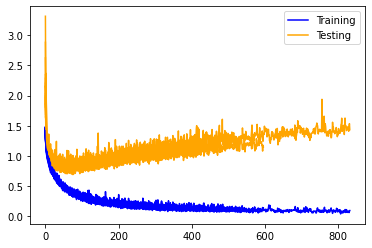

In [25]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

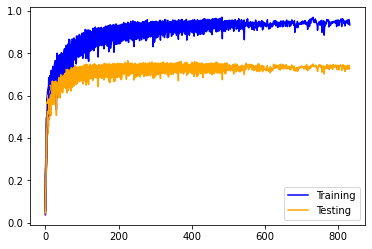

In [26]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

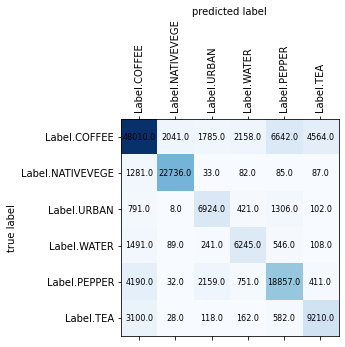

In [27]:
plot_confusion_matrix(conf_matrix, labels)

In [28]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.81562272 0.91184728 0.61492007 0.63601181 0.67303162 0.63596188]
Mean precision:  0.7145658975153246

Recalls:  [0.73634969 0.93548387 0.72487437 0.71616972 0.7142803  0.69772727]
Mean recall:  0.7541475394344651

F-Score:  [0.77396162 0.92351436 0.66538535 0.67371487 0.69304274 0.66541435]
Mean f-score:  0.732505548823957


# BLUE, GREEN, RED, NIR, SWIR1, SWIR2, MNDWI, EVI2, BU

In [29]:
bands = [
    Band.BLUE.value,
    Band.GREEN.value,
    Band.RED.value,
    Band.NIR.value,
    Band.SWIR1.value,
    Band.SWIR2.value,
    Band.MNDWI.value,
    Band.EVI2.value,
    Band.BU.value,
]

model_name = "blue_green_red_nir_swir1_swir2_mndwi_evi2_bu"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_2 (Rescaling)      (None, 9, 9, 9)           0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 9, 9, 9)           36        
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 9, 9, 32)          2624      
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 3, 3, 64)         

57/57 [==============================] - 1s 10ms/step - loss: 0.2964 - accuracy: 0.8291 - val_loss: 0.7251 - val_accuracy: 0.7676
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2879 - accuracy: 0.8187 - val_loss: 0.6944 - val_accuracy: 0.7782
Epoch 102/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2760 - accuracy: 0.8400 - val_loss: 0.7257 - val_accuracy: 0.7613
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2784 - accuracy: 0.8428 - val_loss: 0.6899 - val_accuracy: 0.7872
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2536 - accuracy: 0.8466 - val_loss: 0.7333 - val_accuracy: 0.7584
Epoch 105/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2830 - accuracy: 0.8104 - val_loss: 0.8421 - val_accuracy: 0.7482
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2593 - accuracy: 0.8417 - val_loss: 0.8042 - val_accuracy: 0.7349
Epoch

Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1803 - accuracy: 0.8931 - val_loss: 0.8094 - val_accuracy: 0.7801
Epoch 158/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1990 - accuracy: 0.8858 - val_loss: 0.8037 - val_accuracy: 0.7875
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2572 - accuracy: 0.8577 - val_loss: 0.9337 - val_accuracy: 0.7421
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1909 - accuracy: 0.8627 - val_loss: 0.8299 - val_accuracy: 0.7717
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1763 - accuracy: 0.8930 - val_loss: 0.8010 - val_accuracy: 0.7869
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1753 - accuracy: 0.8848 - val_loss: 0.7762 - val_accuracy: 0.7847
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1775 - accuracy: 0.8896 - val_loss: 0.7924 - val_accuracy

Epoch 214/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1082 - accuracy: 0.9343 - val_loss: 0.8223 - val_accuracy: 0.7993
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1040 - accuracy: 0.9226 - val_loss: 0.8751 - val_accuracy: 0.7846
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1547 - accuracy: 0.8890 - val_loss: 0.8468 - val_accuracy: 0.7925
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1439 - accuracy: 0.9075 - val_loss: 0.8676 - val_accuracy: 0.7852
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1654 - accuracy: 0.8997 - val_loss: 0.9469 - val_accuracy: 0.7782
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1339 - accuracy: 0.9054 - val_loss: 0.8837 - val_accuracy: 0.7713
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1323 - accuracy: 0.9063 - val_loss: 0.8234 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1300 - accuracy: 0.9266 - val_loss: 0.8878 - val_accuracy: 0.7983
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1012 - accuracy: 0.9308 - val_loss: 0.9418 - val_accuracy: 0.7907
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1111 - accuracy: 0.9370 - val_loss: 0.8757 - val_accuracy: 0.8063
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0963 - accuracy: 0.9327 - val_loss: 0.9113 - val_accuracy: 0.8023
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0997 - accuracy: 0.9404 - val_loss: 0.9514 - val_accuracy: 0.8025
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1317 - accuracy: 0.9314 - val_loss: 0.9090 - val_accuracy: 0.8013
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1180 - accuracy: 0.9239 - val_loss: 0.8692 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1380 - accuracy: 0.9106 - val_loss: 0.8716 - val_accuracy: 0.8084
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1084 - accuracy: 0.9473 - val_loss: 0.9478 - val_accuracy: 0.7961
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1028 - accuracy: 0.9559 - val_loss: 0.9523 - val_accuracy: 0.8010
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1012 - accuracy: 0.9439 - val_loss: 0.9357 - val_accuracy: 0.8115
Epoch 332/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0802 - accuracy: 0.9586 - val_loss: 0.9763 - val_accuracy: 0.7842
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0930 - accuracy: 0.9450 - val_loss: 0.9080 - val_accuracy: 0.8085
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1077 - accuracy: 0.9494 - val_loss: 0.9876 - val_accuracy:

Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5871 - accuracy: 0.7130 - val_loss: 0.8172 - val_accuracy: 0.6901
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5985 - accuracy: 0.6990 - val_loss: 0.8290 - val_accuracy: 0.6934
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5470 - accuracy: 0.7430 - val_loss: 0.8508 - val_accuracy: 0.6823
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5996 - accuracy: 0.7294 - val_loss: 0.9004 - val_accuracy: 0.6554
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5459 - accuracy: 0.7415 - val_loss: 0.8721 - val_accuracy: 0.6675
Epoch 38/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5351 - accuracy: 0.7409 - val_loss: 0.8136 - val_accuracy: 0.6970
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5039 - accuracy: 0.7699 - val_loss: 0.7976 - val_accuracy: 0.6951

57/57 [==============================] - 1s 14ms/step - loss: 0.2637 - accuracy: 0.8894 - val_loss: 0.8654 - val_accuracy: 0.7365
Epoch 148/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2164 - accuracy: 0.8684 - val_loss: 0.8265 - val_accuracy: 0.7696
Epoch 149/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1892 - accuracy: 0.9021 - val_loss: 0.7919 - val_accuracy: 0.7776
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1663 - accuracy: 0.9047 - val_loss: 0.8550 - val_accuracy: 0.7640
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1879 - accuracy: 0.8965 - val_loss: 0.8267 - val_accuracy: 0.7730
Epoch 152/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2143 - accuracy: 0.8860 - val_loss: 0.7969 - val_accuracy: 0.7819
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1740 - accuracy: 0.8981 - val_loss: 0.8052 - val_accuracy: 0.7780
Epoch 

Epoch 204/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1612 - accuracy: 0.9209 - val_loss: 0.8895 - val_accuracy: 0.7650
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1607 - accuracy: 0.9047 - val_loss: 0.9158 - val_accuracy: 0.7654
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1531 - accuracy: 0.9271 - val_loss: 0.9520 - val_accuracy: 0.7571
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1492 - accuracy: 0.9157 - val_loss: 0.9203 - val_accuracy: 0.7822
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1043 - accuracy: 0.9400 - val_loss: 0.9057 - val_accuracy: 0.7769
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1392 - accuracy: 0.9148 - val_loss: 0.8749 - val_accuracy: 0.7954
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1875 - accuracy: 0.9073 - val_loss: 0.8578 - val_accuracy

Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1008 - accuracy: 0.9504 - val_loss: 0.9655 - val_accuracy: 0.7681
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1803 - accuracy: 0.8906 - val_loss: 0.9173 - val_accuracy: 0.7719
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1071 - accuracy: 0.9430 - val_loss: 0.8926 - val_accuracy: 0.7958
Epoch 264/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1350 - accuracy: 0.9274 - val_loss: 0.9046 - val_accuracy: 0.7903
Epoch 265/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1095 - accuracy: 0.9452 - val_loss: 1.0025 - val_accuracy: 0.7749
Epoch 266/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1256 - accuracy: 0.9360 - val_loss: 0.8599 - val_accuracy: 0.8023
Epoch 267/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0848 - accuracy: 0.9508 - val_loss: 0.9900 - val_accura

Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0774 - accuracy: 0.9571 - val_loss: 0.9497 - val_accuracy: 0.8026
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1656 - accuracy: 0.9327 - val_loss: 0.9256 - val_accuracy: 0.7936
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1273 - accuracy: 0.9314 - val_loss: 0.9589 - val_accuracy: 0.7943
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1761 - accuracy: 0.9131 - val_loss: 1.0289 - val_accuracy: 0.7564
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1064 - accuracy: 0.9337 - val_loss: 0.9913 - val_accuracy: 0.7803
Epoch 323/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0995 - accuracy: 0.9455 - val_loss: 0.8677 - val_accuracy: 0.7893
Epoch 324/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1471 - accuracy: 0.9279 - val_loss: 0.9119 - val_accurac

Epoch 375/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0729 - accuracy: 0.9628 - val_loss: 1.0740 - val_accuracy: 0.7776
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0970 - accuracy: 0.9502 - val_loss: 1.0470 - val_accuracy: 0.7871
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0931 - accuracy: 0.9509 - val_loss: 1.1103 - val_accuracy: 0.7707
Epoch 378/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0907 - accuracy: 0.9422 - val_loss: 1.0774 - val_accuracy: 0.7878
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1256 - accuracy: 0.9384 - val_loss: 1.1133 - val_accuracy: 0.7971
Epoch 380/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0701 - accuracy: 0.9639 - val_loss: 1.0518 - val_accuracy: 0.7841
Epoch 381/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0939 - accuracy: 0.9514 - val_loss: 1.0499 - val_accurac

Epoch 432/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0780 - accuracy: 0.9522 - val_loss: 1.0945 - val_accuracy: 0.7819
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0961 - accuracy: 0.9521 - val_loss: 1.0290 - val_accuracy: 0.8011
Epoch 434/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0687 - accuracy: 0.9632 - val_loss: 0.9967 - val_accuracy: 0.7937
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0857 - accuracy: 0.9537 - val_loss: 1.1201 - val_accuracy: 0.7925
Epoch 436/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0784 - accuracy: 0.9581 - val_loss: 1.1160 - val_accuracy: 0.8009
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0797 - accuracy: 0.9559 - val_loss: 1.0931 - val_accuracy: 0.7963
Epoch 438/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0700 - accuracy: 0.9536 - val_loss: 1.1065 - val_accuracy:

Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0710 - accuracy: 0.9652 - val_loss: 1.0240 - val_accuracy: 0.8066
Epoch 490/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0960 - accuracy: 0.9545 - val_loss: 1.0787 - val_accuracy: 0.7773
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0786 - accuracy: 0.9456 - val_loss: 1.0532 - val_accuracy: 0.8004
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0913 - accuracy: 0.9586 - val_loss: 1.2166 - val_accuracy: 0.7568
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1238 - accuracy: 0.9267 - val_loss: 1.0832 - val_accuracy: 0.7937
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0766 - accuracy: 0.9544 - val_loss: 1.0130 - val_accuracy: 0.7997
Epoch 495/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1353 - accuracy: 0.9478 - val_loss: 1.0493 - val_accurac

Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5066 - accuracy: 0.7215 - val_loss: 0.8560 - val_accuracy: 0.6810
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5259 - accuracy: 0.7129 - val_loss: 0.8057 - val_accuracy: 0.7048
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4843 - accuracy: 0.7668 - val_loss: 0.7575 - val_accuracy: 0.7236
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5212 - accuracy: 0.7273 - val_loss: 0.8438 - val_accuracy: 0.7008
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5333 - accuracy: 0.7265 - val_loss: 0.7219 - val_accuracy: 0.7299
Epoch 54/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4644 - accuracy: 0.7509 - val_loss: 0.7130 - val_accuracy: 0.7335
Epoch 55/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5328 - accuracy: 0.7300 - val_loss: 0.8767 - val_accuracy: 0.67

Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1522 - accuracy: 0.8900 - val_loss: 0.8315 - val_accuracy: 0.7679
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1906 - accuracy: 0.8735 - val_loss: 0.8086 - val_accuracy: 0.7728
Epoch 165/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2354 - accuracy: 0.8665 - val_loss: 0.8157 - val_accuracy: 0.7720
Epoch 166/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1895 - accuracy: 0.8725 - val_loss: 0.7535 - val_accuracy: 0.7886
Epoch 167/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2099 - accuracy: 0.8794 - val_loss: 0.7556 - val_accuracy: 0.7848
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1741 - accuracy: 0.8848 - val_loss: 0.8065 - val_accuracy: 0.7810
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1887 - accuracy: 0.8871 - val_loss: 0.7239 - val_accurac

Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1438 - accuracy: 0.9093 - val_loss: 0.8444 - val_accuracy: 0.7869
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1406 - accuracy: 0.9190 - val_loss: 0.8681 - val_accuracy: 0.7921
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2132 - accuracy: 0.8743 - val_loss: 0.8757 - val_accuracy: 0.7792
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1127 - accuracy: 0.9289 - val_loss: 0.8935 - val_accuracy: 0.7830
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1362 - accuracy: 0.9143 - val_loss: 0.8745 - val_accuracy: 0.7838
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1173 - accuracy: 0.9216 - val_loss: 0.9129 - val_accuracy: 0.7880
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1364 - accuracy: 0.9112 - val_loss: 0.9785 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1239 - accuracy: 0.9170 - val_loss: 0.9216 - val_accuracy: 0.7822
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1345 - accuracy: 0.9179 - val_loss: 1.0498 - val_accuracy: 0.7647
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1334 - accuracy: 0.9051 - val_loss: 0.8745 - val_accuracy: 0.7937
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1186 - accuracy: 0.9297 - val_loss: 0.9141 - val_accuracy: 0.7842
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1308 - accuracy: 0.9171 - val_loss: 0.8756 - val_accuracy: 0.8038
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1402 - accuracy: 0.9359 - val_loss: 0.8808 - val_accuracy: 0.7918
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1019 - accuracy: 0.9409 - val_loss: 0.9587 - val_accuracy:

Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1212 - accuracy: 0.9217 - val_loss: 0.9593 - val_accuracy: 0.7940
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0891 - accuracy: 0.9388 - val_loss: 0.9736 - val_accuracy: 0.8059
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0883 - accuracy: 0.9409 - val_loss: 0.9973 - val_accuracy: 0.8013
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0873 - accuracy: 0.9506 - val_loss: 0.9723 - val_accuracy: 0.8034
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0812 - accuracy: 0.9447 - val_loss: 1.0507 - val_accuracy: 0.7785
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0873 - accuracy: 0.9366 - val_loss: 1.0866 - val_accuracy: 0.7921
Epoch 340/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1038 - accuracy: 0.9411 - val_loss: 1.1755 - val_accuracy:

Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1045 - accuracy: 0.9435 - val_loss: 1.0971 - val_accuracy: 0.7898
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0911 - accuracy: 0.9503 - val_loss: 1.0512 - val_accuracy: 0.7963
Epoch 393/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0725 - accuracy: 0.9481 - val_loss: 1.0538 - val_accuracy: 0.7914
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1681 - accuracy: 0.9225 - val_loss: 1.0067 - val_accuracy: 0.7967
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0965 - accuracy: 0.9446 - val_loss: 1.0587 - val_accuracy: 0.7916
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0891 - accuracy: 0.9447 - val_loss: 1.1000 - val_accuracy: 0.7842
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1586 - accuracy: 0.9191 - val_loss: 1.0584 - val_accuracy:

Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5575 - accuracy: 0.6990 - val_loss: 0.9249 - val_accuracy: 0.6488
Epoch 43/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6087 - accuracy: 0.7211 - val_loss: 0.8784 - val_accuracy: 0.6746
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5655 - accuracy: 0.7282 - val_loss: 0.8038 - val_accuracy: 0.7004
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5347 - accuracy: 0.7295 - val_loss: 1.1054 - val_accuracy: 0.5937
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5644 - accuracy: 0.7065 - val_loss: 0.7793 - val_accuracy: 0.7061
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5112 - accuracy: 0.7547 - val_loss: 0.7519 - val_accuracy: 0.7177
Epoch 48/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4961 - accuracy: 0.7552 - val_loss: 0.8432 - val_accuracy: 0.685

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2074 - accuracy: 0.8820 - val_loss: 0.8094 - val_accuracy: 0.7511
Epoch 157/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2011 - accuracy: 0.8740 - val_loss: 0.8394 - val_accuracy: 0.7545
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1921 - accuracy: 0.8812 - val_loss: 0.8282 - val_accuracy: 0.7640
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2391 - accuracy: 0.8672 - val_loss: 0.8251 - val_accuracy: 0.7722
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1843 - accuracy: 0.8936 - val_loss: 0.8098 - val_accuracy: 0.7732
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1893 - accuracy: 0.8753 - val_loss: 0.8025 - val_accuracy: 0.7666
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2452 - accuracy: 0.8688 - val_loss: 0.9364 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1895 - accuracy: 0.8869 - val_loss: 0.9736 - val_accuracy: 0.7346
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1937 - accuracy: 0.8998 - val_loss: 0.9840 - val_accuracy: 0.7253
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8594 - val_loss: 0.8745 - val_accuracy: 0.7614
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1757 - accuracy: 0.8825 - val_loss: 0.8576 - val_accuracy: 0.7693
Epoch 217/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1290 - accuracy: 0.9203 - val_loss: 0.9239 - val_accuracy: 0.7660
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1824 - accuracy: 0.8766 - val_loss: 0.8416 - val_accuracy: 0.7613
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1266 - accuracy: 0.9185 - val_loss: 0.9673 - val_accurac

Epoch 270/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1364 - accuracy: 0.9132 - val_loss: 0.9829 - val_accuracy: 0.7703
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1463 - accuracy: 0.9133 - val_loss: 0.9423 - val_accuracy: 0.7825
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1056 - accuracy: 0.9390 - val_loss: 1.0565 - val_accuracy: 0.7533
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2974 - accuracy: 0.8642 - val_loss: 0.8358 - val_accuracy: 0.7409
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8681 - val_loss: 0.8160 - val_accuracy: 0.7736
Epoch 275/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1567 - accuracy: 0.9020 - val_loss: 0.8492 - val_accuracy: 0.7684
Epoch 276/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1369 - accuracy: 0.9182 - val_loss: 1.0188 - val_accura

57/57 [==============================] - 1s 9ms/step - loss: 0.4369 - accuracy: 0.7789 - val_loss: 0.7096 - val_accuracy: 0.7426
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4293 - accuracy: 0.7825 - val_loss: 0.7527 - val_accuracy: 0.7105
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4073 - accuracy: 0.7910 - val_loss: 0.7414 - val_accuracy: 0.7219
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7441 - val_loss: 0.8968 - val_accuracy: 0.6677
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4471 - accuracy: 0.7509 - val_loss: 0.7059 - val_accuracy: 0.7409
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4121 - accuracy: 0.7965 - val_loss: 0.7166 - val_accuracy: 0.7320
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4167 - accuracy: 0.7892 - val_loss: 0.8327 - val_accuracy: 0.6918
Epoch 65/2000

Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2046 - accuracy: 0.8775 - val_loss: 0.9000 - val_accuracy: 0.7492
Epoch 173/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2104 - accuracy: 0.8824 - val_loss: 0.8187 - val_accuracy: 0.7761
Epoch 174/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1526 - accuracy: 0.8925 - val_loss: 0.8472 - val_accuracy: 0.7888
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1876 - accuracy: 0.8961 - val_loss: 0.8569 - val_accuracy: 0.7787
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1867 - accuracy: 0.8764 - val_loss: 0.8105 - val_accuracy: 0.7868
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1978 - accuracy: 0.8945 - val_loss: 0.8396 - val_accuracy: 0.7659
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1851 - accuracy: 0.8859 - val_loss: 0.8462 - val_accurac

Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1476 - accuracy: 0.9231 - val_loss: 0.8682 - val_accuracy: 0.7792
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1262 - accuracy: 0.9172 - val_loss: 0.9778 - val_accuracy: 0.7776
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1154 - accuracy: 0.9281 - val_loss: 0.9138 - val_accuracy: 0.7884
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1185 - accuracy: 0.9193 - val_loss: 0.8399 - val_accuracy: 0.7804
Epoch 233/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1501 - accuracy: 0.9308 - val_loss: 0.8869 - val_accuracy: 0.7837
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1278 - accuracy: 0.9301 - val_loss: 0.9182 - val_accuracy: 0.7788
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1699 - accuracy: 0.8936 - val_loss: 0.8756 - val_accuracy:

Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1192 - accuracy: 0.9300 - val_loss: 0.9082 - val_accuracy: 0.7954
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0978 - accuracy: 0.9442 - val_loss: 0.9928 - val_accuracy: 0.8001
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1447 - accuracy: 0.9262 - val_loss: 0.9604 - val_accuracy: 0.7867
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1340 - accuracy: 0.9191 - val_loss: 0.9530 - val_accuracy: 0.7897
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1070 - accuracy: 0.9345 - val_loss: 0.9390 - val_accuracy: 0.7983
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1366 - accuracy: 0.9223 - val_loss: 0.8513 - val_accuracy: 0.7962
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1085 - accuracy: 0.9402 - val_loss: 0.9065 - val_accuracy:

Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0703 - accuracy: 0.9591 - val_loss: 0.9604 - val_accuracy: 0.8026
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0597 - accuracy: 0.9689 - val_loss: 1.1271 - val_accuracy: 0.7758
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0886 - accuracy: 0.9469 - val_loss: 0.9969 - val_accuracy: 0.7916
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0969 - accuracy: 0.9444 - val_loss: 1.0019 - val_accuracy: 0.7855
Epoch 347/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0845 - accuracy: 0.9425 - val_loss: 1.0028 - val_accuracy: 0.8038
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1078 - accuracy: 0.9454 - val_loss: 1.0047 - val_accuracy: 0.8017
Epoch 349/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0902 - accuracy: 0.9544 - val_loss: 1.0587 - val_accuracy:

Epoch 400/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0892 - accuracy: 0.9489 - val_loss: 0.9503 - val_accuracy: 0.7944
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0696 - accuracy: 0.9570 - val_loss: 1.0061 - val_accuracy: 0.7951
Epoch 402/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0886 - accuracy: 0.9437 - val_loss: 0.9507 - val_accuracy: 0.8065
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1648 - accuracy: 0.9308 - val_loss: 0.9637 - val_accuracy: 0.7806
Epoch 404/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0996 - accuracy: 0.9365 - val_loss: 0.8847 - val_accuracy: 0.8066
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0740 - accuracy: 0.9560 - val_loss: 0.9223 - val_accuracy: 0.8173
Epoch 406/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1012 - accuracy: 0.9554 - val_loss: 1.0461 - val_accurac

57/57 [==============================] - 1s 9ms/step - loss: 0.3825 - accuracy: 0.7954 - val_loss: 0.8005 - val_accuracy: 0.7086
Epoch 72/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4110 - accuracy: 0.7839 - val_loss: 0.7075 - val_accuracy: 0.7529
Epoch 73/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3572 - accuracy: 0.8035 - val_loss: 0.8262 - val_accuracy: 0.7182
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4270 - accuracy: 0.7860 - val_loss: 0.8002 - val_accuracy: 0.7262
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3584 - accuracy: 0.8043 - val_loss: 0.7449 - val_accuracy: 0.7419
Epoch 76/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3646 - accuracy: 0.7883 - val_loss: 0.7619 - val_accuracy: 0.7383
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.8156 - val_loss: 0.7414 - val_accuracy: 0.7329
Epoch 78/2000

Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1603 - accuracy: 0.9033 - val_loss: 0.8692 - val_accuracy: 0.7743
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2028 - accuracy: 0.8763 - val_loss: 0.8409 - val_accuracy: 0.7738
Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2034 - accuracy: 0.8824 - val_loss: 0.8427 - val_accuracy: 0.7880
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1786 - accuracy: 0.9032 - val_loss: 0.8907 - val_accuracy: 0.7560
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1515 - accuracy: 0.8989 - val_loss: 1.0589 - val_accuracy: 0.7238
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2208 - accuracy: 0.8648 - val_loss: 0.8172 - val_accuracy: 0.7773
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1960 - accuracy: 0.8944 - val_loss: 0.8242 - val_accuracy:

Epoch 242/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1174 - accuracy: 0.9350 - val_loss: 0.8920 - val_accuracy: 0.7800
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1222 - accuracy: 0.9275 - val_loss: 0.8683 - val_accuracy: 0.7982
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1112 - accuracy: 0.9290 - val_loss: 0.8979 - val_accuracy: 0.7911
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1128 - accuracy: 0.9349 - val_loss: 0.8872 - val_accuracy: 0.8017
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1463 - accuracy: 0.9176 - val_loss: 0.9232 - val_accuracy: 0.7565
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1824 - accuracy: 0.8882 - val_loss: 0.9484 - val_accuracy: 0.7807
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1776 - accuracy: 0.8950 - val_loss: 0.9500 - val_accuracy:

Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1017 - accuracy: 0.9356 - val_loss: 0.9375 - val_accuracy: 0.7881
Epoch 300/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1061 - accuracy: 0.9400 - val_loss: 0.9400 - val_accuracy: 0.7919
Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1109 - accuracy: 0.9326 - val_loss: 0.9513 - val_accuracy: 0.7949
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1188 - accuracy: 0.9360 - val_loss: 1.0124 - val_accuracy: 0.7717
Epoch 303/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1622 - accuracy: 0.9056 - val_loss: 0.8438 - val_accuracy: 0.7955
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1000 - accuracy: 0.9393 - val_loss: 1.0347 - val_accuracy: 0.7833
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1042 - accuracy: 0.9319 - val_loss: 0.9249 - val_accuracy

Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1128 - accuracy: 0.9389 - val_loss: 0.9462 - val_accuracy: 0.8018
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1070 - accuracy: 0.9301 - val_loss: 1.0450 - val_accuracy: 0.7980
Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1528 - accuracy: 0.9344 - val_loss: 1.0868 - val_accuracy: 0.7729
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0964 - accuracy: 0.9399 - val_loss: 1.1655 - val_accuracy: 0.7606
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1427 - accuracy: 0.9257 - val_loss: 1.0266 - val_accuracy: 0.7890
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1056 - accuracy: 0.9304 - val_loss: 1.0546 - val_accuracy: 0.7716
Epoch 362/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1513 - accuracy: 0.9072 - val_loss: 0.9442 - val_accuracy

Epoch 413/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0576 - accuracy: 0.9600 - val_loss: 1.0310 - val_accuracy: 0.8017
Epoch 414/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0685 - accuracy: 0.9544 - val_loss: 1.0317 - val_accuracy: 0.8092
Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0880 - accuracy: 0.9578 - val_loss: 1.0347 - val_accuracy: 0.7997
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0598 - accuracy: 0.9673 - val_loss: 1.1953 - val_accuracy: 0.7932
Epoch 417/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.1225 - accuracy: 0.9311 - val_loss: 1.0953 - val_accuracy: 0.7695
Epoch 418/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1582 - accuracy: 0.9271 - val_loss: 1.0155 - val_accuracy: 0.8033
Epoch 419/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1170 - accuracy: 0.9399 - val_loss: 1.0140 - val_accu

Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0607 - accuracy: 0.9599 - val_loss: 1.0543 - val_accuracy: 0.8004
Epoch 471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0924 - accuracy: 0.9571 - val_loss: 1.3025 - val_accuracy: 0.7638
Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1679 - accuracy: 0.9238 - val_loss: 1.0743 - val_accuracy: 0.7925
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0672 - accuracy: 0.9638 - val_loss: 1.1456 - val_accuracy: 0.7967
Epoch 474/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0658 - accuracy: 0.9643 - val_loss: 1.0897 - val_accuracy: 0.7960
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0952 - accuracy: 0.9545 - val_loss: 1.3010 - val_accuracy: 0.7732
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0809 - accuracy: 0.9551 - val_loss: 1.0828 - val_accuracy:

Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4701 - accuracy: 0.7570 - val_loss: 0.7663 - val_accuracy: 0.7175
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5115 - accuracy: 0.7392 - val_loss: 0.6694 - val_accuracy: 0.7575
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5139 - accuracy: 0.7589 - val_loss: 0.7260 - val_accuracy: 0.7226
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4156 - accuracy: 0.7837 - val_loss: 0.7415 - val_accuracy: 0.7085
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5263 - accuracy: 0.7700 - val_loss: 0.7176 - val_accuracy: 0.7369
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4165 - accuracy: 0.7799 - val_loss: 0.6763 - val_accuracy: 0.7485
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4138 - accuracy: 0.7743 - val_loss: 0.6828 - val_accuracy: 0.7499

Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1679 - accuracy: 0.9148 - val_loss: 0.8300 - val_accuracy: 0.7674
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1681 - accuracy: 0.8899 - val_loss: 0.8042 - val_accuracy: 0.7898
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1477 - accuracy: 0.9178 - val_loss: 0.8222 - val_accuracy: 0.7827
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1308 - accuracy: 0.9098 - val_loss: 0.8300 - val_accuracy: 0.7707
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1518 - accuracy: 0.9058 - val_loss: 0.9635 - val_accuracy: 0.7221
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1999 - accuracy: 0.8851 - val_loss: 0.8011 - val_accuracy: 0.7696
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1920 - accuracy: 0.8837 - val_loss: 0.7907 - val_accuracy:

Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1140 - accuracy: 0.9356 - val_loss: 0.8223 - val_accuracy: 0.7932
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1175 - accuracy: 0.9232 - val_loss: 0.9069 - val_accuracy: 0.7770
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1562 - accuracy: 0.9023 - val_loss: 0.9410 - val_accuracy: 0.7720
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1655 - accuracy: 0.9136 - val_loss: 0.8452 - val_accuracy: 0.7954
Epoch 224/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1219 - accuracy: 0.9274 - val_loss: 0.8481 - val_accuracy: 0.7966
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1266 - accuracy: 0.9227 - val_loss: 0.8645 - val_accuracy: 0.7905
Epoch 226/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1169 - accuracy: 0.9276 - val_loss: 0.8790 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1235 - accuracy: 0.9205 - val_loss: 0.9737 - val_accuracy: 0.7808
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1244 - accuracy: 0.9379 - val_loss: 0.9033 - val_accuracy: 0.7974
Epoch 279/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1620 - accuracy: 0.9149 - val_loss: 0.8760 - val_accuracy: 0.7933
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0915 - accuracy: 0.9357 - val_loss: 0.8821 - val_accuracy: 0.7871
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0784 - accuracy: 0.9461 - val_loss: 0.9768 - val_accuracy: 0.7916
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1170 - accuracy: 0.9323 - val_loss: 1.0076 - val_accuracy: 0.7791
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1065 - accuracy: 0.9310 - val_loss: 0.9797 - val_accuracy

Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0787 - accuracy: 0.9491 - val_loss: 1.0724 - val_accuracy: 0.7869
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0802 - accuracy: 0.9446 - val_loss: 1.0059 - val_accuracy: 0.8011
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1110 - accuracy: 0.9400 - val_loss: 0.9664 - val_accuracy: 0.7964
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0897 - accuracy: 0.9431 - val_loss: 1.0286 - val_accuracy: 0.7894
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0899 - accuracy: 0.9512 - val_loss: 1.0004 - val_accuracy: 0.7929
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0687 - accuracy: 0.9644 - val_loss: 1.0498 - val_accuracy: 0.8013
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0950 - accuracy: 0.9482 - val_loss: 1.1741 - val_accuracy:

Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5526 - accuracy: 0.7219 - val_loss: 0.7090 - val_accuracy: 0.7437
Epoch 46/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5043 - accuracy: 0.7551 - val_loss: 0.9089 - val_accuracy: 0.6559
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5766 - accuracy: 0.7126 - val_loss: 0.7993 - val_accuracy: 0.6970
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5225 - accuracy: 0.7428 - val_loss: 0.7873 - val_accuracy: 0.7047
Epoch 49/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4928 - accuracy: 0.7293 - val_loss: 0.7548 - val_accuracy: 0.7097
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5162 - accuracy: 0.7340 - val_loss: 0.8486 - val_accuracy: 0.6769
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5005 - accuracy: 0.7348 - val_loss: 0.7477 - val_accuracy: 0.71

Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2087 - accuracy: 0.8671 - val_loss: 0.8426 - val_accuracy: 0.7700
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1380 - accuracy: 0.9115 - val_loss: 0.8719 - val_accuracy: 0.7580
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1734 - accuracy: 0.8928 - val_loss: 0.8407 - val_accuracy: 0.7538
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2359 - accuracy: 0.8655 - val_loss: 0.9319 - val_accuracy: 0.7499
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2204 - accuracy: 0.8643 - val_loss: 0.8540 - val_accuracy: 0.7428
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1971 - accuracy: 0.8710 - val_loss: 0.8534 - val_accuracy: 0.7437
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2053 - accuracy: 0.8820 - val_loss: 0.7981 - val_accuracy:

Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1536 - accuracy: 0.9124 - val_loss: 0.8309 - val_accuracy: 0.7871
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1497 - accuracy: 0.9079 - val_loss: 0.9040 - val_accuracy: 0.7727
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1647 - accuracy: 0.9069 - val_loss: 0.9006 - val_accuracy: 0.7717
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1314 - accuracy: 0.9237 - val_loss: 0.9009 - val_accuracy: 0.7867
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1123 - accuracy: 0.9218 - val_loss: 0.9928 - val_accuracy: 0.7764
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1280 - accuracy: 0.9280 - val_loss: 0.9808 - val_accuracy: 0.7584
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2148 - accuracy: 0.8972 - val_loss: 0.8874 - val_accuracy:

Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1411 - accuracy: 0.9299 - val_loss: 0.9433 - val_accuracy: 0.7678
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1261 - accuracy: 0.9275 - val_loss: 0.9154 - val_accuracy: 0.7686
Epoch 275/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1103 - accuracy: 0.9307 - val_loss: 0.9056 - val_accuracy: 0.7760
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0855 - accuracy: 0.9462 - val_loss: 0.9568 - val_accuracy: 0.7788
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1338 - accuracy: 0.9153 - val_loss: 0.9492 - val_accuracy: 0.7761
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1474 - accuracy: 0.9191 - val_loss: 0.8950 - val_accuracy: 0.7726
Epoch 279/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1379 - accuracy: 0.9289 - val_loss: 0.8675 - val_accurac

Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1001 - accuracy: 0.9336 - val_loss: 0.9910 - val_accuracy: 0.7964
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1218 - accuracy: 0.9490 - val_loss: 1.1183 - val_accuracy: 0.7688
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2076 - accuracy: 0.9025 - val_loss: 1.0018 - val_accuracy: 0.7846
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1729 - accuracy: 0.9219 - val_loss: 0.9613 - val_accuracy: 0.7799
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0993 - accuracy: 0.9428 - val_loss: 0.8904 - val_accuracy: 0.7883
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1101 - accuracy: 0.9445 - val_loss: 0.9398 - val_accuracy: 0.7842
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0850 - accuracy: 0.9568 - val_loss: 0.9088 - val_accuracy:

Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0791 - accuracy: 0.9535 - val_loss: 1.0675 - val_accuracy: 0.7924
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0753 - accuracy: 0.9617 - val_loss: 1.0647 - val_accuracy: 0.7836
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0903 - accuracy: 0.9477 - val_loss: 1.2023 - val_accuracy: 0.7757
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1294 - accuracy: 0.9244 - val_loss: 1.0523 - val_accuracy: 0.7875
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0795 - accuracy: 0.9459 - val_loss: 1.0984 - val_accuracy: 0.7867
Epoch 392/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1166 - accuracy: 0.9358 - val_loss: 1.1416 - val_accuracy: 0.7837
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0854 - accuracy: 0.9434 - val_loss: 1.1138 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.7866 - val_loss: 0.7602 - val_accuracy: 0.7283
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3962 - accuracy: 0.7555 - val_loss: 0.7596 - val_accuracy: 0.7203
Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4036 - accuracy: 0.7904 - val_loss: 0.6893 - val_accuracy: 0.7454
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7676 - val_loss: 0.7609 - val_accuracy: 0.7194
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3997 - accuracy: 0.7769 - val_loss: 0.8546 - val_accuracy: 0.6949
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3984 - accuracy: 0.7754 - val_loss: 0.7151 - val_accuracy: 0.7469
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3783 - accuracy: 0.7668 - val_loss: 0.7741 - val_accuracy: 0.7248
Epoch 80/200

57/57 [==============================] - 1s 9ms/step - loss: 0.2204 - accuracy: 0.8573 - val_loss: 0.7717 - val_accuracy: 0.7704
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2244 - accuracy: 0.8664 - val_loss: 0.8576 - val_accuracy: 0.7434
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2239 - accuracy: 0.8676 - val_loss: 0.7874 - val_accuracy: 0.7651
Epoch 133/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2989 - accuracy: 0.8385 - val_loss: 0.8657 - val_accuracy: 0.7428
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2670 - accuracy: 0.8484 - val_loss: 0.7531 - val_accuracy: 0.7674
Epoch 135/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2088 - accuracy: 0.8669 - val_loss: 0.8367 - val_accuracy: 0.7423
Epoch 136/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2087 - accuracy: 0.8666 - val_loss: 0.8457 - val_accuracy: 0.7591
Epoc

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2431 - accuracy: 0.8836 - val_loss: 0.7876 - val_accuracy: 0.7758
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1736 - accuracy: 0.9194 - val_loss: 0.8718 - val_accuracy: 0.7716
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1725 - accuracy: 0.9005 - val_loss: 0.8094 - val_accuracy: 0.7739
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2009 - accuracy: 0.8874 - val_loss: 0.8213 - val_accuracy: 0.7800
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1669 - accuracy: 0.9023 - val_loss: 0.8139 - val_accuracy: 0.7784
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1594 - accuracy: 0.9023 - val_loss: 0.7717 - val_accuracy: 0.7894
Epoch 193/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1312 - accuracy: 0.9230 - val_loss: 0.8046 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1180 - accuracy: 0.9277 - val_loss: 0.8692 - val_accuracy: 0.8053
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1230 - accuracy: 0.9338 - val_loss: 0.9163 - val_accuracy: 0.7917
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1476 - accuracy: 0.9131 - val_loss: 0.9587 - val_accuracy: 0.7587
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1478 - accuracy: 0.9166 - val_loss: 1.0655 - val_accuracy: 0.7312
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2195 - accuracy: 0.8804 - val_loss: 0.8675 - val_accuracy: 0.7925
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1067 - accuracy: 0.9365 - val_loss: 0.8210 - val_accuracy: 0.7924
Epoch 250/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1346 - accuracy: 0.9229 - val_loss: 0.8395 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1037 - accuracy: 0.9417 - val_loss: 0.9119 - val_accuracy: 0.7973
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1169 - accuracy: 0.9415 - val_loss: 0.8887 - val_accuracy: 0.8009
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1094 - accuracy: 0.9395 - val_loss: 0.9141 - val_accuracy: 0.7907
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1257 - accuracy: 0.9302 - val_loss: 0.9184 - val_accuracy: 0.7962
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1014 - accuracy: 0.9457 - val_loss: 0.8802 - val_accuracy: 0.8125
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1016 - accuracy: 0.9352 - val_loss: 0.9548 - val_accuracy: 0.7939
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1709 - accuracy: 0.9142 - val_loss: 0.8599 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1434 - accuracy: 0.9232 - val_loss: 0.9202 - val_accuracy: 0.7977
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1106 - accuracy: 0.9484 - val_loss: 0.9131 - val_accuracy: 0.8064
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0891 - accuracy: 0.9488 - val_loss: 0.9666 - val_accuracy: 0.8023
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0946 - accuracy: 0.9441 - val_loss: 0.9821 - val_accuracy: 0.8112
Epoch 362/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1215 - accuracy: 0.9516 - val_loss: 0.9910 - val_accuracy: 0.7906
Epoch 363/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1058 - accuracy: 0.9330 - val_loss: 0.9833 - val_accuracy: 0.7973
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0811 - accuracy: 0.9531 - val_loss: 0.9859 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0657 - accuracy: 0.9662 - val_loss: 1.0105 - val_accuracy: 0.8110
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0641 - accuracy: 0.9623 - val_loss: 1.0146 - val_accuracy: 0.8133
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0760 - accuracy: 0.9575 - val_loss: 1.0729 - val_accuracy: 0.8092
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0635 - accuracy: 0.9617 - val_loss: 1.1541 - val_accuracy: 0.7712
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0802 - accuracy: 0.9500 - val_loss: 1.0274 - val_accuracy: 0.8121
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0674 - accuracy: 0.9548 - val_loss: 1.0318 - val_accuracy: 0.8051
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0653 - accuracy: 0.9554 - val_loss: 1.1711 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0661 - accuracy: 0.9662 - val_loss: 1.0476 - val_accuracy: 0.8149
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0388 - accuracy: 0.9757 - val_loss: 1.1326 - val_accuracy: 0.7977
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1218 - accuracy: 0.9375 - val_loss: 1.0844 - val_accuracy: 0.7975
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1666 - accuracy: 0.9344 - val_loss: 0.9769 - val_accuracy: 0.7939
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0978 - accuracy: 0.9525 - val_loss: 0.9408 - val_accuracy: 0.8049
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1032 - accuracy: 0.9455 - val_loss: 0.9892 - val_accuracy: 0.7975
Epoch 478/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0723 - accuracy: 0.9482 - val_loss: 1.0299 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0757 - accuracy: 0.9565 - val_loss: 1.1130 - val_accuracy: 0.7888
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0973 - accuracy: 0.9460 - val_loss: 1.1027 - val_accuracy: 0.7962
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0814 - accuracy: 0.9584 - val_loss: 1.0312 - val_accuracy: 0.8123
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0918 - accuracy: 0.9587 - val_loss: 1.0191 - val_accuracy: 0.8091
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0614 - accuracy: 0.9616 - val_loss: 1.0223 - val_accuracy: 0.8083
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0708 - accuracy: 0.9539 - val_loss: 1.1799 - val_accuracy: 0.7735
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0739 - accuracy: 0.9472 - val_loss: 1.0952 - val_accuracy:

Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5346 - accuracy: 0.7851 - val_loss: 0.7517 - val_accuracy: 0.7279
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4476 - accuracy: 0.7841 - val_loss: 0.7521 - val_accuracy: 0.7323
Epoch 53/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4672 - accuracy: 0.7749 - val_loss: 0.7753 - val_accuracy: 0.7129
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4363 - accuracy: 0.7586 - val_loss: 0.8609 - val_accuracy: 0.6933
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5494 - accuracy: 0.7275 - val_loss: 0.7792 - val_accuracy: 0.7371
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4637 - accuracy: 0.7865 - val_loss: 0.9210 - val_accuracy: 0.6734
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4857 - accuracy: 0.7259 - val_loss: 0.8706 - val_accuracy: 0.6963

Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1759 - accuracy: 0.8968 - val_loss: 0.8999 - val_accuracy: 0.7544
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2098 - accuracy: 0.8673 - val_loss: 0.8320 - val_accuracy: 0.7662
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2130 - accuracy: 0.8811 - val_loss: 0.7490 - val_accuracy: 0.7726
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1960 - accuracy: 0.8709 - val_loss: 0.8512 - val_accuracy: 0.7736
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1673 - accuracy: 0.8863 - val_loss: 0.8487 - val_accuracy: 0.7717
Epoch 170/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2169 - accuracy: 0.8916 - val_loss: 0.9318 - val_accuracy: 0.7415
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2178 - accuracy: 0.8659 - val_loss: 0.7863 - val_accuracy

Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1595 - accuracy: 0.9090 - val_loss: 0.9423 - val_accuracy: 0.7575
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1960 - accuracy: 0.8946 - val_loss: 0.8311 - val_accuracy: 0.7884
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1165 - accuracy: 0.9327 - val_loss: 0.9141 - val_accuracy: 0.7865
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1137 - accuracy: 0.9284 - val_loss: 0.8778 - val_accuracy: 0.7743
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1459 - accuracy: 0.9021 - val_loss: 0.9377 - val_accuracy: 0.7901
Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.1567 - accuracy: 0.9128 - val_loss: 0.8740 - val_accuracy: 0.7850
Epoch 228/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1260 - accuracy: 0.9198 - val_loss: 0.9134 - val_accuracy:

Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2209 - accuracy: 0.9113 - val_loss: 0.9315 - val_accuracy: 0.7761
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1511 - accuracy: 0.9147 - val_loss: 0.9229 - val_accuracy: 0.7795
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1187 - accuracy: 0.9273 - val_loss: 0.8901 - val_accuracy: 0.7871
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1127 - accuracy: 0.9337 - val_loss: 0.9831 - val_accuracy: 0.7785
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1108 - accuracy: 0.9290 - val_loss: 0.9858 - val_accuracy: 0.7909
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0870 - accuracy: 0.9501 - val_loss: 0.9810 - val_accuracy: 0.7768
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1423 - accuracy: 0.9282 - val_loss: 0.8799 - val_accuracy:

Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1054 - accuracy: 0.9354 - val_loss: 0.9330 - val_accuracy: 0.7941
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0931 - accuracy: 0.9491 - val_loss: 0.9660 - val_accuracy: 0.7912
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1746 - accuracy: 0.9402 - val_loss: 0.9143 - val_accuracy: 0.8008
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0926 - accuracy: 0.9364 - val_loss: 1.0013 - val_accuracy: 0.7955
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0675 - accuracy: 0.9549 - val_loss: 1.0134 - val_accuracy: 0.7924
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0909 - accuracy: 0.9448 - val_loss: 1.0297 - val_accuracy: 0.7834
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0985 - accuracy: 0.9383 - val_loss: 1.0402 - val_accuracy:

Epoch 393/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0946 - accuracy: 0.9364 - val_loss: 1.0227 - val_accuracy: 0.7831
Epoch 394/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1158 - accuracy: 0.9282 - val_loss: 1.0340 - val_accuracy: 0.7825
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1165 - accuracy: 0.9368 - val_loss: 1.0455 - val_accuracy: 0.7802
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1013 - accuracy: 0.9350 - val_loss: 0.9814 - val_accuracy: 0.8039
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0821 - accuracy: 0.9531 - val_loss: 1.0749 - val_accuracy: 0.7994
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1236 - accuracy: 0.9479 - val_loss: 1.0242 - val_accuracy: 0.7837
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0848 - accuracy: 0.9373 - val_loss: 1.0790 - val_accuracy

Epoch 450/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0866 - accuracy: 0.9475 - val_loss: 1.1013 - val_accuracy: 0.7963
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0866 - accuracy: 0.9500 - val_loss: 1.0409 - val_accuracy: 0.8023
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0776 - accuracy: 0.9484 - val_loss: 1.1903 - val_accuracy: 0.7872
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0888 - accuracy: 0.9602 - val_loss: 1.1492 - val_accuracy: 0.7970
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1132 - accuracy: 0.9479 - val_loss: 1.1765 - val_accuracy: 0.7846
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0737 - accuracy: 0.9498 - val_loss: 1.0387 - val_accuracy: 0.7986
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0543 - accuracy: 0.9629 - val_loss: 1.1062 - val_accuracy:

Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7452 - accuracy: 0.6449 - val_loss: 0.8791 - val_accuracy: 0.6583
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7090 - accuracy: 0.6673 - val_loss: 0.8780 - val_accuracy: 0.6612
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6837 - accuracy: 0.6773 - val_loss: 0.8234 - val_accuracy: 0.6773
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6970 - accuracy: 0.6805 - val_loss: 0.8493 - val_accuracy: 0.6804
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6268 - accuracy: 0.7013 - val_loss: 0.8690 - val_accuracy: 0.6547
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6088 - accuracy: 0.6842 - val_loss: 0.9883 - val_accuracy: 0.5888
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7751 - accuracy: 0.6149 - val_loss: 0.8495 - val_accuracy: 0.6680

57/57 [==============================] - 1s 9ms/step - loss: 0.1967 - accuracy: 0.8778 - val_loss: 0.7517 - val_accuracy: 0.7934
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1895 - accuracy: 0.8941 - val_loss: 0.7935 - val_accuracy: 0.7839
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1886 - accuracy: 0.8884 - val_loss: 0.8340 - val_accuracy: 0.7732
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1629 - accuracy: 0.8974 - val_loss: 0.8530 - val_accuracy: 0.7505
Epoch 140/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2372 - accuracy: 0.8605 - val_loss: 0.8784 - val_accuracy: 0.7371
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2415 - accuracy: 0.8507 - val_loss: 0.8663 - val_accuracy: 0.7511
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2429 - accuracy: 0.8504 - val_loss: 0.7739 - val_accuracy: 0.7809
Epoch 

Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1774 - accuracy: 0.9044 - val_loss: 0.8623 - val_accuracy: 0.7804
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1452 - accuracy: 0.9098 - val_loss: 0.8729 - val_accuracy: 0.7796
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1609 - accuracy: 0.9022 - val_loss: 0.8647 - val_accuracy: 0.7776
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1767 - accuracy: 0.9054 - val_loss: 0.8653 - val_accuracy: 0.7812
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1995 - accuracy: 0.8811 - val_loss: 0.8674 - val_accuracy: 0.7769
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2110 - accuracy: 0.8858 - val_loss: 0.8556 - val_accuracy: 0.7691
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1478 - accuracy: 0.9142 - val_loss: 0.9037 - val_accuracy:

Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1232 - accuracy: 0.9260 - val_loss: 0.9577 - val_accuracy: 0.7847
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1231 - accuracy: 0.9162 - val_loss: 0.9689 - val_accuracy: 0.7845
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1924 - accuracy: 0.9070 - val_loss: 0.9368 - val_accuracy: 0.7812
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1209 - accuracy: 0.9438 - val_loss: 0.9107 - val_accuracy: 0.8008
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1152 - accuracy: 0.9284 - val_loss: 0.8998 - val_accuracy: 0.7820
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1425 - accuracy: 0.9189 - val_loss: 0.8947 - val_accuracy: 0.7869
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1167 - accuracy: 0.9238 - val_loss: 0.9577 - val_accuracy:

Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1494 - accuracy: 0.9089 - val_loss: 0.9501 - val_accuracy: 0.7919
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1147 - accuracy: 0.9305 - val_loss: 0.9382 - val_accuracy: 0.7913
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1016 - accuracy: 0.9297 - val_loss: 0.9817 - val_accuracy: 0.7884
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1123 - accuracy: 0.9249 - val_loss: 0.9840 - val_accuracy: 0.7884
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0686 - accuracy: 0.9510 - val_loss: 1.0362 - val_accuracy: 0.7831
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1667 - accuracy: 0.9123 - val_loss: 0.9543 - val_accuracy: 0.7789
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1126 - accuracy: 0.9245 - val_loss: 0.9879 - val_accuracy:

Epoch 364/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1193 - accuracy: 0.9251 - val_loss: 0.9084 - val_accuracy: 0.8014
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0826 - accuracy: 0.9449 - val_loss: 0.9925 - val_accuracy: 0.7963
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0700 - accuracy: 0.9556 - val_loss: 0.9956 - val_accuracy: 0.7967
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0791 - accuracy: 0.9533 - val_loss: 0.9979 - val_accuracy: 0.7922
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0742 - accuracy: 0.9549 - val_loss: 1.0704 - val_accuracy: 0.7961
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0826 - accuracy: 0.9480 - val_loss: 1.0581 - val_accuracy: 0.7881
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0636 - accuracy: 0.9608 - val_loss: 1.1039 - val_accuracy

Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0939 - accuracy: 0.9459 - val_loss: 1.1302 - val_accuracy: 0.7736
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0948 - accuracy: 0.9479 - val_loss: 1.2185 - val_accuracy: 0.7788
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1196 - accuracy: 0.9422 - val_loss: 1.1128 - val_accuracy: 0.7919
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1375 - accuracy: 0.9280 - val_loss: 1.0916 - val_accuracy: 0.7773
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1759 - accuracy: 0.9082 - val_loss: 1.0337 - val_accuracy: 0.7676
Epoch 426/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1159 - accuracy: 0.9267 - val_loss: 1.0286 - val_accuracy: 0.7837

Validation  3 , fold  2 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.642

Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5347 - accuracy: 0.7193 - val_loss: 0.8428 - val_accuracy: 0.6763
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4558 - accuracy: 0.7400 - val_loss: 0.6385 - val_accuracy: 0.7632
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4960 - accuracy: 0.7407 - val_loss: 0.8584 - val_accuracy: 0.6784
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4822 - accuracy: 0.7336 - val_loss: 0.7371 - val_accuracy: 0.7210
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4013 - accuracy: 0.7636 - val_loss: 0.7302 - val_accuracy: 0.7329
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4884 - accuracy: 0.7331 - val_loss: 0.7522 - val_accuracy: 0.7085
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4332 - accuracy: 0.7526 - val_loss: 0.6833 - val_accuracy: 0.7382

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1929 - accuracy: 0.8753 - val_loss: 0.8011 - val_accuracy: 0.7681
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2110 - accuracy: 0.8806 - val_loss: 0.7645 - val_accuracy: 0.7890
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1816 - accuracy: 0.8816 - val_loss: 0.8023 - val_accuracy: 0.7898
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1844 - accuracy: 0.8973 - val_loss: 0.7382 - val_accuracy: 0.7846
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1631 - accuracy: 0.8929 - val_loss: 0.7420 - val_accuracy: 0.7983
Epoch 171/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1967 - accuracy: 0.8843 - val_loss: 0.7513 - val_accuracy: 0.7698
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8653 - val_loss: 0.7466 - val_accuracy

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2198 - accuracy: 0.8967 - val_loss: 0.8659 - val_accuracy: 0.7871
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1364 - accuracy: 0.9085 - val_loss: 0.7813 - val_accuracy: 0.8047
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1676 - accuracy: 0.9132 - val_loss: 0.8235 - val_accuracy: 0.7897
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1335 - accuracy: 0.9207 - val_loss: 0.8332 - val_accuracy: 0.7918
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1573 - accuracy: 0.9171 - val_loss: 0.8482 - val_accuracy: 0.7894
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1592 - accuracy: 0.8946 - val_loss: 0.7928 - val_accuracy: 0.8069
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1014 - accuracy: 0.9422 - val_loss: 0.8162 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0744 - accuracy: 0.9554 - val_loss: 0.9666 - val_accuracy: 0.8028
Epoch 281/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1054 - accuracy: 0.9380 - val_loss: 0.9586 - val_accuracy: 0.8066
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1317 - accuracy: 0.9340 - val_loss: 1.0108 - val_accuracy: 0.7808
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1129 - accuracy: 0.9308 - val_loss: 0.8870 - val_accuracy: 0.8122
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1373 - accuracy: 0.9282 - val_loss: 0.9103 - val_accuracy: 0.7921
Epoch 285/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1646 - accuracy: 0.9043 - val_loss: 0.8402 - val_accuracy: 0.8069
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1046 - accuracy: 0.9387 - val_loss: 0.8316 - val_accuracy

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1156 - accuracy: 0.9362 - val_loss: 0.8995 - val_accuracy: 0.8122
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0825 - accuracy: 0.9497 - val_loss: 0.9647 - val_accuracy: 0.8021
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1197 - accuracy: 0.9358 - val_loss: 0.9282 - val_accuracy: 0.8055
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0889 - accuracy: 0.9310 - val_loss: 1.0658 - val_accuracy: 0.7836
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0964 - accuracy: 0.9467 - val_loss: 0.9512 - val_accuracy: 0.8001
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1315 - accuracy: 0.9306 - val_loss: 0.8439 - val_accuracy: 0.8068
Epoch 343/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0731 - accuracy: 0.9494 - val_loss: 0.9370 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1361 - accuracy: 0.9409 - val_loss: 0.8930 - val_accuracy: 0.8144
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1041 - accuracy: 0.9443 - val_loss: 0.9620 - val_accuracy: 0.8011
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0960 - accuracy: 0.9419 - val_loss: 0.9591 - val_accuracy: 0.7956
Epoch 397/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0742 - accuracy: 0.9510 - val_loss: 0.9512 - val_accuracy: 0.8104
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0693 - accuracy: 0.9633 - val_loss: 0.9470 - val_accuracy: 0.8092
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0670 - accuracy: 0.9516 - val_loss: 0.9912 - val_accuracy: 0.8053
Epoch 400/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0775 - accuracy: 0.9503 - val_loss: 1.0041 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0494 - accuracy: 0.9639 - val_loss: 1.0371 - val_accuracy: 0.8163
Epoch 452/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0505 - accuracy: 0.9656 - val_loss: 1.0651 - val_accuracy: 0.8070
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0817 - accuracy: 0.9593 - val_loss: 1.0007 - val_accuracy: 0.8157
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0651 - accuracy: 0.9602 - val_loss: 0.9788 - val_accuracy: 0.8135
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0901 - accuracy: 0.9462 - val_loss: 0.9933 - val_accuracy: 0.8167
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0751 - accuracy: 0.9695 - val_loss: 1.1332 - val_accuracy: 0.7712
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1549 - accuracy: 0.9191 - val_loss: 0.9967 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.4341 - accuracy: 0.7663 - val_loss: 0.7073 - val_accuracy: 0.7255
Epoch 62/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4109 - accuracy: 0.7681 - val_loss: 0.8664 - val_accuracy: 0.6891
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.7681 - val_loss: 0.7855 - val_accuracy: 0.7025
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4569 - accuracy: 0.7498 - val_loss: 0.7215 - val_accuracy: 0.7450
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3951 - accuracy: 0.7854 - val_loss: 0.7216 - val_accuracy: 0.7323
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3489 - accuracy: 0.7910 - val_loss: 0.7325 - val_accuracy: 0.7408
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3851 - accuracy: 0.7817 - val_loss: 0.6877 - val_accuracy: 0.7576
Epoch 68/200

Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1855 - accuracy: 0.8875 - val_loss: 0.8455 - val_accuracy: 0.7690
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1788 - accuracy: 0.8863 - val_loss: 0.8135 - val_accuracy: 0.7769
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1465 - accuracy: 0.9071 - val_loss: 0.8721 - val_accuracy: 0.7867
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2338 - accuracy: 0.8705 - val_loss: 0.8604 - val_accuracy: 0.7413
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2036 - accuracy: 0.8693 - val_loss: 0.7441 - val_accuracy: 0.7943
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1620 - accuracy: 0.8870 - val_loss: 0.8159 - val_accuracy: 0.7716
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2333 - accuracy: 0.8825 - val_loss: 0.8182 - val_accuracy:

Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1123 - accuracy: 0.9344 - val_loss: 0.8172 - val_accuracy: 0.7986
Epoch 233/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1453 - accuracy: 0.9205 - val_loss: 0.8463 - val_accuracy: 0.8002
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1168 - accuracy: 0.9199 - val_loss: 0.8934 - val_accuracy: 0.7943
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1410 - accuracy: 0.9184 - val_loss: 0.8843 - val_accuracy: 0.7838
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1434 - accuracy: 0.9148 - val_loss: 0.8914 - val_accuracy: 0.7830
Epoch 237/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1317 - accuracy: 0.9166 - val_loss: 0.8874 - val_accuracy: 0.7726
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1654 - accuracy: 0.8992 - val_loss: 0.8577 - val_accuracy

Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1051 - accuracy: 0.9427 - val_loss: 0.9406 - val_accuracy: 0.8019
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1209 - accuracy: 0.9365 - val_loss: 0.9473 - val_accuracy: 0.8005
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1057 - accuracy: 0.9394 - val_loss: 0.9276 - val_accuracy: 0.8045
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1291 - accuracy: 0.9326 - val_loss: 0.9657 - val_accuracy: 0.7844
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0898 - accuracy: 0.9317 - val_loss: 0.9246 - val_accuracy: 0.7974
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1063 - accuracy: 0.9376 - val_loss: 0.8780 - val_accuracy: 0.7905
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1095 - accuracy: 0.9309 - val_loss: 0.9209 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3421 - accuracy: 0.8087 - val_loss: 0.7538 - val_accuracy: 0.7401
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3258 - accuracy: 0.8197 - val_loss: 0.7393 - val_accuracy: 0.7373
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3276 - accuracy: 0.8079 - val_loss: 0.8159 - val_accuracy: 0.7275
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3194 - accuracy: 0.8170 - val_loss: 0.7515 - val_accuracy: 0.7506
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3235 - accuracy: 0.8357 - val_loss: 0.7713 - val_accuracy: 0.7354
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3121 - accuracy: 0.8252 - val_loss: 0.7430 - val_accuracy: 0.7470
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3448 - accuracy: 0.8056 - val_loss: 0.7653 - val_accuracy: 0.7333
Epoch 89/2000

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1909 - accuracy: 0.8968 - val_loss: 0.8470 - val_accuracy: 0.7869
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2295 - accuracy: 0.8904 - val_loss: 0.8358 - val_accuracy: 0.7568
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1662 - accuracy: 0.9044 - val_loss: 0.8524 - val_accuracy: 0.7656
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1541 - accuracy: 0.9109 - val_loss: 0.7863 - val_accuracy: 0.7895
Epoch 200/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1773 - accuracy: 0.9083 - val_loss: 0.8971 - val_accuracy: 0.7697
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1505 - accuracy: 0.9117 - val_loss: 0.8704 - val_accuracy: 0.7925
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1511 - accuracy: 0.9116 - val_loss: 0.9197 - val_accuracy

Epoch 253/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1398 - accuracy: 0.9178 - val_loss: 0.9687 - val_accuracy: 0.7708
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1391 - accuracy: 0.9172 - val_loss: 0.9360 - val_accuracy: 0.7836
Epoch 255/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1496 - accuracy: 0.9192 - val_loss: 1.1446 - val_accuracy: 0.7582
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1542 - accuracy: 0.9191 - val_loss: 0.9132 - val_accuracy: 0.7853
Epoch 257/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0962 - accuracy: 0.9365 - val_loss: 0.9677 - val_accuracy: 0.7848
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1204 - accuracy: 0.9239 - val_loss: 0.9689 - val_accuracy: 0.7643
Epoch 259/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1329 - accuracy: 0.9157 - val_loss: 1.0500 - val_accur

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1015 - accuracy: 0.9504 - val_loss: 0.9915 - val_accuracy: 0.7918
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0886 - accuracy: 0.9354 - val_loss: 1.0114 - val_accuracy: 0.7815
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1006 - accuracy: 0.9324 - val_loss: 1.0841 - val_accuracy: 0.7673
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1217 - accuracy: 0.9258 - val_loss: 1.0806 - val_accuracy: 0.7747
Epoch 314/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1665 - accuracy: 0.9175 - val_loss: 0.9753 - val_accuracy: 0.7783
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1097 - accuracy: 0.9335 - val_loss: 1.0409 - val_accuracy: 0.7697
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1470 - accuracy: 0.9147 - val_loss: 0.9135 - val_accuracy

Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1725 - accuracy: 0.9184 - val_loss: 1.0407 - val_accuracy: 0.7751
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1413 - accuracy: 0.9258 - val_loss: 1.0125 - val_accuracy: 0.7764
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1111 - accuracy: 0.9340 - val_loss: 1.0108 - val_accuracy: 0.7834
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0906 - accuracy: 0.9457 - val_loss: 0.9242 - val_accuracy: 0.8013
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0611 - accuracy: 0.9657 - val_loss: 1.0780 - val_accuracy: 0.7865
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0758 - accuracy: 0.9563 - val_loss: 1.0922 - val_accuracy: 0.7944
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0907 - accuracy: 0.9465 - val_loss: 1.1229 - val_accuracy:

57/57 [==============================] - 1s 10ms/step - loss: 0.5224 - accuracy: 0.7477 - val_loss: 0.7916 - val_accuracy: 0.7082
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4974 - accuracy: 0.7367 - val_loss: 0.7591 - val_accuracy: 0.7063
Epoch 63/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5043 - accuracy: 0.7464 - val_loss: 0.7408 - val_accuracy: 0.7186
Epoch 64/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5063 - accuracy: 0.7387 - val_loss: 0.6775 - val_accuracy: 0.7432
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5187 - accuracy: 0.7412 - val_loss: 0.7588 - val_accuracy: 0.7164
Epoch 66/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4467 - accuracy: 0.7449 - val_loss: 0.6841 - val_accuracy: 0.7411
Epoch 67/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4334 - accuracy: 0.7707 - val_loss: 0.8188 - val_accuracy: 0.6963
Epoch 68

Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1755 - accuracy: 0.8763 - val_loss: 0.8061 - val_accuracy: 0.7722
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1960 - accuracy: 0.8823 - val_loss: 0.7131 - val_accuracy: 0.7947
Epoch 177/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2163 - accuracy: 0.8752 - val_loss: 0.7168 - val_accuracy: 0.7899
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1950 - accuracy: 0.8883 - val_loss: 0.7425 - val_accuracy: 0.7887
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1504 - accuracy: 0.8935 - val_loss: 0.7813 - val_accuracy: 0.7757
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2198 - accuracy: 0.8744 - val_loss: 0.7873 - val_accuracy: 0.7826
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2550 - accuracy: 0.8541 - val_loss: 0.7664 - val_accuracy:

Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1523 - accuracy: 0.8926 - val_loss: 0.7999 - val_accuracy: 0.7826
Epoch 233/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1706 - accuracy: 0.8853 - val_loss: 0.8552 - val_accuracy: 0.7719
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1992 - accuracy: 0.8780 - val_loss: 0.7228 - val_accuracy: 0.7883
Epoch 235/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1319 - accuracy: 0.9064 - val_loss: 0.7665 - val_accuracy: 0.7935
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1820 - accuracy: 0.8999 - val_loss: 0.8230 - val_accuracy: 0.7861
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1497 - accuracy: 0.9192 - val_loss: 0.7753 - val_accuracy: 0.8004
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1455 - accuracy: 0.9015 - val_loss: 0.8441 - val_accuracy:

Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1877 - accuracy: 0.8969 - val_loss: 0.8794 - val_accuracy: 0.7825
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1869 - accuracy: 0.8963 - val_loss: 0.8368 - val_accuracy: 0.7893
Epoch 291/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1190 - accuracy: 0.9215 - val_loss: 0.9195 - val_accuracy: 0.7705
Epoch 292/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1254 - accuracy: 0.9110 - val_loss: 0.8783 - val_accuracy: 0.7849
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1561 - accuracy: 0.9181 - val_loss: 0.8248 - val_accuracy: 0.7700
Epoch 294/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1171 - accuracy: 0.9174 - val_loss: 0.8718 - val_accuracy: 0.7874
Epoch 295/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1177 - accuracy: 0.9189 - val_loss: 0.8798 - val_accuracy:

Epoch 346/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2326 - accuracy: 0.8831 - val_loss: 0.8830 - val_accuracy: 0.7731
Epoch 347/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1320 - accuracy: 0.9097 - val_loss: 0.8637 - val_accuracy: 0.7864
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1006 - accuracy: 0.9348 - val_loss: 0.9167 - val_accuracy: 0.7898
Epoch 349/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1038 - accuracy: 0.9342 - val_loss: 0.8759 - val_accuracy: 0.8087
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1163 - accuracy: 0.9365 - val_loss: 0.9141 - val_accuracy: 0.7769
Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0828 - accuracy: 0.9391 - val_loss: 0.9013 - val_accuracy: 0.7929
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0967 - accuracy: 0.9499 - val_loss: 0.9452 - val_accuracy:

Epoch 403/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1317 - accuracy: 0.9288 - val_loss: 0.8758 - val_accuracy: 0.7960
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1124 - accuracy: 0.9453 - val_loss: 0.8967 - val_accuracy: 0.7916
Epoch 405/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0798 - accuracy: 0.9549 - val_loss: 0.8913 - val_accuracy: 0.8008
Epoch 406/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0816 - accuracy: 0.9582 - val_loss: 0.9575 - val_accuracy: 0.8080
Epoch 407/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0568 - accuracy: 0.9598 - val_loss: 0.9596 - val_accuracy: 0.8076
Epoch 408/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0541 - accuracy: 0.9668 - val_loss: 1.0033 - val_accuracy: 0.7988
Epoch 409/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0952 - accuracy: 0.9358 - val_loss: 0.9469 - val_accuracy:

Epoch 41/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5284 - accuracy: 0.7384 - val_loss: 0.8054 - val_accuracy: 0.6908
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5663 - accuracy: 0.6911 - val_loss: 0.8199 - val_accuracy: 0.6953
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5909 - accuracy: 0.6873 - val_loss: 0.8500 - val_accuracy: 0.6790
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4576 - accuracy: 0.7493 - val_loss: 0.8006 - val_accuracy: 0.6885
Epoch 45/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5195 - accuracy: 0.7356 - val_loss: 0.7964 - val_accuracy: 0.6971
Epoch 46/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5106 - accuracy: 0.7216 - val_loss: 0.8400 - val_accuracy: 0.6986
Epoch 47/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5296 - accuracy: 0.7054 - val_loss: 0.8641 - val_accuracy: 0.688

Epoch 155/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2145 - accuracy: 0.8780 - val_loss: 0.7700 - val_accuracy: 0.7801
Epoch 156/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1928 - accuracy: 0.8771 - val_loss: 0.9256 - val_accuracy: 0.7477
Epoch 157/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1936 - accuracy: 0.8699 - val_loss: 0.8058 - val_accuracy: 0.7728
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1914 - accuracy: 0.8703 - val_loss: 0.8111 - val_accuracy: 0.7713
Epoch 159/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1882 - accuracy: 0.8746 - val_loss: 0.8206 - val_accuracy: 0.7790
Epoch 160/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1776 - accuracy: 0.8832 - val_loss: 0.7746 - val_accuracy: 0.7900
Epoch 161/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1535 - accuracy: 0.8869 - val_loss: 0.8174 - val_accuracy:

Epoch 212/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1580 - accuracy: 0.9040 - val_loss: 0.8665 - val_accuracy: 0.7898
Epoch 213/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1651 - accuracy: 0.8829 - val_loss: 0.8176 - val_accuracy: 0.8040
Epoch 214/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1426 - accuracy: 0.9016 - val_loss: 0.8361 - val_accuracy: 0.7926
Epoch 215/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1200 - accuracy: 0.9337 - val_loss: 0.8547 - val_accuracy: 0.8013
Epoch 216/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1096 - accuracy: 0.9347 - val_loss: 0.8774 - val_accuracy: 0.7890
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1186 - accuracy: 0.9254 - val_loss: 0.9110 - val_accuracy: 0.7997
Epoch 218/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1177 - accuracy: 0.9184 - val_loss: 0.8615 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1057 - accuracy: 0.9371 - val_loss: 0.9783 - val_accuracy: 0.7987
Epoch 270/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0783 - accuracy: 0.9467 - val_loss: 1.0015 - val_accuracy: 0.7915
Epoch 271/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1022 - accuracy: 0.9397 - val_loss: 1.1064 - val_accuracy: 0.7762
Epoch 272/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1097 - accuracy: 0.9206 - val_loss: 1.0196 - val_accuracy: 0.7755
Epoch 273/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1524 - accuracy: 0.9131 - val_loss: 0.9050 - val_accuracy: 0.7895
Epoch 274/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1258 - accuracy: 0.9189 - val_loss: 0.9397 - val_accuracy: 0.7853
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1078 - accuracy: 0.9324 - val_loss: 0.9141 - val_accurac

Epoch 326/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1109 - accuracy: 0.9315 - val_loss: 0.9698 - val_accuracy: 0.7990
Epoch 327/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1045 - accuracy: 0.9454 - val_loss: 0.9999 - val_accuracy: 0.8001
Epoch 328/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0863 - accuracy: 0.9510 - val_loss: 0.9828 - val_accuracy: 0.8080
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0722 - accuracy: 0.9571 - val_loss: 1.0971 - val_accuracy: 0.7786
Epoch 330/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0869 - accuracy: 0.9306 - val_loss: 1.0325 - val_accuracy: 0.8021
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0838 - accuracy: 0.9492 - val_loss: 1.0915 - val_accuracy: 0.8024
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0834 - accuracy: 0.9450 - val_loss: 1.1207 - val_accura

Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0614 - accuracy: 0.9531 - val_loss: 1.0603 - val_accuracy: 0.8036
Epoch 384/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0920 - accuracy: 0.9478 - val_loss: 1.0833 - val_accuracy: 0.7963
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0955 - accuracy: 0.9398 - val_loss: 1.0737 - val_accuracy: 0.7997
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0827 - accuracy: 0.9502 - val_loss: 1.0549 - val_accuracy: 0.7951
Epoch 387/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0842 - accuracy: 0.9510 - val_loss: 1.0740 - val_accuracy: 0.8013
Epoch 388/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0498 - accuracy: 0.9596 - val_loss: 1.0006 - val_accuracy: 0.8180
Epoch 389/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0988 - accuracy: 0.9495 - val_loss: 1.1493 - val_accuracy:

Epoch 440/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1157 - accuracy: 0.9493 - val_loss: 1.0830 - val_accuracy: 0.7898
Epoch 441/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1056 - accuracy: 0.9425 - val_loss: 1.0673 - val_accuracy: 0.8067
Epoch 442/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0763 - accuracy: 0.9512 - val_loss: 1.0506 - val_accuracy: 0.8124
Epoch 443/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0836 - accuracy: 0.9522 - val_loss: 1.0974 - val_accuracy: 0.8027
Epoch 444/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0918 - accuracy: 0.9491 - val_loss: 1.0149 - val_accuracy: 0.7974
Epoch 445/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0820 - accuracy: 0.9452 - val_loss: 1.0956 - val_accuracy: 0.7989
Epoch 446/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0762 - accuracy: 0.9672 - val_loss: 1.1756 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3973 - accuracy: 0.7975 - val_loss: 0.7006 - val_accuracy: 0.7508
Epoch 66/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3863 - accuracy: 0.8062 - val_loss: 0.7258 - val_accuracy: 0.7373
Epoch 67/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3617 - accuracy: 0.7941 - val_loss: 0.7302 - val_accuracy: 0.7373
Epoch 68/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4315 - accuracy: 0.7850 - val_loss: 0.7040 - val_accuracy: 0.7572
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3428 - accuracy: 0.8147 - val_loss: 0.7741 - val_accuracy: 0.7295
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.8105 - val_loss: 0.7196 - val_accuracy: 0.7506
Epoch 71/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3423 - accuracy: 0.8054 - val_loss: 0.8042 - val_accuracy: 0.7219
Epoch 72/2

Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1998 - accuracy: 0.8809 - val_loss: 0.8219 - val_accuracy: 0.7979
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1668 - accuracy: 0.8924 - val_loss: 0.8796 - val_accuracy: 0.7882
Epoch 181/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1591 - accuracy: 0.9120 - val_loss: 0.8897 - val_accuracy: 0.7867
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1940 - accuracy: 0.8709 - val_loss: 0.8467 - val_accuracy: 0.7842
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1629 - accuracy: 0.8963 - val_loss: 0.8371 - val_accuracy: 0.7988
Epoch 184/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1707 - accuracy: 0.8930 - val_loss: 0.9125 - val_accuracy: 0.7928
Epoch 185/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1725 - accuracy: 0.9023 - val_loss: 0.8491 - val_accuracy:

Epoch 236/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1919 - accuracy: 0.9012 - val_loss: 0.9197 - val_accuracy: 0.7945
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1384 - accuracy: 0.9194 - val_loss: 0.9683 - val_accuracy: 0.7850
Epoch 238/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1491 - accuracy: 0.8983 - val_loss: 0.9179 - val_accuracy: 0.7789
Epoch 239/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1433 - accuracy: 0.9073 - val_loss: 0.9110 - val_accuracy: 0.7837
Epoch 240/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1436 - accuracy: 0.9067 - val_loss: 0.9017 - val_accuracy: 0.7770
Epoch 241/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1618 - accuracy: 0.9035 - val_loss: 0.9648 - val_accuracy: 0.7772
Epoch 242/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1365 - accuracy: 0.9047 - val_loss: 0.9033 - val_accura

Epoch 293/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.0976 - accuracy: 0.9311 - val_loss: 0.9322 - val_accuracy: 0.8061
Epoch 294/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1371 - accuracy: 0.9180 - val_loss: 0.9658 - val_accuracy: 0.7735
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1167 - accuracy: 0.9221 - val_loss: 0.9436 - val_accuracy: 0.7963
Epoch 296/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1280 - accuracy: 0.9236 - val_loss: 0.9745 - val_accuracy: 0.8061
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1237 - accuracy: 0.9255 - val_loss: 1.0137 - val_accuracy: 0.7845
Epoch 298/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1481 - accuracy: 0.9184 - val_loss: 0.9774 - val_accuracy: 0.8045
Epoch 299/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1147 - accuracy: 0.9374 - val_loss: 1.0342 - val_accura

Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0884 - accuracy: 0.9440 - val_loss: 0.9854 - val_accuracy: 0.7940
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1140 - accuracy: 0.9379 - val_loss: 0.9754 - val_accuracy: 0.8017
Epoch 352/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.0929 - accuracy: 0.9427 - val_loss: 0.9968 - val_accuracy: 0.8031
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0916 - accuracy: 0.9473 - val_loss: 1.1306 - val_accuracy: 0.7925
Epoch 354/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1591 - accuracy: 0.9086 - val_loss: 1.0090 - val_accuracy: 0.8050
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1169 - accuracy: 0.9360 - val_loss: 1.0435 - val_accuracy: 0.7971
Epoch 356/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1275 - accuracy: 0.9291 - val_loss: 1.0120 - val_accurac

Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1035 - accuracy: 0.9373 - val_loss: 1.0225 - val_accuracy: 0.7918
Epoch 408/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0650 - accuracy: 0.9585 - val_loss: 1.0181 - val_accuracy: 0.8138
Epoch 409/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0805 - accuracy: 0.9546 - val_loss: 1.0734 - val_accuracy: 0.8051
Epoch 410/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0915 - accuracy: 0.9545 - val_loss: 1.0643 - val_accuracy: 0.7982
Epoch 411/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1206 - accuracy: 0.9361 - val_loss: 1.0544 - val_accuracy: 0.7901
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0807 - accuracy: 0.9522 - val_loss: 1.0756 - val_accuracy: 0.8070
Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0816 - accuracy: 0.9470 - val_loss: 1.1133 - val_accuracy:

57/57 [==============================] - 1s 11ms/step - loss: 0.3774 - accuracy: 0.7645 - val_loss: 0.7016 - val_accuracy: 0.7369
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3678 - accuracy: 0.7927 - val_loss: 0.7372 - val_accuracy: 0.7287
Epoch 86/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3508 - accuracy: 0.7837 - val_loss: 0.8887 - val_accuracy: 0.6759
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3745 - accuracy: 0.7983 - val_loss: 0.7114 - val_accuracy: 0.7350
Epoch 88/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3643 - accuracy: 0.7920 - val_loss: 0.7614 - val_accuracy: 0.7290
Epoch 89/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3865 - accuracy: 0.7720 - val_loss: 0.7156 - val_accuracy: 0.7317
Epoch 90/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3400 - accuracy: 0.7973 - val_loss: 0.8345 - val_accuracy: 0.6928
Epoch 91/20

57/57 [==============================] - 1s 9ms/step - loss: 0.2478 - accuracy: 0.8519 - val_loss: 0.7236 - val_accuracy: 0.7673
Epoch 142/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2624 - accuracy: 0.8624 - val_loss: 0.7343 - val_accuracy: 0.7707
Epoch 143/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2448 - accuracy: 0.8331 - val_loss: 0.7518 - val_accuracy: 0.7559
Epoch 144/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2467 - accuracy: 0.8503 - val_loss: 0.7768 - val_accuracy: 0.7546
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2435 - accuracy: 0.8604 - val_loss: 0.7656 - val_accuracy: 0.7538
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2586 - accuracy: 0.8447 - val_loss: 0.7539 - val_accuracy: 0.7612
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2141 - accuracy: 0.8691 - val_loss: 0.7693 - val_accuracy: 0.7614
Epoc

Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1943 - accuracy: 0.8915 - val_loss: 0.7909 - val_accuracy: 0.7795
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1792 - accuracy: 0.8717 - val_loss: 0.8093 - val_accuracy: 0.7679
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2401 - accuracy: 0.8596 - val_loss: 0.8075 - val_accuracy: 0.7704
Epoch 201/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1857 - accuracy: 0.8758 - val_loss: 0.8418 - val_accuracy: 0.7613
Epoch 202/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1922 - accuracy: 0.8778 - val_loss: 0.8307 - val_accuracy: 0.7666
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1612 - accuracy: 0.8938 - val_loss: 0.9045 - val_accuracy: 0.7576
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2406 - accuracy: 0.8654 - val_loss: 0.8072 - val_accuracy:

Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1177 - accuracy: 0.9253 - val_loss: 0.8573 - val_accuracy: 0.7940
Epoch 256/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1525 - accuracy: 0.9287 - val_loss: 0.8311 - val_accuracy: 0.7962
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1766 - accuracy: 0.9112 - val_loss: 0.8486 - val_accuracy: 0.7823
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1487 - accuracy: 0.9219 - val_loss: 0.8476 - val_accuracy: 0.7948
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1302 - accuracy: 0.9188 - val_loss: 0.8760 - val_accuracy: 0.7918
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1672 - accuracy: 0.9150 - val_loss: 0.8866 - val_accuracy: 0.7893
Epoch 261/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1352 - accuracy: 0.9114 - val_loss: 0.9060 - val_accuracy:

Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1464 - accuracy: 0.9157 - val_loss: 0.8971 - val_accuracy: 0.7836
Epoch 313/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1236 - accuracy: 0.9272 - val_loss: 0.8979 - val_accuracy: 0.7853
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1241 - accuracy: 0.9319 - val_loss: 0.8865 - val_accuracy: 0.7933
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1061 - accuracy: 0.9408 - val_loss: 0.9142 - val_accuracy: 0.7893
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1071 - accuracy: 0.9375 - val_loss: 0.9458 - val_accuracy: 0.7974
Epoch 317/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1025 - accuracy: 0.9446 - val_loss: 0.9545 - val_accuracy: 0.7678
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1290 - accuracy: 0.9224 - val_loss: 0.9912 - val_accuracy:

Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1141 - accuracy: 0.9240 - val_loss: 1.0258 - val_accuracy: 0.7736
Epoch 370/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1193 - accuracy: 0.9444 - val_loss: 0.9064 - val_accuracy: 0.7890
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0965 - accuracy: 0.9394 - val_loss: 0.9090 - val_accuracy: 0.7958
Epoch 372/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1092 - accuracy: 0.9459 - val_loss: 0.8938 - val_accuracy: 0.8035
Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1173 - accuracy: 0.9347 - val_loss: 0.9117 - val_accuracy: 0.7856
Epoch 374/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1088 - accuracy: 0.9368 - val_loss: 0.9115 - val_accuracy: 0.7857
Epoch 375/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1188 - accuracy: 0.9326 - val_loss: 0.8794 - val_accuracy

Epoch 426/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1097 - accuracy: 0.9319 - val_loss: 0.9428 - val_accuracy: 0.7962
Epoch 427/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0952 - accuracy: 0.9453 - val_loss: 0.9760 - val_accuracy: 0.7857
Epoch 428/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0745 - accuracy: 0.9559 - val_loss: 0.9459 - val_accuracy: 0.7964
Epoch 429/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1093 - accuracy: 0.9437 - val_loss: 0.9081 - val_accuracy: 0.8028
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0753 - accuracy: 0.9531 - val_loss: 0.9709 - val_accuracy: 0.7898
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0708 - accuracy: 0.9561 - val_loss: 0.9481 - val_accuracy: 0.8020
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0684 - accuracy: 0.9627 - val_loss: 1.1568 - val_accuracy:

Epoch 483/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1846 - accuracy: 0.9100 - val_loss: 0.9390 - val_accuracy: 0.7887
Epoch 484/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0889 - accuracy: 0.9427 - val_loss: 0.8782 - val_accuracy: 0.7861
Epoch 485/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1038 - accuracy: 0.9491 - val_loss: 0.9411 - val_accuracy: 0.8024
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0904 - accuracy: 0.9494 - val_loss: 0.9394 - val_accuracy: 0.7936
Epoch 487/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0659 - accuracy: 0.9569 - val_loss: 0.9600 - val_accuracy: 0.7933
Epoch 488/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1083 - accuracy: 0.9397 - val_loss: 0.9214 - val_accuracy: 0.7939
Epoch 489/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0685 - accuracy: 0.9637 - val_loss: 0.9631 - val_accuracy:

Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0771 - accuracy: 0.9663 - val_loss: 1.0058 - val_accuracy: 0.8083
Epoch 541/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0752 - accuracy: 0.9535 - val_loss: 1.0371 - val_accuracy: 0.8021
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0857 - accuracy: 0.9544 - val_loss: 1.0117 - val_accuracy: 0.8093
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0523 - accuracy: 0.9703 - val_loss: 1.0657 - val_accuracy: 0.8054
Epoch 544/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1200 - accuracy: 0.9562 - val_loss: 1.0732 - val_accuracy: 0.8002
Epoch 545/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.0772 - accuracy: 0.9596 - val_loss: 1.1063 - val_accuracy: 0.7912
Epoch 546/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.0751 - accuracy: 0.9514 - val_loss: 1.1298 - val_accura

Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0802 - accuracy: 0.9523 - val_loss: 1.0811 - val_accuracy: 0.7937
Epoch 598/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1308 - accuracy: 0.9261 - val_loss: 0.9816 - val_accuracy: 0.8078
Epoch 599/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0754 - accuracy: 0.9566 - val_loss: 1.0167 - val_accuracy: 0.7891
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0765 - accuracy: 0.9534 - val_loss: 0.9685 - val_accuracy: 0.8064
Epoch 601/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0713 - accuracy: 0.9616 - val_loss: 1.0449 - val_accuracy: 0.8066
Epoch 602/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0674 - accuracy: 0.9667 - val_loss: 0.9992 - val_accuracy: 0.7958
Epoch 603/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0881 - accuracy: 0.9503 - val_loss: 1.0460 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.4315 - accuracy: 0.7705 - val_loss: 0.9038 - val_accuracy: 0.6519
Epoch 61/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4680 - accuracy: 0.7143 - val_loss: 0.9099 - val_accuracy: 0.6461
Epoch 62/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4878 - accuracy: 0.7141 - val_loss: 0.7882 - val_accuracy: 0.6911
Epoch 63/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4221 - accuracy: 0.7510 - val_loss: 0.7177 - val_accuracy: 0.7363
Epoch 64/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3912 - accuracy: 0.7825 - val_loss: 0.8078 - val_accuracy: 0.6883
Epoch 65/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4064 - accuracy: 0.7717 - val_loss: 0.8728 - val_accuracy: 0.6681
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4695 - accuracy: 0.7503 - val_loss: 0.7597 - val_accuracy: 0.7252
Epoch 67/2000

Epoch 174/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2156 - accuracy: 0.8878 - val_loss: 0.8225 - val_accuracy: 0.7506
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1822 - accuracy: 0.8658 - val_loss: 0.7049 - val_accuracy: 0.8035
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1436 - accuracy: 0.9112 - val_loss: 0.7709 - val_accuracy: 0.7802
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1631 - accuracy: 0.8938 - val_loss: 0.8283 - val_accuracy: 0.7669
Epoch 178/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1724 - accuracy: 0.8849 - val_loss: 0.8090 - val_accuracy: 0.7852
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2022 - accuracy: 0.8763 - val_loss: 0.6898 - val_accuracy: 0.7869
Epoch 180/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1714 - accuracy: 0.9083 - val_loss: 0.9654 - val_accuracy:

Epoch 231/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2205 - accuracy: 0.8945 - val_loss: 0.8791 - val_accuracy: 0.7617
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1403 - accuracy: 0.9037 - val_loss: 0.9061 - val_accuracy: 0.7814
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1733 - accuracy: 0.9136 - val_loss: 0.7774 - val_accuracy: 0.8024
Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1523 - accuracy: 0.9160 - val_loss: 0.8522 - val_accuracy: 0.7815
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1826 - accuracy: 0.8996 - val_loss: 0.7865 - val_accuracy: 0.7864
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1975 - accuracy: 0.9016 - val_loss: 0.9985 - val_accuracy: 0.7263
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1866 - accuracy: 0.8934 - val_loss: 0.7805 - val_accuracy:

Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1430 - accuracy: 0.9123 - val_loss: 0.7683 - val_accuracy: 0.7929
Epoch 289/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1403 - accuracy: 0.9199 - val_loss: 0.8775 - val_accuracy: 0.7542
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1243 - accuracy: 0.9179 - val_loss: 0.8818 - val_accuracy: 0.7817
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1207 - accuracy: 0.9406 - val_loss: 0.8430 - val_accuracy: 0.7798
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1183 - accuracy: 0.9161 - val_loss: 0.8735 - val_accuracy: 0.7808
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0823 - accuracy: 0.9441 - val_loss: 0.8563 - val_accuracy: 0.8068
Epoch 294/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1776 - accuracy: 0.9530 - val_loss: 0.9225 - val_accuracy

Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7138 - accuracy: 0.6402 - val_loss: 1.0163 - val_accuracy: 0.5864
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6885 - accuracy: 0.6438 - val_loss: 0.8475 - val_accuracy: 0.6716
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6543 - accuracy: 0.6692 - val_loss: 0.9037 - val_accuracy: 0.6554
Epoch 29/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6296 - accuracy: 0.6887 - val_loss: 0.8583 - val_accuracy: 0.6560
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6555 - accuracy: 0.6425 - val_loss: 0.8443 - val_accuracy: 0.6721
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6102 - accuracy: 0.6792 - val_loss: 0.8069 - val_accuracy: 0.6873
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6109 - accuracy: 0.6940 - val_loss: 0.8560 - val_accuracy: 0.6601

57/57 [==============================] - 0s 8ms/step - loss: 0.1669 - accuracy: 0.8973 - val_loss: 0.8186 - val_accuracy: 0.7709
Epoch 141/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1905 - accuracy: 0.8902 - val_loss: 0.8910 - val_accuracy: 0.7574
Epoch 142/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1937 - accuracy: 0.8981 - val_loss: 0.8455 - val_accuracy: 0.7544
Epoch 143/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1950 - accuracy: 0.8934 - val_loss: 0.8243 - val_accuracy: 0.7920
Epoch 144/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1867 - accuracy: 0.9097 - val_loss: 0.9231 - val_accuracy: 0.7476
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2226 - accuracy: 0.8690 - val_loss: 0.8466 - val_accuracy: 0.7688
Epoch 146/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2477 - accuracy: 0.8646 - val_loss: 0.8367 - val_accuracy: 0.7693
Epoch 1

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2083 - accuracy: 0.8922 - val_loss: 0.8379 - val_accuracy: 0.7846
Epoch 198/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1649 - accuracy: 0.9108 - val_loss: 0.9908 - val_accuracy: 0.7727
Epoch 199/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1685 - accuracy: 0.8912 - val_loss: 0.9268 - val_accuracy: 0.7853
Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1191 - accuracy: 0.9203 - val_loss: 1.2204 - val_accuracy: 0.7400
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2973 - accuracy: 0.8603 - val_loss: 0.8638 - val_accuracy: 0.7643
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1458 - accuracy: 0.9039 - val_loss: 0.8285 - val_accuracy: 0.7874
Epoch 203/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1162 - accuracy: 0.9263 - val_loss: 0.9923 - val_accuracy:

Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1126 - accuracy: 0.9263 - val_loss: 1.0037 - val_accuracy: 0.7803
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0828 - accuracy: 0.9515 - val_loss: 1.0026 - val_accuracy: 0.7844
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0877 - accuracy: 0.9443 - val_loss: 1.0571 - val_accuracy: 0.8016
Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1443 - accuracy: 0.9297 - val_loss: 0.9832 - val_accuracy: 0.7849
Epoch 258/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0968 - accuracy: 0.9389 - val_loss: 0.9285 - val_accuracy: 0.7903
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0975 - accuracy: 0.9336 - val_loss: 1.0045 - val_accuracy: 0.7982
Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1231 - accuracy: 0.9342 - val_loss: 1.2461 - val_accuracy:

Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1072 - accuracy: 0.9457 - val_loss: 1.1567 - val_accuracy: 0.7806
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1284 - accuracy: 0.9311 - val_loss: 1.0747 - val_accuracy: 0.7811
Epoch 313/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.0970 - accuracy: 0.9456 - val_loss: 1.0991 - val_accuracy: 0.7836
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1195 - accuracy: 0.9366 - val_loss: 1.2099 - val_accuracy: 0.7674
Epoch 315/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.1386 - accuracy: 0.9267 - val_loss: 1.0704 - val_accuracy: 0.7944
Epoch 316/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1441 - accuracy: 0.9379 - val_loss: 1.0675 - val_accuracy: 0.7811
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1113 - accuracy: 0.9338 - val_loss: 1.0624 - val_accurac

Epoch 368/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0830 - accuracy: 0.9529 - val_loss: 1.0267 - val_accuracy: 0.7947
Epoch 369/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0995 - accuracy: 0.9463 - val_loss: 1.0680 - val_accuracy: 0.7981
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0755 - accuracy: 0.9594 - val_loss: 1.0761 - val_accuracy: 0.7941
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0906 - accuracy: 0.9505 - val_loss: 1.1751 - val_accuracy: 0.7893
Epoch 372/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0966 - accuracy: 0.9394 - val_loss: 1.1024 - val_accuracy: 0.7986
Epoch 373/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1225 - accuracy: 0.9441 - val_loss: 1.0899 - val_accuracy: 0.7941
Epoch 374/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.1134 - accuracy: 0.9371 - val_loss: 1.1035 - val_accuracy:

Epoch 425/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0971 - accuracy: 0.9475 - val_loss: 1.0877 - val_accuracy: 0.8011
Epoch 426/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0513 - accuracy: 0.9714 - val_loss: 1.0899 - val_accuracy: 0.7940
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.0606 - accuracy: 0.9591 - val_loss: 1.1790 - val_accuracy: 0.7924
Epoch 428/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0861 - accuracy: 0.9511 - val_loss: 1.2121 - val_accuracy: 0.7810
Epoch 429/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.0859 - accuracy: 0.9473 - val_loss: 1.1283 - val_accuracy: 0.8023
Epoch 430/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.0752 - accuracy: 0.9618 - val_loss: 1.1518 - val_accuracy: 0.7837
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1146 - accuracy: 0.9423 - val_loss: 1.1352 - val_accuracy:

In [30]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.0621383401498825
mean accuracy:  0.795007868174388


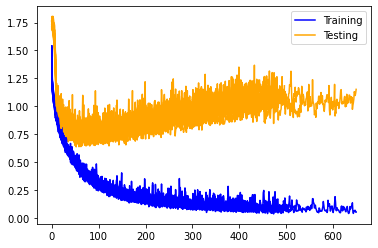

In [31]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

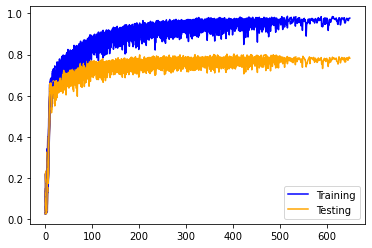

In [32]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

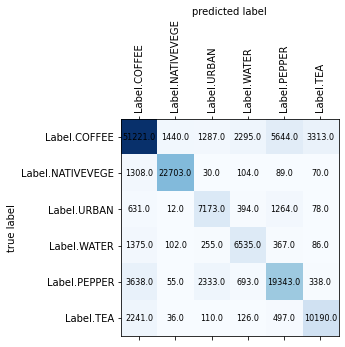

In [33]:
plot_confusion_matrix(conf_matrix, labels)

In [34]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.84783328 0.93243798 0.64113336 0.64403272 0.71103514 0.72397869]
Mean precision:  0.7500751949940242

Recalls:  [0.78559816 0.93412607 0.75094221 0.74942661 0.73268939 0.7719697 ]
Mean recall:  0.7874586894601515

F-Score:  [0.81553012 0.93328126 0.69170685 0.69274394 0.72169987 0.7472044 ]
Mean f-score:  0.7670277404699558


# BLUE, SWIR2, MNDWI, EVI2, BU

In [12]:
bands = [
    Band.BLUE.value,
    Band.SWIR2.value,
    Band.MNDWI.value,
    Band.EVI2.value,
    Band.BU.value,
]

model_name = "blue_swir2_mndwi_evi2_bu"

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(bands)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    SpatialDropout2D(0.25),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.25),
    Dense(nb_outputs, activation='softmax'),
])

mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, bands, labels, EPOCHS, NB_TESTS, early_stopping=True, with_model_checkpoint=True, model_name=model_name)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 9, 9, 5)           0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 9, 5)           20        
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 9, 9, 32)          1472      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 32)          9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 3, 3, 64)         

57/57 [==============================] - 0s 7ms/step - loss: 0.6717 - accuracy: 0.6234 - val_loss: 1.0011 - val_accuracy: 0.5698
Epoch 101/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6698 - accuracy: 0.6186 - val_loss: 1.0377 - val_accuracy: 0.5752
Epoch 102/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6908 - accuracy: 0.6142 - val_loss: 1.0796 - val_accuracy: 0.5418
Epoch 103/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6822 - accuracy: 0.6196 - val_loss: 1.0114 - val_accuracy: 0.5685
Epoch 104/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6749 - accuracy: 0.5979 - val_loss: 1.0184 - val_accuracy: 0.5828
Epoch 105/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6349 - accuracy: 0.6272 - val_loss: 1.0053 - val_accuracy: 0.5802
Epoch 106/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6315 - accuracy: 0.6164 - val_loss: 1.0367 - val_accuracy: 0.5736
Epoch 1

Epoch 157/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5595 - accuracy: 0.6576 - val_loss: 0.9577 - val_accuracy: 0.6033
Epoch 158/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5309 - accuracy: 0.6755 - val_loss: 1.0122 - val_accuracy: 0.5962
Epoch 159/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5731 - accuracy: 0.6457 - val_loss: 1.0886 - val_accuracy: 0.5554
Epoch 160/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6157 - accuracy: 0.6245 - val_loss: 0.9583 - val_accuracy: 0.6124
Epoch 161/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5751 - accuracy: 0.6527 - val_loss: 1.0417 - val_accuracy: 0.5928
Epoch 162/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5505 - accuracy: 0.6772 - val_loss: 1.0512 - val_accuracy: 0.5809
Epoch 163/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5198 - accuracy: 0.6907 - val_loss: 1.0771 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4401 - accuracy: 0.7287 - val_loss: 1.0981 - val_accuracy: 0.6002
Epoch 215/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4778 - accuracy: 0.6967 - val_loss: 1.0583 - val_accuracy: 0.6048
Epoch 216/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4574 - accuracy: 0.7179 - val_loss: 0.9768 - val_accuracy: 0.6364
Epoch 217/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4309 - accuracy: 0.7254 - val_loss: 1.0488 - val_accuracy: 0.6135
Epoch 218/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4880 - accuracy: 0.7141 - val_loss: 0.9978 - val_accuracy: 0.6280
Epoch 219/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4324 - accuracy: 0.7130 - val_loss: 1.0253 - val_accuracy: 0.6270
Epoch 220/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4433 - accuracy: 0.7173 - val_loss: 0.9991 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4027 - accuracy: 0.7406 - val_loss: 1.1031 - val_accuracy: 0.6090
Epoch 272/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4013 - accuracy: 0.7417 - val_loss: 1.1205 - val_accuracy: 0.6288
Epoch 273/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4398 - accuracy: 0.7216 - val_loss: 1.0712 - val_accuracy: 0.6266
Epoch 274/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4274 - accuracy: 0.7309 - val_loss: 1.0091 - val_accuracy: 0.6402
Epoch 275/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4714 - accuracy: 0.7179 - val_loss: 1.0476 - val_accuracy: 0.6118
Epoch 276/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4267 - accuracy: 0.7341 - val_loss: 1.0316 - val_accuracy: 0.6341
Epoch 277/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4578 - accuracy: 0.7103 - val_loss: 1.0367 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3792 - accuracy: 0.7558 - val_loss: 1.1197 - val_accuracy: 0.6247
Epoch 329/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3755 - accuracy: 0.7689 - val_loss: 1.0859 - val_accuracy: 0.6260
Epoch 330/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3492 - accuracy: 0.7743 - val_loss: 1.1565 - val_accuracy: 0.6162
Epoch 331/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3771 - accuracy: 0.7509 - val_loss: 1.1224 - val_accuracy: 0.6276
Epoch 332/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3842 - accuracy: 0.7645 - val_loss: 1.0979 - val_accuracy: 0.6287
Epoch 333/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3835 - accuracy: 0.7472 - val_loss: 1.1749 - val_accuracy: 0.6257
Epoch 334/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3629 - accuracy: 0.7732 - val_loss: 1.1590 - val_accuracy:

Epoch 385/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3812 - accuracy: 0.7482 - val_loss: 1.1079 - val_accuracy: 0.6376
Epoch 386/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3299 - accuracy: 0.7781 - val_loss: 1.1054 - val_accuracy: 0.6424
Epoch 387/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3852 - accuracy: 0.7558 - val_loss: 1.0561 - val_accuracy: 0.6546
Epoch 388/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3815 - accuracy: 0.7618 - val_loss: 1.1634 - val_accuracy: 0.6375
Epoch 389/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3728 - accuracy: 0.7585 - val_loss: 1.2029 - val_accuracy: 0.6182
Epoch 390/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3906 - accuracy: 0.7640 - val_loss: 1.2190 - val_accuracy: 0.6015
Epoch 391/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3879 - accuracy: 0.7564 - val_loss: 1.1928 - val_accuracy:

Epoch 30/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9688 - accuracy: 0.5081 - val_loss: 1.2127 - val_accuracy: 0.4936
Epoch 31/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9612 - accuracy: 0.5261 - val_loss: 1.0733 - val_accuracy: 0.5808
Epoch 32/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9552 - accuracy: 0.5304 - val_loss: 1.0718 - val_accuracy: 0.5567
Epoch 33/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9596 - accuracy: 0.5179 - val_loss: 1.0979 - val_accuracy: 0.5527
Epoch 34/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9869 - accuracy: 0.5125 - val_loss: 1.2046 - val_accuracy: 0.5009
Epoch 35/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9355 - accuracy: 0.5255 - val_loss: 1.0303 - val_accuracy: 0.5826
Epoch 36/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9618 - accuracy: 0.5358 - val_loss: 1.0912 - val_accuracy: 0.5501

57/57 [==============================] - 0s 7ms/step - loss: 0.6001 - accuracy: 0.6412 - val_loss: 1.0020 - val_accuracy: 0.5949
Epoch 145/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6093 - accuracy: 0.6374 - val_loss: 1.0575 - val_accuracy: 0.5906
Epoch 146/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6200 - accuracy: 0.6401 - val_loss: 1.0785 - val_accuracy: 0.5761
Epoch 147/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6029 - accuracy: 0.6428 - val_loss: 1.1553 - val_accuracy: 0.5591
Epoch 148/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5754 - accuracy: 0.6450 - val_loss: 1.0123 - val_accuracy: 0.6027
Epoch 149/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6104 - accuracy: 0.6325 - val_loss: 1.0604 - val_accuracy: 0.5828
Epoch 150/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5904 - accuracy: 0.6325 - val_loss: 1.1181 - val_accuracy: 0.5799
Epoch 1

Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5400 - accuracy: 0.6705 - val_loss: 1.0676 - val_accuracy: 0.6044
Epoch 202/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5031 - accuracy: 0.6775 - val_loss: 1.0305 - val_accuracy: 0.6138
Epoch 203/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5323 - accuracy: 0.6743 - val_loss: 1.0708 - val_accuracy: 0.6050
Epoch 204/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5616 - accuracy: 0.6629 - val_loss: 1.0139 - val_accuracy: 0.6249
Epoch 205/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5362 - accuracy: 0.6618 - val_loss: 1.0514 - val_accuracy: 0.5955
Epoch 206/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5161 - accuracy: 0.6748 - val_loss: 1.0523 - val_accuracy: 0.6280
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5253 - accuracy: 0.6726 - val_loss: 1.0299 - val_accuracy:

Epoch 258/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4693 - accuracy: 0.6965 - val_loss: 1.1258 - val_accuracy: 0.6099
Epoch 259/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4747 - accuracy: 0.6922 - val_loss: 1.1171 - val_accuracy: 0.6335
Epoch 260/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4881 - accuracy: 0.7063 - val_loss: 1.0967 - val_accuracy: 0.6089
Epoch 261/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4204 - accuracy: 0.6987 - val_loss: 1.0880 - val_accuracy: 0.6317
Epoch 262/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4560 - accuracy: 0.7106 - val_loss: 1.1504 - val_accuracy: 0.6146
Epoch 263/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4788 - accuracy: 0.7014 - val_loss: 1.1029 - val_accuracy: 0.6177
Epoch 264/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4371 - accuracy: 0.7215 - val_loss: 1.0938 - val_accuracy:

Epoch 315/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4413 - accuracy: 0.7166 - val_loss: 1.1033 - val_accuracy: 0.6286
Epoch 316/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4167 - accuracy: 0.7182 - val_loss: 1.1449 - val_accuracy: 0.6417
Epoch 317/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3780 - accuracy: 0.7459 - val_loss: 1.1169 - val_accuracy: 0.6413
Epoch 318/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3973 - accuracy: 0.7334 - val_loss: 1.2088 - val_accuracy: 0.6241
Epoch 319/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4983 - accuracy: 0.7128 - val_loss: 1.2349 - val_accuracy: 0.6094
Epoch 320/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4107 - accuracy: 0.7334 - val_loss: 1.1234 - val_accuracy: 0.6297
Epoch 321/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4341 - accuracy: 0.7231 - val_loss: 1.1325 - val_accuracy:

Epoch 372/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3710 - accuracy: 0.7486 - val_loss: 1.1308 - val_accuracy: 0.6436
Epoch 373/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3759 - accuracy: 0.7584 - val_loss: 1.1521 - val_accuracy: 0.6393
Epoch 374/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4094 - accuracy: 0.7427 - val_loss: 1.1881 - val_accuracy: 0.6255
Epoch 375/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4029 - accuracy: 0.7372 - val_loss: 1.1806 - val_accuracy: 0.6335
Epoch 376/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4002 - accuracy: 0.7345 - val_loss: 1.1721 - val_accuracy: 0.6256
Epoch 377/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3967 - accuracy: 0.7628 - val_loss: 1.1832 - val_accuracy: 0.6297
Epoch 378/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4613 - accuracy: 0.7139 - val_loss: 1.1274 - val_accuracy:

Epoch 429/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3891 - accuracy: 0.7676 - val_loss: 1.1726 - val_accuracy: 0.6450
Epoch 430/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3576 - accuracy: 0.7622 - val_loss: 1.1723 - val_accuracy: 0.6537

Validation 1, fold 3 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5904 - accuracy: 0.1998 - val_loss: 1.7608 - val_accuracy: 0.1947
Epoch 2/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.4349 - accuracy: 0.2980 - val_loss: 1.7508 - val_accuracy: 0.1987
Epoch 3/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.3442 - accuracy: 0.3789 - val_loss: 1.7810 - val_accuracy: 0.0883
Epoch 4/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.2331 - accuracy: 0.4316 - val_loss: 1.8568 - val_accuracy: 0.0883
Epoch 5/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.1611 - accuracy

Epoch 56/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.7494 - accuracy: 0.5727 - val_loss: 1.0412 - val_accuracy: 0.5641
Epoch 57/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.7861 - accuracy: 0.5613 - val_loss: 0.9703 - val_accuracy: 0.6046
Epoch 58/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.7668 - accuracy: 0.5717 - val_loss: 1.0819 - val_accuracy: 0.5507
Epoch 59/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7916 - accuracy: 0.5782 - val_loss: 1.0679 - val_accuracy: 0.5577
Epoch 60/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7456 - accuracy: 0.5858 - val_loss: 1.0308 - val_accuracy: 0.5739
Epoch 61/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7344 - accuracy: 0.5945 - val_loss: 1.0892 - val_accuracy: 0.5501
Epoch 62/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.7319 - accuracy: 0.5809 - val_loss: 1.0403 - val_accuracy: 0.5765

Epoch 170/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5712 - accuracy: 0.6585 - val_loss: 1.0416 - val_accuracy: 0.6012
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5561 - accuracy: 0.6504 - val_loss: 1.0829 - val_accuracy: 0.5811
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5194 - accuracy: 0.6585 - val_loss: 1.0880 - val_accuracy: 0.5873
Epoch 173/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5355 - accuracy: 0.6450 - val_loss: 1.0860 - val_accuracy: 0.5552
Epoch 174/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5359 - accuracy: 0.6558 - val_loss: 1.1006 - val_accuracy: 0.5755
Epoch 175/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5076 - accuracy: 0.6770 - val_loss: 1.0622 - val_accuracy: 0.5890
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5402 - accuracy: 0.6444 - val_loss: 1.1046 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4847 - accuracy: 0.6895 - val_loss: 1.1079 - val_accuracy: 0.5968
Epoch 228/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4737 - accuracy: 0.6916 - val_loss: 1.0075 - val_accuracy: 0.6199
Epoch 229/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4733 - accuracy: 0.6759 - val_loss: 1.0926 - val_accuracy: 0.6132
Epoch 230/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4633 - accuracy: 0.6873 - val_loss: 1.1146 - val_accuracy: 0.5906
Epoch 231/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4276 - accuracy: 0.6944 - val_loss: 1.0846 - val_accuracy: 0.6299
Epoch 232/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4736 - accuracy: 0.6802 - val_loss: 1.1286 - val_accuracy: 0.5955
Epoch 233/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4516 - accuracy: 0.7090 - val_loss: 1.0966 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4272 - accuracy: 0.7318 - val_loss: 1.0797 - val_accuracy: 0.6223
Epoch 285/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3930 - accuracy: 0.7199 - val_loss: 1.0899 - val_accuracy: 0.6180
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4405 - accuracy: 0.7144 - val_loss: 1.0621 - val_accuracy: 0.6321
Epoch 287/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4091 - accuracy: 0.7324 - val_loss: 1.0355 - val_accuracy: 0.6483
Epoch 288/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4562 - accuracy: 0.7199 - val_loss: 1.1244 - val_accuracy: 0.6255
Epoch 289/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4920 - accuracy: 0.6781 - val_loss: 1.0736 - val_accuracy: 0.6301
Epoch 290/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4368 - accuracy: 0.7014 - val_loss: 1.0746 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3609 - accuracy: 0.7508 - val_loss: 1.0861 - val_accuracy: 0.6412
Epoch 342/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3693 - accuracy: 0.7454 - val_loss: 1.0846 - val_accuracy: 0.6364
Epoch 343/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3561 - accuracy: 0.7562 - val_loss: 1.1509 - val_accuracy: 0.6260
Epoch 344/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3544 - accuracy: 0.7638 - val_loss: 1.1402 - val_accuracy: 0.6427
Epoch 345/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3812 - accuracy: 0.7552 - val_loss: 1.0749 - val_accuracy: 0.6263
Epoch 346/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3855 - accuracy: 0.7584 - val_loss: 1.1606 - val_accuracy: 0.6195
Epoch 347/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3966 - accuracy: 0.7313 - val_loss: 1.0879 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3454 - accuracy: 0.7682 - val_loss: 1.1533 - val_accuracy: 0.6332
Epoch 399/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3921 - accuracy: 0.7530 - val_loss: 1.1668 - val_accuracy: 0.6143
Epoch 400/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3767 - accuracy: 0.7503 - val_loss: 1.1210 - val_accuracy: 0.6222
Epoch 401/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3261 - accuracy: 0.7801 - val_loss: 1.2081 - val_accuracy: 0.6265
Epoch 402/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3308 - accuracy: 0.7611 - val_loss: 1.1710 - val_accuracy: 0.6458
Epoch 403/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3520 - accuracy: 0.7628 - val_loss: 1.1231 - val_accuracy: 0.6459
Epoch 404/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3176 - accuracy: 0.7752 - val_loss: 1.1366 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3050 - accuracy: 0.7899 - val_loss: 1.1769 - val_accuracy: 0.6394
Epoch 456/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3061 - accuracy: 0.7894 - val_loss: 1.2257 - val_accuracy: 0.6369
Epoch 457/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3282 - accuracy: 0.7812 - val_loss: 1.1616 - val_accuracy: 0.6478
Epoch 458/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3609 - accuracy: 0.7725 - val_loss: 1.1842 - val_accuracy: 0.6426
Epoch 459/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4127 - accuracy: 0.7617 - val_loss: 1.2156 - val_accuracy: 0.6119
Epoch 460/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4024 - accuracy: 0.7557 - val_loss: 1.0903 - val_accuracy: 0.6393
Epoch 461/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3653 - accuracy: 0.7714 - val_loss: 1.1326 - val_accuracy:

Epoch 512/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3226 - accuracy: 0.7828 - val_loss: 1.1871 - val_accuracy: 0.6339
Epoch 513/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3309 - accuracy: 0.7752 - val_loss: 1.2002 - val_accuracy: 0.6367
Epoch 514/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3055 - accuracy: 0.7861 - val_loss: 1.1091 - val_accuracy: 0.6655
Epoch 515/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2884 - accuracy: 0.7959 - val_loss: 1.2360 - val_accuracy: 0.6336
Epoch 516/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3329 - accuracy: 0.7877 - val_loss: 1.2102 - val_accuracy: 0.6531
Epoch 517/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3275 - accuracy: 0.7742 - val_loss: 1.1450 - val_accuracy: 0.6559
Epoch 518/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3060 - accuracy: 0.7953 - val_loss: 1.1501 - val_accuracy:

Epoch 569/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3371 - accuracy: 0.7774 - val_loss: 1.1407 - val_accuracy: 0.6730
Epoch 570/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3140 - accuracy: 0.7964 - val_loss: 1.2245 - val_accuracy: 0.6359
Epoch 571/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3094 - accuracy: 0.7942 - val_loss: 1.1586 - val_accuracy: 0.6583
Epoch 572/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3173 - accuracy: 0.8062 - val_loss: 1.1583 - val_accuracy: 0.6610
Epoch 573/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3132 - accuracy: 0.7910 - val_loss: 1.1642 - val_accuracy: 0.6645
Epoch 574/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2953 - accuracy: 0.8062 - val_loss: 1.2047 - val_accuracy: 0.6506
Epoch 575/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2962 - accuracy: 0.7975 - val_loss: 1.1170 - val_accuracy:

Epoch 26/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.9870 - accuracy: 0.5157 - val_loss: 1.1428 - val_accuracy: 0.5136
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9673 - accuracy: 0.5206 - val_loss: 1.0892 - val_accuracy: 0.5442
Epoch 28/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9902 - accuracy: 0.5125 - val_loss: 1.1360 - val_accuracy: 0.5306
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9694 - accuracy: 0.5342 - val_loss: 1.1586 - val_accuracy: 0.5187
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9357 - accuracy: 0.5337 - val_loss: 1.1032 - val_accuracy: 0.5457
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9665 - accuracy: 0.5353 - val_loss: 1.0734 - val_accuracy: 0.5503
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9253 - accuracy: 0.5326 - val_loss: 1.0697 - val_accuracy: 0.5527

57/57 [==============================] - 0s 7ms/step - loss: 0.5841 - accuracy: 0.6542 - val_loss: 1.0495 - val_accuracy: 0.5876
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6372 - accuracy: 0.6357 - val_loss: 1.0217 - val_accuracy: 0.5871
Epoch 142/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6485 - accuracy: 0.6422 - val_loss: 1.0218 - val_accuracy: 0.5750
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5957 - accuracy: 0.6634 - val_loss: 0.9818 - val_accuracy: 0.5991
Epoch 144/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5993 - accuracy: 0.6406 - val_loss: 1.0111 - val_accuracy: 0.6111
Epoch 145/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5996 - accuracy: 0.6450 - val_loss: 1.0198 - val_accuracy: 0.5727
Epoch 146/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5786 - accuracy: 0.6488 - val_loss: 1.0899 - val_accuracy: 0.5773
Epoch 1

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5495 - accuracy: 0.6612 - val_loss: 1.0156 - val_accuracy: 0.6113
Epoch 198/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5402 - accuracy: 0.6694 - val_loss: 1.0337 - val_accuracy: 0.5985
Epoch 199/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5056 - accuracy: 0.6802 - val_loss: 1.1055 - val_accuracy: 0.5830
Epoch 200/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5086 - accuracy: 0.6900 - val_loss: 1.0308 - val_accuracy: 0.6118
Epoch 201/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5110 - accuracy: 0.6656 - val_loss: 1.1708 - val_accuracy: 0.5667
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6026 - accuracy: 0.6488 - val_loss: 1.0448 - val_accuracy: 0.5877
Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5615 - accuracy: 0.6710 - val_loss: 1.0693 - val_accurac

Epoch 254/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4833 - accuracy: 0.7003 - val_loss: 1.0644 - val_accuracy: 0.6162
Epoch 255/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4530 - accuracy: 0.7172 - val_loss: 1.0945 - val_accuracy: 0.6120
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4622 - accuracy: 0.7068 - val_loss: 1.0291 - val_accuracy: 0.6313
Epoch 257/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4496 - accuracy: 0.7204 - val_loss: 1.1047 - val_accuracy: 0.6050
Epoch 258/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4658 - accuracy: 0.7003 - val_loss: 1.1051 - val_accuracy: 0.6024
Epoch 259/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4653 - accuracy: 0.7068 - val_loss: 1.0423 - val_accuracy: 0.6172
Epoch 260/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4687 - accuracy: 0.7155 - val_loss: 1.2034 - val_accuracy

Epoch 21/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0508 - accuracy: 0.4625 - val_loss: 1.2308 - val_accuracy: 0.4735
Epoch 22/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0111 - accuracy: 0.4723 - val_loss: 1.0819 - val_accuracy: 0.5660
Epoch 23/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0033 - accuracy: 0.4745 - val_loss: 1.1666 - val_accuracy: 0.5071
Epoch 24/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9915 - accuracy: 0.4978 - val_loss: 1.1672 - val_accuracy: 0.5035
Epoch 25/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0427 - accuracy: 0.4609 - val_loss: 1.0829 - val_accuracy: 0.5440
Epoch 26/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0014 - accuracy: 0.4837 - val_loss: 1.0992 - val_accuracy: 0.5567
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0106 - accuracy: 0.4707 - val_loss: 1.1264 - val_accuracy: 0.526

57/57 [==============================] - 0s 7ms/step - loss: 0.6189 - accuracy: 0.5993 - val_loss: 1.0107 - val_accuracy: 0.5846
Epoch 136/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6540 - accuracy: 0.5711 - val_loss: 1.0606 - val_accuracy: 0.5440
Epoch 137/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6401 - accuracy: 0.6075 - val_loss: 1.0077 - val_accuracy: 0.5803
Epoch 138/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6338 - accuracy: 0.5977 - val_loss: 1.1514 - val_accuracy: 0.5055
Epoch 139/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6464 - accuracy: 0.6064 - val_loss: 1.0684 - val_accuracy: 0.5695
Epoch 140/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5980 - accuracy: 0.6243 - val_loss: 1.0208 - val_accuracy: 0.5993
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6570 - accuracy: 0.6178 - val_loss: 1.0061 - val_accuracy: 0.5628
Epoch 1

Epoch 192/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5531 - accuracy: 0.6384 - val_loss: 1.0071 - val_accuracy: 0.6092
Epoch 193/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5478 - accuracy: 0.6515 - val_loss: 1.0037 - val_accuracy: 0.6198
Epoch 194/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5239 - accuracy: 0.6574 - val_loss: 1.0574 - val_accuracy: 0.5900
Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5264 - accuracy: 0.6520 - val_loss: 1.2181 - val_accuracy: 0.5626
Epoch 196/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5528 - accuracy: 0.6520 - val_loss: 1.0969 - val_accuracy: 0.5801
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5351 - accuracy: 0.6444 - val_loss: 1.0467 - val_accuracy: 0.5917
Epoch 198/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5561 - accuracy: 0.6428 - val_loss: 1.0315 - val_accuracy:

Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4755 - accuracy: 0.6819 - val_loss: 1.1505 - val_accuracy: 0.5632
Epoch 250/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4961 - accuracy: 0.6634 - val_loss: 1.0273 - val_accuracy: 0.6066
Epoch 251/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5204 - accuracy: 0.6656 - val_loss: 1.0736 - val_accuracy: 0.5918
Epoch 252/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4848 - accuracy: 0.6716 - val_loss: 1.0248 - val_accuracy: 0.6024
Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4739 - accuracy: 0.6840 - val_loss: 1.0740 - val_accuracy: 0.5989
Epoch 254/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5389 - accuracy: 0.6732 - val_loss: 1.0499 - val_accuracy: 0.5951
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4711 - accuracy: 0.6873 - val_loss: 0.9935 - val_accuracy:

Epoch 306/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4278 - accuracy: 0.7204 - val_loss: 1.0638 - val_accuracy: 0.6135
Epoch 307/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4640 - accuracy: 0.6960 - val_loss: 1.1866 - val_accuracy: 0.5776
Epoch 308/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4186 - accuracy: 0.7106 - val_loss: 1.0227 - val_accuracy: 0.6454
Epoch 309/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4310 - accuracy: 0.7047 - val_loss: 1.0656 - val_accuracy: 0.6169
Epoch 310/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4898 - accuracy: 0.7128 - val_loss: 1.1570 - val_accuracy: 0.6012
Epoch 311/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4363 - accuracy: 0.7052 - val_loss: 1.1380 - val_accuracy: 0.5959
Epoch 312/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4243 - accuracy: 0.7215 - val_loss: 1.0700 - val_accuracy:

Epoch 363/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4386 - accuracy: 0.7047 - val_loss: 1.0688 - val_accuracy: 0.6516
Epoch 364/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3887 - accuracy: 0.7600 - val_loss: 1.0571 - val_accuracy: 0.6396
Epoch 365/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4406 - accuracy: 0.7237 - val_loss: 1.1209 - val_accuracy: 0.6211
Epoch 366/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4192 - accuracy: 0.7356 - val_loss: 1.2452 - val_accuracy: 0.5903
Epoch 367/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4884 - accuracy: 0.7139 - val_loss: 1.1590 - val_accuracy: 0.6099
Epoch 368/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4090 - accuracy: 0.7253 - val_loss: 1.0641 - val_accuracy: 0.6356
Epoch 369/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3926 - accuracy: 0.7367 - val_loss: 1.0968 - val_accuracy:

Epoch 420/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3540 - accuracy: 0.7530 - val_loss: 1.1338 - val_accuracy: 0.6331
Epoch 421/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3598 - accuracy: 0.7524 - val_loss: 1.1070 - val_accuracy: 0.6439
Epoch 422/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3749 - accuracy: 0.7405 - val_loss: 1.0867 - val_accuracy: 0.6373
Epoch 423/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3989 - accuracy: 0.7568 - val_loss: 1.1276 - val_accuracy: 0.6278
Epoch 424/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3720 - accuracy: 0.7432 - val_loss: 1.1163 - val_accuracy: 0.6439
Epoch 425/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3938 - accuracy: 0.7687 - val_loss: 1.1567 - val_accuracy: 0.6164
Epoch 426/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3764 - accuracy: 0.7476 - val_loss: 1.1489 - val_accuracy:

Epoch 477/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4299 - accuracy: 0.7747 - val_loss: 1.3070 - val_accuracy: 0.5976
Epoch 478/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3936 - accuracy: 0.7280 - val_loss: 1.1510 - val_accuracy: 0.6204
Epoch 479/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3513 - accuracy: 0.7470 - val_loss: 1.1585 - val_accuracy: 0.6335
Epoch 480/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3614 - accuracy: 0.7747 - val_loss: 1.1213 - val_accuracy: 0.6295
Epoch 481/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3822 - accuracy: 0.7524 - val_loss: 1.0949 - val_accuracy: 0.6439
Epoch 482/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3653 - accuracy: 0.7709 - val_loss: 1.1558 - val_accuracy: 0.6268
Epoch 483/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3570 - accuracy: 0.7617 - val_loss: 1.1758 - val_accuracy:

Epoch 36/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9440 - accuracy: 0.5361 - val_loss: 1.0593 - val_accuracy: 0.5577
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9544 - accuracy: 0.5518 - val_loss: 1.2036 - val_accuracy: 0.4985
Epoch 38/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9179 - accuracy: 0.5578 - val_loss: 1.0731 - val_accuracy: 0.5497
Epoch 39/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9344 - accuracy: 0.5366 - val_loss: 1.1100 - val_accuracy: 0.5324
Epoch 40/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9128 - accuracy: 0.5383 - val_loss: 1.1608 - val_accuracy: 0.5247
Epoch 41/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9198 - accuracy: 0.5746 - val_loss: 1.1046 - val_accuracy: 0.5551
Epoch 42/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9194 - accuracy: 0.5415 - val_loss: 1.2823 - val_accuracy: 0.4841

57/57 [==============================] - 0s 7ms/step - loss: 0.6163 - accuracy: 0.6278 - val_loss: 1.0237 - val_accuracy: 0.5949
Epoch 151/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5742 - accuracy: 0.6527 - val_loss: 1.0867 - val_accuracy: 0.5770
Epoch 152/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5735 - accuracy: 0.6327 - val_loss: 0.9694 - val_accuracy: 0.6045
Epoch 153/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5896 - accuracy: 0.6473 - val_loss: 1.0003 - val_accuracy: 0.6226
Epoch 154/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5730 - accuracy: 0.6522 - val_loss: 0.9965 - val_accuracy: 0.6167
Epoch 155/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5859 - accuracy: 0.6484 - val_loss: 1.0017 - val_accuracy: 0.6079
Epoch 156/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6363 - accuracy: 0.6327 - val_loss: 1.1015 - val_accuracy: 0.5639
Epoch 1

Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4965 - accuracy: 0.6810 - val_loss: 1.0179 - val_accuracy: 0.6232
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5239 - accuracy: 0.6495 - val_loss: 0.9954 - val_accuracy: 0.6240
Epoch 209/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4970 - accuracy: 0.6875 - val_loss: 1.0405 - val_accuracy: 0.6110
Epoch 210/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4635 - accuracy: 0.6972 - val_loss: 1.0937 - val_accuracy: 0.6182
Epoch 211/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4838 - accuracy: 0.6896 - val_loss: 1.0071 - val_accuracy: 0.6289
Epoch 212/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4895 - accuracy: 0.6934 - val_loss: 1.1229 - val_accuracy: 0.5886
Epoch 213/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5546 - accuracy: 0.6663 - val_loss: 1.1315 - val_accuracy

Epoch 264/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4509 - accuracy: 0.7048 - val_loss: 1.0830 - val_accuracy: 0.6139
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4403 - accuracy: 0.7157 - val_loss: 1.1373 - val_accuracy: 0.6048
Epoch 266/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5004 - accuracy: 0.6864 - val_loss: 1.1480 - val_accuracy: 0.6150
Epoch 267/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4624 - accuracy: 0.6989 - val_loss: 1.1069 - val_accuracy: 0.6126
Epoch 268/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4513 - accuracy: 0.7037 - val_loss: 1.0407 - val_accuracy: 0.6306
Epoch 269/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4666 - accuracy: 0.6902 - val_loss: 1.0642 - val_accuracy: 0.6194
Epoch 270/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4365 - accuracy: 0.6951 - val_loss: 1.0187 - val_accuracy:

Epoch 321/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3787 - accuracy: 0.7276 - val_loss: 1.1093 - val_accuracy: 0.6386
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3940 - accuracy: 0.7526 - val_loss: 1.1952 - val_accuracy: 0.6333
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4293 - accuracy: 0.7330 - val_loss: 1.1022 - val_accuracy: 0.6394
Epoch 324/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4023 - accuracy: 0.7227 - val_loss: 1.1087 - val_accuracy: 0.6410
Epoch 325/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4075 - accuracy: 0.7320 - val_loss: 1.1338 - val_accuracy: 0.6304
Epoch 326/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3731 - accuracy: 0.7450 - val_loss: 1.1612 - val_accuracy: 0.6236
Epoch 327/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4254 - accuracy: 0.7341 - val_loss: 1.1440 - val_accuracy:

Epoch 33/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9570 - accuracy: 0.5109 - val_loss: 1.1327 - val_accuracy: 0.5086
Epoch 34/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9410 - accuracy: 0.5364 - val_loss: 1.1387 - val_accuracy: 0.5290
Epoch 35/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9237 - accuracy: 0.5331 - val_loss: 1.0893 - val_accuracy: 0.5352
Epoch 36/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9306 - accuracy: 0.5364 - val_loss: 1.1206 - val_accuracy: 0.5288
Epoch 37/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9228 - accuracy: 0.5413 - val_loss: 1.1243 - val_accuracy: 0.5044
Epoch 38/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.9260 - accuracy: 0.5233 - val_loss: 1.1195 - val_accuracy: 0.5119
Epoch 39/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9240 - accuracy: 0.5206 - val_loss: 1.0594 - val_accuracy: 0.5576

57/57 [==============================] - 0s 7ms/step - loss: 0.5873 - accuracy: 0.6607 - val_loss: 0.9682 - val_accuracy: 0.6187
Epoch 148/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6161 - accuracy: 0.6368 - val_loss: 1.1006 - val_accuracy: 0.5727
Epoch 149/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5748 - accuracy: 0.6509 - val_loss: 1.0047 - val_accuracy: 0.6046
Epoch 150/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5950 - accuracy: 0.6357 - val_loss: 1.0674 - val_accuracy: 0.5701
Epoch 151/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5633 - accuracy: 0.6694 - val_loss: 1.0699 - val_accuracy: 0.5940
Epoch 152/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5983 - accuracy: 0.6417 - val_loss: 0.9799 - val_accuracy: 0.6130
Epoch 153/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5930 - accuracy: 0.6580 - val_loss: 1.0763 - val_accuracy: 0.5700
Epoch 1

Epoch 204/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5169 - accuracy: 0.7009 - val_loss: 1.0891 - val_accuracy: 0.5846
Epoch 205/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5117 - accuracy: 0.6976 - val_loss: 1.0270 - val_accuracy: 0.6119
Epoch 206/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4936 - accuracy: 0.6933 - val_loss: 1.1392 - val_accuracy: 0.5841
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5119 - accuracy: 0.6857 - val_loss: 1.1149 - val_accuracy: 0.5850
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5122 - accuracy: 0.6851 - val_loss: 1.1266 - val_accuracy: 0.5793
Epoch 209/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5151 - accuracy: 0.6878 - val_loss: 1.1343 - val_accuracy: 0.5932
Epoch 210/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4669 - accuracy: 0.7096 - val_loss: 1.0616 - val_accuracy:

Epoch 261/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4345 - accuracy: 0.7356 - val_loss: 1.0056 - val_accuracy: 0.6355
Epoch 262/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4244 - accuracy: 0.7177 - val_loss: 1.0401 - val_accuracy: 0.6267
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4223 - accuracy: 0.7351 - val_loss: 1.0740 - val_accuracy: 0.6271
Epoch 264/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4258 - accuracy: 0.7318 - val_loss: 1.1071 - val_accuracy: 0.6246
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4329 - accuracy: 0.7204 - val_loss: 1.0737 - val_accuracy: 0.6146
Epoch 266/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4369 - accuracy: 0.7291 - val_loss: 1.0609 - val_accuracy: 0.6351
Epoch 267/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4775 - accuracy: 0.7220 - val_loss: 1.0330 - val_accuracy:

Epoch 318/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4197 - accuracy: 0.7579 - val_loss: 1.1080 - val_accuracy: 0.6298
Epoch 319/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3899 - accuracy: 0.7628 - val_loss: 1.0711 - val_accuracy: 0.6496
Epoch 320/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3833 - accuracy: 0.7644 - val_loss: 1.2256 - val_accuracy: 0.6027
Epoch 321/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4007 - accuracy: 0.7454 - val_loss: 1.1452 - val_accuracy: 0.6253
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4020 - accuracy: 0.7470 - val_loss: 1.1270 - val_accuracy: 0.6309
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3971 - accuracy: 0.7590 - val_loss: 1.1157 - val_accuracy: 0.6430
Epoch 324/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3878 - accuracy: 0.7617 - val_loss: 1.1421 - val_accuracy:

Epoch 375/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3567 - accuracy: 0.7720 - val_loss: 1.1131 - val_accuracy: 0.6544
Epoch 376/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3861 - accuracy: 0.7752 - val_loss: 1.1928 - val_accuracy: 0.6265
Epoch 377/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3691 - accuracy: 0.7807 - val_loss: 1.1622 - val_accuracy: 0.6407
Epoch 378/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4075 - accuracy: 0.7714 - val_loss: 1.1299 - val_accuracy: 0.6279
Epoch 379/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4064 - accuracy: 0.7524 - val_loss: 1.1162 - val_accuracy: 0.6477
Epoch 380/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3922 - accuracy: 0.7519 - val_loss: 1.2022 - val_accuracy: 0.6223
Epoch 381/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3547 - accuracy: 0.7731 - val_loss: 1.1360 - val_accuracy:

Epoch 432/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3222 - accuracy: 0.7850 - val_loss: 1.1717 - val_accuracy: 0.6569
Epoch 433/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3345 - accuracy: 0.8040 - val_loss: 1.2185 - val_accuracy: 0.6489
Epoch 434/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3595 - accuracy: 0.7579 - val_loss: 1.3238 - val_accuracy: 0.6146
Epoch 435/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3286 - accuracy: 0.7818 - val_loss: 1.2131 - val_accuracy: 0.6400
Epoch 436/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3159 - accuracy: 0.7877 - val_loss: 1.2462 - val_accuracy: 0.6430
Epoch 437/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3680 - accuracy: 0.7899 - val_loss: 1.3243 - val_accuracy: 0.6289
Epoch 438/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3699 - accuracy: 0.7742 - val_loss: 1.2554 - val_accuracy:

Epoch 17/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.0683 - accuracy: 0.4767 - val_loss: 1.1092 - val_accuracy: 0.5310
Epoch 18/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.0335 - accuracy: 0.4989 - val_loss: 1.1788 - val_accuracy: 0.4949
Epoch 19/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.0373 - accuracy: 0.4718 - val_loss: 1.2308 - val_accuracy: 0.4827
Epoch 20/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0041 - accuracy: 0.4902 - val_loss: 1.1043 - val_accuracy: 0.5507
Epoch 21/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9803 - accuracy: 0.5201 - val_loss: 1.1224 - val_accuracy: 0.5435
Epoch 22/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.0144 - accuracy: 0.5147 - val_loss: 1.0973 - val_accuracy: 0.5216
Epoch 23/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0112 - accuracy: 0.5043 - val_loss: 1.1901 - val_accuracy: 0.5151

57/57 [==============================] - 0s 6ms/step - loss: 0.5774 - accuracy: 0.6330 - val_loss: 1.0134 - val_accuracy: 0.5781
Epoch 132/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6120 - accuracy: 0.6107 - val_loss: 1.1562 - val_accuracy: 0.5545
Epoch 133/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6904 - accuracy: 0.6010 - val_loss: 1.0302 - val_accuracy: 0.5739
Epoch 134/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6073 - accuracy: 0.6173 - val_loss: 1.0149 - val_accuracy: 0.5800
Epoch 135/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6293 - accuracy: 0.6129 - val_loss: 1.0279 - val_accuracy: 0.5682
Epoch 136/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5670 - accuracy: 0.6336 - val_loss: 1.1691 - val_accuracy: 0.5495
Epoch 137/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5593 - accuracy: 0.6417 - val_loss: 1.0156 - val_accuracy: 0.5796
Epoch 1

Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5319 - accuracy: 0.6716 - val_loss: 1.0314 - val_accuracy: 0.6124
Epoch 189/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5383 - accuracy: 0.6612 - val_loss: 1.0208 - val_accuracy: 0.5868
Epoch 190/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4838 - accuracy: 0.6884 - val_loss: 1.0459 - val_accuracy: 0.6151
Epoch 191/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5278 - accuracy: 0.6498 - val_loss: 1.1178 - val_accuracy: 0.5710
Epoch 192/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5236 - accuracy: 0.6721 - val_loss: 1.0663 - val_accuracy: 0.6023
Epoch 193/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4946 - accuracy: 0.6862 - val_loss: 1.1410 - val_accuracy: 0.5894
Epoch 194/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4897 - accuracy: 0.6764 - val_loss: 1.0414 - val_accuracy:

Epoch 245/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4541 - accuracy: 0.7047 - val_loss: 1.1005 - val_accuracy: 0.6172
Epoch 246/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4405 - accuracy: 0.7003 - val_loss: 1.0826 - val_accuracy: 0.6115
Epoch 247/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4546 - accuracy: 0.7150 - val_loss: 1.0972 - val_accuracy: 0.6173
Epoch 248/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4833 - accuracy: 0.6982 - val_loss: 1.0550 - val_accuracy: 0.6206
Epoch 249/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4607 - accuracy: 0.6992 - val_loss: 1.0979 - val_accuracy: 0.6088
Epoch 250/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4178 - accuracy: 0.7166 - val_loss: 1.0984 - val_accuracy: 0.6203
Epoch 251/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4686 - accuracy: 0.6976 - val_loss: 1.0975 - val_accuracy:

Epoch 302/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4428 - accuracy: 0.7199 - val_loss: 1.1698 - val_accuracy: 0.6202
Epoch 303/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4234 - accuracy: 0.7296 - val_loss: 1.0719 - val_accuracy: 0.6373
Epoch 304/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4095 - accuracy: 0.7258 - val_loss: 1.0562 - val_accuracy: 0.6344
Epoch 305/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3629 - accuracy: 0.7427 - val_loss: 1.1066 - val_accuracy: 0.6430
Epoch 306/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4427 - accuracy: 0.7296 - val_loss: 1.1697 - val_accuracy: 0.6029
Epoch 307/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4216 - accuracy: 0.7188 - val_loss: 1.0508 - val_accuracy: 0.6461
Epoch 308/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3853 - accuracy: 0.7329 - val_loss: 1.1197 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4078 - accuracy: 0.7541 - val_loss: 1.0754 - val_accuracy: 0.6416
Epoch 360/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4075 - accuracy: 0.7367 - val_loss: 1.0838 - val_accuracy: 0.6413
Epoch 361/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4390 - accuracy: 0.7280 - val_loss: 1.1072 - val_accuracy: 0.6215
Epoch 362/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4072 - accuracy: 0.7432 - val_loss: 1.1733 - val_accuracy: 0.6203
Epoch 363/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3949 - accuracy: 0.7508 - val_loss: 1.1121 - val_accuracy: 0.6278
Epoch 364/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4031 - accuracy: 0.7324 - val_loss: 1.1383 - val_accuracy: 0.6104
Epoch 365/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4065 - accuracy: 0.7345 - val_loss: 1.1546 - val_accuracy:

Epoch 416/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3481 - accuracy: 0.7660 - val_loss: 1.1307 - val_accuracy: 0.6431
Epoch 417/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3191 - accuracy: 0.7736 - val_loss: 1.1823 - val_accuracy: 0.6461
Epoch 418/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3633 - accuracy: 0.7682 - val_loss: 1.1162 - val_accuracy: 0.6578
Epoch 419/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3576 - accuracy: 0.7600 - val_loss: 1.0970 - val_accuracy: 0.6601
Epoch 420/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3844 - accuracy: 0.7541 - val_loss: 1.1057 - val_accuracy: 0.6620
Epoch 421/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3357 - accuracy: 0.7682 - val_loss: 1.1295 - val_accuracy: 0.6440
Epoch 422/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3433 - accuracy: 0.7606 - val_loss: 1.1176 - val_accuracy:

Epoch 473/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.3617 - accuracy: 0.7628 - val_loss: 1.1673 - val_accuracy: 0.6499
Epoch 474/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3708 - accuracy: 0.7671 - val_loss: 1.2782 - val_accuracy: 0.6217
Epoch 475/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3562 - accuracy: 0.7752 - val_loss: 1.1899 - val_accuracy: 0.6252
Epoch 476/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3840 - accuracy: 0.7666 - val_loss: 1.1866 - val_accuracy: 0.6316
Epoch 477/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3088 - accuracy: 0.8056 - val_loss: 1.1854 - val_accuracy: 0.6571
Epoch 478/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3377 - accuracy: 0.7953 - val_loss: 1.1836 - val_accuracy: 0.6426
Epoch 479/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3128 - accuracy: 0.7866 - val_loss: 1.1846 - val_accuracy:

Epoch 530/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3100 - accuracy: 0.7970 - val_loss: 1.2461 - val_accuracy: 0.6421
Epoch 531/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2962 - accuracy: 0.7991 - val_loss: 1.2723 - val_accuracy: 0.6465

Validation 2, fold 4 :
---------------------------

Epoch 1/2000
57/57 [==============================] - 1s 8ms/step - loss: 1.5859 - accuracy: 0.1987 - val_loss: 1.7438 - val_accuracy: 0.4435
Epoch 2/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.4042 - accuracy: 0.3029 - val_loss: 1.7270 - val_accuracy: 0.4701
Epoch 3/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.2963 - accuracy: 0.3659 - val_loss: 1.7018 - val_accuracy: 0.0909
Epoch 4/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.2311 - accuracy: 0.4007 - val_loss: 1.7572 - val_accuracy: 0.0912
Epoch 5/2000
57/57 [==============================] - 0s 6ms/step - loss: 1.1996 - accuracy

Epoch 56/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8030 - accuracy: 0.5440 - val_loss: 1.0647 - val_accuracy: 0.5637
Epoch 57/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8084 - accuracy: 0.5418 - val_loss: 1.1157 - val_accuracy: 0.5240
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7799 - accuracy: 0.5527 - val_loss: 1.1043 - val_accuracy: 0.5279
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7854 - accuracy: 0.5413 - val_loss: 1.1503 - val_accuracy: 0.5174
Epoch 60/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7705 - accuracy: 0.5765 - val_loss: 1.1252 - val_accuracy: 0.4938
Epoch 61/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7720 - accuracy: 0.5434 - val_loss: 1.0624 - val_accuracy: 0.5458
Epoch 62/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7743 - accuracy: 0.5635 - val_loss: 1.1138 - val_accuracy: 0.5048

Epoch 170/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5762 - accuracy: 0.6287 - val_loss: 1.1467 - val_accuracy: 0.5609
Epoch 171/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5786 - accuracy: 0.6156 - val_loss: 1.1816 - val_accuracy: 0.5434
Epoch 172/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5661 - accuracy: 0.6303 - val_loss: 0.9971 - val_accuracy: 0.6219
Epoch 173/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5364 - accuracy: 0.6531 - val_loss: 1.0817 - val_accuracy: 0.6009
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5584 - accuracy: 0.6504 - val_loss: 1.0841 - val_accuracy: 0.5918
Epoch 175/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5244 - accuracy: 0.6526 - val_loss: 1.0189 - val_accuracy: 0.6141
Epoch 176/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5160 - accuracy: 0.6759 - val_loss: 1.0352 - val_accuracy

Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4907 - accuracy: 0.6873 - val_loss: 1.0558 - val_accuracy: 0.6234
Epoch 228/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4748 - accuracy: 0.6862 - val_loss: 1.0484 - val_accuracy: 0.6215
Epoch 229/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4729 - accuracy: 0.6759 - val_loss: 1.0248 - val_accuracy: 0.6369
Epoch 230/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4735 - accuracy: 0.6971 - val_loss: 1.1251 - val_accuracy: 0.6010
Epoch 231/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4613 - accuracy: 0.6835 - val_loss: 1.0972 - val_accuracy: 0.6061
Epoch 232/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4871 - accuracy: 0.6900 - val_loss: 1.1279 - val_accuracy: 0.5877
Epoch 233/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4815 - accuracy: 0.6906 - val_loss: 1.0529 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4402 - accuracy: 0.7210 - val_loss: 1.1156 - val_accuracy: 0.6386
Epoch 285/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3968 - accuracy: 0.7400 - val_loss: 1.1725 - val_accuracy: 0.6189
Epoch 286/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4106 - accuracy: 0.7269 - val_loss: 1.1666 - val_accuracy: 0.6162
Epoch 287/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4573 - accuracy: 0.7085 - val_loss: 1.1448 - val_accuracy: 0.6316
Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4247 - accuracy: 0.7009 - val_loss: 1.1727 - val_accuracy: 0.6232
Epoch 289/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4168 - accuracy: 0.7269 - val_loss: 1.1572 - val_accuracy: 0.6271
Epoch 290/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3987 - accuracy: 0.7383 - val_loss: 1.1572 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3800 - accuracy: 0.7508 - val_loss: 1.2513 - val_accuracy: 0.6031
Epoch 342/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4123 - accuracy: 0.7432 - val_loss: 1.2083 - val_accuracy: 0.6048
Epoch 343/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4200 - accuracy: 0.7459 - val_loss: 1.1014 - val_accuracy: 0.6453
Epoch 344/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4120 - accuracy: 0.7307 - val_loss: 1.2839 - val_accuracy: 0.6061
Epoch 345/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3684 - accuracy: 0.7595 - val_loss: 1.1147 - val_accuracy: 0.6358
Epoch 346/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3536 - accuracy: 0.7562 - val_loss: 1.2039 - val_accuracy: 0.6166
Epoch 347/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3982 - accuracy: 0.7351 - val_loss: 1.1596 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3825 - accuracy: 0.7508 - val_loss: 1.1785 - val_accuracy: 0.6320
Epoch 399/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3728 - accuracy: 0.7552 - val_loss: 1.1758 - val_accuracy: 0.6331
Epoch 400/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3302 - accuracy: 0.7731 - val_loss: 1.1483 - val_accuracy: 0.6390
Epoch 401/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3735 - accuracy: 0.7693 - val_loss: 1.1529 - val_accuracy: 0.6459
Epoch 402/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3693 - accuracy: 0.7666 - val_loss: 1.2241 - val_accuracy: 0.6162
Epoch 403/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3518 - accuracy: 0.7704 - val_loss: 1.1168 - val_accuracy: 0.6568
Epoch 404/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3777 - accuracy: 0.7562 - val_loss: 1.1794 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3807 - accuracy: 0.7486 - val_loss: 1.1918 - val_accuracy: 0.6515
Epoch 456/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3091 - accuracy: 0.7828 - val_loss: 1.2977 - val_accuracy: 0.6236
Epoch 457/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3509 - accuracy: 0.7866 - val_loss: 1.2322 - val_accuracy: 0.6477
Epoch 458/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3229 - accuracy: 0.7921 - val_loss: 1.2527 - val_accuracy: 0.6348
Epoch 459/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3014 - accuracy: 0.7894 - val_loss: 1.2740 - val_accuracy: 0.6346
Epoch 460/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3127 - accuracy: 0.7866 - val_loss: 1.2863 - val_accuracy: 0.6381
Epoch 461/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3484 - accuracy: 0.7731 - val_loss: 1.3104 - val_accuracy

Epoch 512/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3597 - accuracy: 0.7790 - val_loss: 1.2337 - val_accuracy: 0.6489
Epoch 513/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2986 - accuracy: 0.8046 - val_loss: 1.3024 - val_accuracy: 0.6426
Epoch 514/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3373 - accuracy: 0.7921 - val_loss: 1.2625 - val_accuracy: 0.6419
Epoch 515/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3060 - accuracy: 0.8002 - val_loss: 1.2939 - val_accuracy: 0.6423
Epoch 516/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3127 - accuracy: 0.8094 - val_loss: 1.2776 - val_accuracy: 0.6301
Epoch 517/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3395 - accuracy: 0.7823 - val_loss: 1.3062 - val_accuracy: 0.6402
Epoch 518/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2904 - accuracy: 0.8143 - val_loss: 1.3662 - val_accuracy:

Epoch 569/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3144 - accuracy: 0.8089 - val_loss: 1.3165 - val_accuracy: 0.6325
Epoch 570/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3242 - accuracy: 0.7964 - val_loss: 1.2971 - val_accuracy: 0.6321
Epoch 571/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3063 - accuracy: 0.8013 - val_loss: 1.3172 - val_accuracy: 0.6392
Epoch 572/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2681 - accuracy: 0.8143 - val_loss: 1.2404 - val_accuracy: 0.6643
Epoch 573/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3603 - accuracy: 0.7915 - val_loss: 1.3419 - val_accuracy: 0.6355
Epoch 574/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3264 - accuracy: 0.8002 - val_loss: 1.3553 - val_accuracy: 0.6218
Epoch 575/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3390 - accuracy: 0.7861 - val_loss: 1.3536 - val_accuracy

Epoch 31/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9241 - accuracy: 0.5299 - val_loss: 1.1048 - val_accuracy: 0.5234
Epoch 32/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9231 - accuracy: 0.5217 - val_loss: 1.2628 - val_accuracy: 0.4537
Epoch 33/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9268 - accuracy: 0.5065 - val_loss: 1.1071 - val_accuracy: 0.5147
Epoch 34/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8857 - accuracy: 0.5299 - val_loss: 1.1622 - val_accuracy: 0.4883
Epoch 35/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9252 - accuracy: 0.5081 - val_loss: 1.1409 - val_accuracy: 0.5181
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9006 - accuracy: 0.5347 - val_loss: 1.0800 - val_accuracy: 0.5533
Epoch 37/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8687 - accuracy: 0.5440 - val_loss: 1.1161 - val_accuracy: 0.5364

57/57 [==============================] - 0s 7ms/step - loss: 0.5474 - accuracy: 0.6384 - val_loss: 1.0868 - val_accuracy: 0.5595
Epoch 146/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5393 - accuracy: 0.6547 - val_loss: 1.0194 - val_accuracy: 0.5978
Epoch 147/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.5219 - accuracy: 0.6455 - val_loss: 0.9842 - val_accuracy: 0.6286
Epoch 148/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5396 - accuracy: 0.6406 - val_loss: 1.0774 - val_accuracy: 0.5903
Epoch 149/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5704 - accuracy: 0.6173 - val_loss: 1.0451 - val_accuracy: 0.6035
Epoch 150/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6415 - accuracy: 0.5939 - val_loss: 1.0123 - val_accuracy: 0.6040
Epoch 151/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5893 - accuracy: 0.6183 - val_loss: 1.0816 - val_accuracy: 0.5780
Epoch 1

Epoch 202/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5038 - accuracy: 0.6824 - val_loss: 1.1343 - val_accuracy: 0.5966
Epoch 203/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5078 - accuracy: 0.6781 - val_loss: 1.0753 - val_accuracy: 0.5979
Epoch 204/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4891 - accuracy: 0.6547 - val_loss: 1.0438 - val_accuracy: 0.6145
Epoch 205/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4620 - accuracy: 0.6840 - val_loss: 1.0380 - val_accuracy: 0.6261
Epoch 206/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4787 - accuracy: 0.6710 - val_loss: 1.0400 - val_accuracy: 0.6077
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4801 - accuracy: 0.6857 - val_loss: 1.0886 - val_accuracy: 0.6138
Epoch 208/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5070 - accuracy: 0.6906 - val_loss: 1.1051 - val_accuracy:

Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5105 - accuracy: 0.6835 - val_loss: 1.0700 - val_accuracy: 0.6198
Epoch 260/2000
57/57 [==============================] - 1s 18ms/step - loss: 0.4286 - accuracy: 0.7085 - val_loss: 1.0873 - val_accuracy: 0.6325
Epoch 261/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4269 - accuracy: 0.7085 - val_loss: 1.0793 - val_accuracy: 0.6341
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4139 - accuracy: 0.7052 - val_loss: 1.1717 - val_accuracy: 0.5904
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4057 - accuracy: 0.7074 - val_loss: 1.1272 - val_accuracy: 0.6012
Epoch 264/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4312 - accuracy: 0.7112 - val_loss: 1.1295 - val_accuracy: 0.6094
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4276 - accuracy: 0.7025 - val_loss: 1.1041 - val_accuracy

Epoch 316/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4317 - accuracy: 0.7047 - val_loss: 1.1225 - val_accuracy: 0.6112
Epoch 317/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4253 - accuracy: 0.7106 - val_loss: 1.1430 - val_accuracy: 0.6103
Epoch 318/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4098 - accuracy: 0.7139 - val_loss: 1.1165 - val_accuracy: 0.6567
Epoch 319/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4287 - accuracy: 0.7155 - val_loss: 1.0731 - val_accuracy: 0.6388
Epoch 320/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4014 - accuracy: 0.7454 - val_loss: 1.1490 - val_accuracy: 0.6141
Epoch 321/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3899 - accuracy: 0.7220 - val_loss: 1.1354 - val_accuracy: 0.6362
Epoch 322/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4072 - accuracy: 0.7280 - val_loss: 1.1041 - val_accuracy

Epoch 32/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9647 - accuracy: 0.4921 - val_loss: 1.0878 - val_accuracy: 0.5447
Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9060 - accuracy: 0.5198 - val_loss: 1.1833 - val_accuracy: 0.5076
Epoch 34/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9330 - accuracy: 0.5024 - val_loss: 1.1000 - val_accuracy: 0.5254
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8902 - accuracy: 0.5209 - val_loss: 1.1555 - val_accuracy: 0.5197
Epoch 36/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8938 - accuracy: 0.5193 - val_loss: 1.1890 - val_accuracy: 0.4931
Epoch 37/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9233 - accuracy: 0.5209 - val_loss: 1.1518 - val_accuracy: 0.5221
Epoch 38/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9070 - accuracy: 0.5182 - val_loss: 1.2616 - val_accuracy: 0.4425

57/57 [==============================] - 0s 8ms/step - loss: 0.5914 - accuracy: 0.6207 - val_loss: 1.0650 - val_accuracy: 0.5791
Epoch 147/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6100 - accuracy: 0.6191 - val_loss: 1.1084 - val_accuracy: 0.5607
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6009 - accuracy: 0.6375 - val_loss: 1.0644 - val_accuracy: 0.5774
Epoch 149/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5527 - accuracy: 0.6283 - val_loss: 1.0435 - val_accuracy: 0.6017
Epoch 150/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5547 - accuracy: 0.6473 - val_loss: 1.0499 - val_accuracy: 0.6017
Epoch 151/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6036 - accuracy: 0.6354 - val_loss: 1.1768 - val_accuracy: 0.5608
Epoch 152/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6226 - accuracy: 0.6294 - val_loss: 1.1187 - val_accuracy: 0.5673
Epoch 1

Epoch 203/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4967 - accuracy: 0.6679 - val_loss: 1.1663 - val_accuracy: 0.5908
Epoch 204/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5156 - accuracy: 0.6820 - val_loss: 1.0530 - val_accuracy: 0.6116
Epoch 205/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5061 - accuracy: 0.6755 - val_loss: 1.1579 - val_accuracy: 0.5905
Epoch 206/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5386 - accuracy: 0.6620 - val_loss: 1.0707 - val_accuracy: 0.6059
Epoch 207/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5584 - accuracy: 0.6853 - val_loss: 1.1105 - val_accuracy: 0.6040
Epoch 208/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5364 - accuracy: 0.6674 - val_loss: 1.1153 - val_accuracy: 0.5950
Epoch 209/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4791 - accuracy: 0.6658 - val_loss: 1.0476 - val_accuracy

Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3914 - accuracy: 0.7168 - val_loss: 1.1677 - val_accuracy: 0.6289
Epoch 261/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4774 - accuracy: 0.7086 - val_loss: 1.0907 - val_accuracy: 0.6401
Epoch 262/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4619 - accuracy: 0.7054 - val_loss: 1.0474 - val_accuracy: 0.6270
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4582 - accuracy: 0.7320 - val_loss: 1.1059 - val_accuracy: 0.6205
Epoch 264/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4480 - accuracy: 0.7227 - val_loss: 1.1556 - val_accuracy: 0.6273
Epoch 265/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4761 - accuracy: 0.7260 - val_loss: 1.1618 - val_accuracy: 0.5988
Epoch 266/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4221 - accuracy: 0.7119 - val_loss: 1.1789 - val_accuracy:

Epoch 317/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4166 - accuracy: 0.7336 - val_loss: 1.2355 - val_accuracy: 0.6120
Epoch 318/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4259 - accuracy: 0.7206 - val_loss: 1.3300 - val_accuracy: 0.5980
Epoch 319/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3806 - accuracy: 0.7336 - val_loss: 1.2157 - val_accuracy: 0.6219
Epoch 320/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4081 - accuracy: 0.7412 - val_loss: 1.1960 - val_accuracy: 0.6397
Epoch 321/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3999 - accuracy: 0.7580 - val_loss: 1.1128 - val_accuracy: 0.6559
Epoch 322/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3983 - accuracy: 0.7493 - val_loss: 1.1542 - val_accuracy: 0.6269
Epoch 323/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4412 - accuracy: 0.7254 - val_loss: 1.3995 - val_accuracy:

Epoch 374/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4809 - accuracy: 0.7423 - val_loss: 1.3590 - val_accuracy: 0.6072
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3898 - accuracy: 0.7672 - val_loss: 1.1906 - val_accuracy: 0.6261
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.7472 - val_loss: 1.1969 - val_accuracy: 0.6378
Epoch 377/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3700 - accuracy: 0.7640 - val_loss: 1.1540 - val_accuracy: 0.6293
Epoch 378/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3655 - accuracy: 0.7553 - val_loss: 1.1472 - val_accuracy: 0.6395
Epoch 379/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3234 - accuracy: 0.7759 - val_loss: 1.1795 - val_accuracy: 0.6379
Epoch 380/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3385 - accuracy: 0.7792 - val_loss: 1.1751 - val_accuracy:

Epoch 431/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3718 - accuracy: 0.7754 - val_loss: 1.2810 - val_accuracy: 0.6388
Epoch 432/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3724 - accuracy: 0.7672 - val_loss: 1.1927 - val_accuracy: 0.6425
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3172 - accuracy: 0.7840 - val_loss: 1.2230 - val_accuracy: 0.6436
Epoch 434/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3518 - accuracy: 0.7895 - val_loss: 1.3342 - val_accuracy: 0.6291
Epoch 435/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3656 - accuracy: 0.7824 - val_loss: 1.3170 - val_accuracy: 0.6223
Epoch 436/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3313 - accuracy: 0.7808 - val_loss: 1.2132 - val_accuracy: 0.6469
Epoch 437/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3487 - accuracy: 0.7830 - val_loss: 1.1981 - val_accuracy:

Epoch 488/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3118 - accuracy: 0.7938 - val_loss: 1.2898 - val_accuracy: 0.6511
Epoch 489/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3267 - accuracy: 0.7954 - val_loss: 1.3444 - val_accuracy: 0.6312
Epoch 490/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3450 - accuracy: 0.7727 - val_loss: 1.2304 - val_accuracy: 0.6576
Epoch 491/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3944 - accuracy: 0.7537 - val_loss: 1.1951 - val_accuracy: 0.6399
Epoch 492/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2984 - accuracy: 0.7873 - val_loss: 1.2815 - val_accuracy: 0.6379
Epoch 493/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3315 - accuracy: 0.7851 - val_loss: 1.2238 - val_accuracy: 0.6576
Epoch 494/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3194 - accuracy: 0.7949 - val_loss: 1.1791 - val_accuracy:

Epoch 545/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3546 - accuracy: 0.7889 - val_loss: 1.3091 - val_accuracy: 0.6521
Epoch 546/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3456 - accuracy: 0.8003 - val_loss: 1.3081 - val_accuracy: 0.6519
Epoch 547/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3030 - accuracy: 0.8009 - val_loss: 1.3380 - val_accuracy: 0.6494
Epoch 548/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2948 - accuracy: 0.8020 - val_loss: 1.3265 - val_accuracy: 0.6576
Epoch 549/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3005 - accuracy: 0.8052 - val_loss: 1.4054 - val_accuracy: 0.6345
Epoch 550/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2677 - accuracy: 0.8193 - val_loss: 1.3716 - val_accuracy: 0.6348
Epoch 551/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3068 - accuracy: 0.8095 - val_loss: 1.2675 - val_accuracy:

57/57 [==============================] - 0s 8ms/step - loss: 0.7601 - accuracy: 0.5798 - val_loss: 1.0404 - val_accuracy: 0.5562
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7393 - accuracy: 0.5809 - val_loss: 1.1680 - val_accuracy: 0.4936
Epoch 65/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7381 - accuracy: 0.5912 - val_loss: 1.0459 - val_accuracy: 0.5191
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7544 - accuracy: 0.5673 - val_loss: 1.1154 - val_accuracy: 0.5286
Epoch 67/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7848 - accuracy: 0.5651 - val_loss: 1.0801 - val_accuracy: 0.5375
Epoch 68/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7373 - accuracy: 0.5776 - val_loss: 1.0310 - val_accuracy: 0.5548
Epoch 69/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7396 - accuracy: 0.5825 - val_loss: 1.0236 - val_accuracy: 0.5476
Epoch 70/2000

Epoch 177/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5364 - accuracy: 0.6770 - val_loss: 1.0438 - val_accuracy: 0.5915
Epoch 178/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5332 - accuracy: 0.6466 - val_loss: 1.0421 - val_accuracy: 0.5693
Epoch 179/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5024 - accuracy: 0.6656 - val_loss: 1.0641 - val_accuracy: 0.5771
Epoch 180/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5213 - accuracy: 0.6737 - val_loss: 0.9939 - val_accuracy: 0.6032
Epoch 181/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4952 - accuracy: 0.6868 - val_loss: 1.0013 - val_accuracy: 0.6018
Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5007 - accuracy: 0.6873 - val_loss: 1.1100 - val_accuracy: 0.5599
Epoch 183/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5173 - accuracy: 0.6813 - val_loss: 1.0193 - val_accuracy:

Epoch 234/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4791 - accuracy: 0.7150 - val_loss: 1.0304 - val_accuracy: 0.6200
Epoch 235/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4585 - accuracy: 0.7117 - val_loss: 1.1007 - val_accuracy: 0.6160
Epoch 236/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4591 - accuracy: 0.6987 - val_loss: 1.0342 - val_accuracy: 0.6192
Epoch 237/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4731 - accuracy: 0.6954 - val_loss: 1.0401 - val_accuracy: 0.6202
Epoch 238/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4567 - accuracy: 0.7134 - val_loss: 1.0303 - val_accuracy: 0.6149
Epoch 239/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4789 - accuracy: 0.7090 - val_loss: 1.0940 - val_accuracy: 0.5918
Epoch 240/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4802 - accuracy: 0.7079 - val_loss: 1.0977 - val_accuracy:

Epoch 291/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4116 - accuracy: 0.7454 - val_loss: 1.1446 - val_accuracy: 0.6013
Epoch 292/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3824 - accuracy: 0.7356 - val_loss: 1.0387 - val_accuracy: 0.6336
Epoch 293/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3874 - accuracy: 0.7329 - val_loss: 1.0743 - val_accuracy: 0.6208
Epoch 294/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3846 - accuracy: 0.7524 - val_loss: 1.1578 - val_accuracy: 0.6100
Epoch 295/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4243 - accuracy: 0.7410 - val_loss: 1.1119 - val_accuracy: 0.6126
Epoch 296/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4014 - accuracy: 0.7242 - val_loss: 1.0757 - val_accuracy: 0.6204
Epoch 297/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4169 - accuracy: 0.7280 - val_loss: 1.1258 - val_accuracy:

Epoch 348/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4527 - accuracy: 0.7242 - val_loss: 1.1326 - val_accuracy: 0.6058
Epoch 349/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4170 - accuracy: 0.7269 - val_loss: 1.1291 - val_accuracy: 0.6177
Epoch 350/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3771 - accuracy: 0.7552 - val_loss: 1.0740 - val_accuracy: 0.6328
Epoch 351/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4120 - accuracy: 0.7307 - val_loss: 1.1362 - val_accuracy: 0.6204
Epoch 352/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3751 - accuracy: 0.7514 - val_loss: 1.1846 - val_accuracy: 0.6044
Epoch 353/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3813 - accuracy: 0.7655 - val_loss: 1.1889 - val_accuracy: 0.6077
Epoch 354/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3982 - accuracy: 0.7372 - val_loss: 1.1182 - val_accuracy:

Epoch 405/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3760 - accuracy: 0.7736 - val_loss: 1.1335 - val_accuracy: 0.6217
Epoch 406/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3502 - accuracy: 0.7714 - val_loss: 1.1484 - val_accuracy: 0.6141
Epoch 407/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3192 - accuracy: 0.7883 - val_loss: 1.1275 - val_accuracy: 0.6409
Epoch 408/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3462 - accuracy: 0.7628 - val_loss: 1.1845 - val_accuracy: 0.6200
Epoch 409/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3780 - accuracy: 0.7693 - val_loss: 1.1654 - val_accuracy: 0.6165
Epoch 410/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3394 - accuracy: 0.7687 - val_loss: 1.1229 - val_accuracy: 0.6396
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3509 - accuracy: 0.7666 - val_loss: 1.1158 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9437 - accuracy: 0.5103 - val_loss: 1.1600 - val_accuracy: 0.5234
Epoch 26/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9809 - accuracy: 0.5152 - val_loss: 1.1658 - val_accuracy: 0.5311
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9541 - accuracy: 0.5168 - val_loss: 1.1149 - val_accuracy: 0.5454
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9744 - accuracy: 0.4984 - val_loss: 1.2263 - val_accuracy: 0.4896
Epoch 29/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9167 - accuracy: 0.5081 - val_loss: 1.2105 - val_accuracy: 0.5026
Epoch 30/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9289 - accuracy: 0.5255 - val_loss: 1.1685 - val_accuracy: 0.4968
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9394 - accuracy: 0.5255 - val_loss: 1.1602 - val_accuracy: 0.5021

57/57 [==============================] - 0s 8ms/step - loss: 0.5680 - accuracy: 0.6558 - val_loss: 1.1413 - val_accuracy: 0.5626
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6007 - accuracy: 0.6319 - val_loss: 1.1392 - val_accuracy: 0.5835
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5759 - accuracy: 0.6325 - val_loss: 1.0511 - val_accuracy: 0.6050
Epoch 142/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6274 - accuracy: 0.6243 - val_loss: 1.0861 - val_accuracy: 0.5671
Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5884 - accuracy: 0.6412 - val_loss: 1.0901 - val_accuracy: 0.5892
Epoch 144/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6001 - accuracy: 0.6260 - val_loss: 1.0583 - val_accuracy: 0.5736
Epoch 145/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5988 - accuracy: 0.6374 - val_loss: 1.0527 - val_accuracy: 0.5865
Epoch 1

Epoch 196/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5106 - accuracy: 0.6650 - val_loss: 1.0991 - val_accuracy: 0.5875
Epoch 197/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5108 - accuracy: 0.6574 - val_loss: 1.0755 - val_accuracy: 0.6012
Epoch 198/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5311 - accuracy: 0.6786 - val_loss: 1.1724 - val_accuracy: 0.5799
Epoch 199/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5261 - accuracy: 0.6900 - val_loss: 1.1294 - val_accuracy: 0.5898
Epoch 200/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5384 - accuracy: 0.6569 - val_loss: 1.1017 - val_accuracy: 0.5967
Epoch 201/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4916 - accuracy: 0.6873 - val_loss: 1.1573 - val_accuracy: 0.5880
Epoch 202/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5042 - accuracy: 0.6857 - val_loss: 1.1367 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4782 - accuracy: 0.6960 - val_loss: 1.2640 - val_accuracy: 0.5795
Epoch 254/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4948 - accuracy: 0.6906 - val_loss: 1.0652 - val_accuracy: 0.6122
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4472 - accuracy: 0.7182 - val_loss: 1.0458 - val_accuracy: 0.6358
Epoch 256/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3985 - accuracy: 0.7280 - val_loss: 1.1913 - val_accuracy: 0.6023
Epoch 257/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4285 - accuracy: 0.7313 - val_loss: 1.1074 - val_accuracy: 0.6146
Epoch 258/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4703 - accuracy: 0.6987 - val_loss: 1.1405 - val_accuracy: 0.6002
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4576 - accuracy: 0.6971 - val_loss: 1.0703 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7410 - val_loss: 1.1902 - val_accuracy: 0.6147
Epoch 311/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4192 - accuracy: 0.7237 - val_loss: 1.1683 - val_accuracy: 0.6175
Epoch 312/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4020 - accuracy: 0.7541 - val_loss: 1.2231 - val_accuracy: 0.6123
Epoch 313/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4113 - accuracy: 0.7329 - val_loss: 1.2625 - val_accuracy: 0.5968
Epoch 314/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3928 - accuracy: 0.7291 - val_loss: 1.0987 - val_accuracy: 0.6401
Epoch 315/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3708 - accuracy: 0.7573 - val_loss: 1.2024 - val_accuracy: 0.6283
Epoch 316/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4064 - accuracy: 0.7481 - val_loss: 1.1467 - val_accuracy:

Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3874 - accuracy: 0.7557 - val_loss: 1.1109 - val_accuracy: 0.6408
Epoch 368/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3650 - accuracy: 0.7644 - val_loss: 1.1912 - val_accuracy: 0.6283
Epoch 369/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3804 - accuracy: 0.7410 - val_loss: 1.2068 - val_accuracy: 0.6077
Epoch 370/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4609 - accuracy: 0.7280 - val_loss: 1.1798 - val_accuracy: 0.6237
Epoch 371/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3990 - accuracy: 0.7394 - val_loss: 1.1704 - val_accuracy: 0.6318
Epoch 372/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3841 - accuracy: 0.7573 - val_loss: 1.1228 - val_accuracy: 0.6402
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3921 - accuracy: 0.7465 - val_loss: 1.2084 - val_accuracy:

Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3462 - accuracy: 0.7807 - val_loss: 1.1475 - val_accuracy: 0.6421
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3587 - accuracy: 0.7818 - val_loss: 1.2489 - val_accuracy: 0.6242
Epoch 426/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3662 - accuracy: 0.7628 - val_loss: 1.4106 - val_accuracy: 0.5953
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4062 - accuracy: 0.7486 - val_loss: 1.2662 - val_accuracy: 0.5999
Epoch 428/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3543 - accuracy: 0.7763 - val_loss: 1.2014 - val_accuracy: 0.6238
Epoch 429/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3487 - accuracy: 0.7633 - val_loss: 1.1320 - val_accuracy: 0.6497
Epoch 430/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3755 - accuracy: 0.7655 - val_loss: 1.1591 - val_accuracy

Epoch 481/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3556 - accuracy: 0.7709 - val_loss: 1.1754 - val_accuracy: 0.6504
Epoch 482/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3242 - accuracy: 0.7872 - val_loss: 1.2225 - val_accuracy: 0.6424
Epoch 483/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3184 - accuracy: 0.8046 - val_loss: 1.3484 - val_accuracy: 0.6131
Epoch 484/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3377 - accuracy: 0.7845 - val_loss: 1.3549 - val_accuracy: 0.5999
Epoch 485/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3453 - accuracy: 0.7752 - val_loss: 1.1985 - val_accuracy: 0.6453
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3990 - accuracy: 0.7704 - val_loss: 1.1969 - val_accuracy: 0.6435
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3262 - accuracy: 0.7904 - val_loss: 1.2202 - val_accuracy:

Epoch 538/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3767 - accuracy: 0.7785 - val_loss: 1.2208 - val_accuracy: 0.6396
Epoch 539/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3684 - accuracy: 0.7818 - val_loss: 1.2031 - val_accuracy: 0.6396
Epoch 540/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2896 - accuracy: 0.8024 - val_loss: 1.2670 - val_accuracy: 0.6477
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3340 - accuracy: 0.7953 - val_loss: 1.2433 - val_accuracy: 0.6481
Epoch 542/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3264 - accuracy: 0.7937 - val_loss: 1.2291 - val_accuracy: 0.6313
Epoch 543/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3250 - accuracy: 0.7877 - val_loss: 1.3104 - val_accuracy: 0.6207
Epoch 544/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3262 - accuracy: 0.7997 - val_loss: 1.3459 - val_accuracy:

Epoch 595/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.2896 - accuracy: 0.8203 - val_loss: 1.2797 - val_accuracy: 0.6470
Epoch 596/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3070 - accuracy: 0.8100 - val_loss: 1.2569 - val_accuracy: 0.6491
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3061 - accuracy: 0.8094 - val_loss: 1.2513 - val_accuracy: 0.6515
Epoch 598/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3166 - accuracy: 0.8274 - val_loss: 1.1940 - val_accuracy: 0.6538
Epoch 599/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3412 - accuracy: 0.7964 - val_loss: 1.2998 - val_accuracy: 0.6236
Epoch 600/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.2948 - accuracy: 0.7986 - val_loss: 1.3152 - val_accuracy: 0.6293
Epoch 601/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3165 - accuracy: 0.8105 - val_loss: 1.2721 - val_accuracy

Epoch 29/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9169 - accuracy: 0.5087 - val_loss: 1.1046 - val_accuracy: 0.4993
Epoch 30/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9348 - accuracy: 0.5038 - val_loss: 1.0684 - val_accuracy: 0.5215
Epoch 31/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9478 - accuracy: 0.4864 - val_loss: 1.0740 - val_accuracy: 0.5263
Epoch 32/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9519 - accuracy: 0.4946 - val_loss: 1.0717 - val_accuracy: 0.5223
Epoch 33/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9032 - accuracy: 0.5125 - val_loss: 1.1410 - val_accuracy: 0.4965
Epoch 34/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9378 - accuracy: 0.4995 - val_loss: 1.1102 - val_accuracy: 0.5273
Epoch 35/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9131 - accuracy: 0.5054 - val_loss: 1.0935 - val_accuracy: 0.5259

Epoch 143/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5936 - accuracy: 0.6200 - val_loss: 0.9624 - val_accuracy: 0.6047
Epoch 144/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5964 - accuracy: 0.6357 - val_loss: 1.0480 - val_accuracy: 0.5474
Epoch 145/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5788 - accuracy: 0.6384 - val_loss: 1.0692 - val_accuracy: 0.5808
Epoch 146/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5995 - accuracy: 0.6379 - val_loss: 1.0057 - val_accuracy: 0.5898
Epoch 147/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5412 - accuracy: 0.6471 - val_loss: 1.0111 - val_accuracy: 0.5881
Epoch 148/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5864 - accuracy: 0.6374 - val_loss: 1.0230 - val_accuracy: 0.5845
Epoch 149/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5569 - accuracy: 0.6330 - val_loss: 1.0395 - val_accuracy:

Epoch 200/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5313 - accuracy: 0.6781 - val_loss: 1.1436 - val_accuracy: 0.5804
Epoch 201/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5039 - accuracy: 0.6656 - val_loss: 1.1110 - val_accuracy: 0.5932
Epoch 202/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5383 - accuracy: 0.6661 - val_loss: 1.2495 - val_accuracy: 0.5700
Epoch 203/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5754 - accuracy: 0.6498 - val_loss: 1.0212 - val_accuracy: 0.5914
Epoch 204/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5292 - accuracy: 0.6591 - val_loss: 0.9766 - val_accuracy: 0.6242
Epoch 205/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5093 - accuracy: 0.6623 - val_loss: 1.0838 - val_accuracy: 0.5729
Epoch 206/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5367 - accuracy: 0.6564 - val_loss: 1.0597 - val_accuracy:

Epoch 257/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4804 - accuracy: 0.6840 - val_loss: 1.0680 - val_accuracy: 0.6131
Epoch 258/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4627 - accuracy: 0.6835 - val_loss: 1.0709 - val_accuracy: 0.5940
Epoch 259/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4505 - accuracy: 0.6922 - val_loss: 1.0359 - val_accuracy: 0.6092
Epoch 260/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4521 - accuracy: 0.6862 - val_loss: 1.0958 - val_accuracy: 0.6090
Epoch 261/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4451 - accuracy: 0.7144 - val_loss: 1.0598 - val_accuracy: 0.6170
Epoch 262/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4483 - accuracy: 0.7090 - val_loss: 1.0749 - val_accuracy: 0.6108
Epoch 263/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4400 - accuracy: 0.7063 - val_loss: 1.0695 - val_accuracy:

Epoch 22/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0158 - accuracy: 0.4810 - val_loss: 1.1932 - val_accuracy: 0.5123
Epoch 23/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9980 - accuracy: 0.5304 - val_loss: 1.0618 - val_accuracy: 0.5586
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0274 - accuracy: 0.5174 - val_loss: 1.0869 - val_accuracy: 0.5449
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9870 - accuracy: 0.5033 - val_loss: 1.2692 - val_accuracy: 0.4710
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0071 - accuracy: 0.5190 - val_loss: 1.1681 - val_accuracy: 0.5107
Epoch 27/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9798 - accuracy: 0.5217 - val_loss: 1.1082 - val_accuracy: 0.5397
Epoch 28/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.9656 - accuracy: 0.5364 - val_loss: 1.0857 - val_accuracy: 0.5435

57/57 [==============================] - 0s 7ms/step - loss: 0.5782 - accuracy: 0.6813 - val_loss: 1.0233 - val_accuracy: 0.6074
Epoch 137/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6179 - accuracy: 0.6629 - val_loss: 1.0094 - val_accuracy: 0.6081
Epoch 138/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6030 - accuracy: 0.6585 - val_loss: 1.0203 - val_accuracy: 0.6027
Epoch 139/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6172 - accuracy: 0.6683 - val_loss: 1.0204 - val_accuracy: 0.5959
Epoch 140/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6357 - accuracy: 0.6509 - val_loss: 1.0450 - val_accuracy: 0.5852
Epoch 141/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6085 - accuracy: 0.6526 - val_loss: 1.0722 - val_accuracy: 0.5866
Epoch 142/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6167 - accuracy: 0.6580 - val_loss: 1.0507 - val_accuracy: 0.5790
Epoch 1

Epoch 193/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5437 - accuracy: 0.6992 - val_loss: 1.0879 - val_accuracy: 0.5824
Epoch 194/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5616 - accuracy: 0.6716 - val_loss: 1.0745 - val_accuracy: 0.6040
Epoch 195/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4976 - accuracy: 0.6862 - val_loss: 1.0414 - val_accuracy: 0.6221
Epoch 196/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5401 - accuracy: 0.7096 - val_loss: 1.0719 - val_accuracy: 0.6161
Epoch 197/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5471 - accuracy: 0.6862 - val_loss: 1.1126 - val_accuracy: 0.6010
Epoch 198/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4971 - accuracy: 0.7041 - val_loss: 1.0586 - val_accuracy: 0.6214
Epoch 199/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4678 - accuracy: 0.7242 - val_loss: 1.0776 - val_accuracy

Epoch 250/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4737 - accuracy: 0.7172 - val_loss: 1.1123 - val_accuracy: 0.6202
Epoch 251/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4595 - accuracy: 0.7367 - val_loss: 1.1295 - val_accuracy: 0.6202
Epoch 252/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4524 - accuracy: 0.7286 - val_loss: 1.0975 - val_accuracy: 0.6265
Epoch 253/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4687 - accuracy: 0.7334 - val_loss: 1.1335 - val_accuracy: 0.6142
Epoch 254/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5174 - accuracy: 0.7150 - val_loss: 1.0678 - val_accuracy: 0.6128
Epoch 255/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4227 - accuracy: 0.7400 - val_loss: 1.1747 - val_accuracy: 0.6073
Epoch 256/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4403 - accuracy: 0.7302 - val_loss: 1.1223 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.7942 - accuracy: 0.5383 - val_loss: 1.0223 - val_accuracy: 0.5677
Epoch 69/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8348 - accuracy: 0.5225 - val_loss: 1.0246 - val_accuracy: 0.5597
Epoch 70/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7753 - accuracy: 0.5426 - val_loss: 1.0451 - val_accuracy: 0.5430
Epoch 71/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7969 - accuracy: 0.5437 - val_loss: 1.1417 - val_accuracy: 0.5208
Epoch 72/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8142 - accuracy: 0.5502 - val_loss: 1.0218 - val_accuracy: 0.5816
Epoch 73/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.8480 - accuracy: 0.5144 - val_loss: 1.0254 - val_accuracy: 0.5582
Epoch 74/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.7975 - accuracy: 0.5469 - val_loss: 1.0933 - val_accuracy: 0.5299
Epoch 75/2000

Epoch 182/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5371 - accuracy: 0.6370 - val_loss: 1.0622 - val_accuracy: 0.5922
Epoch 183/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5331 - accuracy: 0.6489 - val_loss: 1.0251 - val_accuracy: 0.6071
Epoch 184/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5801 - accuracy: 0.6348 - val_loss: 0.9877 - val_accuracy: 0.6137
Epoch 185/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5428 - accuracy: 0.6359 - val_loss: 1.1460 - val_accuracy: 0.5772
Epoch 186/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5155 - accuracy: 0.6533 - val_loss: 1.0595 - val_accuracy: 0.5821
Epoch 187/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4999 - accuracy: 0.6739 - val_loss: 1.0826 - val_accuracy: 0.5964
Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5076 - accuracy: 0.6674 - val_loss: 1.1043 - val_accuracy:

Epoch 239/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4759 - accuracy: 0.6750 - val_loss: 1.0148 - val_accuracy: 0.6283
Epoch 240/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4648 - accuracy: 0.6853 - val_loss: 1.1042 - val_accuracy: 0.6160
Epoch 241/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4823 - accuracy: 0.6951 - val_loss: 1.0757 - val_accuracy: 0.6026
Epoch 242/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4297 - accuracy: 0.7092 - val_loss: 1.0358 - val_accuracy: 0.6348
Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4563 - accuracy: 0.6994 - val_loss: 1.0848 - val_accuracy: 0.6112
Epoch 244/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4548 - accuracy: 0.6918 - val_loss: 1.0986 - val_accuracy: 0.6029
Epoch 245/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4649 - accuracy: 0.6750 - val_loss: 1.0279 - val_accuracy:

Epoch 296/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4366 - accuracy: 0.7238 - val_loss: 1.0852 - val_accuracy: 0.6232
Epoch 297/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4058 - accuracy: 0.7168 - val_loss: 1.1416 - val_accuracy: 0.6166
Epoch 298/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4512 - accuracy: 0.7141 - val_loss: 1.1132 - val_accuracy: 0.6135
Epoch 299/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4378 - accuracy: 0.6956 - val_loss: 1.0587 - val_accuracy: 0.6254
Epoch 300/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4519 - accuracy: 0.6848 - val_loss: 1.0582 - val_accuracy: 0.6319
Epoch 301/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4372 - accuracy: 0.7189 - val_loss: 1.1008 - val_accuracy: 0.6074
Epoch 302/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4348 - accuracy: 0.7027 - val_loss: 1.1304 - val_accuracy:

Epoch 353/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4396 - accuracy: 0.7097 - val_loss: 1.1414 - val_accuracy: 0.6167
Epoch 354/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3933 - accuracy: 0.7282 - val_loss: 1.1552 - val_accuracy: 0.6238
Epoch 355/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3922 - accuracy: 0.7379 - val_loss: 1.1099 - val_accuracy: 0.6477
Epoch 356/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4134 - accuracy: 0.7325 - val_loss: 1.1522 - val_accuracy: 0.6261
Epoch 357/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4639 - accuracy: 0.6837 - val_loss: 1.1441 - val_accuracy: 0.6093
Epoch 358/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3962 - accuracy: 0.7135 - val_loss: 1.1318 - val_accuracy: 0.6221
Epoch 359/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3841 - accuracy: 0.7520 - val_loss: 1.1666 - val_accuracy:

Epoch 410/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3909 - accuracy: 0.7390 - val_loss: 1.1382 - val_accuracy: 0.6454
Epoch 411/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3509 - accuracy: 0.7618 - val_loss: 1.1429 - val_accuracy: 0.6336
Epoch 412/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3889 - accuracy: 0.7406 - val_loss: 1.1527 - val_accuracy: 0.6292
Epoch 413/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3940 - accuracy: 0.7330 - val_loss: 1.0745 - val_accuracy: 0.6546
Epoch 414/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3789 - accuracy: 0.7434 - val_loss: 1.1616 - val_accuracy: 0.6298
Epoch 415/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3630 - accuracy: 0.7591 - val_loss: 1.2006 - val_accuracy: 0.6276
Epoch 416/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4072 - accuracy: 0.7347 - val_loss: 1.2019 - val_accuracy:

Epoch 467/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3590 - accuracy: 0.7613 - val_loss: 1.1416 - val_accuracy: 0.6516
Epoch 468/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3414 - accuracy: 0.7645 - val_loss: 1.2206 - val_accuracy: 0.6433
Epoch 469/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3550 - accuracy: 0.7661 - val_loss: 1.1789 - val_accuracy: 0.6352
Epoch 470/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3566 - accuracy: 0.7623 - val_loss: 1.2724 - val_accuracy: 0.6078
Epoch 471/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3699 - accuracy: 0.7547 - val_loss: 1.1965 - val_accuracy: 0.6228
Epoch 472/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3335 - accuracy: 0.7656 - val_loss: 1.2356 - val_accuracy: 0.6217
Epoch 473/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3618 - accuracy: 0.7623 - val_loss: 1.2231 - val_accuracy:

Epoch 524/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3240 - accuracy: 0.7699 - val_loss: 1.2318 - val_accuracy: 0.6488
Epoch 525/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3442 - accuracy: 0.7775 - val_loss: 1.3184 - val_accuracy: 0.6255
Epoch 526/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3335 - accuracy: 0.7667 - val_loss: 1.2029 - val_accuracy: 0.6507
Epoch 527/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3142 - accuracy: 0.7911 - val_loss: 1.2016 - val_accuracy: 0.6519
Epoch 528/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3572 - accuracy: 0.7651 - val_loss: 1.2733 - val_accuracy: 0.6288
Epoch 529/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3408 - accuracy: 0.7667 - val_loss: 1.2381 - val_accuracy: 0.6492
Epoch 530/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3583 - accuracy: 0.7705 - val_loss: 1.2130 - val_accuracy:

Epoch 51/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8223 - accuracy: 0.5983 - val_loss: 1.1002 - val_accuracy: 0.5286
Epoch 52/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8177 - accuracy: 0.5955 - val_loss: 1.0197 - val_accuracy: 0.5801
Epoch 53/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8088 - accuracy: 0.5825 - val_loss: 1.1121 - val_accuracy: 0.5614
Epoch 54/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8173 - accuracy: 0.5977 - val_loss: 1.0648 - val_accuracy: 0.5717
Epoch 55/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8037 - accuracy: 0.6053 - val_loss: 1.1636 - val_accuracy: 0.5497
Epoch 56/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8233 - accuracy: 0.5912 - val_loss: 1.0180 - val_accuracy: 0.5873
Epoch 57/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8017 - accuracy: 0.5879 - val_loss: 0.9983 - val_accuracy: 0.6054

Epoch 165/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4978 - accuracy: 0.7003 - val_loss: 1.0320 - val_accuracy: 0.6033
Epoch 166/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5052 - accuracy: 0.6938 - val_loss: 1.1287 - val_accuracy: 0.5963
Epoch 167/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5031 - accuracy: 0.7014 - val_loss: 1.1462 - val_accuracy: 0.5815
Epoch 168/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4968 - accuracy: 0.6895 - val_loss: 1.0145 - val_accuracy: 0.6293
Epoch 169/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5049 - accuracy: 0.7036 - val_loss: 1.0027 - val_accuracy: 0.6366
Epoch 170/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5222 - accuracy: 0.6862 - val_loss: 1.2068 - val_accuracy: 0.5834
Epoch 171/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5211 - accuracy: 0.6808 - val_loss: 1.0135 - val_accuracy:

Epoch 222/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4748 - accuracy: 0.7123 - val_loss: 1.1018 - val_accuracy: 0.6088
Epoch 223/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4854 - accuracy: 0.6954 - val_loss: 1.0669 - val_accuracy: 0.6180
Epoch 224/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4150 - accuracy: 0.7210 - val_loss: 0.9905 - val_accuracy: 0.6423
Epoch 225/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4372 - accuracy: 0.7231 - val_loss: 1.0568 - val_accuracy: 0.6322
Epoch 226/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4340 - accuracy: 0.7280 - val_loss: 0.9908 - val_accuracy: 0.6576
Epoch 227/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4626 - accuracy: 0.7248 - val_loss: 1.0128 - val_accuracy: 0.6371
Epoch 228/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4591 - accuracy: 0.7117 - val_loss: 1.0471 - val_accuracy:

Epoch 279/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4546 - accuracy: 0.7182 - val_loss: 1.1116 - val_accuracy: 0.6272
Epoch 280/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4415 - accuracy: 0.7313 - val_loss: 1.1409 - val_accuracy: 0.6378
Epoch 281/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4361 - accuracy: 0.7438 - val_loss: 1.1548 - val_accuracy: 0.6394
Epoch 282/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4035 - accuracy: 0.7530 - val_loss: 1.1000 - val_accuracy: 0.6196
Epoch 283/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4159 - accuracy: 0.7438 - val_loss: 1.1391 - val_accuracy: 0.6088
Epoch 284/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3997 - accuracy: 0.7427 - val_loss: 1.1697 - val_accuracy: 0.6364
Epoch 285/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4099 - accuracy: 0.7378 - val_loss: 1.1442 - val_accuracy:

Epoch 336/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3609 - accuracy: 0.7687 - val_loss: 1.0900 - val_accuracy: 0.6610
Epoch 337/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3893 - accuracy: 0.7508 - val_loss: 1.0817 - val_accuracy: 0.6415
Epoch 338/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4003 - accuracy: 0.7378 - val_loss: 1.0482 - val_accuracy: 0.6579
Epoch 339/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3664 - accuracy: 0.7693 - val_loss: 1.1057 - val_accuracy: 0.6736
Epoch 340/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3499 - accuracy: 0.7774 - val_loss: 1.1930 - val_accuracy: 0.6390
Epoch 341/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3579 - accuracy: 0.7666 - val_loss: 1.1692 - val_accuracy: 0.6375
Epoch 342/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3680 - accuracy: 0.7666 - val_loss: 1.1524 - val_accuracy:

Epoch 18/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0277 - accuracy: 0.4940 - val_loss: 1.1897 - val_accuracy: 0.5174
Epoch 19/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0341 - accuracy: 0.4919 - val_loss: 1.1960 - val_accuracy: 0.4748
Epoch 20/2000
57/57 [==============================] - 0s 8ms/step - loss: 1.0271 - accuracy: 0.4859 - val_loss: 1.1483 - val_accuracy: 0.5051
Epoch 21/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0004 - accuracy: 0.5065 - val_loss: 1.2007 - val_accuracy: 0.4949
Epoch 22/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9796 - accuracy: 0.5152 - val_loss: 1.2198 - val_accuracy: 0.4926
Epoch 23/2000
57/57 [==============================] - 0s 7ms/step - loss: 1.0159 - accuracy: 0.5364 - val_loss: 1.1647 - val_accuracy: 0.5161
Epoch 24/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.9821 - accuracy: 0.4864 - val_loss: 1.1214 - val_accuracy: 0.5368

57/57 [==============================] - 0s 7ms/step - loss: 0.6529 - accuracy: 0.6319 - val_loss: 0.9808 - val_accuracy: 0.5921
Epoch 133/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6331 - accuracy: 0.6216 - val_loss: 1.0397 - val_accuracy: 0.5739
Epoch 134/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6605 - accuracy: 0.6042 - val_loss: 1.1626 - val_accuracy: 0.5261
Epoch 135/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.6731 - accuracy: 0.6048 - val_loss: 1.0826 - val_accuracy: 0.5685
Epoch 136/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6267 - accuracy: 0.6303 - val_loss: 1.0085 - val_accuracy: 0.5880
Epoch 137/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.6593 - accuracy: 0.6183 - val_loss: 1.0222 - val_accuracy: 0.5723
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6413 - accuracy: 0.6276 - val_loss: 1.0221 - val_accuracy: 0.5743
Epoch 1

Epoch 189/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5457 - accuracy: 0.6526 - val_loss: 1.0905 - val_accuracy: 0.5744
Epoch 190/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5677 - accuracy: 0.6346 - val_loss: 1.1120 - val_accuracy: 0.5564
Epoch 191/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.6025 - accuracy: 0.6270 - val_loss: 1.1059 - val_accuracy: 0.5409
Epoch 192/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5710 - accuracy: 0.6580 - val_loss: 1.0437 - val_accuracy: 0.5896
Epoch 193/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5659 - accuracy: 0.6629 - val_loss: 0.9845 - val_accuracy: 0.5915
Epoch 194/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.5689 - accuracy: 0.6504 - val_loss: 1.0003 - val_accuracy: 0.6101
Epoch 195/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.5465 - accuracy: 0.6683 - val_loss: 1.0013 - val_accuracy

Epoch 246/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5028 - accuracy: 0.6786 - val_loss: 1.1062 - val_accuracy: 0.6021
Epoch 247/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4872 - accuracy: 0.6851 - val_loss: 1.1190 - val_accuracy: 0.6043
Epoch 248/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5680 - accuracy: 0.6672 - val_loss: 1.0103 - val_accuracy: 0.6020
Epoch 249/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5307 - accuracy: 0.6748 - val_loss: 1.0554 - val_accuracy: 0.5971
Epoch 250/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5186 - accuracy: 0.7003 - val_loss: 1.1493 - val_accuracy: 0.5613
Epoch 251/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5017 - accuracy: 0.6813 - val_loss: 1.0554 - val_accuracy: 0.6047
Epoch 252/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5050 - accuracy: 0.6960 - val_loss: 1.0103 - val_accuracy:

Epoch 303/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4591 - accuracy: 0.7199 - val_loss: 1.1670 - val_accuracy: 0.5957
Epoch 304/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.4230 - accuracy: 0.7237 - val_loss: 1.0767 - val_accuracy: 0.6222
Epoch 305/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4197 - accuracy: 0.7421 - val_loss: 1.0727 - val_accuracy: 0.6331
Epoch 306/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4327 - accuracy: 0.7242 - val_loss: 1.0809 - val_accuracy: 0.6331
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4690 - accuracy: 0.7090 - val_loss: 1.1152 - val_accuracy: 0.6016
Epoch 308/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4680 - accuracy: 0.7030 - val_loss: 1.0292 - val_accuracy: 0.6351
Epoch 309/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4515 - accuracy: 0.7400 - val_loss: 1.0581 - val_accurac

Epoch 360/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4324 - accuracy: 0.7220 - val_loss: 1.1053 - val_accuracy: 0.6123
Epoch 361/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3965 - accuracy: 0.7248 - val_loss: 1.0851 - val_accuracy: 0.6294
Epoch 362/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4120 - accuracy: 0.7465 - val_loss: 1.1948 - val_accuracy: 0.6042
Epoch 363/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4007 - accuracy: 0.7530 - val_loss: 1.1811 - val_accuracy: 0.6151
Epoch 364/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3994 - accuracy: 0.7465 - val_loss: 1.0511 - val_accuracy: 0.6481
Epoch 365/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4082 - accuracy: 0.7410 - val_loss: 1.0882 - val_accuracy: 0.6340
Epoch 366/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4177 - accuracy: 0.7269 - val_loss: 1.0974 - val_accuracy:

Epoch 417/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3651 - accuracy: 0.7687 - val_loss: 1.2415 - val_accuracy: 0.6111
Epoch 418/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3954 - accuracy: 0.7595 - val_loss: 1.1065 - val_accuracy: 0.6249
Epoch 419/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4239 - accuracy: 0.7486 - val_loss: 1.2152 - val_accuracy: 0.6103
Epoch 420/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3638 - accuracy: 0.7579 - val_loss: 1.1282 - val_accuracy: 0.6398
Epoch 421/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3820 - accuracy: 0.7693 - val_loss: 1.1495 - val_accuracy: 0.6348
Epoch 422/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4089 - accuracy: 0.7557 - val_loss: 1.1605 - val_accuracy: 0.6322
Epoch 423/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3701 - accuracy: 0.7638 - val_loss: 1.1191 - val_accuracy:

Epoch 474/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4064 - accuracy: 0.7590 - val_loss: 1.1355 - val_accuracy: 0.6312
Epoch 475/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3576 - accuracy: 0.7834 - val_loss: 1.1899 - val_accuracy: 0.6200
Epoch 476/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3958 - accuracy: 0.7676 - val_loss: 1.0558 - val_accuracy: 0.6587
Epoch 477/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3337 - accuracy: 0.7899 - val_loss: 1.1413 - val_accuracy: 0.6413
Epoch 478/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3389 - accuracy: 0.7774 - val_loss: 1.2270 - val_accuracy: 0.6279
Epoch 479/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3398 - accuracy: 0.7877 - val_loss: 1.1585 - val_accuracy: 0.6382
Epoch 480/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3901 - accuracy: 0.7622 - val_loss: 1.2896 - val_accuracy:

Epoch 531/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3450 - accuracy: 0.7937 - val_loss: 1.1972 - val_accuracy: 0.6316
Epoch 532/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3384 - accuracy: 0.7714 - val_loss: 1.0943 - val_accuracy: 0.6473
Epoch 533/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3490 - accuracy: 0.7861 - val_loss: 1.2076 - val_accuracy: 0.6440
Epoch 534/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3496 - accuracy: 0.7834 - val_loss: 1.1709 - val_accuracy: 0.6398
Epoch 535/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3632 - accuracy: 0.7796 - val_loss: 1.1708 - val_accuracy: 0.6428
Epoch 536/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3178 - accuracy: 0.7964 - val_loss: 1.1774 - val_accuracy: 0.6469
Epoch 537/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3696 - accuracy: 0.7861 - val_loss: 1.1236 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.7533 - accuracy: 0.5651 - val_loss: 1.0207 - val_accuracy: 0.5835
Epoch 69/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7595 - accuracy: 0.5809 - val_loss: 1.1123 - val_accuracy: 0.5425
Epoch 70/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7886 - accuracy: 0.5744 - val_loss: 1.1188 - val_accuracy: 0.5466
Epoch 71/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7847 - accuracy: 0.5684 - val_loss: 1.1318 - val_accuracy: 0.5504
Epoch 72/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7679 - accuracy: 0.5684 - val_loss: 1.0192 - val_accuracy: 0.5713
Epoch 73/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7756 - accuracy: 0.5603 - val_loss: 0.9889 - val_accuracy: 0.5987
Epoch 74/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7613 - accuracy: 0.5939 - val_loss: 1.0469 - val_accuracy: 0.5621
Epoch 75/2000

Epoch 182/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4793 - accuracy: 0.6900 - val_loss: 1.0239 - val_accuracy: 0.6306
Epoch 183/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5297 - accuracy: 0.6878 - val_loss: 1.0422 - val_accuracy: 0.6120
Epoch 184/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5061 - accuracy: 0.6916 - val_loss: 1.0796 - val_accuracy: 0.6134
Epoch 185/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5898 - accuracy: 0.6460 - val_loss: 1.0227 - val_accuracy: 0.6056
Epoch 186/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5418 - accuracy: 0.6748 - val_loss: 1.0498 - val_accuracy: 0.5957
Epoch 187/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5125 - accuracy: 0.6840 - val_loss: 0.9994 - val_accuracy: 0.6181
Epoch 188/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5276 - accuracy: 0.6640 - val_loss: 1.0193 - val_accuracy:

Epoch 239/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4685 - accuracy: 0.7085 - val_loss: 1.0649 - val_accuracy: 0.5949
Epoch 240/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4290 - accuracy: 0.7117 - val_loss: 1.0422 - val_accuracy: 0.6255
Epoch 241/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4617 - accuracy: 0.7063 - val_loss: 1.0837 - val_accuracy: 0.6071
Epoch 242/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5212 - accuracy: 0.6916 - val_loss: 1.0841 - val_accuracy: 0.6124
Epoch 243/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4451 - accuracy: 0.7188 - val_loss: 1.1208 - val_accuracy: 0.5850
Epoch 244/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4777 - accuracy: 0.6976 - val_loss: 1.0301 - val_accuracy: 0.6346
Epoch 245/2000
57/57 [==============================] - 0s 6ms/step - loss: 0.4811 - accuracy: 0.6976 - val_loss: 1.0258 - val_accuracy:

Epoch 296/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4170 - accuracy: 0.7362 - val_loss: 1.0928 - val_accuracy: 0.6245
Epoch 297/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4549 - accuracy: 0.7188 - val_loss: 1.0999 - val_accuracy: 0.6040
Epoch 298/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4489 - accuracy: 0.7351 - val_loss: 1.1274 - val_accuracy: 0.6014
Epoch 299/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4077 - accuracy: 0.7427 - val_loss: 1.1099 - val_accuracy: 0.6329
Epoch 300/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4109 - accuracy: 0.7367 - val_loss: 1.1754 - val_accuracy: 0.6280
Epoch 301/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5025 - accuracy: 0.7058 - val_loss: 1.0869 - val_accuracy: 0.6299
Epoch 302/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4262 - accuracy: 0.7286 - val_loss: 1.1191 - val_accuracy:

Epoch 353/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3651 - accuracy: 0.7606 - val_loss: 1.0720 - val_accuracy: 0.6453
Epoch 354/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4151 - accuracy: 0.7421 - val_loss: 1.0842 - val_accuracy: 0.6299
Epoch 355/2000
57/57 [==============================] - 0s 8ms/step - loss: 0.3574 - accuracy: 0.7595 - val_loss: 1.1642 - val_accuracy: 0.6173
Epoch 356/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4108 - accuracy: 0.7324 - val_loss: 1.1404 - val_accuracy: 0.6252
Epoch 357/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4009 - accuracy: 0.7427 - val_loss: 1.0812 - val_accuracy: 0.6423
Epoch 358/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4050 - accuracy: 0.7535 - val_loss: 1.0964 - val_accuracy: 0.6278
Epoch 359/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3961 - accuracy: 0.7470 - val_loss: 1.0987 - val_accuracy:

57/57 [==============================] - 0s 7ms/step - loss: 0.7643 - accuracy: 0.5445 - val_loss: 1.0739 - val_accuracy: 0.5305
Epoch 61/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.8014 - accuracy: 0.5499 - val_loss: 1.1603 - val_accuracy: 0.5082
Epoch 62/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7883 - accuracy: 0.5375 - val_loss: 1.0297 - val_accuracy: 0.5796
Epoch 63/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7784 - accuracy: 0.5467 - val_loss: 0.9921 - val_accuracy: 0.5941
Epoch 64/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7647 - accuracy: 0.5695 - val_loss: 1.0213 - val_accuracy: 0.5385
Epoch 65/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7595 - accuracy: 0.5396 - val_loss: 1.0208 - val_accuracy: 0.5542
Epoch 66/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.7926 - accuracy: 0.5478 - val_loss: 1.0316 - val_accuracy: 0.5643
Epoch 67/2000

Epoch 174/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4864 - accuracy: 0.6688 - val_loss: 0.9845 - val_accuracy: 0.6424
Epoch 175/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5494 - accuracy: 0.6710 - val_loss: 1.1547 - val_accuracy: 0.5732
Epoch 176/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5270 - accuracy: 0.6460 - val_loss: 1.0231 - val_accuracy: 0.6131
Epoch 177/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5248 - accuracy: 0.6401 - val_loss: 1.1589 - val_accuracy: 0.5761
Epoch 178/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5099 - accuracy: 0.6705 - val_loss: 1.1894 - val_accuracy: 0.5495
Epoch 179/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5307 - accuracy: 0.6368 - val_loss: 1.0136 - val_accuracy: 0.6086
Epoch 180/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.5410 - accuracy: 0.6640 - val_loss: 0.9966 - val_accuracy:

Epoch 231/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4214 - accuracy: 0.7063 - val_loss: 1.1532 - val_accuracy: 0.6084
Epoch 232/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4810 - accuracy: 0.6726 - val_loss: 1.1211 - val_accuracy: 0.6073
Epoch 233/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4405 - accuracy: 0.6922 - val_loss: 1.2148 - val_accuracy: 0.5811
Epoch 234/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4782 - accuracy: 0.6672 - val_loss: 1.0795 - val_accuracy: 0.6194
Epoch 235/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4426 - accuracy: 0.7030 - val_loss: 1.1325 - val_accuracy: 0.6175
Epoch 236/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4644 - accuracy: 0.6743 - val_loss: 1.1451 - val_accuracy: 0.6051
Epoch 237/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4675 - accuracy: 0.6808 - val_loss: 1.0993 - val_accuracy:

Epoch 288/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4056 - accuracy: 0.7291 - val_loss: 1.0884 - val_accuracy: 0.6461
Epoch 289/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3955 - accuracy: 0.7237 - val_loss: 1.1979 - val_accuracy: 0.6069
Epoch 290/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4080 - accuracy: 0.7112 - val_loss: 1.1247 - val_accuracy: 0.6398
Epoch 291/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4335 - accuracy: 0.7166 - val_loss: 1.1109 - val_accuracy: 0.6305
Epoch 292/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4391 - accuracy: 0.7058 - val_loss: 1.1171 - val_accuracy: 0.6169
Epoch 293/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3689 - accuracy: 0.7275 - val_loss: 1.1256 - val_accuracy: 0.6336
Epoch 294/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4401 - accuracy: 0.7128 - val_loss: 1.1326 - val_accuracy:

Epoch 345/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.4051 - accuracy: 0.7286 - val_loss: 1.1314 - val_accuracy: 0.6430
Epoch 346/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3653 - accuracy: 0.7438 - val_loss: 1.1585 - val_accuracy: 0.6340
Epoch 347/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3511 - accuracy: 0.7524 - val_loss: 1.2259 - val_accuracy: 0.6274
Epoch 348/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3729 - accuracy: 0.7351 - val_loss: 1.1562 - val_accuracy: 0.6373
Epoch 349/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3644 - accuracy: 0.7345 - val_loss: 1.1696 - val_accuracy: 0.6355
Epoch 350/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3885 - accuracy: 0.7367 - val_loss: 1.2095 - val_accuracy: 0.6265
Epoch 351/2000
57/57 [==============================] - 0s 7ms/step - loss: 0.3341 - accuracy: 0.7687 - val_loss: 1.1762 - val_accuracy:

In [13]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.1964089658753179
mean accuracy:  0.6347796784871798


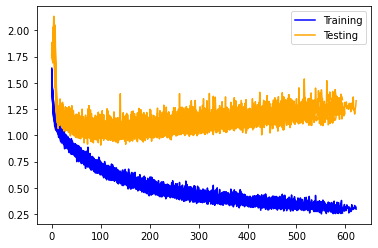

In [14]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

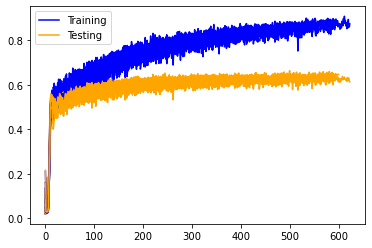

In [15]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

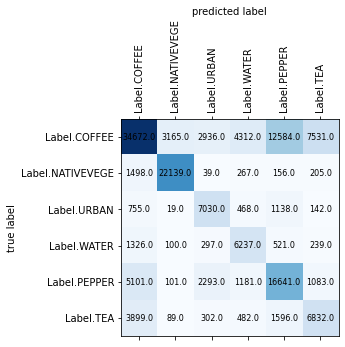

In [16]:
plot_confusion_matrix(conf_matrix, labels)

In [17]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.73378341 0.86436575 0.545088   0.48173322 0.50989705 0.4261477 ]
Mean precision:  0.5935025232614658

Recalls:  [0.53177914 0.91092001 0.73597152 0.71525229 0.63034091 0.51757576]
Mean recall:  0.6736399398006011

F-Score:  [0.6166597  0.88703247 0.62630852 0.57571422 0.56375771 0.46743295]
Mean f-score:  0.6228175955414257
